<center><h1>1-cd: Convolutional Neural Networks (ConvNets)</h1></center>

<center><h2><a href="https://rdfia.github.io/">Course link</a></h2></center>

# Warning :
# Do "File -> Save a copy in Drive" before you start modifying the notebook, otherwise your modifications will not be saved.


In [ ]:
#!git clone https://github.com/cdancette/deep-learning-polytech-tp6-7.git
! wget https://github.com/rdfia/rdfia.github.io/raw/master/code/2-cd/utils.py

--2024-10-26 17:51:01--  https://github.com/rdfia/rdfia.github.io/raw/master/code/2-cd/utils.py
Resolving github.com (github.com)... 140.82.112.3
Connecting to github.com (github.com)|140.82.112.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/rdfia/rdfia.github.io/master/code/2-cd/utils.py [following]
--2024-10-26 17:51:02--  https://raw.githubusercontent.com/rdfia/rdfia.github.io/master/code/2-cd/utils.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2627 (2.6K) [text/plain]
Saving to: ‘utils.py’

utils.py            100%[===================>]   2.57K  --.-KB/s    in 0s      

2024-10-26 17:51:02 (27.7 MB/s) - ‘utils.py’ saved [2627/2627]



In [ ]:
%run 'utils.py'

In [ ]:
import argparse
import os
import time

import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim
import torch.utils.data
import torchvision.transforms as transforms
import torchvision.datasets as datasets

import numpy as np

from utils import *

PRINT_INTERVAL = 200
PATH="datasets"

In [ ]:
class ConvNet(nn.Module):
    """
    This class defines the structure of the neural network
    """

    def __init__(self):
        super(ConvNet, self).__init__()

        # 卷积层和池化层
        # We first define the convolution and pooling layers as a features extractor
        self.features = nn.Sequential(
            nn.Conv2d(1, 6, (5, 5), stride=1, padding=2),
            nn.Tanh(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(6, 16, (5, 5), stride=1, padding=0),
            nn.Tanh(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
        )

        # 全连接层：作为分类器
        # We then define fully connected layers as a classifier
        self.classifier = nn.Sequential(
            nn.Linear(400, 120),
            nn.Tanh(),
            nn.Linear(120, 84),
            nn.Tanh(),
            nn.Linear(84, 10)
            # Reminder: The softmax is included in the loss, do not put it here
        )

    # Method called when we apply the network to an input batch
    def forward(self, input):
        bsize = input.size(0) # batch size
        output = self.features(input) # output of the conv layers
        output = output.view(bsize, -1) # we flatten the 2D feature maps into one 1D vector for each input
        output = self.classifier(output) # we compute the output of the fc layers
        return output



def get_dataset(batch_size, cuda=False):
    """
    This function loads the dataset and performs transformations on each
    image (listed in `transform = ...`).
    """
    train_dataset = datasets.MNIST(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.ToTensor()
        ]))
    val_dataset = datasets.MNIST(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.ToTensor()
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
                        batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
                        batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader



def epoch(data, model, criterion, optimizer=None, cuda=False):
    """
    Make a pass (called epoch in English) on the data `data` with the
     model `model`. Evaluates `criterion` as loss.
     If `optimizer` is given, perform a training epoch using
     the given optimizer, otherwise, perform an evaluation epoch (no backward)
     of the model.
    """

    # indicates whether the model is in eval or train mode (some layers behave differently in train and eval)
    model.eval() if optimizer is None else model.train()

    # objects to store metric averages
    avg_loss = AverageMeter()
    avg_top1_acc = AverageMeter()
    avg_top5_acc = AverageMeter()
    avg_batch_time = AverageMeter()
    global loss_plot

    # we iterate on the batches
    tic = time.time()
    for i, (input, target) in enumerate(data):

        if cuda: # only with GPU, and not with CPU
            input = input.cuda()
            target = target.cuda()

        # forward
        output = model(input)
        loss = criterion(output, target)

        # backward if we are training
        if optimizer:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # compute metrics
        prec1, prec5 = accuracy(output, target, topk=(1, 5))
        batch_time = time.time() - tic
        tic = time.time()

        # update
        avg_loss.update(loss.item())
        avg_top1_acc.update(prec1.item())
        avg_top5_acc.update(prec5.item())
        avg_batch_time.update(batch_time)
        if optimizer:
            loss_plot.update(avg_loss.val)
        # print info
        if i % PRINT_INTERVAL == 0:
            print('[{0:s} Batch {1:03d}/{2:03d}]\t'
                  'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s)\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Prec@1 {top1.val:5.1f} ({top1.avg:5.1f})\t'
                  'Prec@5 {top5.val:5.1f} ({top5.avg:5.1f})'.format(
                   "EVAL" if optimizer is None else "TRAIN", i, len(data), batch_time=avg_batch_time, loss=avg_loss,
                   top1=avg_top1_acc, top5=avg_top5_acc))
            if optimizer:
                loss_plot.plot()

    # Print summary
    print('\n===============> Total time {batch_time:d}s\t'
          'Avg loss {loss.avg:.4f}\t'
          'Avg Prec@1 {top1.avg:5.2f} %\t'
          'Avg Prec@5 {top5.avg:5.2f} %\n'.format(
           batch_time=int(avg_batch_time.sum), loss=avg_loss,
           top1=avg_top1_acc, top5=avg_top5_acc))

    return avg_top1_acc, avg_top5_acc, avg_loss


def main(batch_size=128, lr=0.1, epochs=5, cuda=False):

    # ex :
    #   {"batch_size": 128, "epochs": 5, "lr": 0.1}

    # define model, loss, optim
    model = ConvNet()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)

    if cuda: # only with GPU, and not with CPU
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # Get the data
    train, test = get_dataset(batch_size, cuda)

    # init plots
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # We iterate on the epochs
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")
        # Train phase
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        # Test phase
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)
        # plot
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)


Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 9.91M/9.91M [00:01<00:00, 5.13MB/s]


Extracting datasets/MNIST/raw/train-images-idx3-ubyte.gz to datasets/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 28.9k/28.9k [00:00<00:00, 135kB/s]


Extracting datasets/MNIST/raw/train-labels-idx1-ubyte.gz to datasets/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 1.65M/1.65M [00:01<00:00, 1.26MB/s]


Extracting datasets/MNIST/raw/t10k-images-idx3-ubyte.gz to datasets/MNIST/raw

Failed to download (trying next):
<urlopen error [SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: certificate has expired (_ssl.c:1007)>



100%|██████████| 4.54k/4.54k [00:00<00:00, 2.91MB/s]

Extracting datasets/MNIST/raw/t10k-labels-idx1-ubyte.gz to datasets/MNIST/raw

=== EPOCH 1 =====



[TRAIN Batch 000/469]	Time 0.364s (0.364s)	Loss 2.3103 (2.3103)	Prec@1  11.7 ( 11.7)	Prec@5  48.4 ( 48.4)


<Figure size 640x480 with 0 Axes>

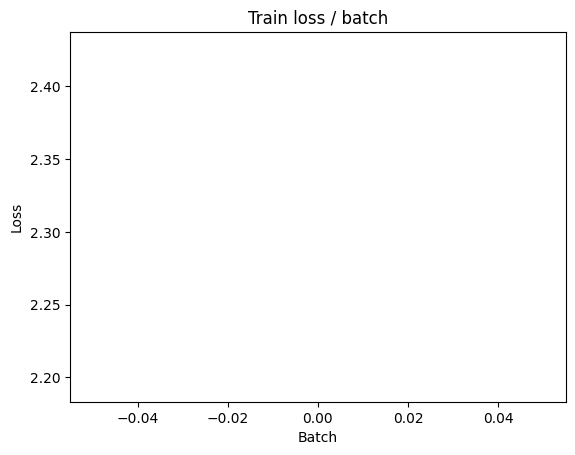

[TRAIN Batch 200/469]	Time 0.026s (0.029s)	Loss 0.3188 (1.1929)	Prec@1  91.4 ( 68.3)	Prec@5  99.2 ( 90.3)


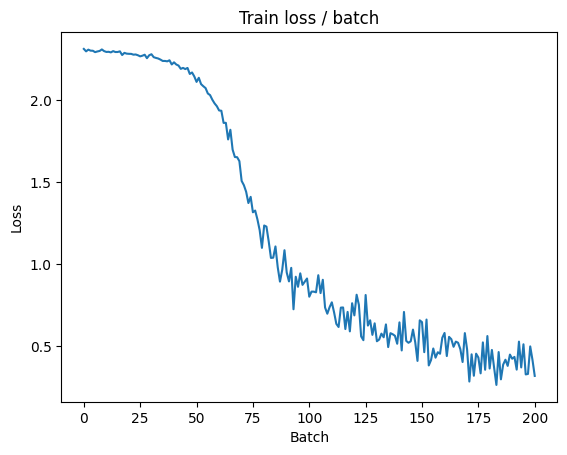

[TRAIN Batch 400/469]	Time 0.025s (0.031s)	Loss 0.2937 (0.7361)	Prec@1  92.2 ( 80.2)	Prec@5 100.0 ( 95.0)


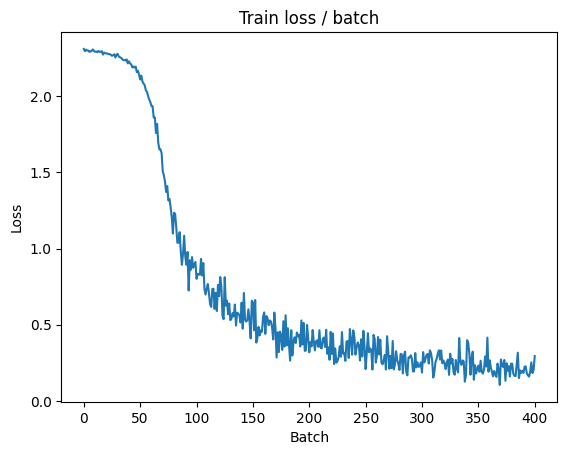


===============> Total time 14s	Avg loss 0.6553	Avg Prec@1 82.35 %	Avg Prec@5 95.67 %

[EVAL Batch 000/079]	Time 0.144s (0.144s)	Loss 0.0909 (0.0909)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)

===============> Total time 1s	Avg loss 0.1524	Avg Prec@1 95.46 %	Avg Prec@5 99.94 %



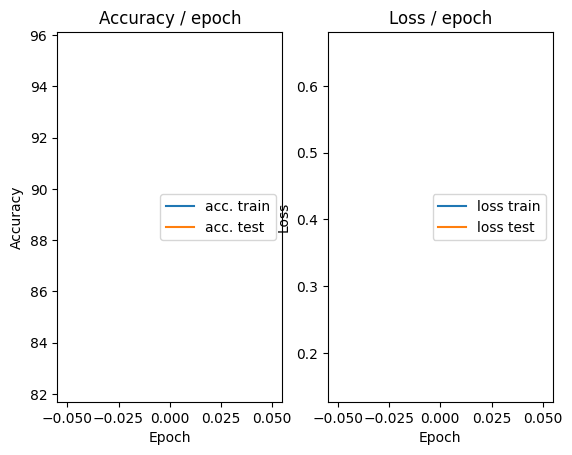

=== EPOCH 2 =====

[TRAIN Batch 000/469]	Time 0.172s (0.172s)	Loss 0.1750 (0.1750)	Prec@1  93.0 ( 93.0)	Prec@5 100.0 (100.0)


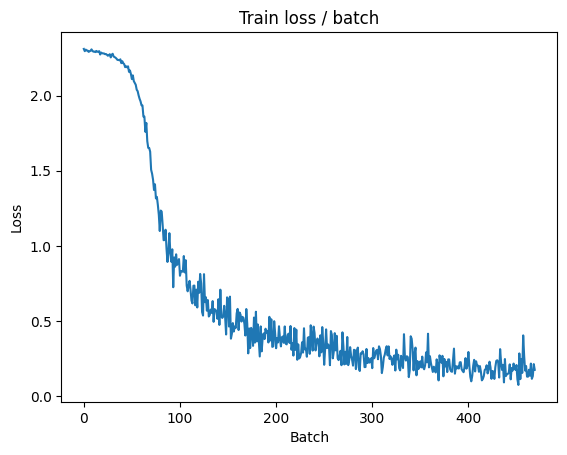

[TRAIN Batch 200/469]	Time 0.028s (0.034s)	Loss 0.1388 (0.1460)	Prec@1  93.8 ( 95.8)	Prec@5 100.0 ( 99.9)


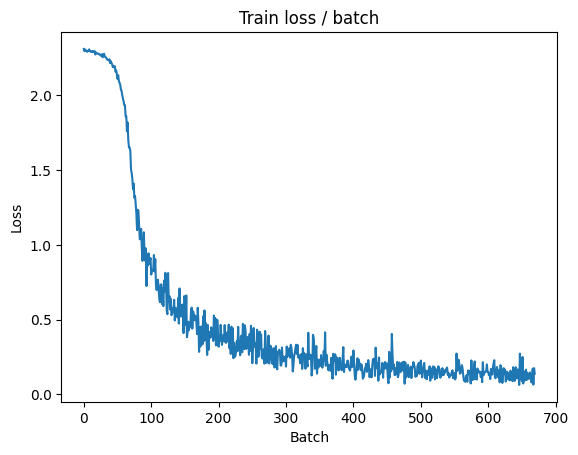

[TRAIN Batch 400/469]	Time 0.034s (0.031s)	Loss 0.0966 (0.1313)	Prec@1  96.1 ( 96.2)	Prec@5 100.0 ( 99.9)


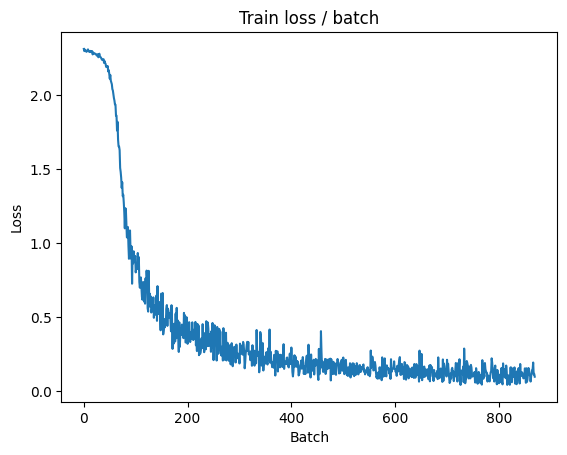


===============> Total time 14s	Avg loss 0.1266	Avg Prec@1 96.33 %	Avg Prec@5 99.89 %

[EVAL Batch 000/079]	Time 0.156s (0.156s)	Loss 0.0557 (0.0557)	Prec@1  97.7 ( 97.7)	Prec@5 100.0 (100.0)

===============> Total time 1s	Avg loss 0.1017	Avg Prec@1 96.70 %	Avg Prec@5 99.98 %



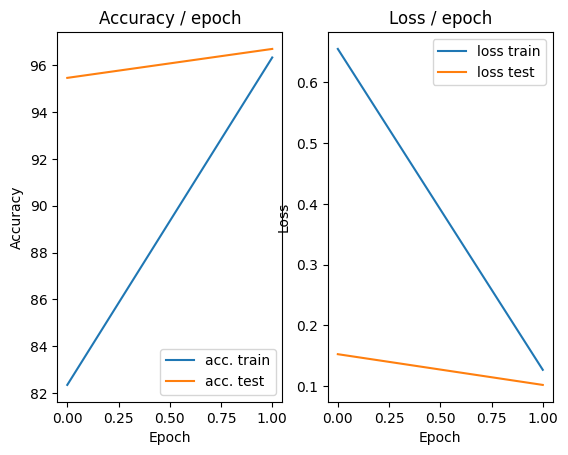

=== EPOCH 3 =====

[TRAIN Batch 000/469]	Time 0.197s (0.197s)	Loss 0.0776 (0.0776)	Prec@1  96.9 ( 96.9)	Prec@5 100.0 (100.0)


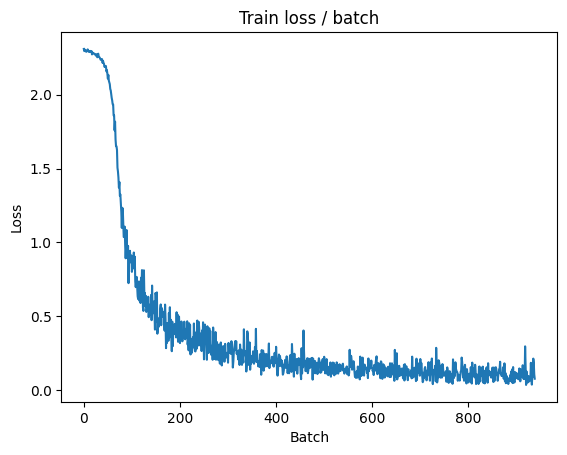

[TRAIN Batch 200/469]	Time 0.024s (0.034s)	Loss 0.0689 (0.0884)	Prec@1  97.7 ( 97.4)	Prec@5 100.0 ( 99.9)


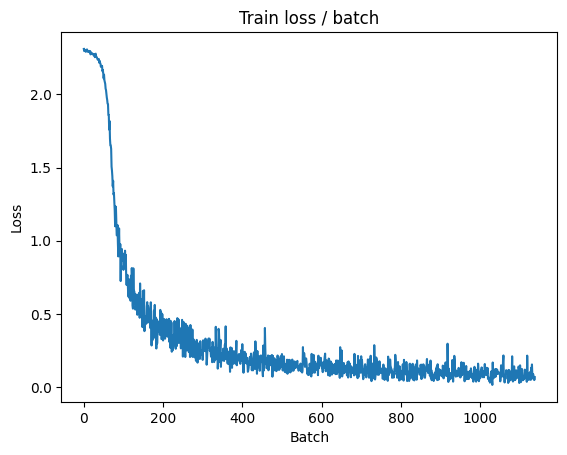

[TRAIN Batch 400/469]	Time 0.026s (0.031s)	Loss 0.1193 (0.0855)	Prec@1  96.1 ( 97.5)	Prec@5 100.0 ( 99.9)


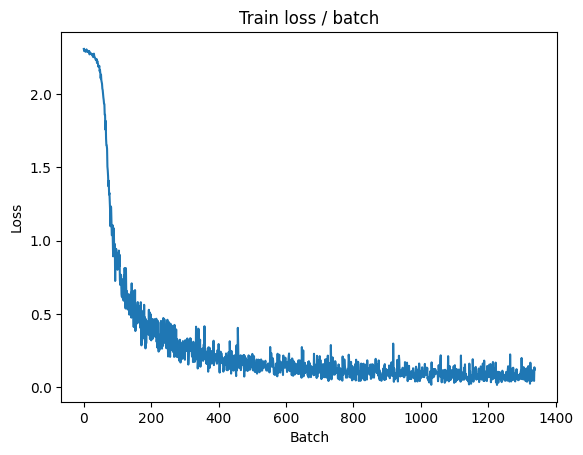


===============> Total time 14s	Avg loss 0.0844	Avg Prec@1 97.49 %	Avg Prec@5 99.95 %

[EVAL Batch 000/079]	Time 0.221s (0.221s)	Loss 0.0277 (0.0277)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)

===============> Total time 2s	Avg loss 0.0641	Avg Prec@1 98.05 %	Avg Prec@5 100.00 %



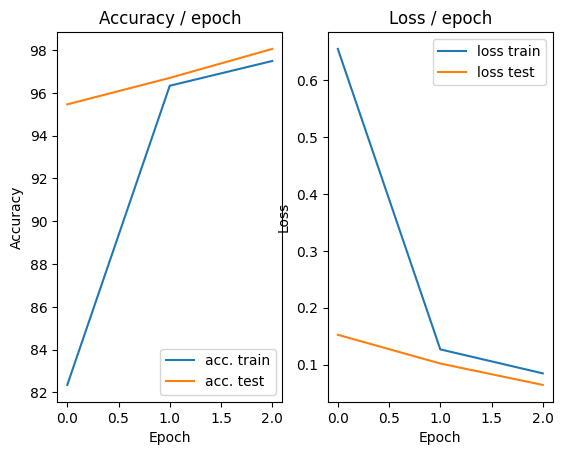

=== EPOCH 4 =====

[TRAIN Batch 000/469]	Time 0.190s (0.190s)	Loss 0.1387 (0.1387)	Prec@1  96.1 ( 96.1)	Prec@5  99.2 ( 99.2)


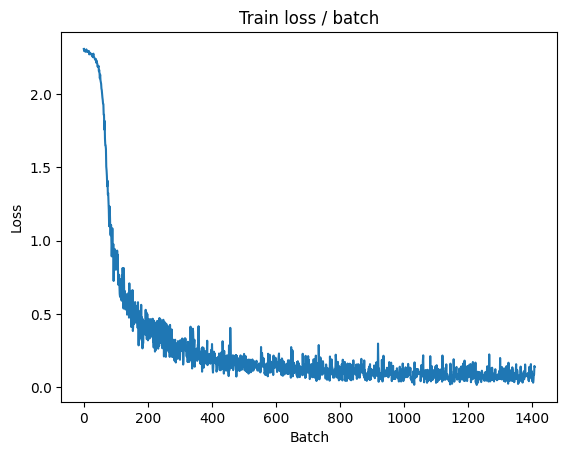

[TRAIN Batch 200/469]	Time 0.026s (0.028s)	Loss 0.0547 (0.0688)	Prec@1  99.2 ( 98.0)	Prec@5 100.0 (100.0)


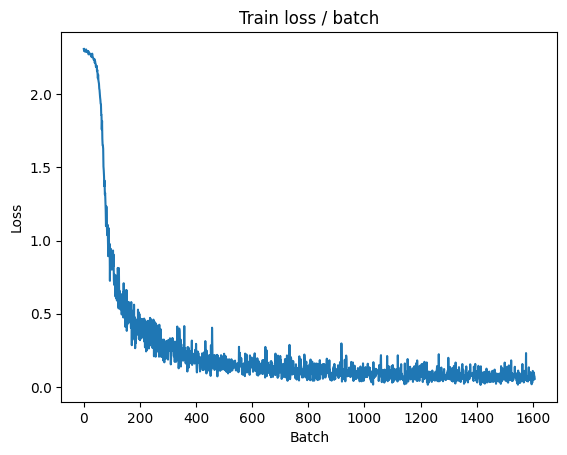

[TRAIN Batch 400/469]	Time 0.057s (0.031s)	Loss 0.0727 (0.0675)	Prec@1  96.9 ( 98.0)	Prec@5 100.0 (100.0)


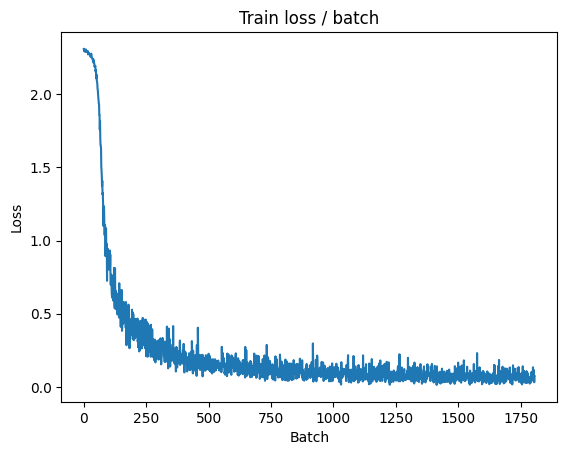


===============> Total time 14s	Avg loss 0.0661	Avg Prec@1 98.05 %	Avg Prec@5 99.96 %

[EVAL Batch 000/079]	Time 0.168s (0.168s)	Loss 0.0278 (0.0278)	Prec@1 100.0 (100.0)	Prec@5 100.0 (100.0)

===============> Total time 1s	Avg loss 0.0542	Avg Prec@1 98.32 %	Avg Prec@5 100.00 %



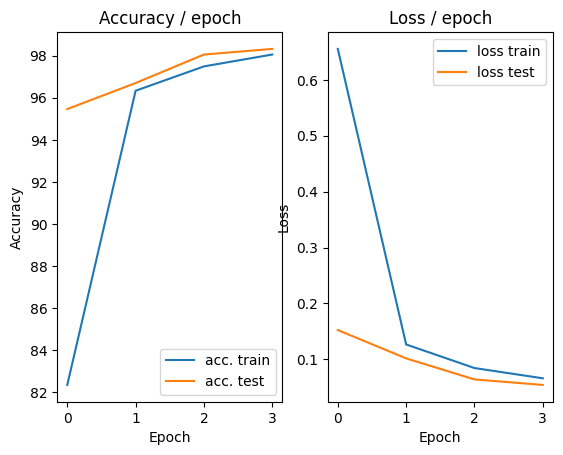

=== EPOCH 5 =====

[TRAIN Batch 000/469]	Time 0.192s (0.192s)	Loss 0.0365 (0.0365)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)


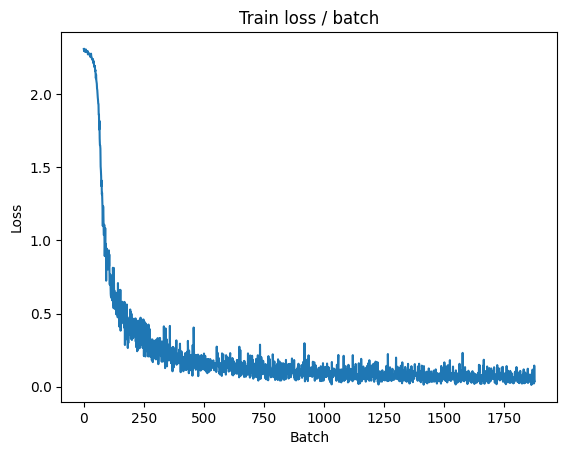

[TRAIN Batch 200/469]	Time 0.026s (0.028s)	Loss 0.0707 (0.0563)	Prec@1  97.7 ( 98.3)	Prec@5 100.0 (100.0)


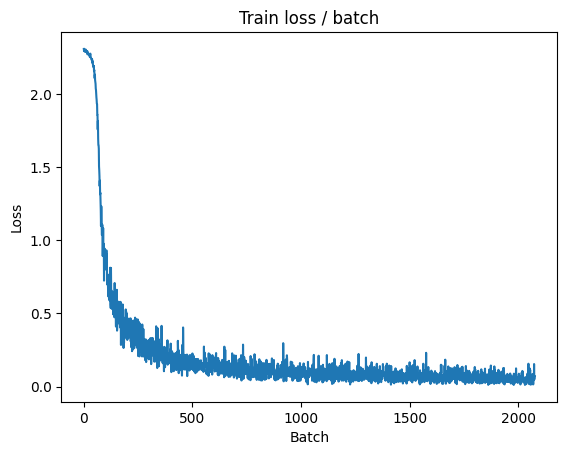

[TRAIN Batch 400/469]	Time 0.027s (0.031s)	Loss 0.0431 (0.0546)	Prec@1  99.2 ( 98.4)	Prec@5 100.0 (100.0)


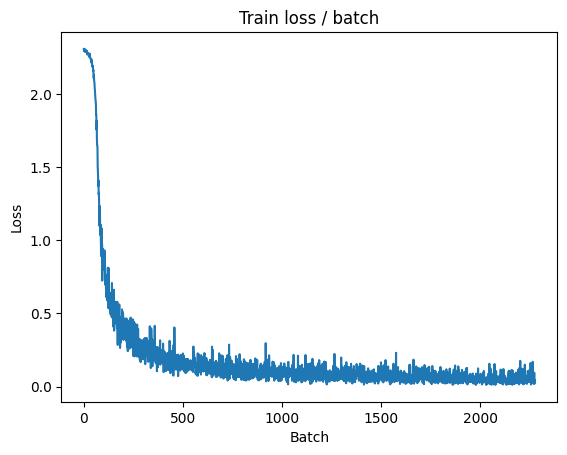


===============> Total time 14s	Avg loss 0.0545	Avg Prec@1 98.36 %	Avg Prec@5 99.97 %

[EVAL Batch 000/079]	Time 0.153s (0.153s)	Loss 0.0304 (0.0304)	Prec@1  99.2 ( 99.2)	Prec@5 100.0 (100.0)

===============> Total time 1s	Avg loss 0.0469	Avg Prec@1 98.52 %	Avg Prec@5 99.98 %



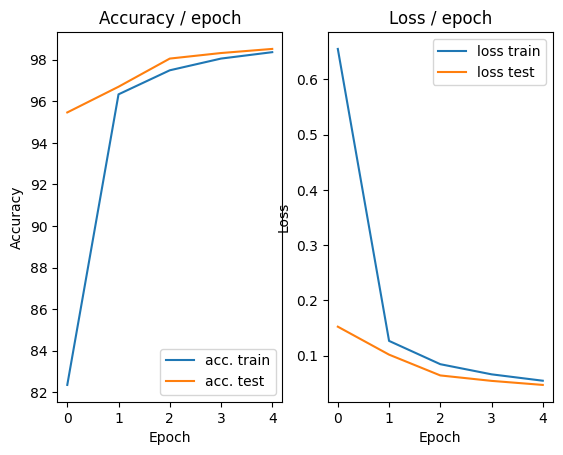

In [ ]:
main(128, 0.1, cuda=False)

## AlexNet - like architexture

In [ ]:
# 定义 AlexNet_like 类
class AlexNet_like(nn.Module):

    def __init__(self):
        super(AlexNet_like, self).__init__()

        # 定义卷积层和池化层
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(32, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(64, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
        )

        # 定义全连接层：作为分类器
        self.classifier = nn.Sequential(
            nn.Linear(64*4*4, 1000),     # 输入取决于图片大小，经过池化层压缩
            nn.ReLU(),
            nn.Linear(1000, 10),
        )

    # 定义前向传播
    def forward(self, input):
        bsize = input.size(0)
        output = self.features(input)
        output = output.view(bsize, -1)
        output = self.classifier(output)

        return output


In [ ]:
# 定义数据集函数
def get_dataset_2(batch_size, cuda=False):

    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.ToTensor()
        ]))
    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.ToTensor()
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
               batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
               batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader

In [ ]:
train, test = get_dataset_2(128, cuda=True)

print(train.dataset.data.shape)
print(test.dataset.data.shape)

Files already downloaded and verified
Files already downloaded and verified
(50000, 32, 32, 3)
(10000, 32, 32, 3)


In [ ]:
# epoch函数 沿用 之前定义的

In [ ]:
# 定义 main()
def main_2(batch_size=128, lr=0.01, epochs=5, cuda=False):

    # 定义模型、损失函数和优化器
    model = AlexNet_like()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)

    if cuda:
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # 获取数据集
    train, test = get_dataset_2(batch_size, cuda)

    # 初始化绘图
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # 迭代
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")

        # 训练
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)

        # 测试
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)

        # 绘图
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)

Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 0.205s (0.205s)	Loss 2.3037 (2.3037)	Prec@1  10.9 ( 10.9)	Prec@5  46.9 ( 46.9)


<Figure size 640x480 with 0 Axes>

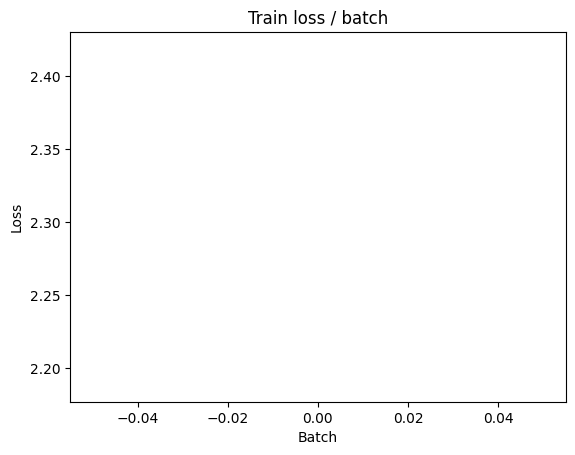

[TRAIN Batch 200/391]	Time 0.013s (0.026s)	Loss 2.1933 (2.2240)	Prec@1  16.4 ( 16.9)	Prec@5  68.0 ( 63.1)


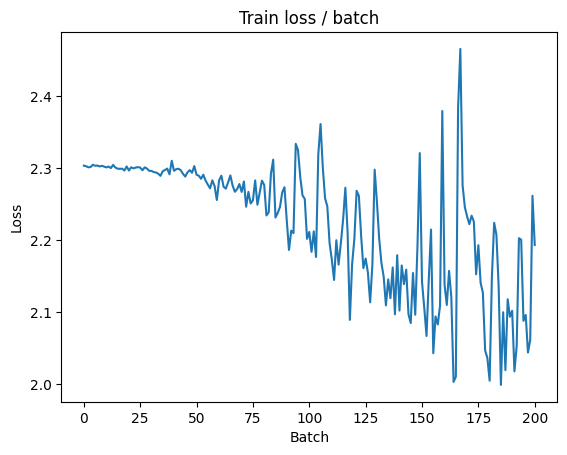


===============> Total time 9s	Avg loss 2.0941	Avg Prec@1 23.02 %	Avg Prec@5 71.47 %

[EVAL Batch 000/079]	Time 0.119s (0.119s)	Loss 1.7524 (1.7524)	Prec@1  42.2 ( 42.2)	Prec@5  87.5 ( 87.5)

===============> Total time 1s	Avg loss 1.7500	Avg Prec@1 37.80 %	Avg Prec@5 87.34 %



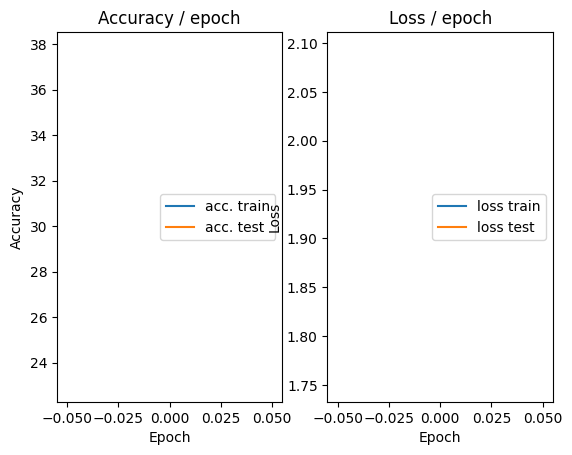

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.135s (0.135s)	Loss 1.8556 (1.8556)	Prec@1  28.1 ( 28.1)	Prec@5  84.4 ( 84.4)


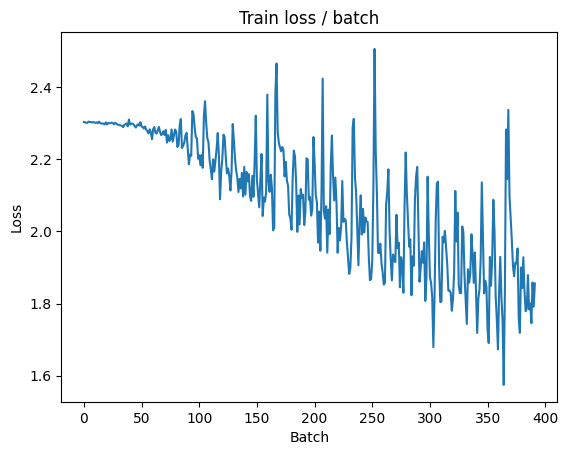

[TRAIN Batch 200/391]	Time 0.020s (0.027s)	Loss 1.4354 (1.7268)	Prec@1  49.2 ( 37.7)	Prec@5  95.3 ( 87.1)


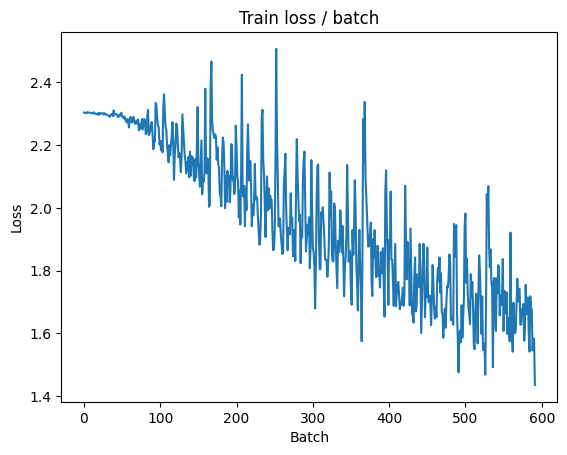


===============> Total time 9s	Avg loss 1.6453	Avg Prec@1 40.71 %	Avg Prec@5 88.81 %

[EVAL Batch 000/079]	Time 0.110s (0.110s)	Loss 1.4361 (1.4361)	Prec@1  50.0 ( 50.0)	Prec@5  93.0 ( 93.0)

===============> Total time 1s	Avg loss 1.4846	Avg Prec@1 46.80 %	Avg Prec@5 92.25 %



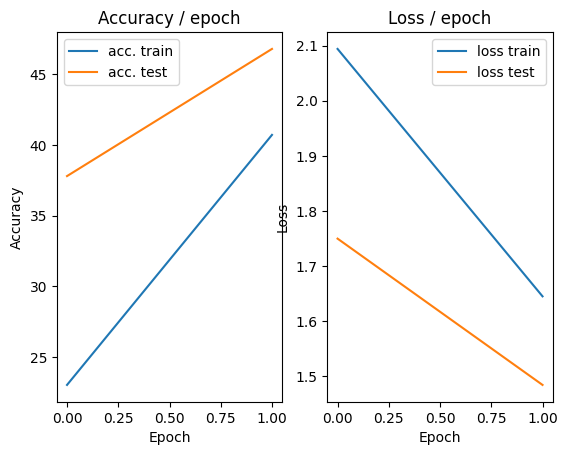

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.139s (0.139s)	Loss 1.3382 (1.3382)	Prec@1  55.5 ( 55.5)	Prec@5  96.1 ( 96.1)


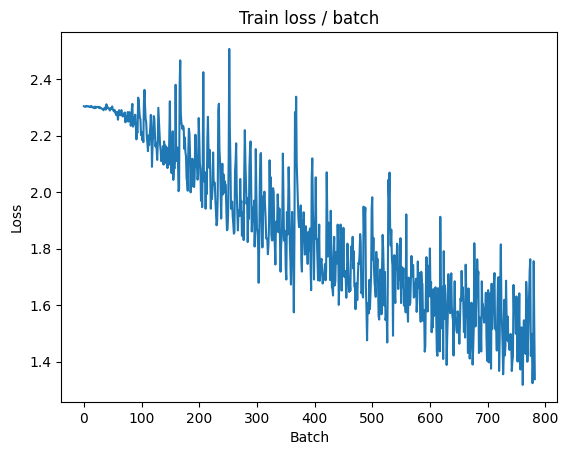

[TRAIN Batch 200/391]	Time 0.057s (0.025s)	Loss 1.4105 (1.4421)	Prec@1  51.6 ( 48.4)	Prec@5  93.0 ( 92.4)


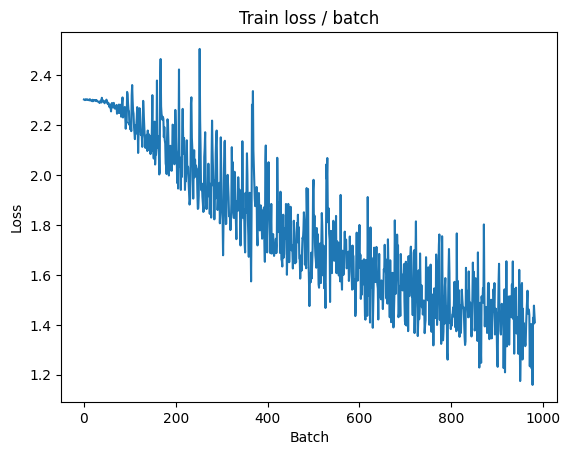


===============> Total time 9s	Avg loss 1.3970	Avg Prec@1 49.98 %	Avg Prec@5 92.89 %

[EVAL Batch 000/079]	Time 0.116s (0.116s)	Loss 1.3729 (1.3729)	Prec@1  46.9 ( 46.9)	Prec@5  94.5 ( 94.5)

===============> Total time 1s	Avg loss 1.4042	Avg Prec@1 48.48 %	Avg Prec@5 93.32 %



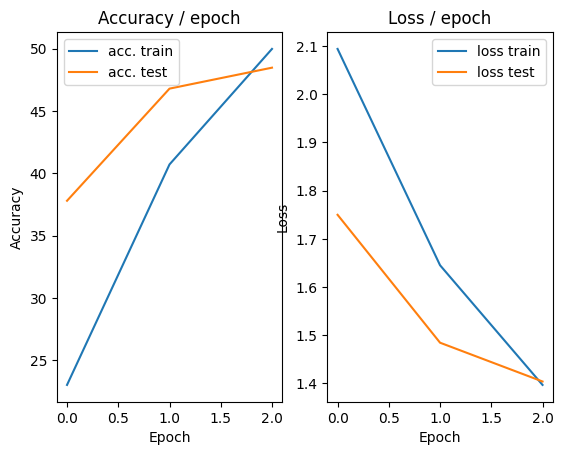

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.140s (0.140s)	Loss 1.3943 (1.3943)	Prec@1  50.0 ( 50.0)	Prec@5  93.8 ( 93.8)


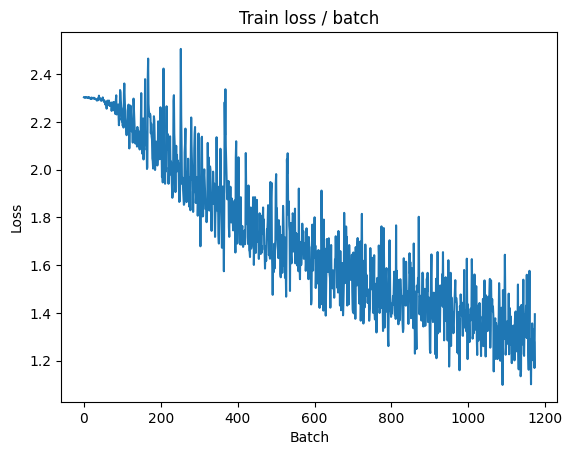

[TRAIN Batch 200/391]	Time 0.021s (0.023s)	Loss 1.2543 (1.2659)	Prec@1  58.6 ( 54.9)	Prec@5  96.1 ( 94.7)


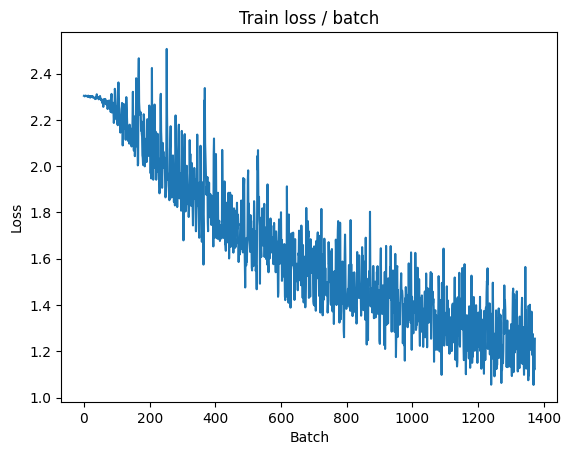


===============> Total time 9s	Avg loss 1.2368	Avg Prec@1 56.07 %	Avg Prec@5 94.81 %

[EVAL Batch 000/079]	Time 0.126s (0.126s)	Loss 1.0848 (1.0848)	Prec@1  58.6 ( 58.6)	Prec@5  96.9 ( 96.9)

===============> Total time 1s	Avg loss 1.2173	Avg Prec@1 55.28 %	Avg Prec@5 95.35 %



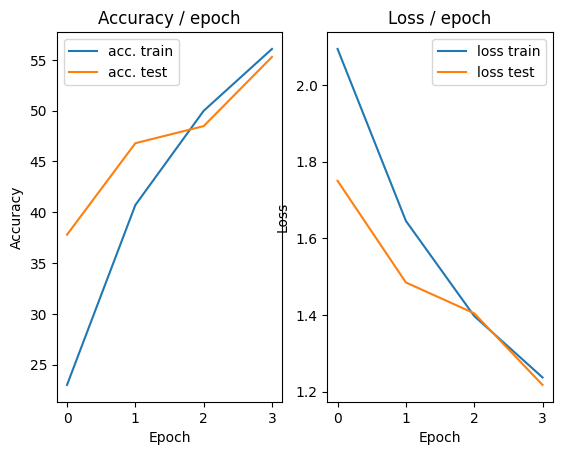

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.166s (0.166s)	Loss 0.9911 (0.9911)	Prec@1  67.2 ( 67.2)	Prec@5  98.4 ( 98.4)


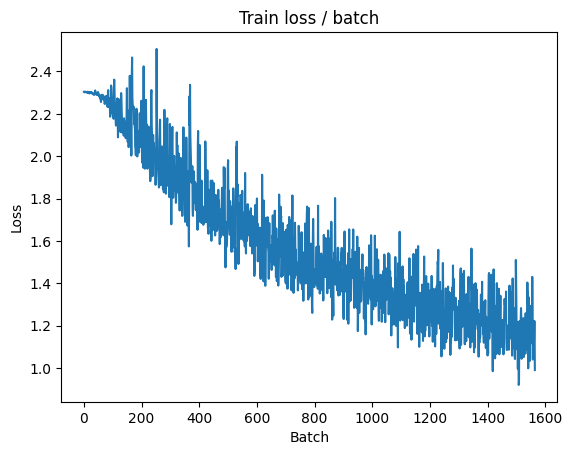

[TRAIN Batch 200/391]	Time 0.034s (0.022s)	Loss 1.1323 (1.1225)	Prec@1  62.5 ( 60.2)	Prec@5  95.3 ( 95.9)


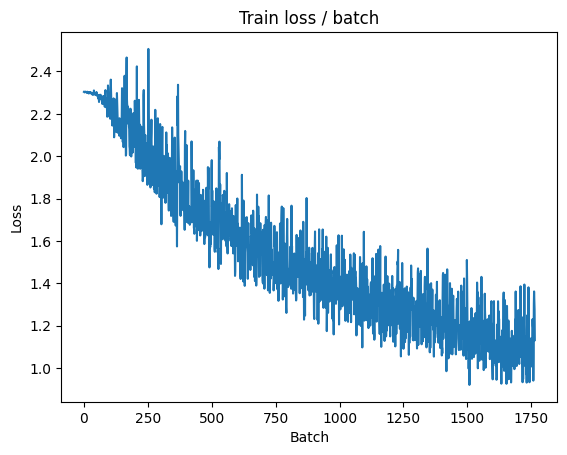


===============> Total time 9s	Avg loss 1.1016	Avg Prec@1 60.99 %	Avg Prec@5 96.05 %

[EVAL Batch 000/079]	Time 0.125s (0.125s)	Loss 0.9447 (0.9447)	Prec@1  62.5 ( 62.5)	Prec@5  96.9 ( 96.9)

===============> Total time 1s	Avg loss 1.0872	Avg Prec@1 61.57 %	Avg Prec@5 96.35 %



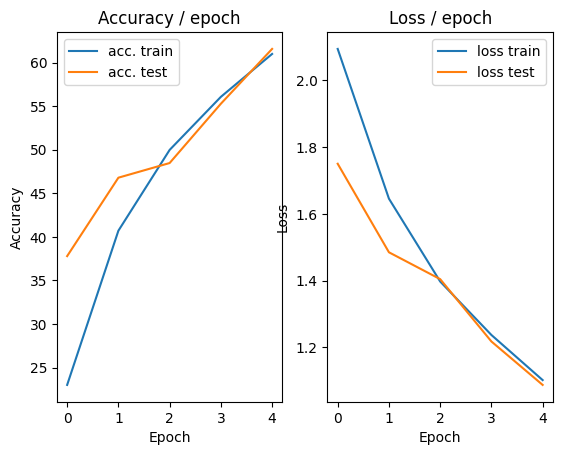

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.147s (0.147s)	Loss 1.0130 (1.0130)	Prec@1  66.4 ( 66.4)	Prec@5  96.1 ( 96.1)


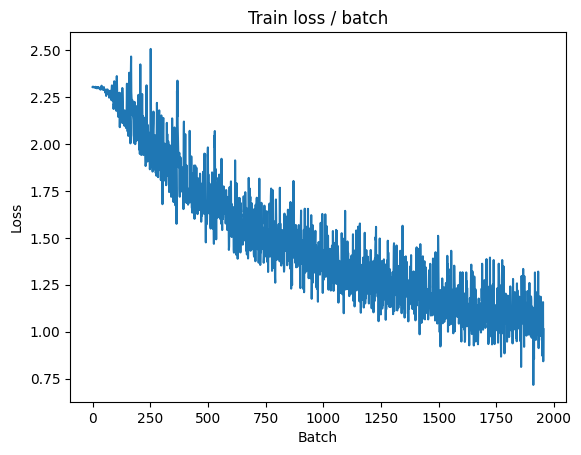

[TRAIN Batch 200/391]	Time 0.031s (0.022s)	Loss 1.0836 (0.9924)	Prec@1  60.9 ( 65.0)	Prec@5  97.7 ( 96.9)


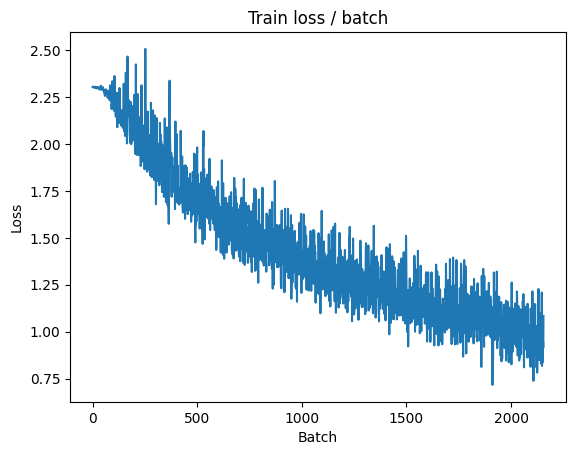


===============> Total time 9s	Avg loss 0.9821	Avg Prec@1 65.55 %	Avg Prec@5 96.90 %

[EVAL Batch 000/079]	Time 0.250s (0.250s)	Loss 1.1891 (1.1891)	Prec@1  60.2 ( 60.2)	Prec@5  91.4 ( 91.4)

===============> Total time 2s	Avg loss 1.2428	Avg Prec@1 57.12 %	Avg Prec@5 93.45 %



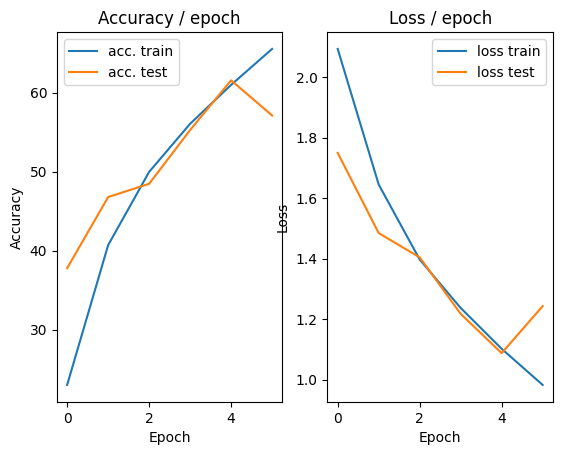

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.166s (0.166s)	Loss 1.0601 (1.0601)	Prec@1  61.7 ( 61.7)	Prec@5  96.9 ( 96.9)


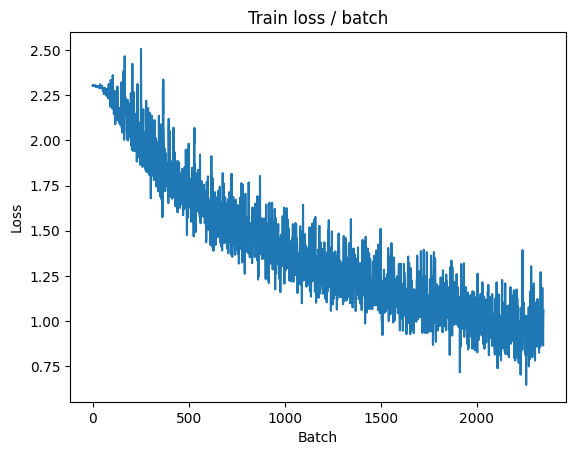

[TRAIN Batch 200/391]	Time 0.028s (0.022s)	Loss 0.9160 (0.8868)	Prec@1  66.4 ( 69.0)	Prec@5  98.4 ( 97.5)


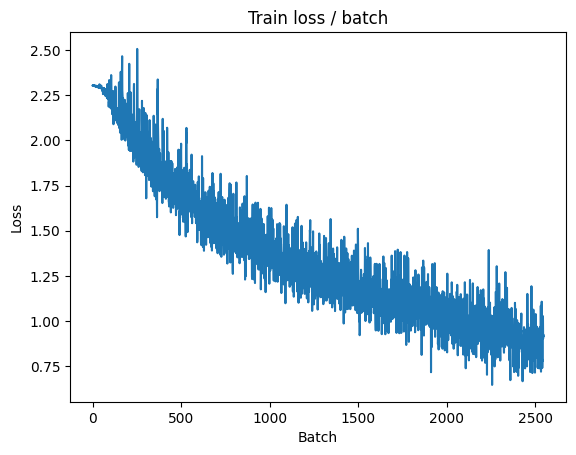


===============> Total time 8s	Avg loss 0.8723	Avg Prec@1 69.56 %	Avg Prec@5 97.62 %

[EVAL Batch 000/079]	Time 0.144s (0.144s)	Loss 0.9991 (0.9991)	Prec@1  64.1 ( 64.1)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 1.0632	Avg Prec@1 63.80 %	Avg Prec@5 96.68 %



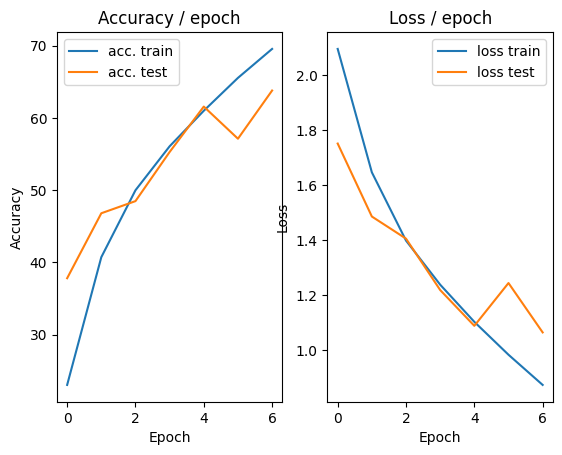

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.208s (0.208s)	Loss 0.8983 (0.8983)	Prec@1  68.0 ( 68.0)	Prec@5  99.2 ( 99.2)


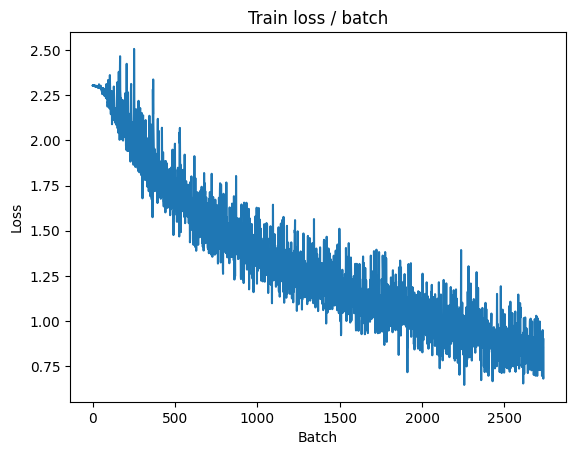

[TRAIN Batch 200/391]	Time 0.010s (0.023s)	Loss 0.9411 (0.7816)	Prec@1  63.3 ( 72.7)	Prec@5  98.4 ( 98.1)


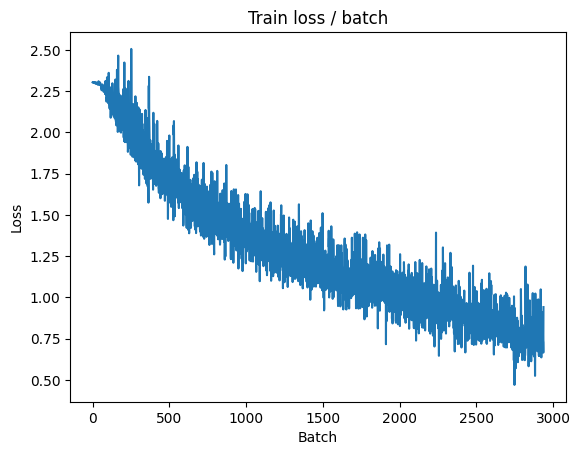


===============> Total time 8s	Avg loss 0.7752	Avg Prec@1 72.88 %	Avg Prec@5 98.25 %

[EVAL Batch 000/079]	Time 0.124s (0.124s)	Loss 0.8765 (0.8765)	Prec@1  71.1 ( 71.1)	Prec@5  98.4 ( 98.4)


KeyboardInterrupt: 

In [ ]:
# 运行
main_2(128, 0.1, epochs=30, cuda=True)

# Partie 3

## 3.1 Standardization of examples

In [ ]:
# 3.1 Standardization of examples
# 定义正则化数据集函数
def get_dataset_3(batch_size, cuda=False):

    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.491,0.482,0.447], std=[0.202,0.199,0.201])
        ]))
    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.491,0.482,0.447], std=[0.202,0.199,0.201])
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
               batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
               batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader

In [ ]:
# 定义 main_3()
def main_3(batch_size=128, lr=0.01, epochs=5, cuda=False):

    # 定义模型、损失函数和优化器
    model = AlexNet_like()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)

    if cuda:
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # 获取数据集
    train, test = get_dataset_3(batch_size, cuda)

    # 初始化绘图
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # 迭代
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")

        # 训练
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)

        # 测试
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)

        # 绘图
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)

In [ ]:
main_3(128, 0.1, epochs=60, cuda=True)

## 3.1 (Bonus) ZCA Normalization （运行时间长）

In [ ]:
# 计算训练数据的ZCA白化矩阵
def compute_zca_matrix(dataset, epsilon=1e-5):
    # 提取数据并展平成2D数组 (num_samples, H * W * C)
    data = np.array([np.array(img) for img, _ in dataset])
    data = data.reshape(data.shape[0], -1)  # shape: (num_samples, H * W * C)

    # 中心化数据
    mean = np.mean(data, axis=0)
    data_centered = data - mean

    # 计算协方差矩阵
    sigma = np.cov(data_centered, rowvar=False)

    # 进行奇异值分解 (SVD)
    U, S, _ = np.linalg.svd(sigma)

    # 计算ZCA白化矩阵
    ZCA_matrix = U @ np.diag(1.0 / np.sqrt(S + epsilon)) @ U.T
    return ZCA_matrix, mean

In [ ]:
# 定义应用ZCA白化的自定义转换
class ZCATransform:
    def __init__(self, zca_matrix, mean):
        self.zca_matrix = zca_matrix
        self.mean = mean

    def __call__(self, img):
        # 将图像转换为numpy数组并展平
        img = np.array(img).astype(np.float32).flatten()
        img -= self.mean  # 减去均值
        img_zca = self.zca_matrix @ img  # 应用ZCA变换
        img_zca = img_zca.reshape(32, 32, 3)  # 重塑为图像形状
        return torch.from_numpy(img_zca).permute(2, 0, 1)  # 转换为tensor格式 (C, H, W)


In [ ]:
# 定义加载数据集的函数并应用ZCA白化
def get_dataset_3_ZCA(batch_size, cuda=False):
    # 获取训练数据集并计算ZCA矩阵
    temp_train_dataset = datasets.CIFAR10(PATH, train=True, download=True)
    zca_matrix, mean = compute_zca_matrix(temp_train_dataset)

    # 创建应用ZCA白化的transform
    zca_transform = transforms.Compose([
        transforms.ToTensor(),
        ZCATransform(zca_matrix, mean)
    ])

    # 创建训练和验证数据集
    train_dataset = datasets.CIFAR10(PATH, train=True, download=True, transform=zca_transform)
    val_dataset = datasets.CIFAR10(PATH, train=False, download=True, transform=zca_transform)

    # 创建DataLoader
    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader

In [ ]:
# 定义 main_3_ZCA()
def main_3_ZCA(batch_size=128, lr=0.01, epochs=5, cuda=False):

    # 定义模型、损失函数和优化器
    model = AlexNet_like()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)

    if cuda:
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # 获取数据集
    train, test = get_dataset_3_ZCA(batch_size, cuda)

    # 初始化绘图
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # 迭代
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")

        # 训练
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)

        # 测试
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)

        # 绘图
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)

In [ ]:
main_3_ZCA(128, 0.1, epochs=60, cuda=True)

## 3.2 Increase in the number of training examples by data increase

In [ ]:
# 更改 AlexNet_like 类
class AlexNet_like_3_2(nn.Module):

    def __init__(self):
        super(AlexNet_like_3_2, self).__init__()

        # 定义卷积层和池化层
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(32, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(64, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0, ceil_mode=True),
        )

        # 定义全连接层：作为分类器
        self.classifier = nn.Sequential(
            nn.Linear(64*4*4, 1000),     # 输入取决于图片大小，经过池化层压缩
            nn.ReLU(),
            nn.Linear(1000, 10),
        )

    # 定义前向传播
    def forward(self, input):
        bsize = input.size(0)
        output = self.features(input)
        output = output.view(bsize, -1)
        output = self.classifier(output)

        return output


In [ ]:
# 定义正则化数据集函数
def get_dataset_4(batch_size, cuda=False):

    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.RandomCrop((28,28)),
            transforms.Pad(2),
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.491,0.482,0.447], std=[0.202,0.199,0.201])
        ]))
    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.CenterCrop((28,28)),
            transforms.Pad(2),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.491,0.482,0.447], std=[0.202,0.199,0.201])
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
               batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
               batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader

In [ ]:
# 定义 main_4()
def main_4(batch_size=128, lr=0.01, epochs=5, cuda=False):

    # 定义模型、损失函数和优化器
    model = AlexNet_like_3_2()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)

    if cuda:
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # 获取数据集
    train, test = get_dataset_4(batch_size, cuda)

    # 初始化绘图
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # 迭代
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")

        # 训练
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)

        # 测试
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)

        # 绘图
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)

In [ ]:
main_4(128, 0.1, epochs=60, cuda=True)

## 3.2 (Bonus) Increase in the number of training examples by data increase

In [ ]:
# 定义正则化数据集函数
def get_dataset_4_Other_Method(batch_size, cuda=False):

    train_dataset = datasets.CIFAR10(PATH, train=True, download=True,
        transform=transforms.Compose([
            transforms.RandomCrop((28,28)),
            transforms.Pad(2),
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.RandomVerticalFlip(p=0.5),
            transforms.RandomRotation(degrees=30),
            transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
            transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.9, 1.1)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.491,0.482,0.447], std=[0.202,0.199,0.201])
        ]))
    val_dataset = datasets.CIFAR10(PATH, train=False, download=True,
        transform=transforms.Compose([
            transforms.CenterCrop((28,28)),
            transforms.Pad(2),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.491,0.482,0.447], std=[0.202,0.199,0.201])
        ]))

    train_loader = torch.utils.data.DataLoader(train_dataset,
               batch_size=batch_size, shuffle=True, pin_memory=cuda, num_workers=2)
    val_loader = torch.utils.data.DataLoader(val_dataset,
               batch_size=batch_size, shuffle=False, pin_memory=cuda, num_workers=2)

    return train_loader, val_loader

In [ ]:
# 定义 main_4()
def main_4_Other_Method(batch_size=128, lr=0.01, epochs=5, cuda=False):

    # 定义模型、损失函数和优化器
    model = AlexNet_like_3_2()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)

    if cuda:
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # 获取数据集
    train, test = get_dataset_4_Other_Method(batch_size, cuda)

    # 初始化绘图
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # 迭代
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")

        # 训练
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)

        # 测试
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)

        # 绘图
        if (i+1)%10 == 0:
            plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)

In [ ]:
main_4_Other_Method(128, 0.1, epochs=60, cuda=True)

# 3.3 Variants on the optimization algorithm

In [ ]:
import torch.optim.lr_scheduler

# 定义 main_5()
def main_5(batch_size=128, lr=0.01, epochs=5, cuda=False):

    # 定义模型、损失函数和优化器初始参数
    model = AlexNet_like_3_2()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)
    lr_sched = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.95)

    if cuda:
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # 获取数据集
    train, test = get_dataset_4(batch_size, cuda)

    # 初始化绘图
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # 迭代
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")

        # 训练
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        lr_sched.step()

        # 测试
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)

        # 绘图
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)

In [ ]:
main_5(128, 0.1, epochs=60, cuda=True)

## 3.3 (Bonus) Variants on the optimization algorithm

In [ ]:
# 定义 main_5_Adam_RoP()
def main_5_Adam_RoP(batch_size=128, lr=0.01, epochs=5, cuda=False):

    # 定义模型、损失函数和优化器初始参数
    model = AlexNet_like_3_2()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr)
    lr_sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5)

    if cuda:
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # 获取数据集
    train, test = get_dataset_4(batch_size, cuda)

    # 初始化绘图
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # 迭代
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")

        # 训练
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        lr_sched.step()

        # 测试
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)

        # 绘图
        if (i+1)%10 == 0:
            plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)

In [ ]:
main_5_Adam_RoP(128, 0.1, epochs=60, cuda=True)

# 3.4 Regularization of the network by dropout

In [ ]:
# 更改 AlexNet_like 类
class AlexNet_like_3_4(nn.Module):

    def __init__(self):
        super(AlexNet_like_3_4, self).__init__()

        # 定义卷积层和池化层
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(32, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(64, 64, (5, 5), stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0, ceil_mode=True),
        )

        # 定义全连接层：作为分类器
        self.classifier = nn.Sequential(
            nn.Linear(64*4*4, 1000),     # 输入取决于图片大小，经过池化层压缩
            nn.ReLU(),
            nn.Dropout(p=0.5),
            nn.Linear(1000, 10),
        )

    # 定义前向传播
    def forward(self, input):
        bsize = input.size(0)
        output = self.features(input)
        output = output.view(bsize, -1)
        output = self.classifier(output)

        return output


In [ ]:
# 定义 main_6()
def main_6(batch_size=128, lr=0.01, epochs=5, cuda=False):

    # 定义模型、损失函数和优化器初始参数
    model = AlexNet_like_3_4()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)
    lr_sched = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.95)

    if cuda:
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # 获取数据集
    train, test = get_dataset_4(batch_size, cuda)

    # 初始化绘图
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # 迭代
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")

        # 训练
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        lr_sched.step()

        # 测试
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)

        # 绘图
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)

100%|██████████| 170M/170M [00:04<00:00, 38.0MB/s]


Extracting datasets/cifar-10-python.tar.gz to datasets
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 2.158s (2.158s)	Loss 2.3023 (2.3023)	Prec@1  15.6 ( 15.6)	Prec@5  52.3 ( 52.3)


<Figure size 640x480 with 0 Axes>

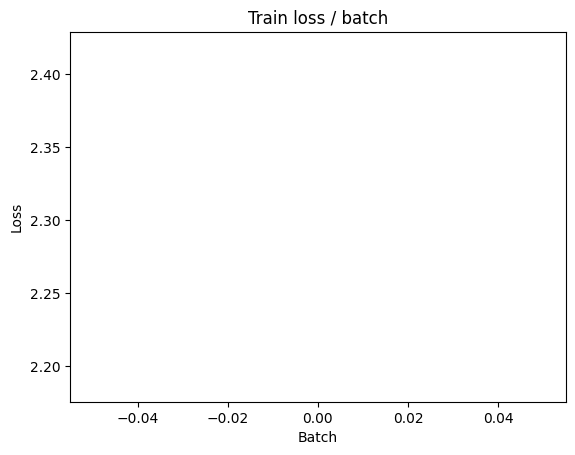

[TRAIN Batch 200/391]	Time 0.026s (0.064s)	Loss 1.8829 (2.0584)	Prec@1  29.7 ( 24.6)	Prec@5  80.5 ( 74.4)


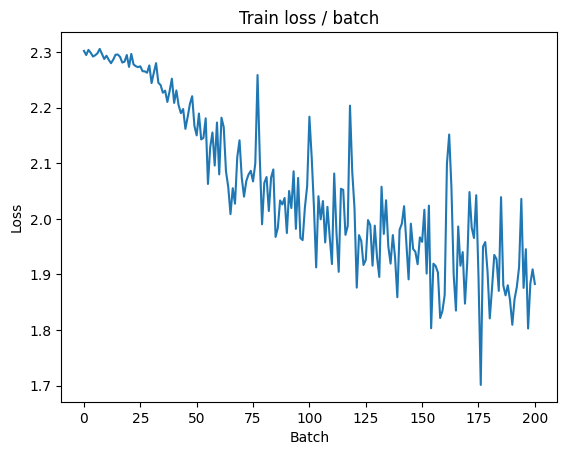


===============> Total time 23s	Avg loss 1.9121	Avg Prec@1 30.17 %	Avg Prec@5 80.37 %

[EVAL Batch 000/079]	Time 0.142s (0.142s)	Loss 1.5487 (1.5487)	Prec@1  49.2 ( 49.2)	Prec@5  89.8 ( 89.8)

===============> Total time 2s	Avg loss 1.5727	Avg Prec@1 42.58 %	Avg Prec@5 90.85 %



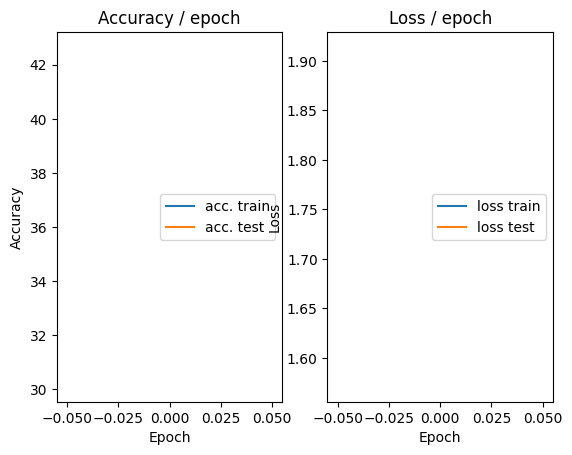

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.177s (0.177s)	Loss 1.6123 (1.6123)	Prec@1  43.8 ( 43.8)	Prec@5  89.8 ( 89.8)


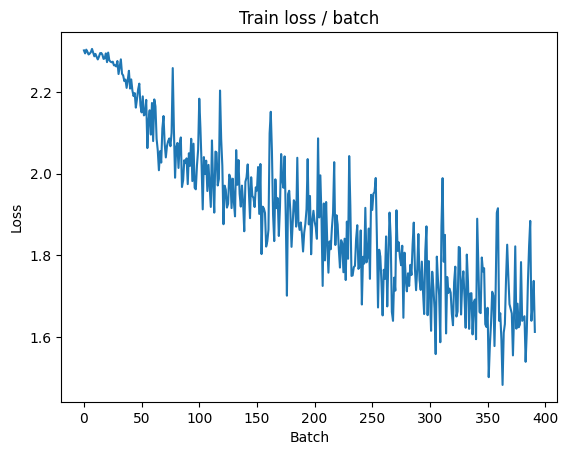

[TRAIN Batch 200/391]	Time 0.086s (0.052s)	Loss 1.4111 (1.5795)	Prec@1  47.7 ( 42.0)	Prec@5  93.0 ( 90.5)


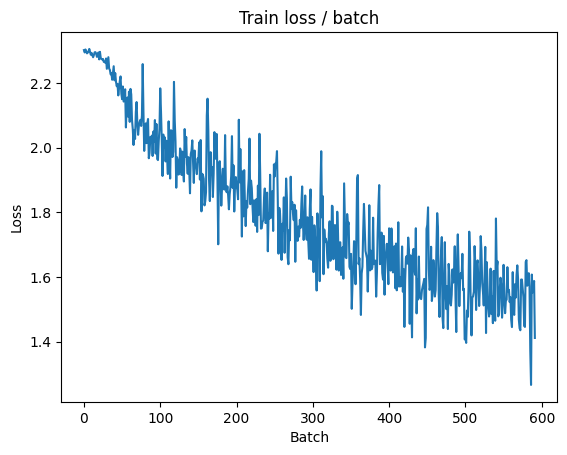


===============> Total time 20s	Avg loss 1.5429	Avg Prec@1 43.43 %	Avg Prec@5 91.16 %

[EVAL Batch 000/079]	Time 0.135s (0.135s)	Loss 1.3399 (1.3399)	Prec@1  53.9 ( 53.9)	Prec@5  91.4 ( 91.4)

===============> Total time 2s	Avg loss 1.4156	Avg Prec@1 48.47 %	Avg Prec@5 92.60 %



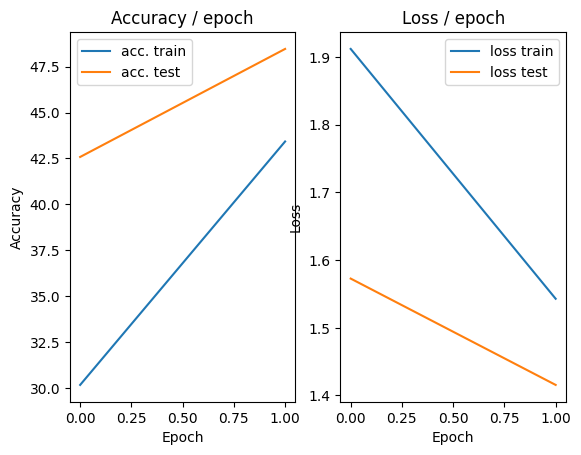

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.170s (0.170s)	Loss 1.4880 (1.4880)	Prec@1  44.5 ( 44.5)	Prec@5  94.5 ( 94.5)


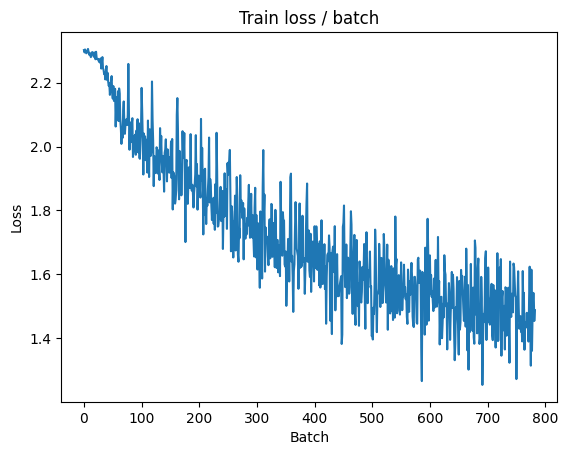

[TRAIN Batch 200/391]	Time 0.014s (0.053s)	Loss 1.4563 (1.4296)	Prec@1  53.1 ( 48.0)	Prec@5  91.4 ( 92.9)


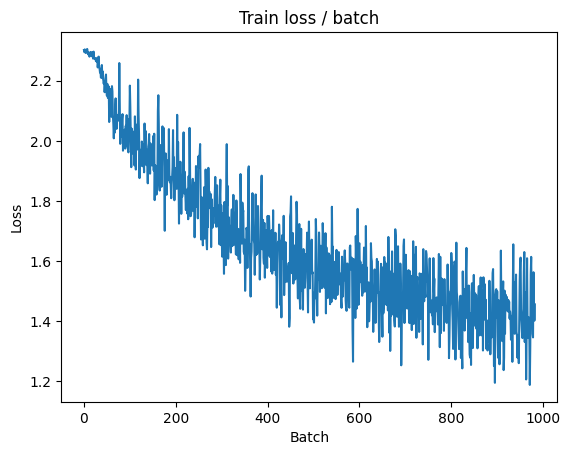


===============> Total time 19s	Avg loss 1.4022	Avg Prec@1 49.01 %	Avg Prec@5 93.05 %

[EVAL Batch 000/079]	Time 0.255s (0.255s)	Loss 1.2463 (1.2463)	Prec@1  59.4 ( 59.4)	Prec@5  95.3 ( 95.3)

===============> Total time 3s	Avg loss 1.3027	Avg Prec@1 53.58 %	Avg Prec@5 94.53 %



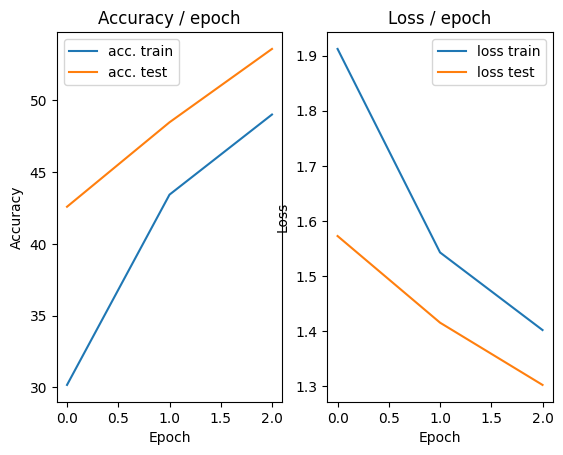

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.180s (0.180s)	Loss 1.3854 (1.3854)	Prec@1  48.4 ( 48.4)	Prec@5  92.2 ( 92.2)


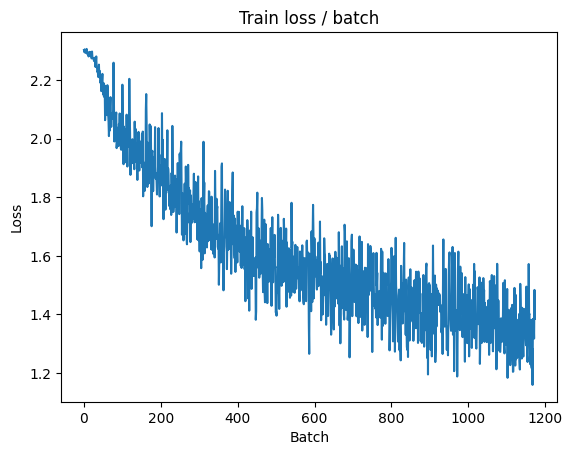

[TRAIN Batch 200/391]	Time 0.151s (0.053s)	Loss 1.4218 (1.3124)	Prec@1  46.1 ( 52.5)	Prec@5  92.2 ( 94.0)


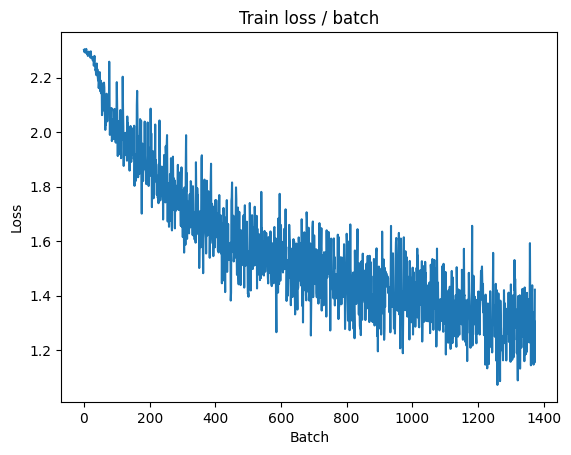


===============> Total time 19s	Avg loss 1.2876	Avg Prec@1 53.45 %	Avg Prec@5 94.23 %

[EVAL Batch 000/079]	Time 0.136s (0.136s)	Loss 1.1171 (1.1171)	Prec@1  64.1 ( 64.1)	Prec@5  93.8 ( 93.8)

===============> Total time 3s	Avg loss 1.2548	Avg Prec@1 54.91 %	Avg Prec@5 95.19 %



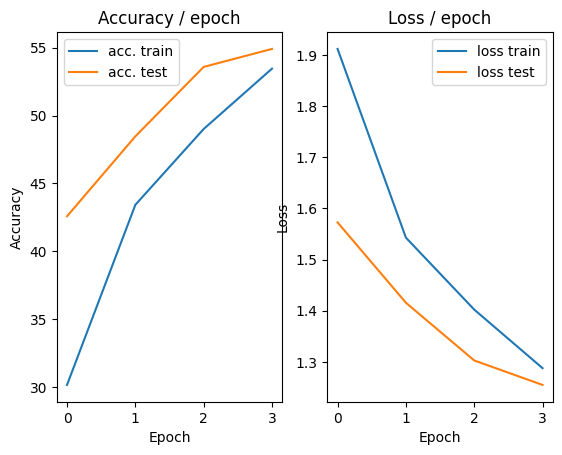

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.241s (0.241s)	Loss 1.4717 (1.4717)	Prec@1  50.0 ( 50.0)	Prec@5  89.8 ( 89.8)


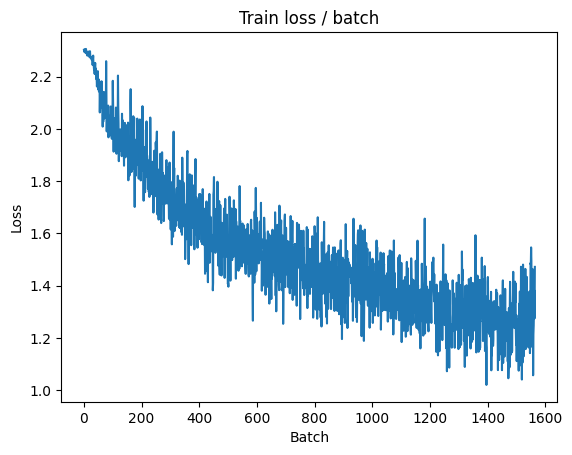

[TRAIN Batch 200/391]	Time 0.015s (0.048s)	Loss 1.1756 (1.2066)	Prec@1  58.6 ( 56.7)	Prec@5  96.9 ( 95.1)


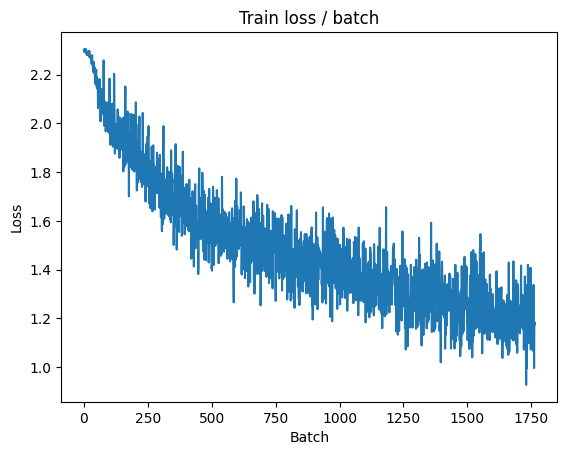


===============> Total time 19s	Avg loss 1.1914	Avg Prec@1 57.22 %	Avg Prec@5 95.30 %

[EVAL Batch 000/079]	Time 0.148s (0.148s)	Loss 1.0046 (1.0046)	Prec@1  65.6 ( 65.6)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 1.1148	Avg Prec@1 60.21 %	Avg Prec@5 96.35 %



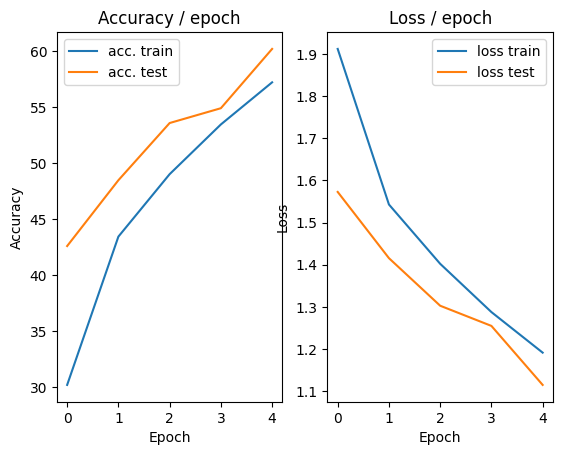

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.183s (0.183s)	Loss 1.0640 (1.0640)	Prec@1  65.6 ( 65.6)	Prec@5  98.4 ( 98.4)


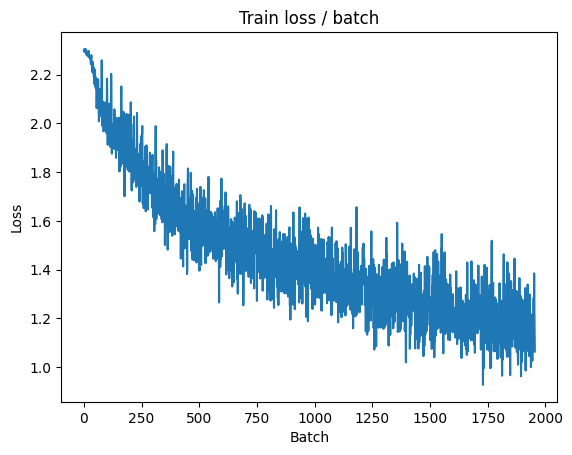

[TRAIN Batch 200/391]	Time 0.081s (0.053s)	Loss 1.0156 (1.1216)	Prec@1  64.1 ( 60.2)	Prec@5  96.9 ( 95.8)


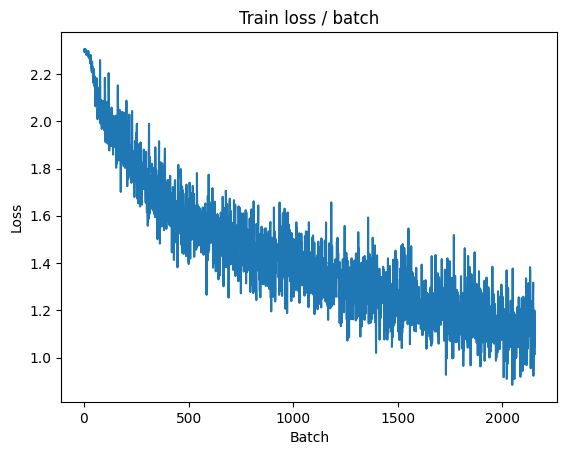


===============> Total time 20s	Avg loss 1.1159	Avg Prec@1 60.13 %	Avg Prec@5 95.87 %

[EVAL Batch 000/079]	Time 0.150s (0.150s)	Loss 0.9760 (0.9760)	Prec@1  64.1 ( 64.1)	Prec@5  96.1 ( 96.1)

===============> Total time 2s	Avg loss 1.0594	Avg Prec@1 61.51 %	Avg Prec@5 96.88 %



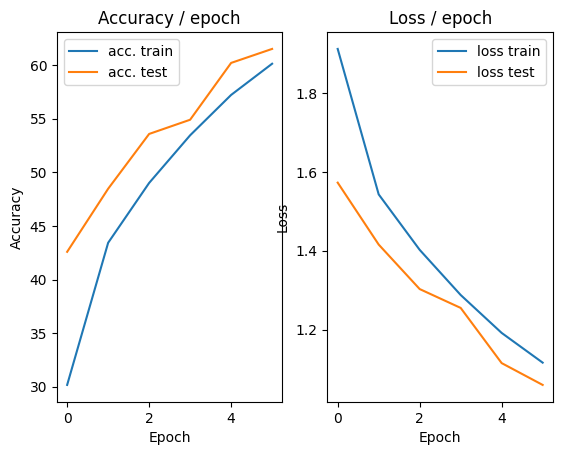

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.188s (0.188s)	Loss 0.9999 (0.9999)	Prec@1  63.3 ( 63.3)	Prec@5  95.3 ( 95.3)


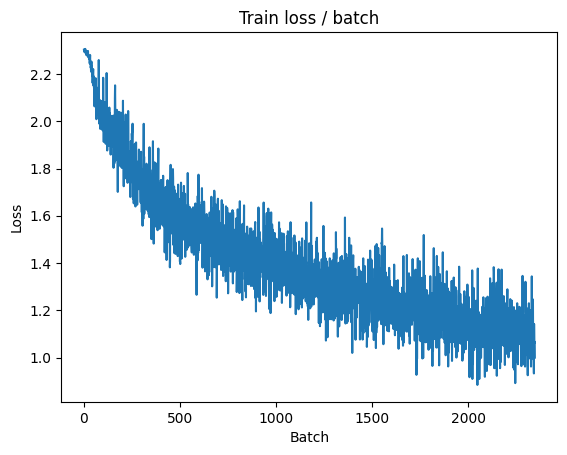

[TRAIN Batch 200/391]	Time 0.091s (0.054s)	Loss 1.0234 (1.0579)	Prec@1  61.7 ( 62.3)	Prec@5  97.7 ( 96.3)


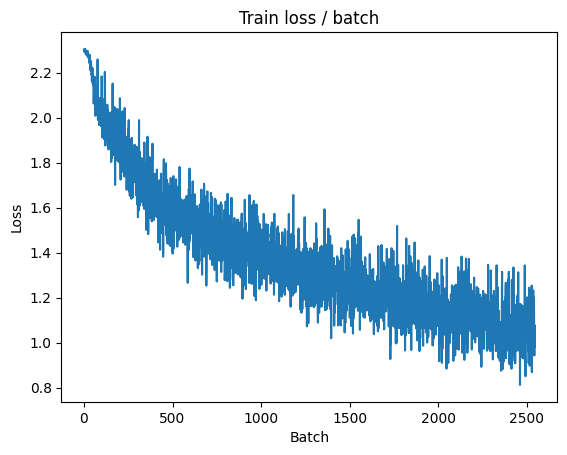


===============> Total time 20s	Avg loss 1.0505	Avg Prec@1 62.67 %	Avg Prec@5 96.33 %

[EVAL Batch 000/079]	Time 0.147s (0.147s)	Loss 0.9040 (0.9040)	Prec@1  69.5 ( 69.5)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.9680	Avg Prec@1 65.49 %	Avg Prec@5 97.10 %



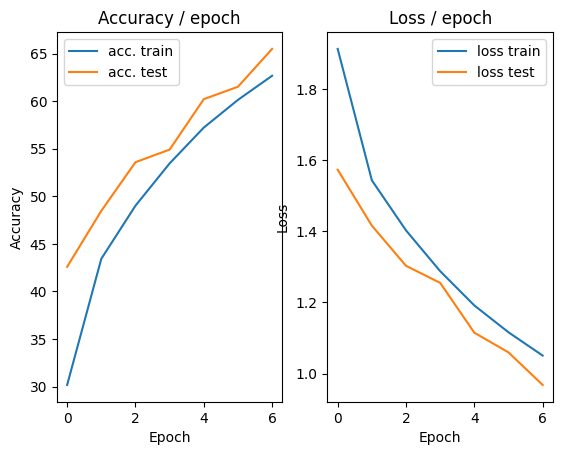

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.207s (0.207s)	Loss 1.0721 (1.0721)	Prec@1  63.3 ( 63.3)	Prec@5  97.7 ( 97.7)


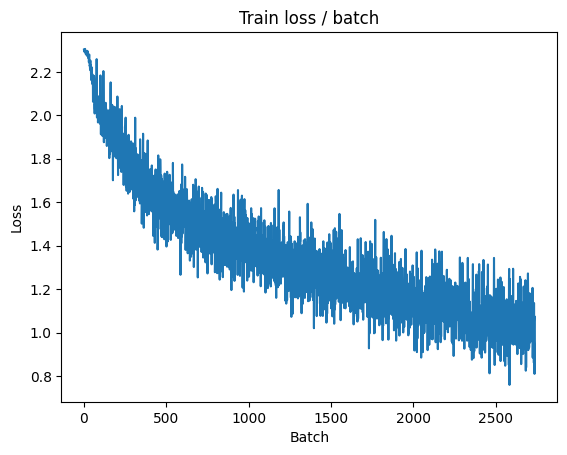

[TRAIN Batch 200/391]	Time 0.068s (0.054s)	Loss 1.0181 (0.9996)	Prec@1  57.8 ( 64.7)	Prec@5  97.7 ( 96.7)


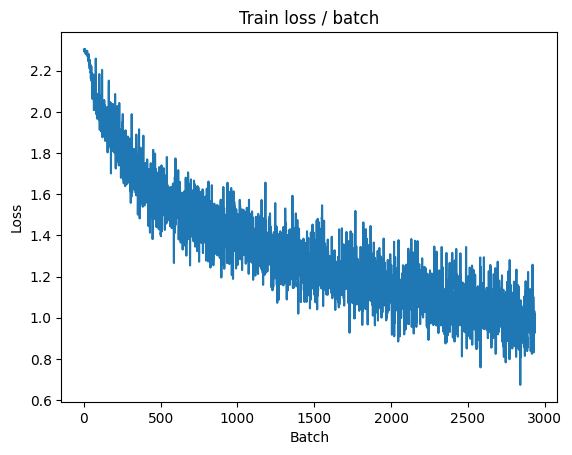


===============> Total time 20s	Avg loss 0.9949	Avg Prec@1 64.75 %	Avg Prec@5 96.75 %

[EVAL Batch 000/079]	Time 0.160s (0.160s)	Loss 0.8384 (0.8384)	Prec@1  74.2 ( 74.2)	Prec@5  95.3 ( 95.3)

===============> Total time 2s	Avg loss 0.9149	Avg Prec@1 67.58 %	Avg Prec@5 97.29 %



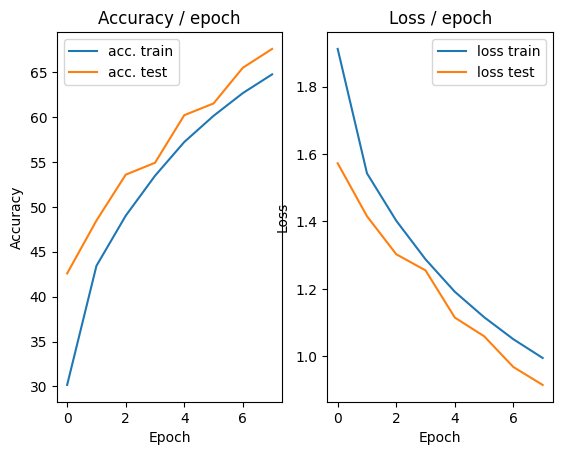

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.203s (0.203s)	Loss 1.1258 (1.1258)	Prec@1  63.3 ( 63.3)	Prec@5  95.3 ( 95.3)


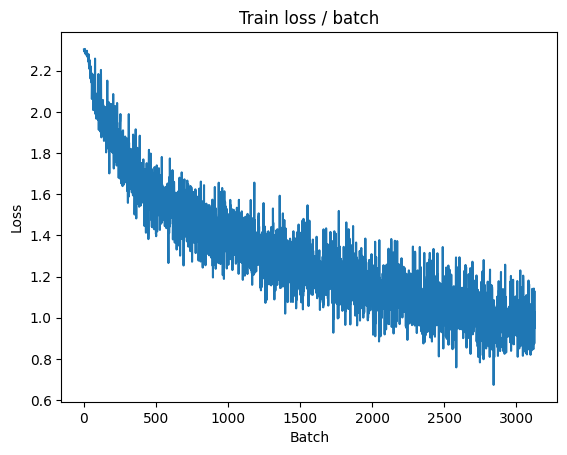

[TRAIN Batch 200/391]	Time 0.086s (0.054s)	Loss 0.9310 (0.9606)	Prec@1  69.5 ( 66.1)	Prec@5  95.3 ( 97.1)


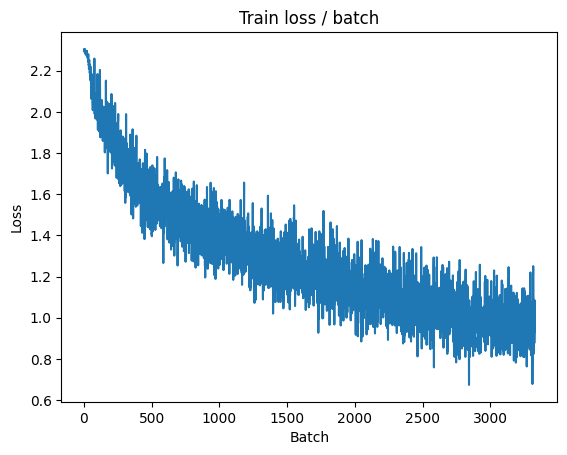


===============> Total time 20s	Avg loss 0.9467	Avg Prec@1 66.40 %	Avg Prec@5 97.23 %

[EVAL Batch 000/079]	Time 0.252s (0.252s)	Loss 0.7586 (0.7586)	Prec@1  75.8 ( 75.8)	Prec@5  97.7 ( 97.7)

===============> Total time 3s	Avg loss 0.8827	Avg Prec@1 68.63 %	Avg Prec@5 97.78 %



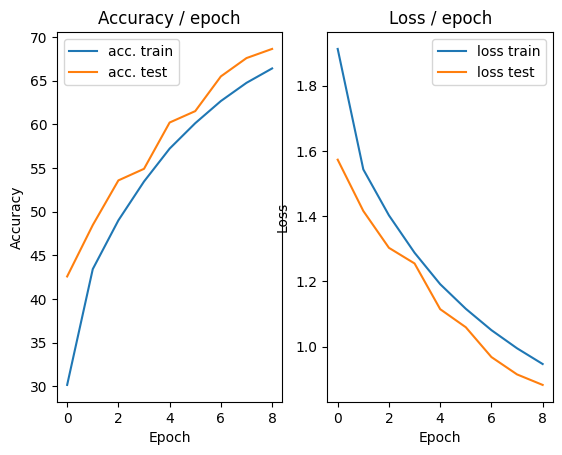

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.184s (0.184s)	Loss 0.9215 (0.9215)	Prec@1  64.1 ( 64.1)	Prec@5  97.7 ( 97.7)


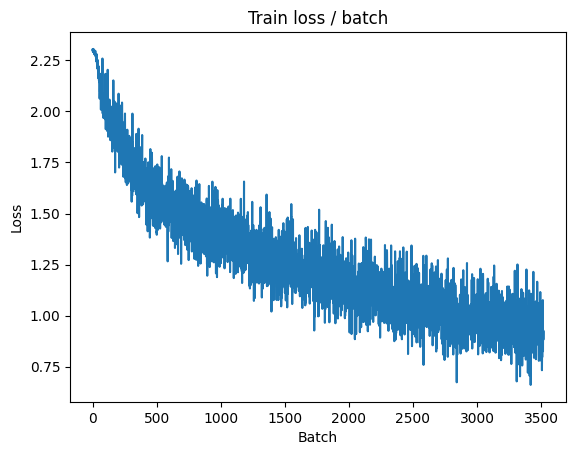

[TRAIN Batch 200/391]	Time 0.020s (0.053s)	Loss 0.9180 (0.9128)	Prec@1  61.7 ( 67.9)	Prec@5  97.7 ( 97.3)


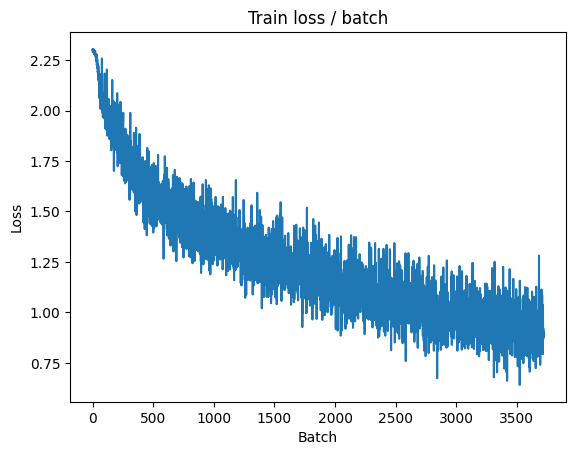


===============> Total time 19s	Avg loss 0.9064	Avg Prec@1 68.08 %	Avg Prec@5 97.34 %

[EVAL Batch 000/079]	Time 0.158s (0.158s)	Loss 0.7554 (0.7554)	Prec@1  75.8 ( 75.8)	Prec@5  96.9 ( 96.9)

===============> Total time 3s	Avg loss 0.8321	Avg Prec@1 70.59 %	Avg Prec@5 97.94 %



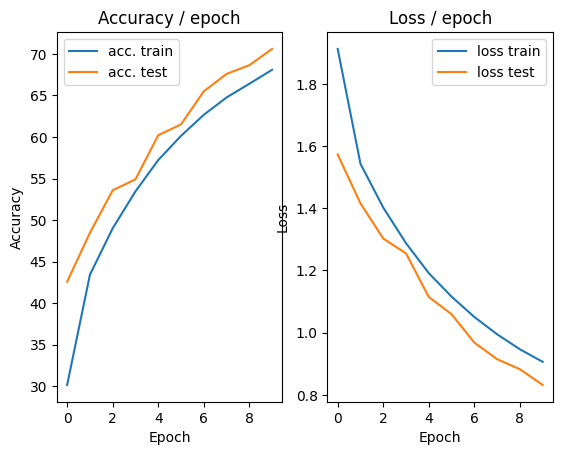

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.185s (0.185s)	Loss 0.8303 (0.8303)	Prec@1  68.8 ( 68.8)	Prec@5  99.2 ( 99.2)


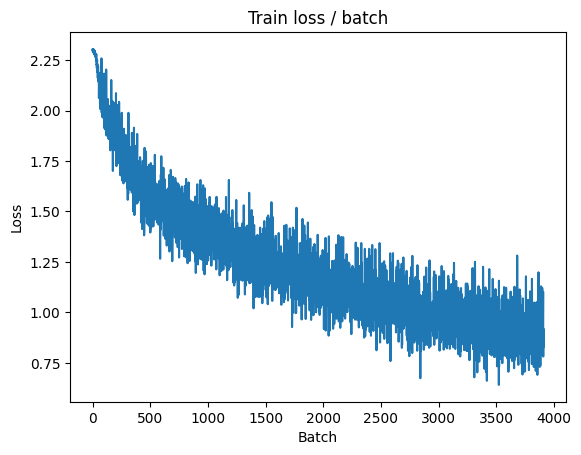

[TRAIN Batch 200/391]	Time 0.144s (0.048s)	Loss 0.7563 (0.8777)	Prec@1  70.3 ( 69.3)	Prec@5  99.2 ( 97.6)


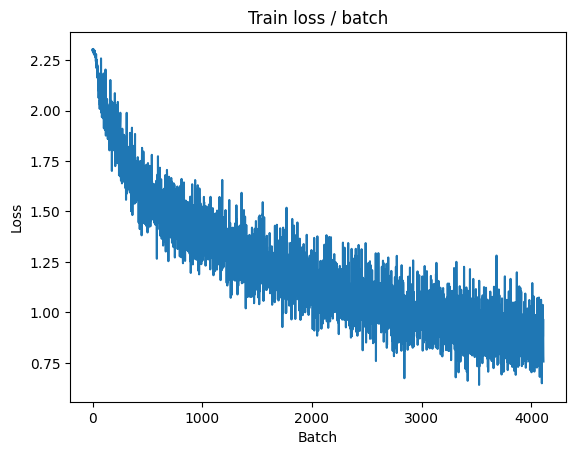


===============> Total time 19s	Avg loss 0.8683	Avg Prec@1 69.34 %	Avg Prec@5 97.62 %

[EVAL Batch 000/079]	Time 0.151s (0.151s)	Loss 0.7611 (0.7611)	Prec@1  76.6 ( 76.6)	Prec@5  97.7 ( 97.7)

===============> Total time 3s	Avg loss 0.8295	Avg Prec@1 70.45 %	Avg Prec@5 97.78 %



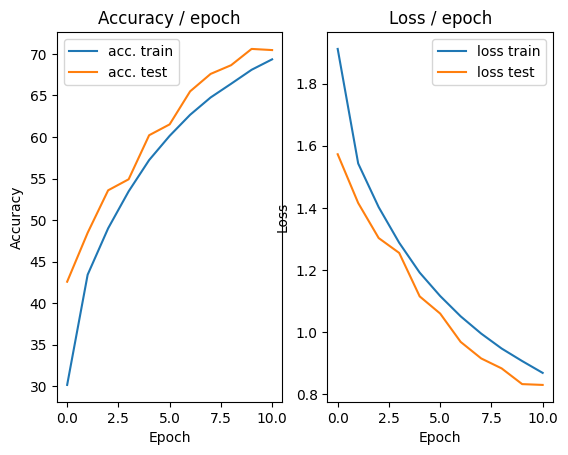

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.293s (0.293s)	Loss 0.8030 (0.8030)	Prec@1  71.9 ( 71.9)	Prec@5  97.7 ( 97.7)


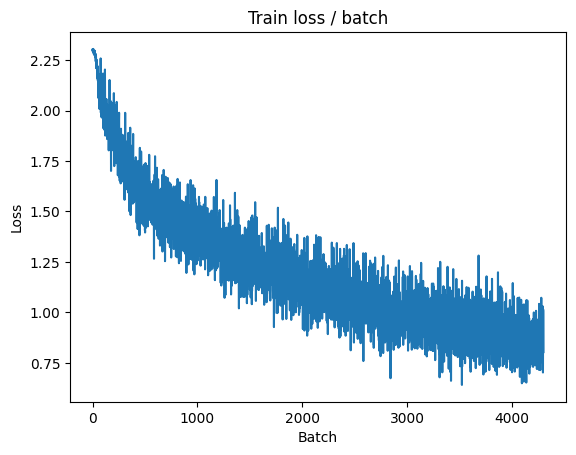

[TRAIN Batch 200/391]	Time 0.009s (0.052s)	Loss 0.8556 (0.8403)	Prec@1  69.5 ( 70.4)	Prec@5  98.4 ( 97.6)


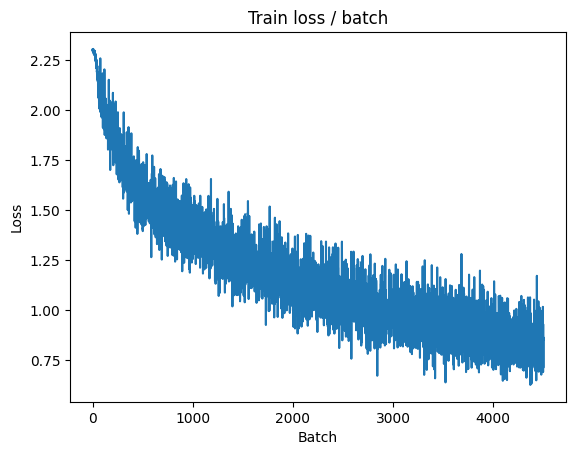


===============> Total time 20s	Avg loss 0.8404	Avg Prec@1 70.39 %	Avg Prec@5 97.69 %

[EVAL Batch 000/079]	Time 0.168s (0.168s)	Loss 0.7345 (0.7345)	Prec@1  76.6 ( 76.6)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.7987	Avg Prec@1 72.20 %	Avg Prec@5 98.01 %



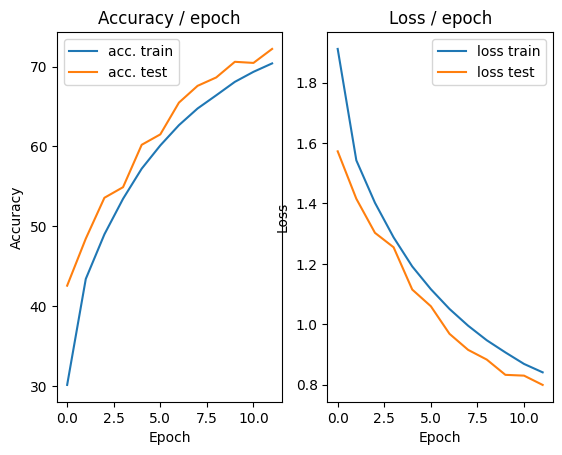

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.203s (0.203s)	Loss 0.9080 (0.9080)	Prec@1  68.8 ( 68.8)	Prec@5  97.7 ( 97.7)


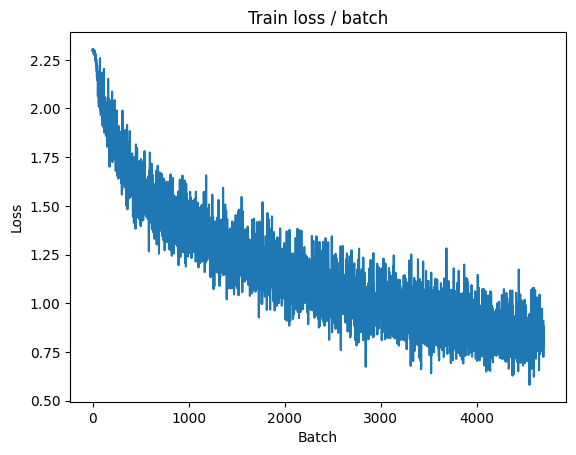

[TRAIN Batch 200/391]	Time 0.014s (0.053s)	Loss 0.8561 (0.8239)	Prec@1  69.5 ( 71.1)	Prec@5  97.7 ( 97.7)


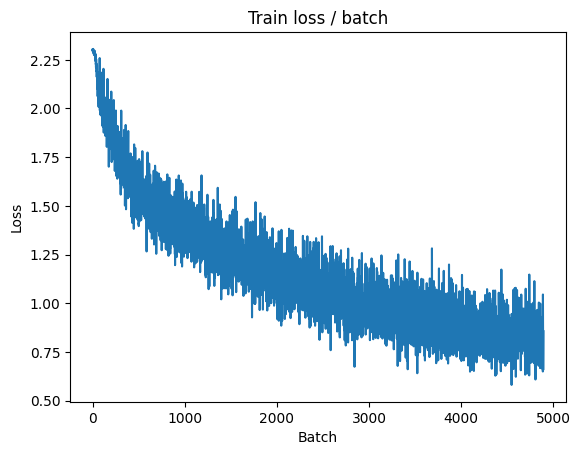


===============> Total time 20s	Avg loss 0.8147	Avg Prec@1 71.40 %	Avg Prec@5 97.79 %

[EVAL Batch 000/079]	Time 0.158s (0.158s)	Loss 0.7154 (0.7154)	Prec@1  78.9 ( 78.9)	Prec@5  97.7 ( 97.7)

===============> Total time 3s	Avg loss 0.8162	Avg Prec@1 71.43 %	Avg Prec@5 97.95 %



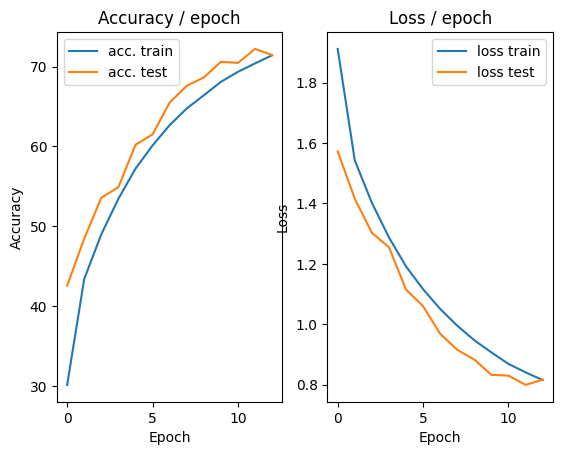

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.204s (0.204s)	Loss 0.9789 (0.9789)	Prec@1  63.3 ( 63.3)	Prec@5  98.4 ( 98.4)


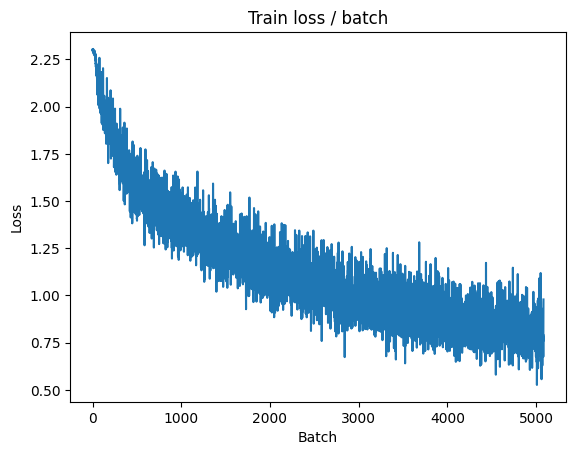

[TRAIN Batch 200/391]	Time 0.030s (0.053s)	Loss 0.7143 (0.7860)	Prec@1  71.9 ( 72.5)	Prec@5  97.7 ( 98.1)


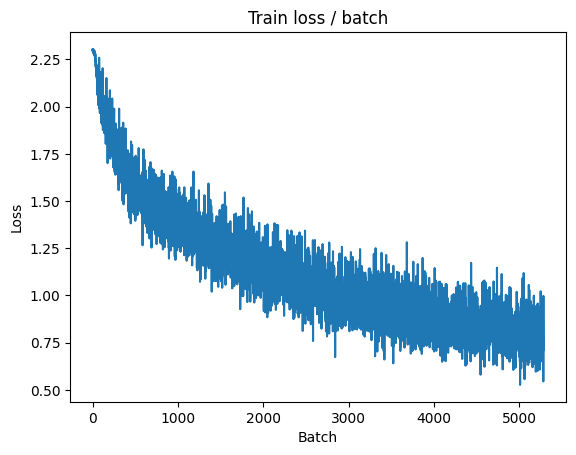


===============> Total time 20s	Avg loss 0.7875	Avg Prec@1 72.48 %	Avg Prec@5 98.06 %

[EVAL Batch 000/079]	Time 0.149s (0.149s)	Loss 0.6865 (0.6865)	Prec@1  78.9 ( 78.9)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.7830	Avg Prec@1 72.32 %	Avg Prec@5 98.04 %



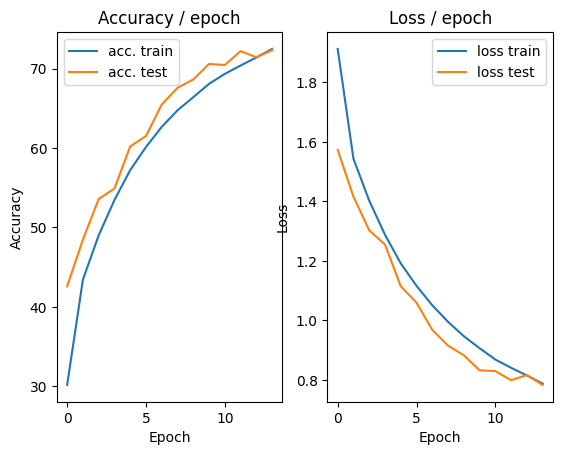

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.209s (0.209s)	Loss 0.7683 (0.7683)	Prec@1  71.1 ( 71.1)	Prec@5  99.2 ( 99.2)


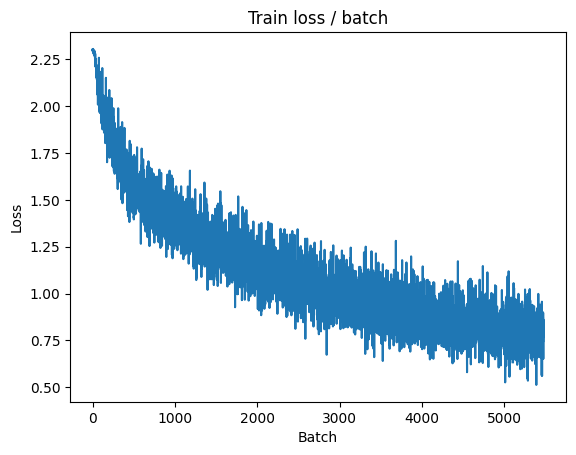

[TRAIN Batch 200/391]	Time 0.087s (0.054s)	Loss 0.7396 (0.7568)	Prec@1  75.0 ( 73.3)	Prec@5  97.7 ( 98.2)


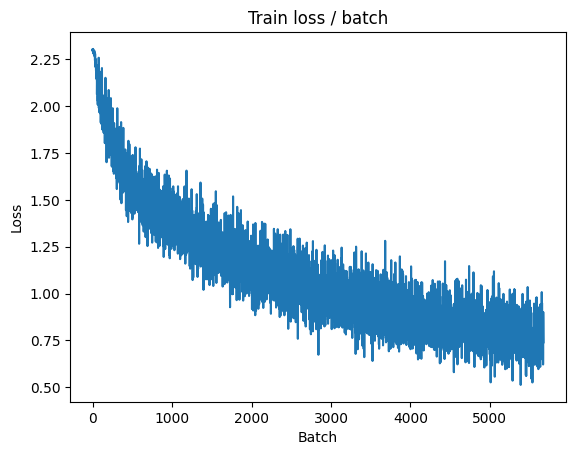


===============> Total time 20s	Avg loss 0.7604	Avg Prec@1 73.30 %	Avg Prec@5 98.17 %

[EVAL Batch 000/079]	Time 0.154s (0.154s)	Loss 0.6665 (0.6665)	Prec@1  78.9 ( 78.9)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.7286	Avg Prec@1 74.49 %	Avg Prec@5 98.27 %



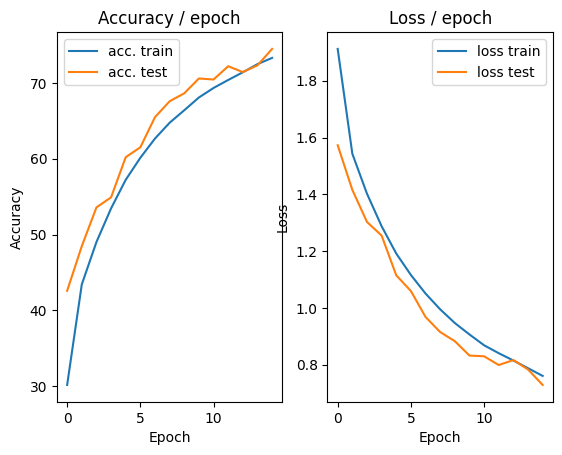

=== EPOCH 16 =====

[TRAIN Batch 000/391]	Time 0.208s (0.208s)	Loss 0.9523 (0.9523)	Prec@1  65.6 ( 65.6)	Prec@5  95.3 ( 95.3)


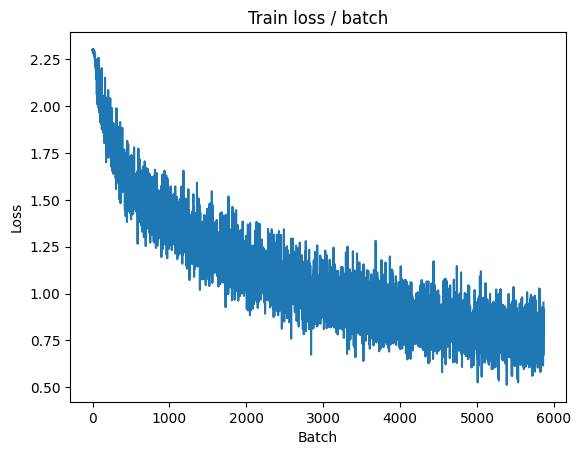

[TRAIN Batch 200/391]	Time 0.062s (0.053s)	Loss 0.7715 (0.7374)	Prec@1  73.4 ( 74.1)	Prec@5  98.4 ( 98.3)


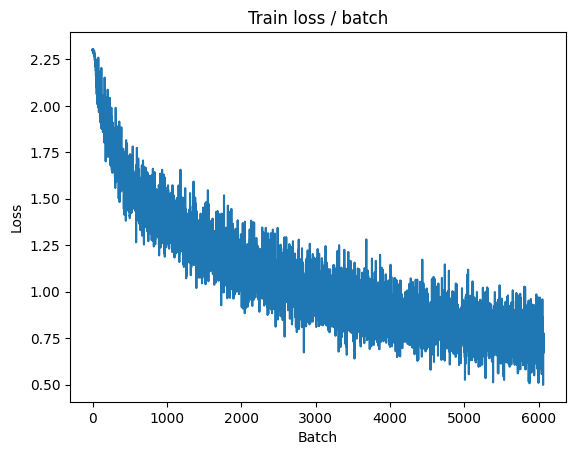


===============> Total time 19s	Avg loss 0.7412	Avg Prec@1 73.97 %	Avg Prec@5 98.29 %

[EVAL Batch 000/079]	Time 0.280s (0.280s)	Loss 0.7006 (0.7006)	Prec@1  78.1 ( 78.1)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.7697	Avg Prec@1 73.34 %	Avg Prec@5 98.20 %



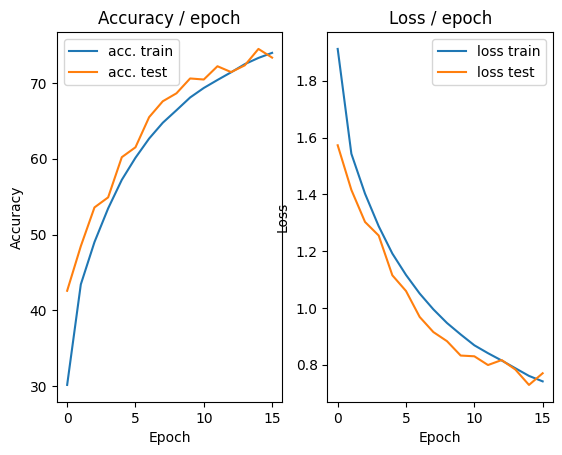

=== EPOCH 17 =====

[TRAIN Batch 000/391]	Time 0.209s (0.209s)	Loss 0.6981 (0.6981)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)


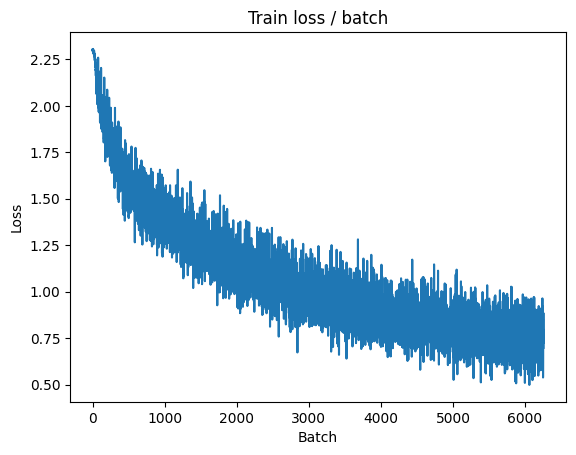

[TRAIN Batch 200/391]	Time 0.022s (0.052s)	Loss 0.7818 (0.7199)	Prec@1  73.4 ( 74.9)	Prec@5  99.2 ( 98.4)


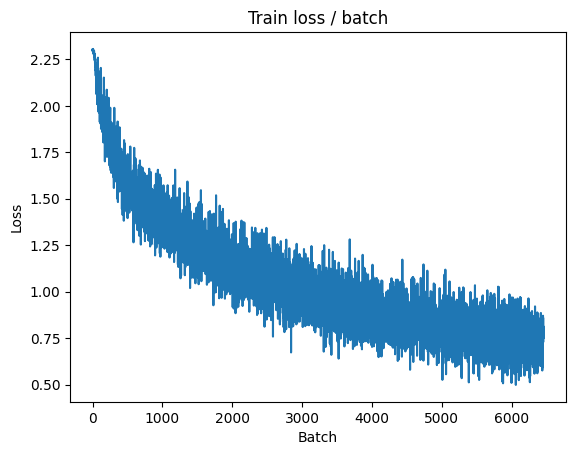


===============> Total time 19s	Avg loss 0.7250	Avg Prec@1 74.72 %	Avg Prec@5 98.36 %

[EVAL Batch 000/079]	Time 0.169s (0.169s)	Loss 0.6652 (0.6652)	Prec@1  80.5 ( 80.5)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.7098	Avg Prec@1 75.39 %	Avg Prec@5 98.39 %



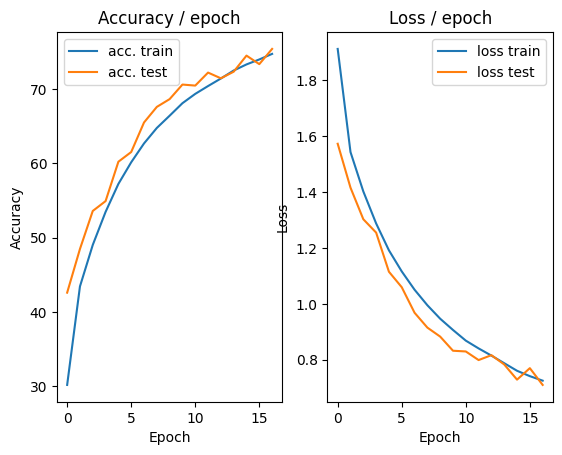

=== EPOCH 18 =====

[TRAIN Batch 000/391]	Time 0.214s (0.214s)	Loss 0.7015 (0.7015)	Prec@1  75.0 ( 75.0)	Prec@5  99.2 ( 99.2)


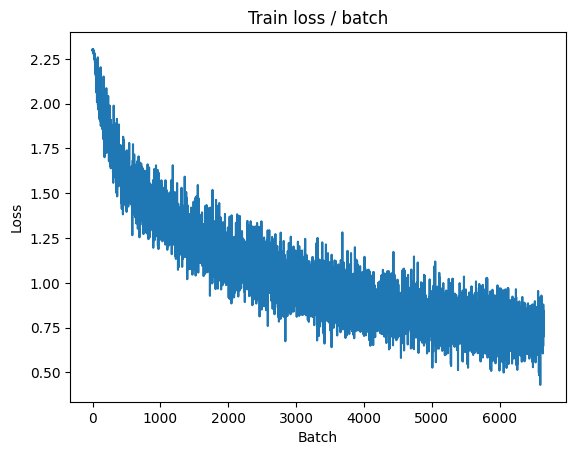

[TRAIN Batch 200/391]	Time 0.079s (0.049s)	Loss 0.5477 (0.7066)	Prec@1  80.5 ( 75.4)	Prec@5  97.7 ( 98.4)


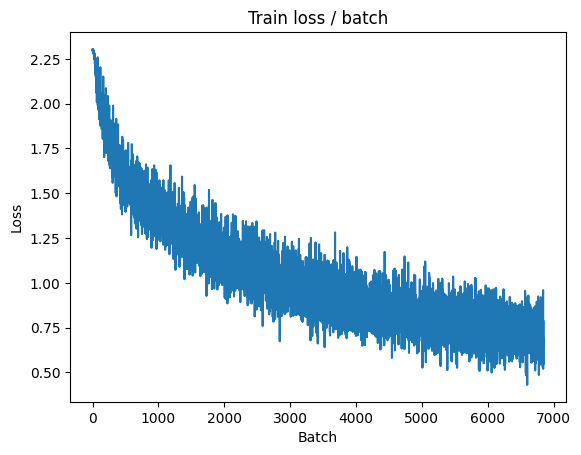


===============> Total time 19s	Avg loss 0.7047	Avg Prec@1 75.44 %	Avg Prec@5 98.39 %

[EVAL Batch 000/079]	Time 0.155s (0.155s)	Loss 0.6567 (0.6567)	Prec@1  79.7 ( 79.7)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.7130	Avg Prec@1 75.28 %	Avg Prec@5 98.37 %



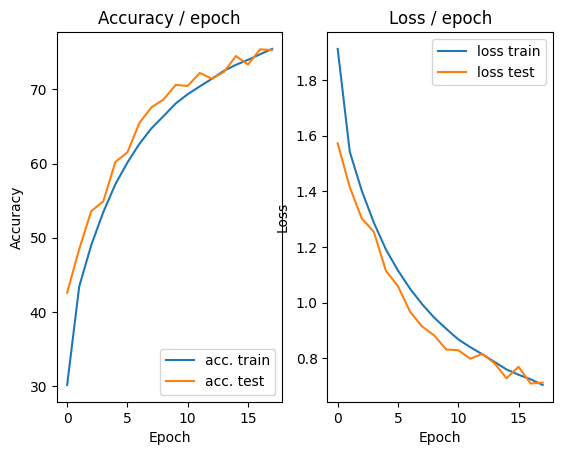

=== EPOCH 19 =====

[TRAIN Batch 000/391]	Time 0.350s (0.350s)	Loss 0.7552 (0.7552)	Prec@1  71.1 ( 71.1)	Prec@5  98.4 ( 98.4)


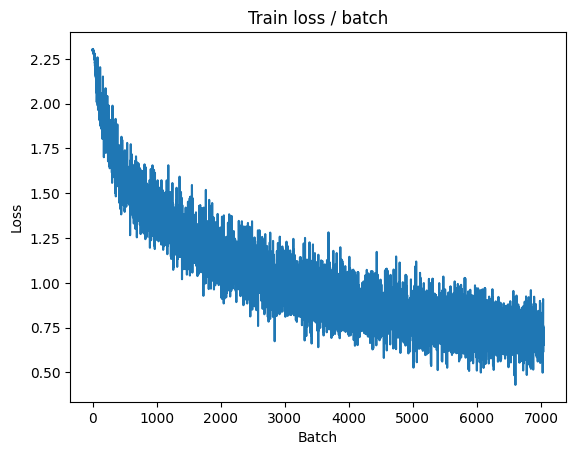

[TRAIN Batch 200/391]	Time 0.014s (0.053s)	Loss 0.6853 (0.6967)	Prec@1  75.8 ( 75.5)	Prec@5  97.7 ( 98.4)


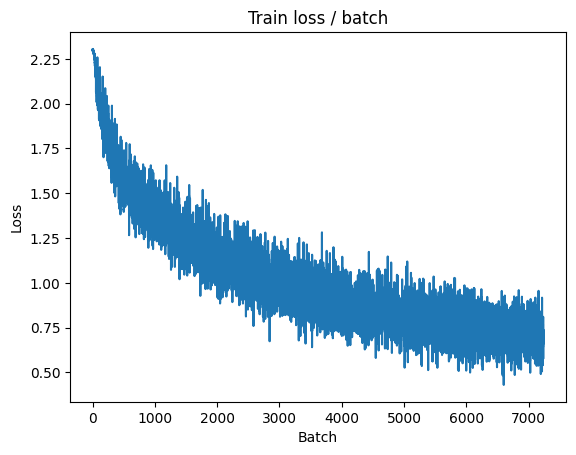


===============> Total time 20s	Avg loss 0.6938	Avg Prec@1 75.66 %	Avg Prec@5 98.46 %

[EVAL Batch 000/079]	Time 0.153s (0.153s)	Loss 0.6220 (0.6220)	Prec@1  81.2 ( 81.2)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6954	Avg Prec@1 75.76 %	Avg Prec@5 98.40 %



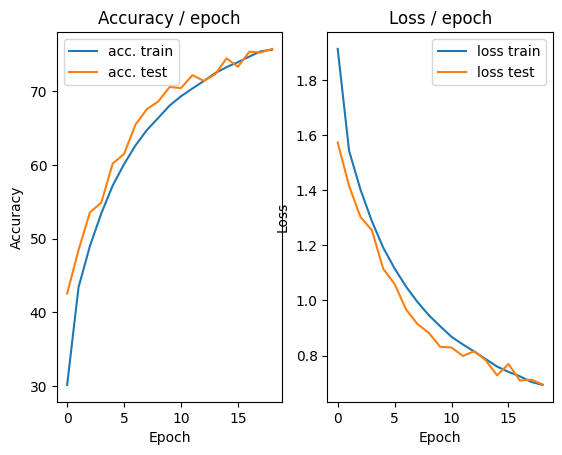

=== EPOCH 20 =====

[TRAIN Batch 000/391]	Time 0.209s (0.209s)	Loss 0.4126 (0.4126)	Prec@1  88.3 ( 88.3)	Prec@5 100.0 (100.0)


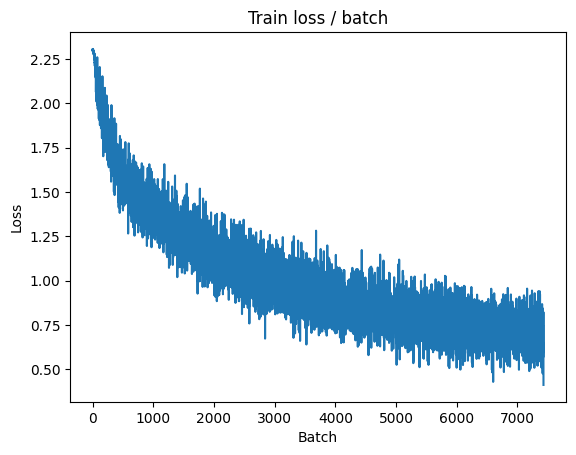

[TRAIN Batch 200/391]	Time 0.086s (0.053s)	Loss 0.6938 (0.6768)	Prec@1  75.0 ( 76.4)	Prec@5 100.0 ( 98.5)


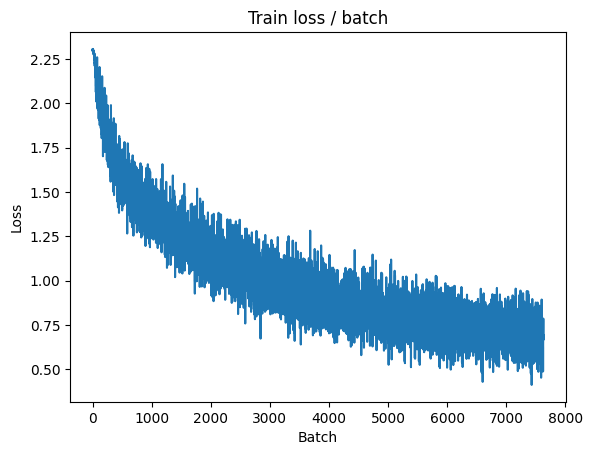


===============> Total time 20s	Avg loss 0.6776	Avg Prec@1 76.31 %	Avg Prec@5 98.50 %

[EVAL Batch 000/079]	Time 0.179s (0.179s)	Loss 0.6465 (0.6465)	Prec@1  81.2 ( 81.2)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.7118	Avg Prec@1 75.06 %	Avg Prec@5 98.32 %



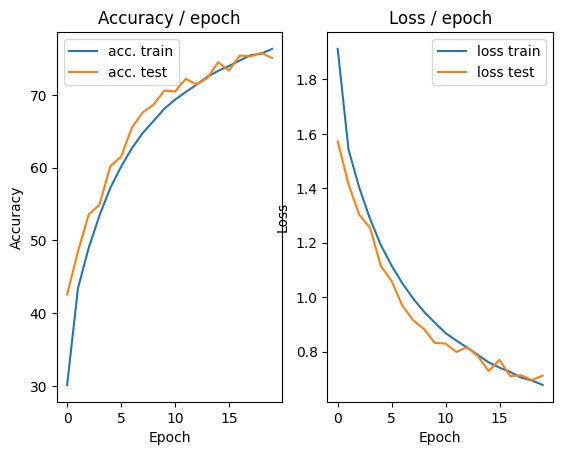

=== EPOCH 21 =====

[TRAIN Batch 000/391]	Time 0.199s (0.199s)	Loss 0.6342 (0.6342)	Prec@1  74.2 ( 74.2)	Prec@5  99.2 ( 99.2)


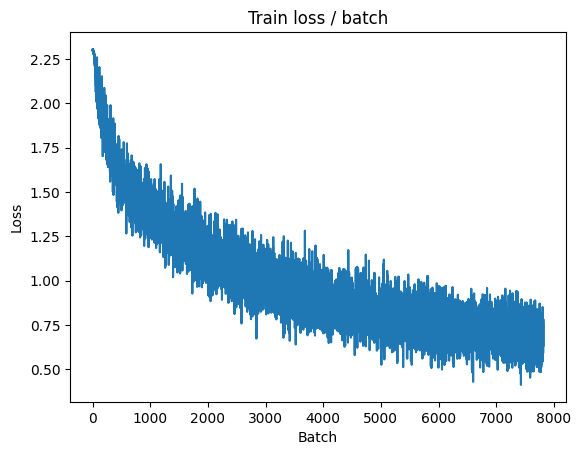

[TRAIN Batch 200/391]	Time 0.082s (0.054s)	Loss 0.6074 (0.6667)	Prec@1  78.1 ( 76.6)	Prec@5 100.0 ( 98.6)


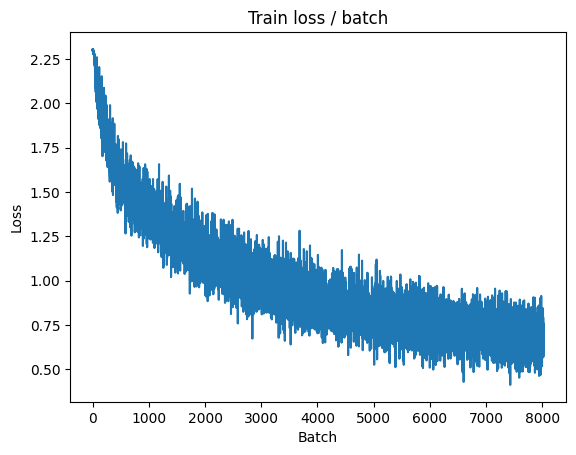


===============> Total time 21s	Avg loss 0.6656	Avg Prec@1 76.71 %	Avg Prec@5 98.60 %

[EVAL Batch 000/079]	Time 0.162s (0.162s)	Loss 0.5978 (0.5978)	Prec@1  79.7 ( 79.7)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.6760	Avg Prec@1 76.57 %	Avg Prec@5 98.60 %



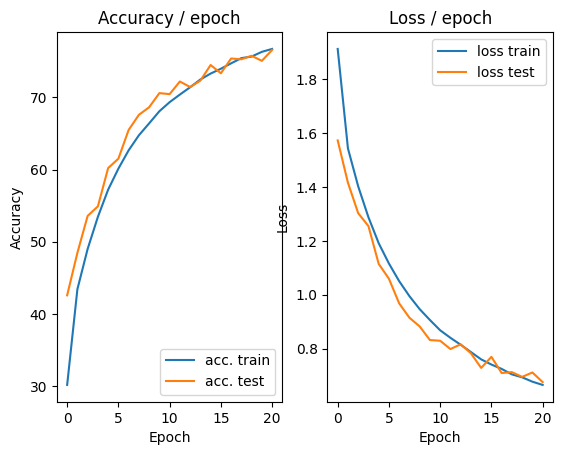

=== EPOCH 22 =====

[TRAIN Batch 000/391]	Time 0.218s (0.218s)	Loss 0.7031 (0.7031)	Prec@1  75.8 ( 75.8)	Prec@5  98.4 ( 98.4)


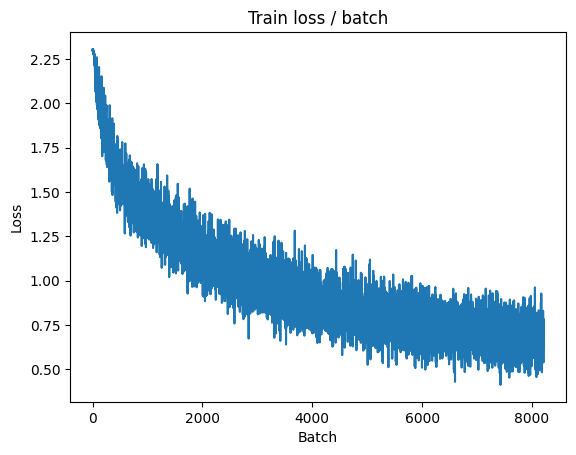

[TRAIN Batch 200/391]	Time 0.056s (0.054s)	Loss 0.8741 (0.6488)	Prec@1  65.6 ( 77.2)	Prec@5  97.7 ( 98.7)


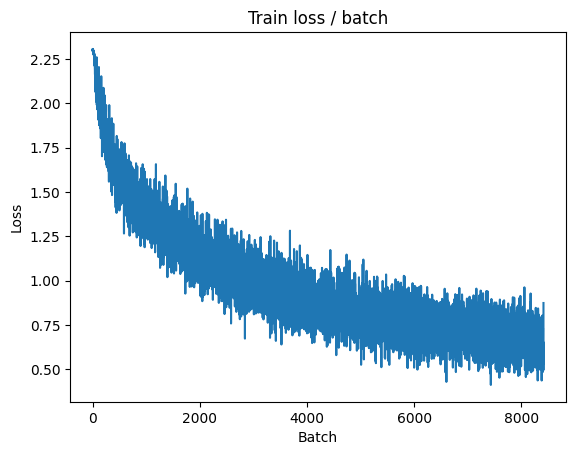


===============> Total time 20s	Avg loss 0.6520	Avg Prec@1 77.07 %	Avg Prec@5 98.67 %

[EVAL Batch 000/079]	Time 0.166s (0.166s)	Loss 0.5491 (0.5491)	Prec@1  83.6 ( 83.6)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6631	Avg Prec@1 77.23 %	Avg Prec@5 98.57 %



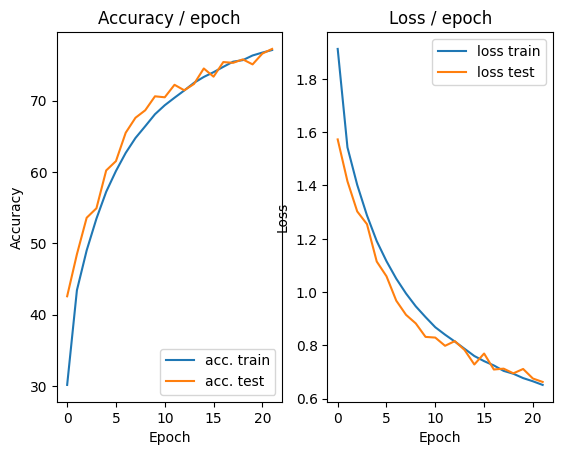

=== EPOCH 23 =====

[TRAIN Batch 000/391]	Time 0.229s (0.229s)	Loss 0.5791 (0.5791)	Prec@1  78.9 ( 78.9)	Prec@5 100.0 (100.0)


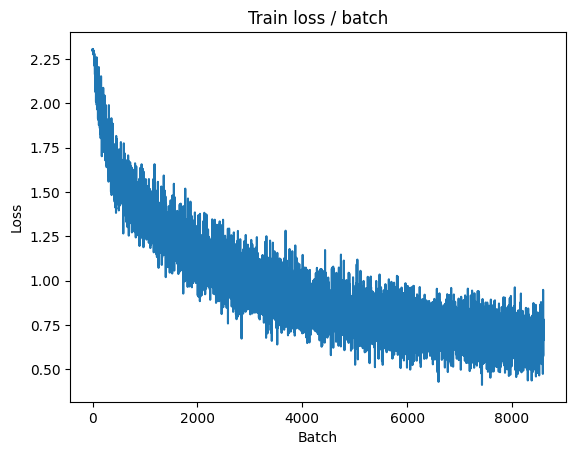

[TRAIN Batch 200/391]	Time 0.088s (0.054s)	Loss 0.6607 (0.6426)	Prec@1  78.1 ( 77.6)	Prec@5  99.2 ( 98.7)


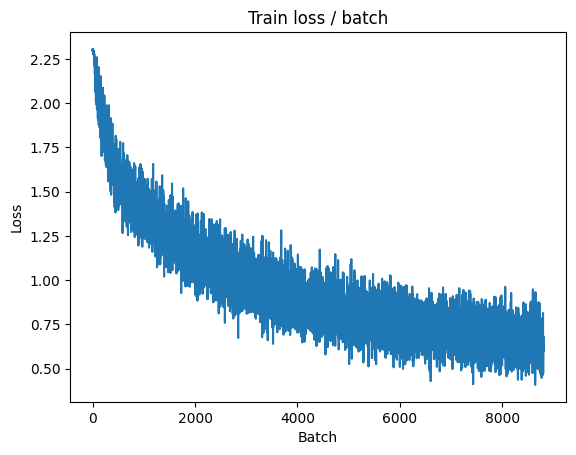


===============> Total time 20s	Avg loss 0.6398	Avg Prec@1 77.64 %	Avg Prec@5 98.66 %

[EVAL Batch 000/079]	Time 0.254s (0.254s)	Loss 0.5529 (0.5529)	Prec@1  84.4 ( 84.4)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.6382	Avg Prec@1 77.73 %	Avg Prec@5 98.67 %



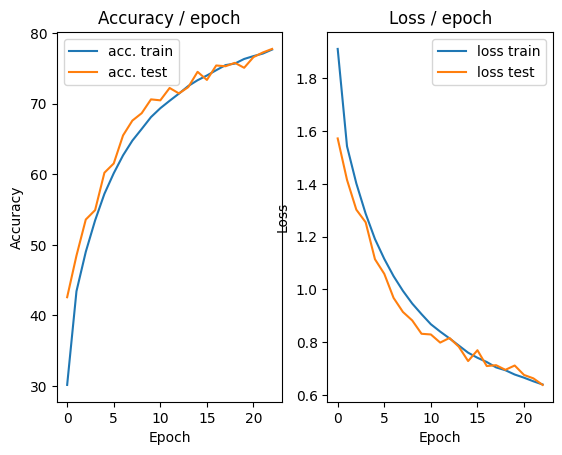

=== EPOCH 24 =====

[TRAIN Batch 000/391]	Time 0.213s (0.213s)	Loss 0.7012 (0.7012)	Prec@1  77.3 ( 77.3)	Prec@5  97.7 ( 97.7)


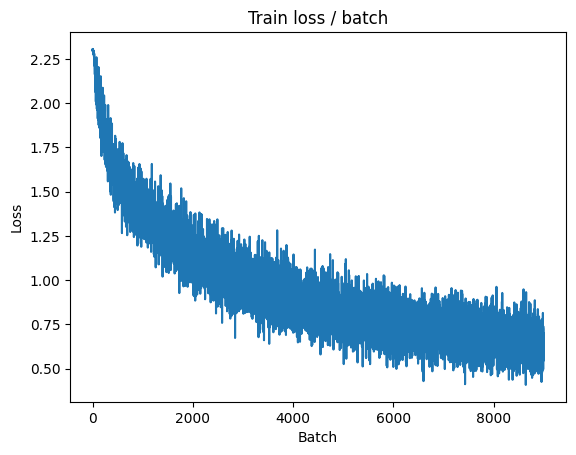

[TRAIN Batch 200/391]	Time 0.081s (0.054s)	Loss 0.5387 (0.6302)	Prec@1  84.4 ( 77.9)	Prec@5  98.4 ( 98.7)


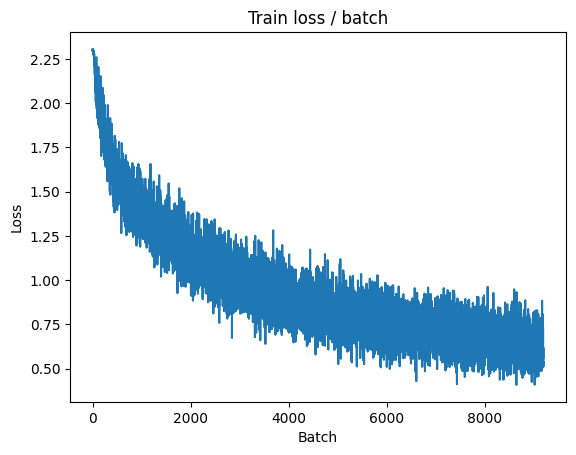


===============> Total time 19s	Avg loss 0.6257	Avg Prec@1 78.08 %	Avg Prec@5 98.81 %

[EVAL Batch 000/079]	Time 0.160s (0.160s)	Loss 0.5601 (0.5601)	Prec@1  85.2 ( 85.2)	Prec@5  97.7 ( 97.7)

===============> Total time 4s	Avg loss 0.6413	Avg Prec@1 77.72 %	Avg Prec@5 98.68 %



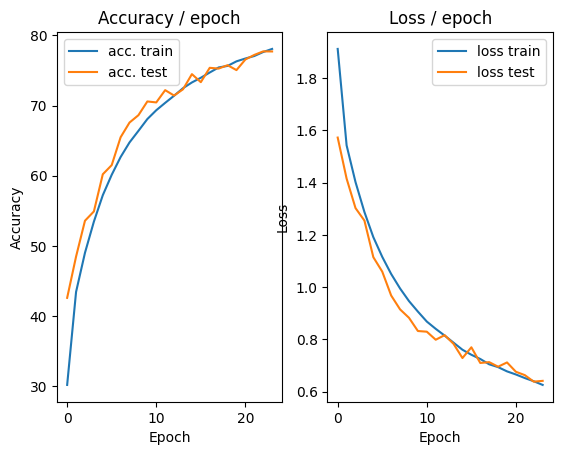

=== EPOCH 25 =====

[TRAIN Batch 000/391]	Time 0.242s (0.242s)	Loss 0.5923 (0.5923)	Prec@1  76.6 ( 76.6)	Prec@5  99.2 ( 99.2)


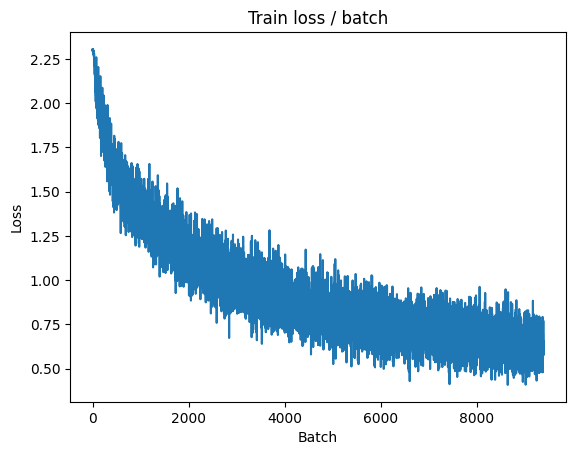

[TRAIN Batch 200/391]	Time 0.067s (0.049s)	Loss 0.5859 (0.6151)	Prec@1  82.0 ( 78.8)	Prec@5  99.2 ( 98.8)


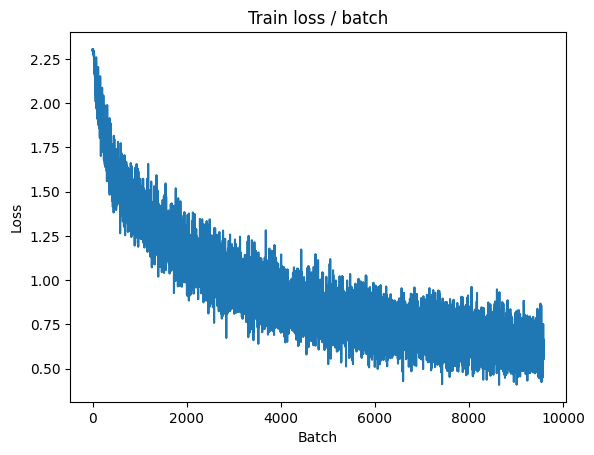


===============> Total time 19s	Avg loss 0.6167	Avg Prec@1 78.68 %	Avg Prec@5 98.75 %

[EVAL Batch 000/079]	Time 0.178s (0.178s)	Loss 0.5982 (0.5982)	Prec@1  80.5 ( 80.5)	Prec@5  97.7 ( 97.7)

===============> Total time 3s	Avg loss 0.6228	Avg Prec@1 78.33 %	Avg Prec@5 98.77 %



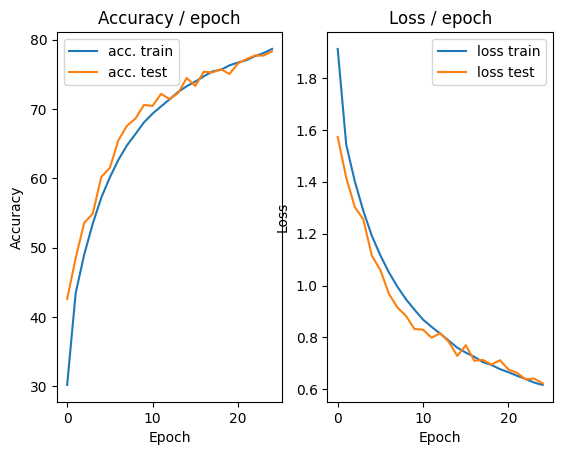

=== EPOCH 26 =====

[TRAIN Batch 000/391]	Time 0.322s (0.322s)	Loss 0.5319 (0.5319)	Prec@1  82.0 ( 82.0)	Prec@5  99.2 ( 99.2)


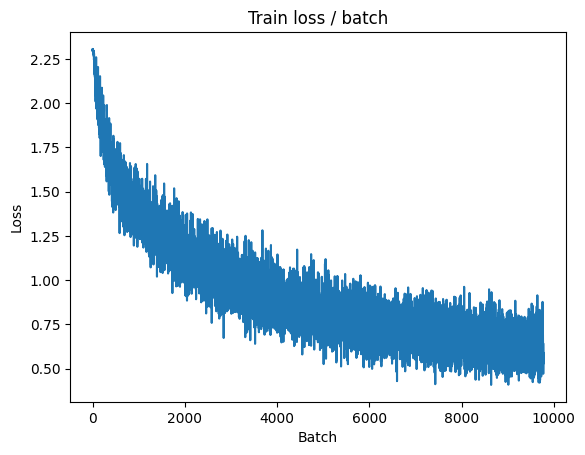

[TRAIN Batch 200/391]	Time 0.075s (0.053s)	Loss 0.5765 (0.6061)	Prec@1  79.7 ( 78.8)	Prec@5  98.4 ( 98.9)


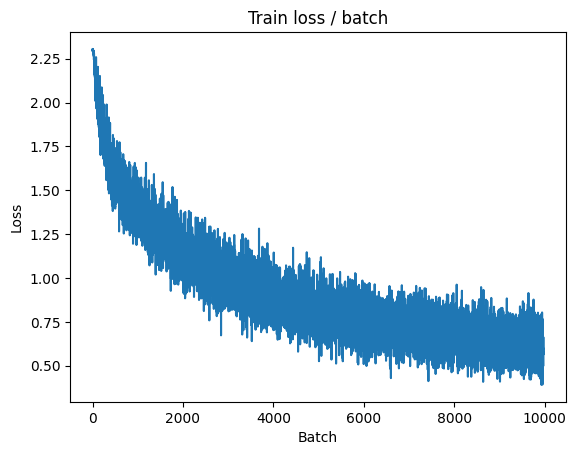


===============> Total time 20s	Avg loss 0.6134	Avg Prec@1 78.59 %	Avg Prec@5 98.82 %

[EVAL Batch 000/079]	Time 0.167s (0.167s)	Loss 0.5454 (0.5454)	Prec@1  83.6 ( 83.6)	Prec@5  97.7 ( 97.7)

===============> Total time 3s	Avg loss 0.6228	Avg Prec@1 78.26 %	Avg Prec@5 98.84 %



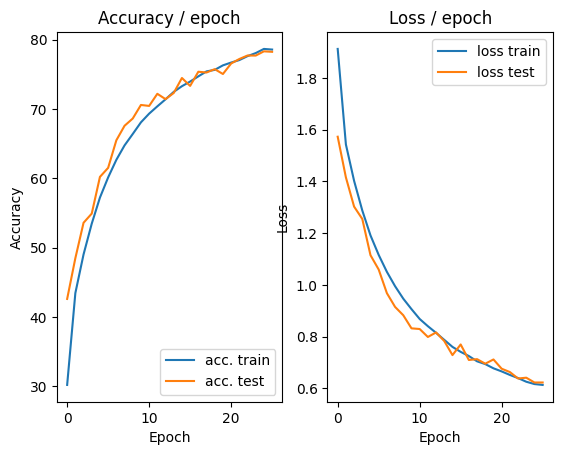

=== EPOCH 27 =====

[TRAIN Batch 000/391]	Time 0.186s (0.186s)	Loss 0.5959 (0.5959)	Prec@1  80.5 ( 80.5)	Prec@5 100.0 (100.0)


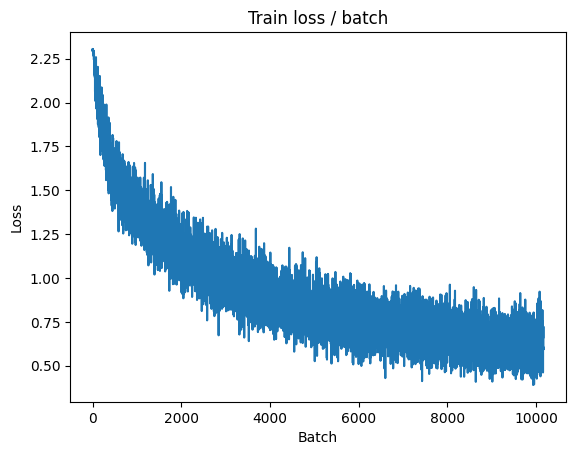

[TRAIN Batch 200/391]	Time 0.009s (0.054s)	Loss 0.5283 (0.6028)	Prec@1  82.0 ( 79.0)	Prec@5 100.0 ( 98.9)


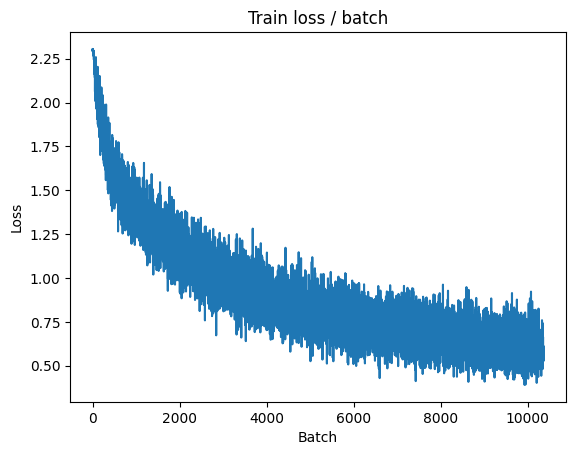


===============> Total time 20s	Avg loss 0.6015	Avg Prec@1 79.00 %	Avg Prec@5 98.92 %

[EVAL Batch 000/079]	Time 0.175s (0.175s)	Loss 0.5546 (0.5546)	Prec@1  82.8 ( 82.8)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.6172	Avg Prec@1 78.60 %	Avg Prec@5 98.70 %



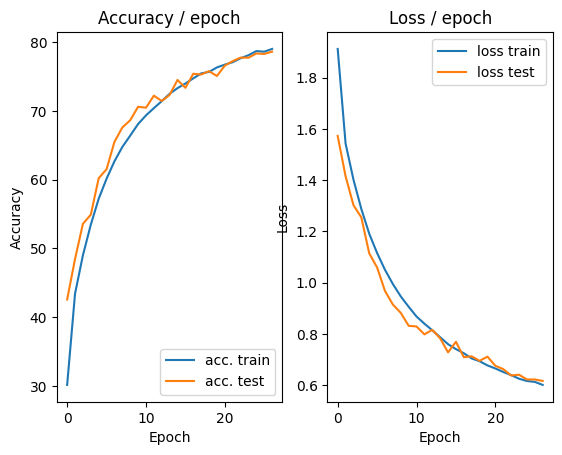

=== EPOCH 28 =====

[TRAIN Batch 000/391]	Time 0.260s (0.260s)	Loss 0.6423 (0.6423)	Prec@1  81.2 ( 81.2)	Prec@5  99.2 ( 99.2)


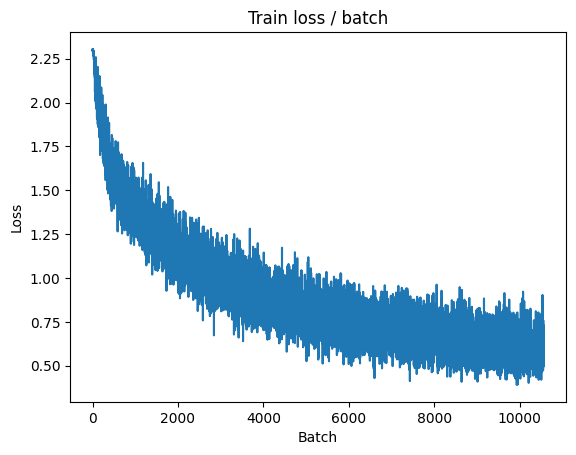

[TRAIN Batch 200/391]	Time 0.009s (0.055s)	Loss 0.6543 (0.5980)	Prec@1  78.9 ( 79.0)	Prec@5  98.4 ( 98.9)


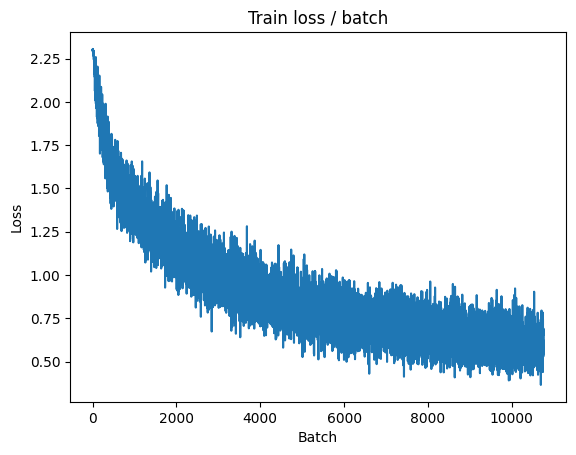


===============> Total time 21s	Avg loss 0.5945	Avg Prec@1 79.12 %	Avg Prec@5 98.90 %

[EVAL Batch 000/079]	Time 0.190s (0.190s)	Loss 0.5475 (0.5475)	Prec@1  83.6 ( 83.6)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.6120	Avg Prec@1 78.35 %	Avg Prec@5 98.74 %



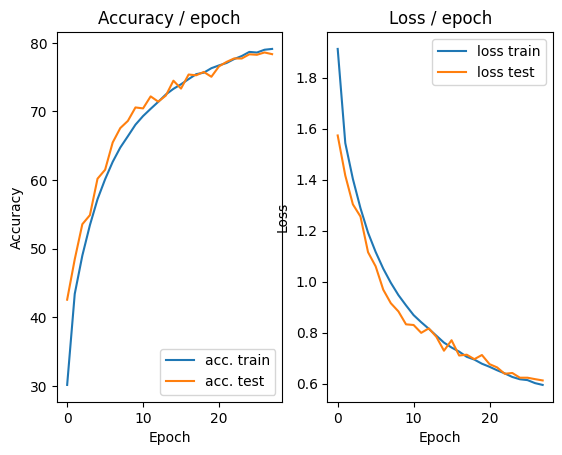

=== EPOCH 29 =====

[TRAIN Batch 000/391]	Time 0.220s (0.220s)	Loss 0.6428 (0.6428)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)


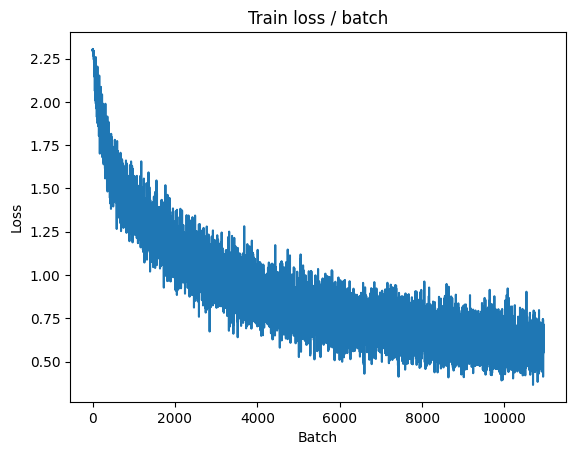

[TRAIN Batch 200/391]	Time 0.014s (0.054s)	Loss 0.6289 (0.5825)	Prec@1  75.0 ( 79.5)	Prec@5  99.2 ( 99.0)


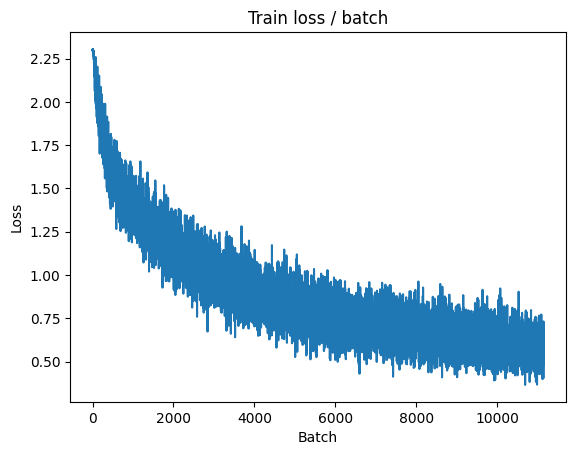


===============> Total time 21s	Avg loss 0.5851	Avg Prec@1 79.41 %	Avg Prec@5 98.96 %

[EVAL Batch 000/079]	Time 0.169s (0.169s)	Loss 0.5369 (0.5369)	Prec@1  85.2 ( 85.2)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6135	Avg Prec@1 78.74 %	Avg Prec@5 98.73 %



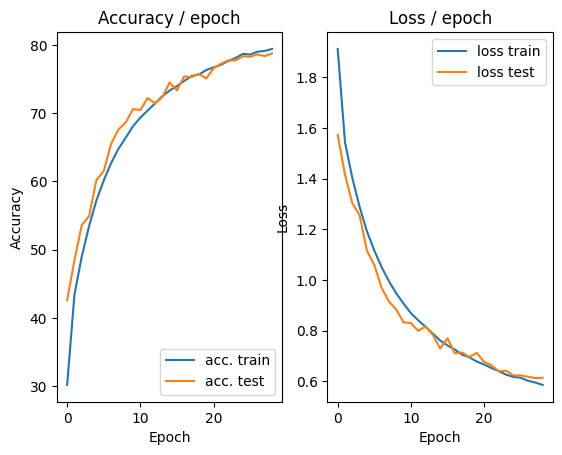

=== EPOCH 30 =====

[TRAIN Batch 000/391]	Time 0.229s (0.229s)	Loss 0.6120 (0.6120)	Prec@1  77.3 ( 77.3)	Prec@5  99.2 ( 99.2)


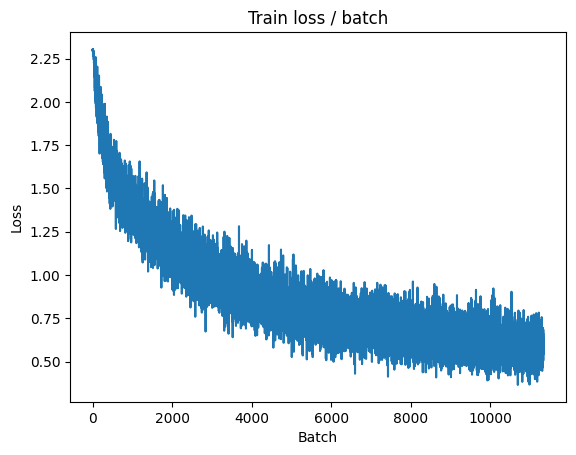

[TRAIN Batch 200/391]	Time 0.044s (0.054s)	Loss 0.5924 (0.5818)	Prec@1  76.6 ( 79.7)	Prec@5 100.0 ( 98.9)


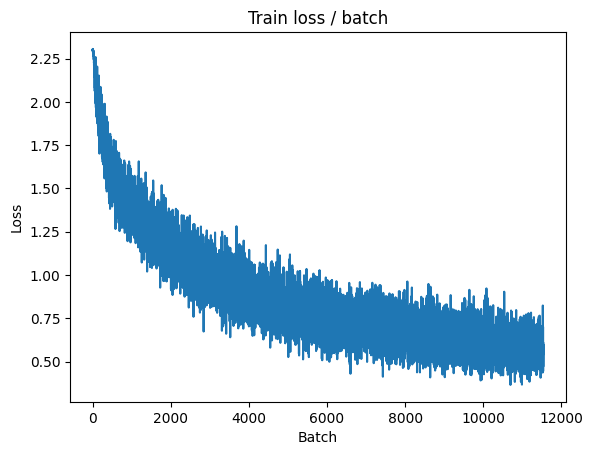


===============> Total time 20s	Avg loss 0.5823	Avg Prec@1 79.58 %	Avg Prec@5 98.93 %

[EVAL Batch 000/079]	Time 0.192s (0.192s)	Loss 0.5594 (0.5594)	Prec@1  81.2 ( 81.2)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.6137	Avg Prec@1 78.67 %	Avg Prec@5 98.85 %



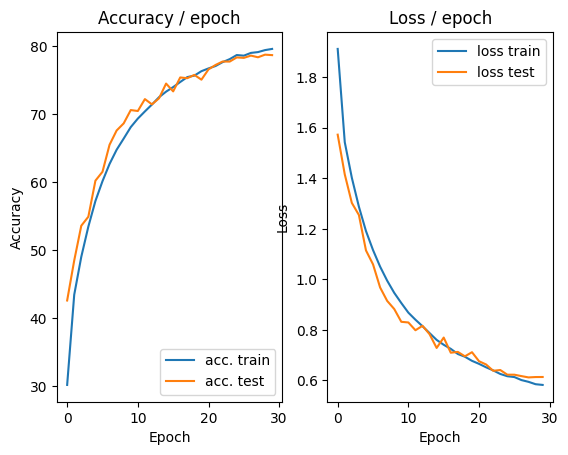

=== EPOCH 31 =====

[TRAIN Batch 000/391]	Time 0.201s (0.201s)	Loss 0.5793 (0.5793)	Prec@1  82.0 ( 82.0)	Prec@5  99.2 ( 99.2)


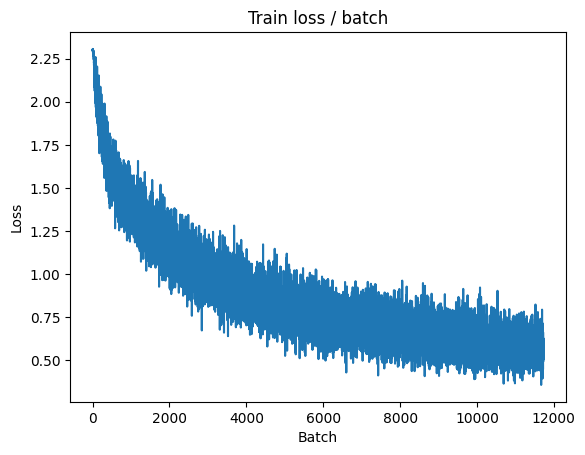

[TRAIN Batch 200/391]	Time 0.092s (0.054s)	Loss 0.6406 (0.5707)	Prec@1  80.5 ( 79.9)	Prec@5  98.4 ( 99.0)


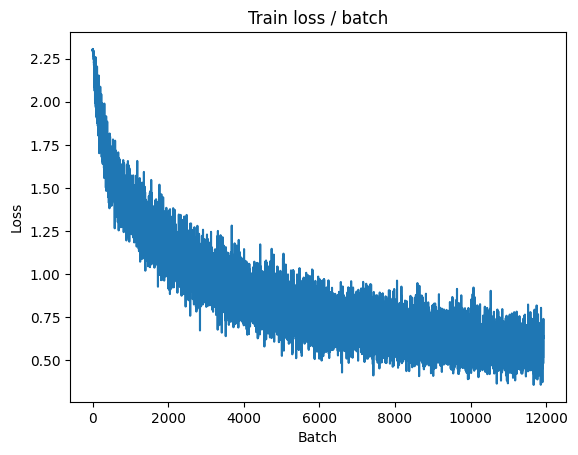


===============> Total time 20s	Avg loss 0.5713	Avg Prec@1 79.96 %	Avg Prec@5 98.98 %

[EVAL Batch 000/079]	Time 0.294s (0.294s)	Loss 0.5396 (0.5396)	Prec@1  84.4 ( 84.4)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.6086	Avg Prec@1 79.06 %	Avg Prec@5 98.83 %



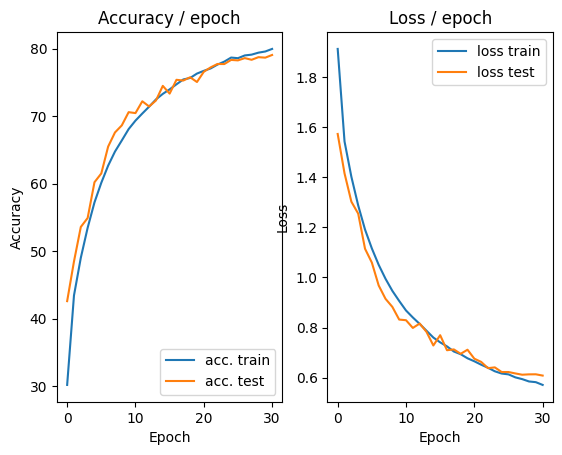

=== EPOCH 32 =====

[TRAIN Batch 000/391]	Time 0.232s (0.232s)	Loss 0.6351 (0.6351)	Prec@1  73.4 ( 73.4)	Prec@5  99.2 ( 99.2)


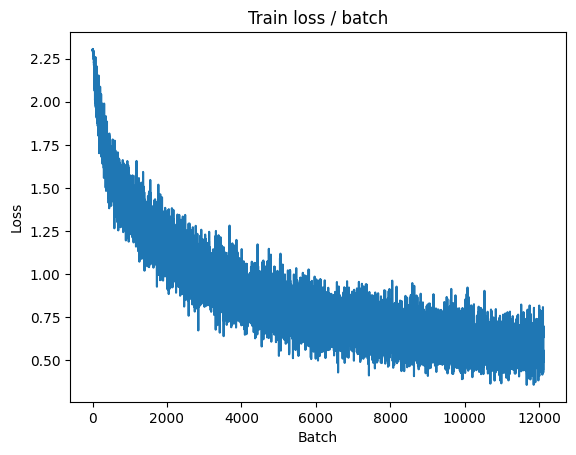

[TRAIN Batch 200/391]	Time 0.018s (0.054s)	Loss 0.5663 (0.5744)	Prec@1  78.9 ( 79.7)	Prec@5 100.0 ( 99.0)


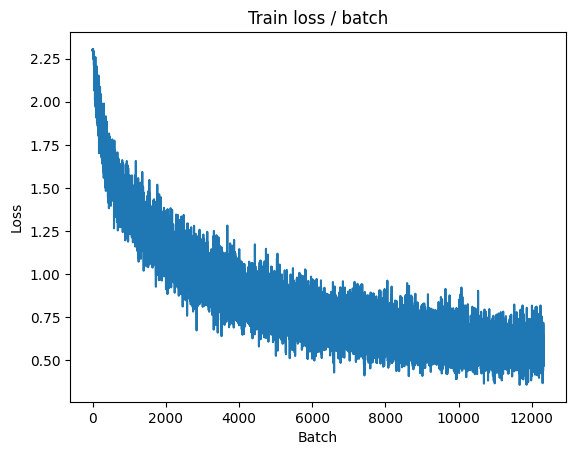


===============> Total time 19s	Avg loss 0.5691	Avg Prec@1 80.06 %	Avg Prec@5 99.01 %

[EVAL Batch 000/079]	Time 0.199s (0.199s)	Loss 0.5505 (0.5505)	Prec@1  82.8 ( 82.8)	Prec@5  97.7 ( 97.7)

===============> Total time 4s	Avg loss 0.5945	Avg Prec@1 79.44 %	Avg Prec@5 98.75 %



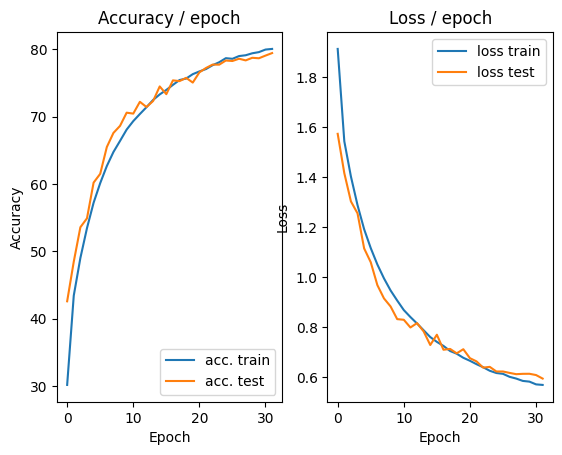

=== EPOCH 33 =====

[TRAIN Batch 000/391]	Time 0.237s (0.237s)	Loss 0.5688 (0.5688)	Prec@1  82.0 ( 82.0)	Prec@5  98.4 ( 98.4)


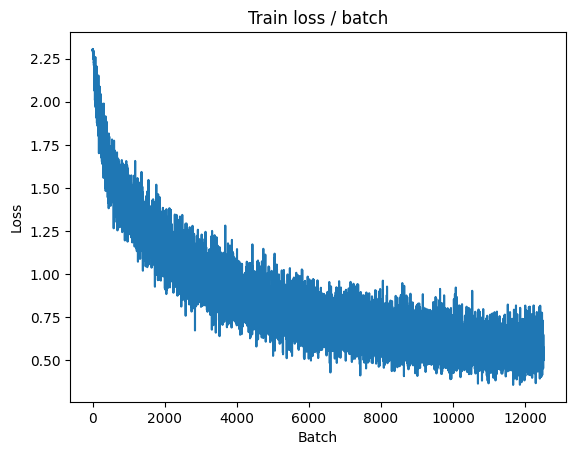

[TRAIN Batch 200/391]	Time 0.153s (0.050s)	Loss 0.5842 (0.5541)	Prec@1  82.8 ( 80.8)	Prec@5  98.4 ( 99.0)


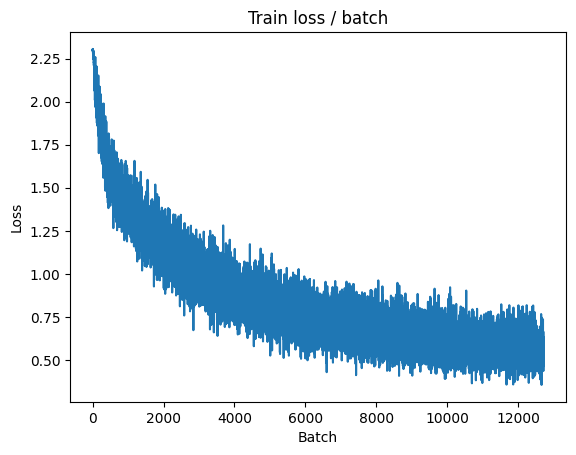


===============> Total time 19s	Avg loss 0.5574	Avg Prec@1 80.46 %	Avg Prec@5 98.99 %

[EVAL Batch 000/079]	Time 0.177s (0.177s)	Loss 0.5502 (0.5502)	Prec@1  81.2 ( 81.2)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.6000	Avg Prec@1 78.96 %	Avg Prec@5 98.91 %



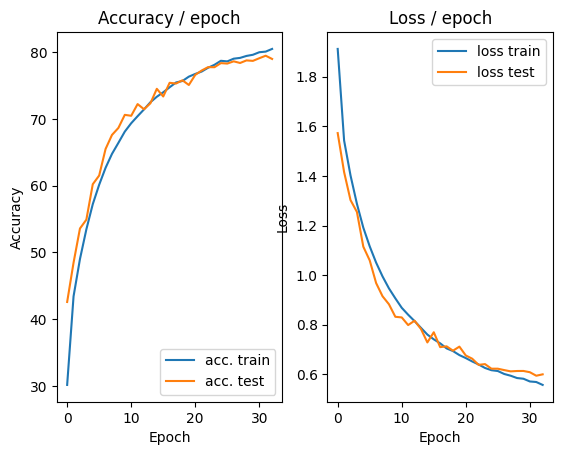

=== EPOCH 34 =====

[TRAIN Batch 000/391]	Time 0.242s (0.242s)	Loss 0.4340 (0.4340)	Prec@1  86.7 ( 86.7)	Prec@5  97.7 ( 97.7)


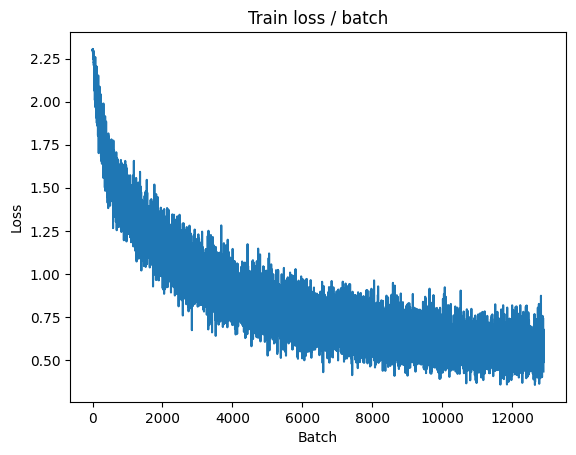

[TRAIN Batch 200/391]	Time 0.082s (0.055s)	Loss 0.4931 (0.5540)	Prec@1  79.7 ( 80.5)	Prec@5 100.0 ( 99.0)


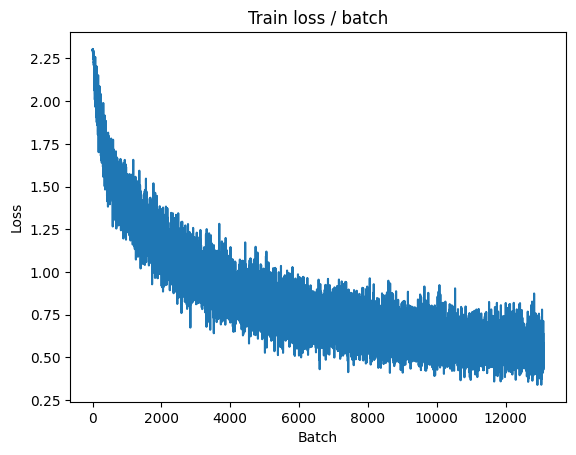


===============> Total time 21s	Avg loss 0.5554	Avg Prec@1 80.35 %	Avg Prec@5 99.03 %

[EVAL Batch 000/079]	Time 0.193s (0.193s)	Loss 0.5181 (0.5181)	Prec@1  83.6 ( 83.6)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.5888	Avg Prec@1 79.62 %	Avg Prec@5 98.88 %



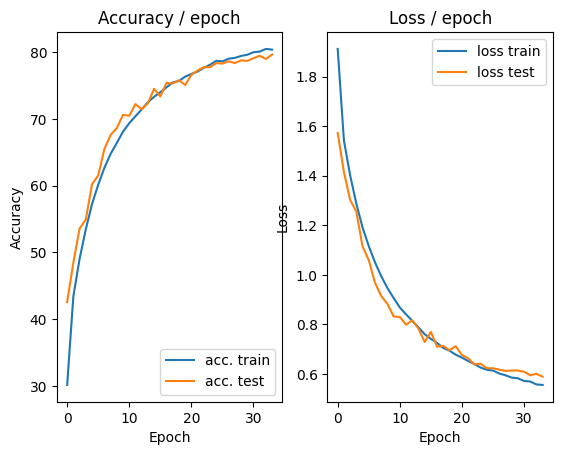

=== EPOCH 35 =====

[TRAIN Batch 000/391]	Time 0.274s (0.274s)	Loss 0.5772 (0.5772)	Prec@1  79.7 ( 79.7)	Prec@5  98.4 ( 98.4)


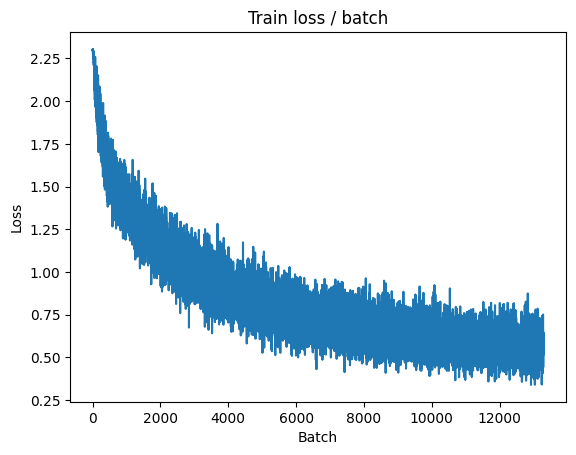

[TRAIN Batch 200/391]	Time 0.015s (0.054s)	Loss 0.5800 (0.5521)	Prec@1  75.8 ( 80.8)	Prec@5  99.2 ( 99.1)


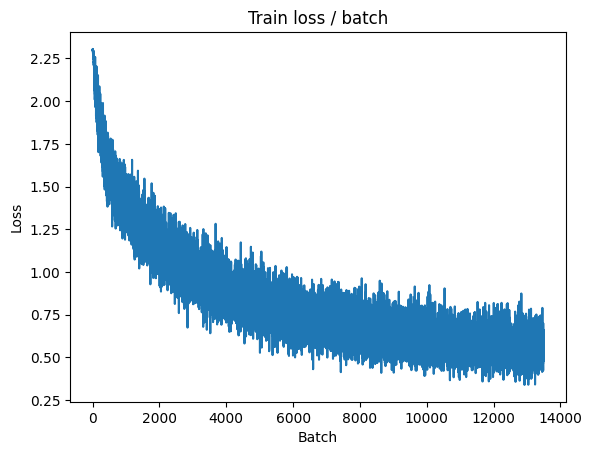


===============> Total time 21s	Avg loss 0.5537	Avg Prec@1 80.62 %	Avg Prec@5 99.04 %

[EVAL Batch 000/079]	Time 0.183s (0.183s)	Loss 0.5189 (0.5189)	Prec@1  84.4 ( 84.4)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.5826	Avg Prec@1 79.77 %	Avg Prec@5 98.82 %



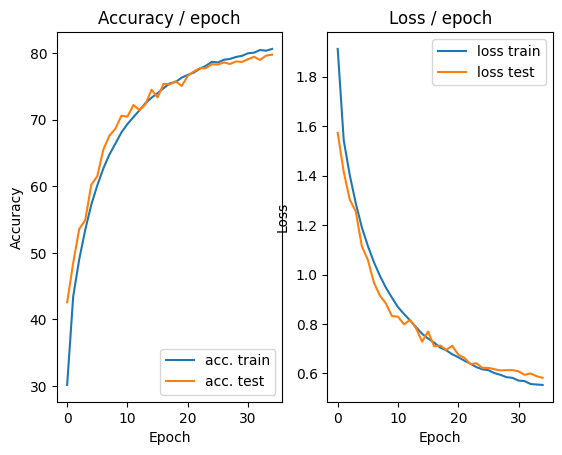

=== EPOCH 36 =====

[TRAIN Batch 000/391]	Time 0.249s (0.249s)	Loss 0.6522 (0.6522)	Prec@1  76.6 ( 76.6)	Prec@5 100.0 (100.0)


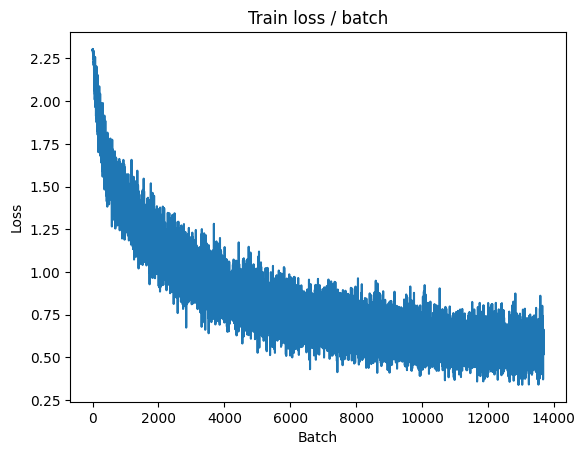

[TRAIN Batch 200/391]	Time 0.008s (0.054s)	Loss 0.6264 (0.5413)	Prec@1  79.7 ( 81.0)	Prec@5  99.2 ( 99.1)


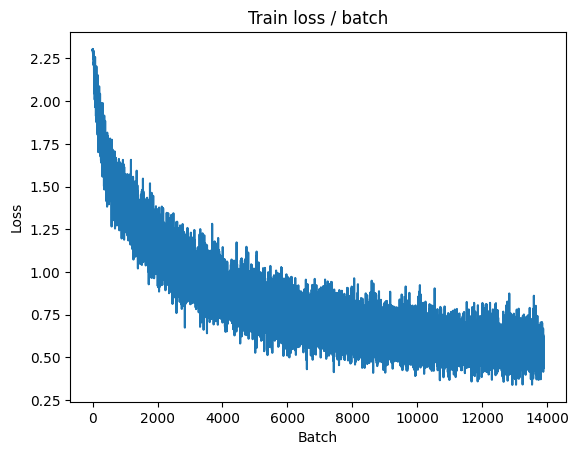


===============> Total time 21s	Avg loss 0.5439	Avg Prec@1 80.84 %	Avg Prec@5 99.15 %

[EVAL Batch 000/079]	Time 0.194s (0.194s)	Loss 0.5350 (0.5350)	Prec@1  82.0 ( 82.0)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.5950	Avg Prec@1 79.05 %	Avg Prec@5 98.89 %



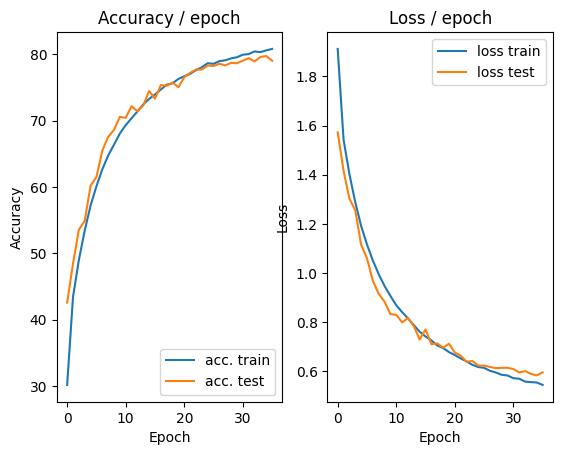

=== EPOCH 37 =====

[TRAIN Batch 000/391]	Time 0.239s (0.239s)	Loss 0.5648 (0.5648)	Prec@1  80.5 ( 80.5)	Prec@5 100.0 (100.0)


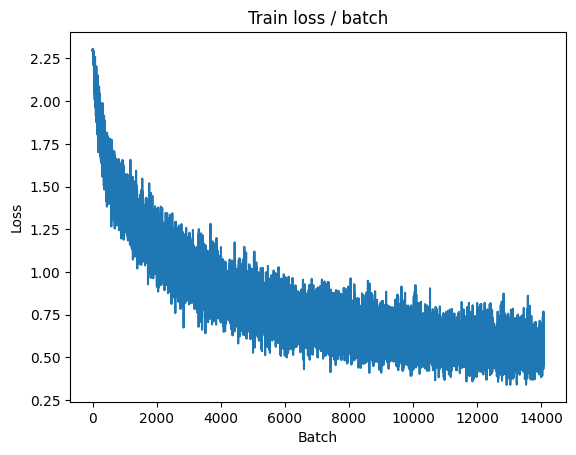

[TRAIN Batch 200/391]	Time 0.087s (0.054s)	Loss 0.5257 (0.5416)	Prec@1  82.8 ( 81.1)	Prec@5 100.0 ( 99.1)


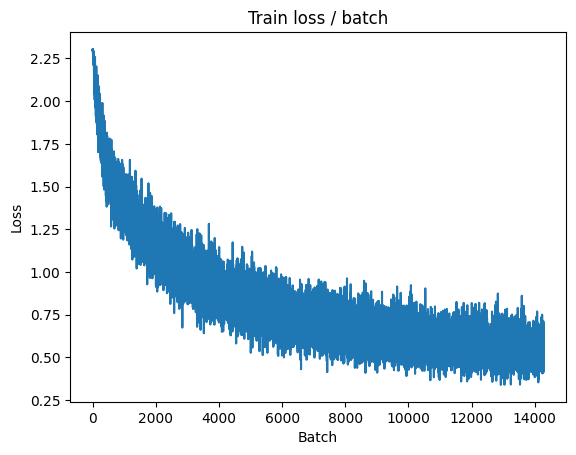


===============> Total time 21s	Avg loss 0.5444	Avg Prec@1 80.90 %	Avg Prec@5 99.09 %

[EVAL Batch 000/079]	Time 0.175s (0.175s)	Loss 0.5064 (0.5064)	Prec@1  85.9 ( 85.9)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.5838	Avg Prec@1 79.79 %	Avg Prec@5 98.89 %



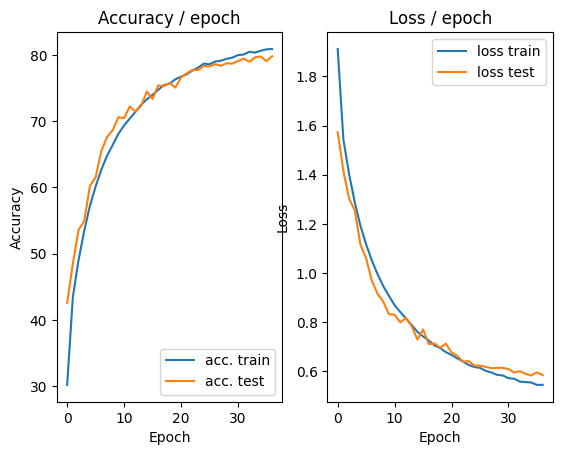

=== EPOCH 38 =====

[TRAIN Batch 000/391]	Time 0.264s (0.264s)	Loss 0.6707 (0.6707)	Prec@1  72.7 ( 72.7)	Prec@5  97.7 ( 97.7)


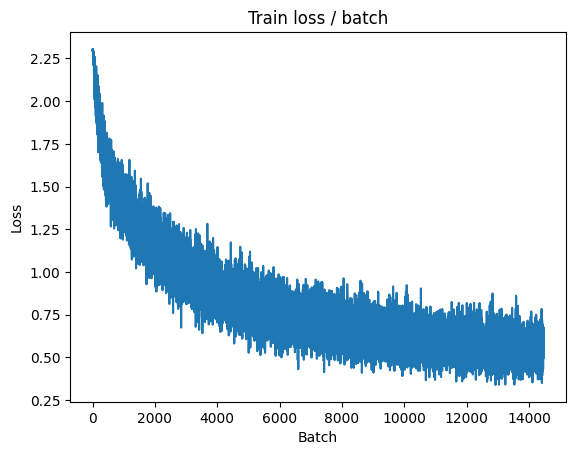

[TRAIN Batch 200/391]	Time 0.014s (0.055s)	Loss 0.5152 (0.5350)	Prec@1  81.2 ( 81.2)	Prec@5 100.0 ( 99.1)


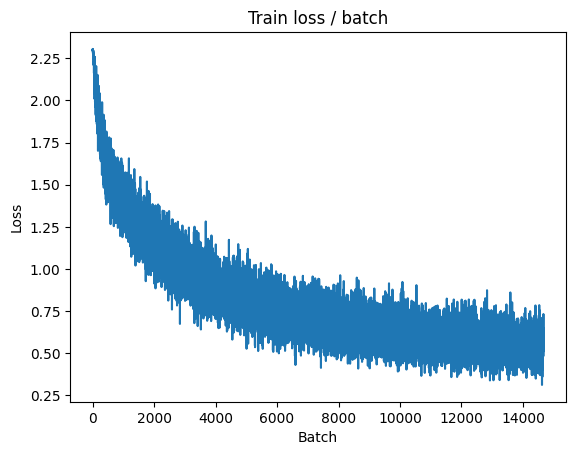


===============> Total time 20s	Avg loss 0.5340	Avg Prec@1 81.36 %	Avg Prec@5 99.15 %

[EVAL Batch 000/079]	Time 0.219s (0.219s)	Loss 0.5227 (0.5227)	Prec@1  85.2 ( 85.2)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.5854	Avg Prec@1 79.93 %	Avg Prec@5 98.88 %



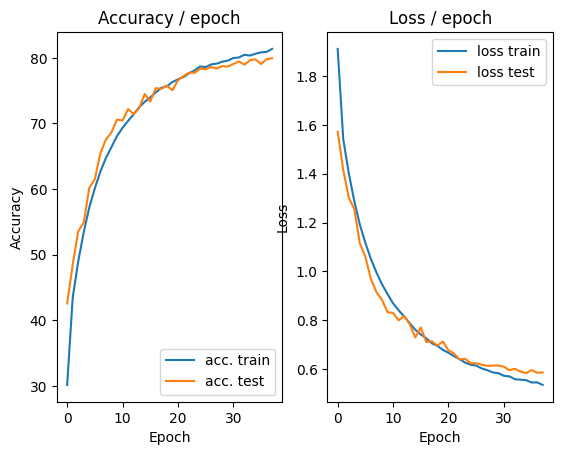

=== EPOCH 39 =====

[TRAIN Batch 000/391]	Time 0.289s (0.289s)	Loss 0.3096 (0.3096)	Prec@1  89.8 ( 89.8)	Prec@5 100.0 (100.0)


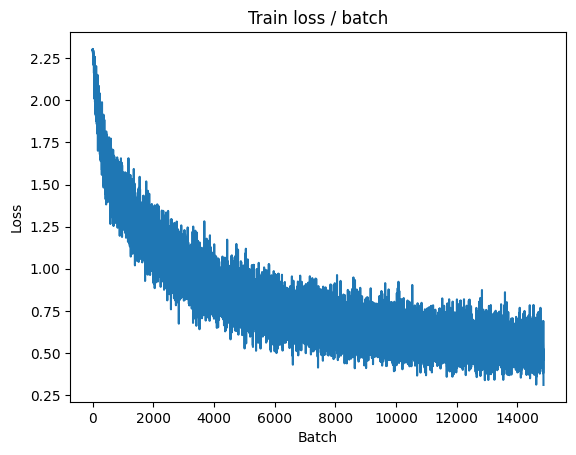

[TRAIN Batch 200/391]	Time 0.024s (0.054s)	Loss 0.5294 (0.5313)	Prec@1  81.2 ( 81.5)	Prec@5  99.2 ( 99.2)


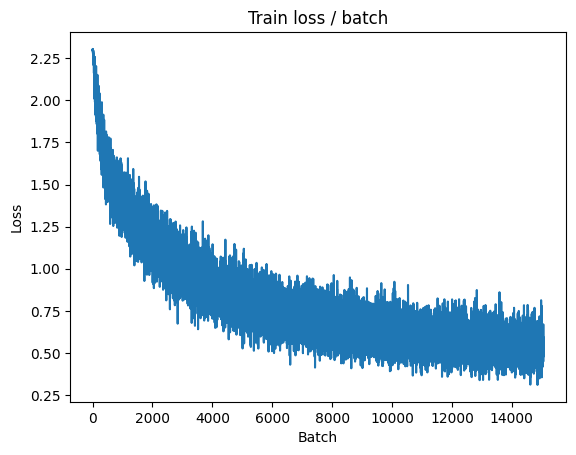


===============> Total time 19s	Avg loss 0.5308	Avg Prec@1 81.41 %	Avg Prec@5 99.19 %

[EVAL Batch 000/079]	Time 0.212s (0.212s)	Loss 0.5117 (0.5117)	Prec@1  86.7 ( 86.7)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.5864	Avg Prec@1 79.90 %	Avg Prec@5 98.94 %



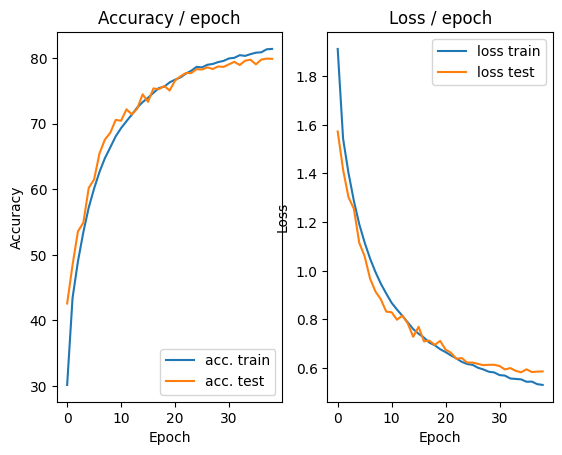

=== EPOCH 40 =====

[TRAIN Batch 000/391]	Time 0.259s (0.259s)	Loss 0.4299 (0.4299)	Prec@1  85.9 ( 85.9)	Prec@5  98.4 ( 98.4)


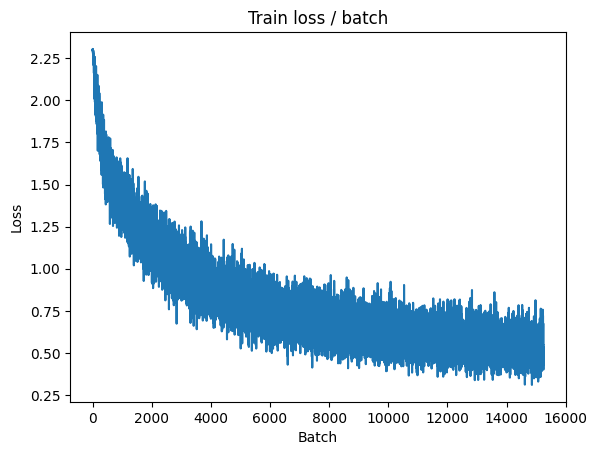

[TRAIN Batch 200/391]	Time 0.103s (0.052s)	Loss 0.5475 (0.5270)	Prec@1  77.3 ( 81.4)	Prec@5  99.2 ( 99.1)


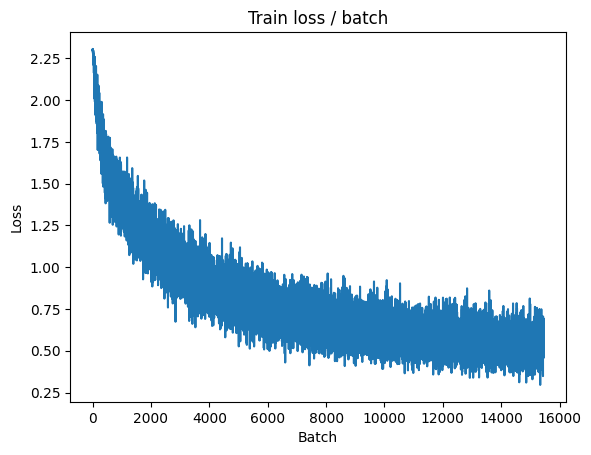


===============> Total time 19s	Avg loss 0.5262	Avg Prec@1 81.39 %	Avg Prec@5 99.12 %

[EVAL Batch 000/079]	Time 0.191s (0.191s)	Loss 0.5096 (0.5096)	Prec@1  85.2 ( 85.2)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.5791	Avg Prec@1 79.85 %	Avg Prec@5 98.97 %



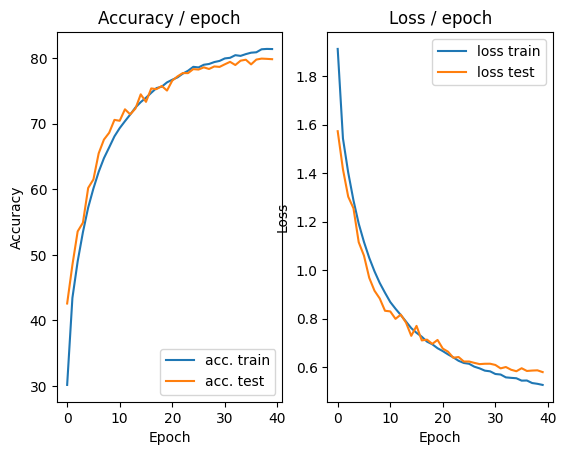

=== EPOCH 41 =====

[TRAIN Batch 000/391]	Time 0.274s (0.274s)	Loss 0.4374 (0.4374)	Prec@1  82.8 ( 82.8)	Prec@5 100.0 (100.0)


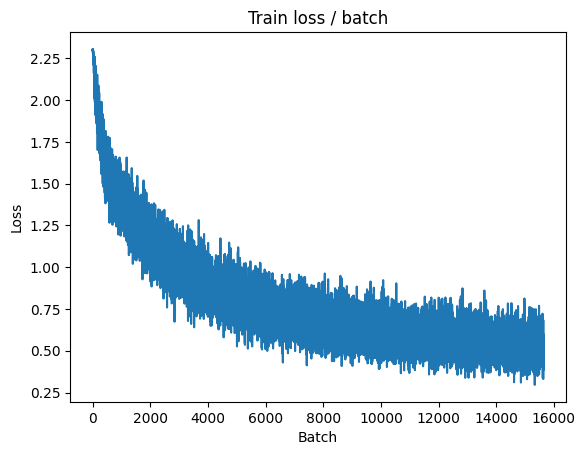

[TRAIN Batch 200/391]	Time 0.062s (0.049s)	Loss 0.6285 (0.5206)	Prec@1  81.2 ( 81.5)	Prec@5  98.4 ( 99.1)


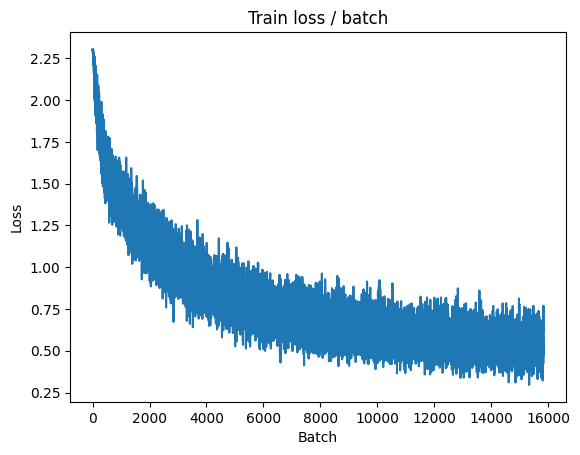


===============> Total time 19s	Avg loss 0.5198	Avg Prec@1 81.72 %	Avg Prec@5 99.12 %

[EVAL Batch 000/079]	Time 0.175s (0.175s)	Loss 0.5137 (0.5137)	Prec@1  84.4 ( 84.4)	Prec@5  97.7 ( 97.7)

===============> Total time 3s	Avg loss 0.5753	Avg Prec@1 80.07 %	Avg Prec@5 98.91 %



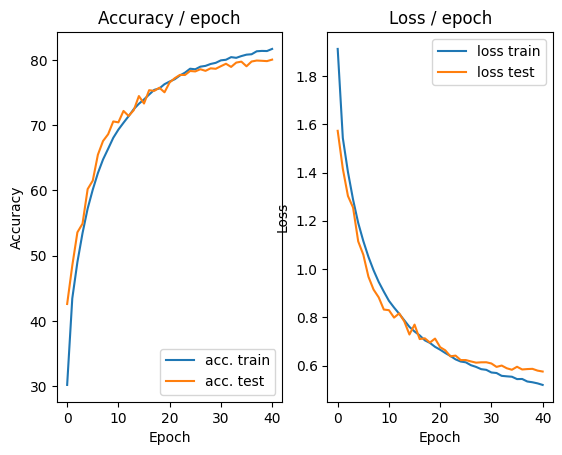

=== EPOCH 42 =====

[TRAIN Batch 000/391]	Time 0.299s (0.299s)	Loss 0.5500 (0.5500)	Prec@1  86.7 ( 86.7)	Prec@5  99.2 ( 99.2)


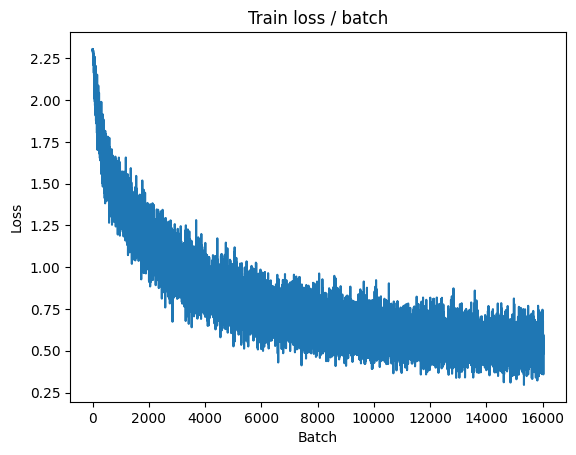

[TRAIN Batch 200/391]	Time 0.016s (0.054s)	Loss 0.4967 (0.5140)	Prec@1  81.2 ( 82.2)	Prec@5 100.0 ( 99.2)


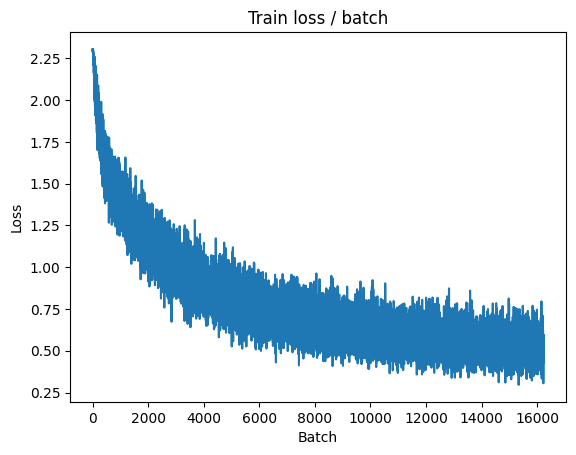


===============> Total time 21s	Avg loss 0.5152	Avg Prec@1 82.10 %	Avg Prec@5 99.17 %

[EVAL Batch 000/079]	Time 0.179s (0.179s)	Loss 0.5170 (0.5170)	Prec@1  86.7 ( 86.7)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.5773	Avg Prec@1 79.86 %	Avg Prec@5 98.98 %



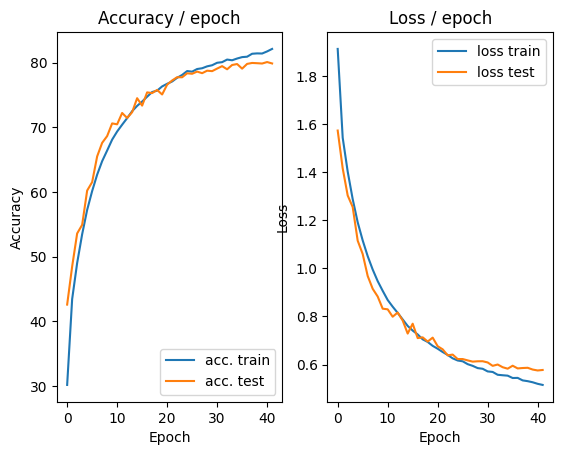

=== EPOCH 43 =====

[TRAIN Batch 000/391]	Time 0.243s (0.243s)	Loss 0.4338 (0.4338)	Prec@1  85.2 ( 85.2)	Prec@5  99.2 ( 99.2)


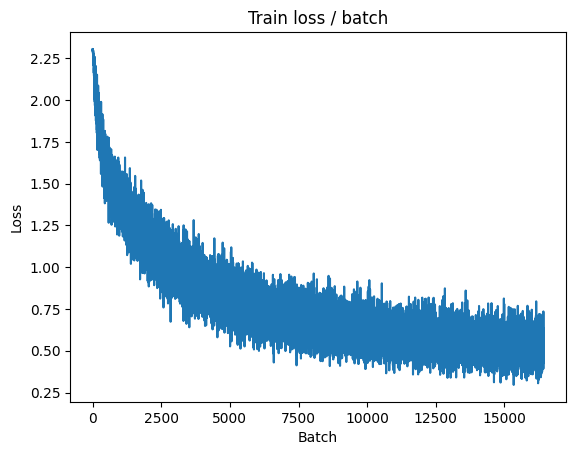

[TRAIN Batch 200/391]	Time 0.012s (0.054s)	Loss 0.4690 (0.5134)	Prec@1  85.9 ( 82.1)	Prec@5  97.7 ( 99.1)


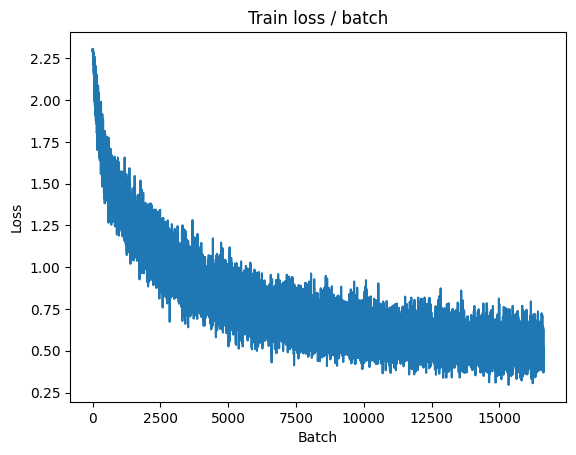


===============> Total time 21s	Avg loss 0.5129	Avg Prec@1 81.99 %	Avg Prec@5 99.16 %

[EVAL Batch 000/079]	Time 0.166s (0.166s)	Loss 0.4922 (0.4922)	Prec@1  86.7 ( 86.7)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.5704	Avg Prec@1 80.24 %	Avg Prec@5 98.98 %



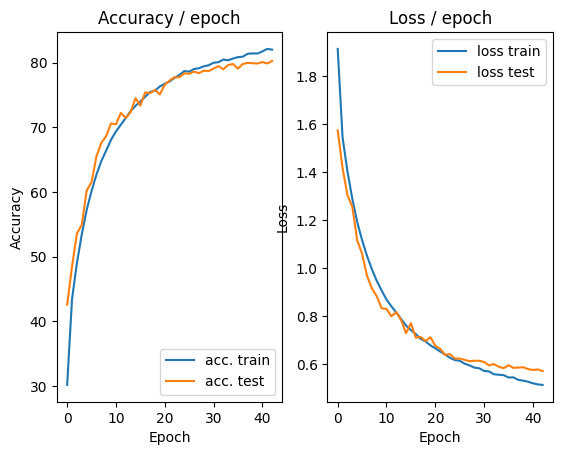

=== EPOCH 44 =====

[TRAIN Batch 000/391]	Time 0.236s (0.236s)	Loss 0.4836 (0.4836)	Prec@1  85.9 ( 85.9)	Prec@5  98.4 ( 98.4)


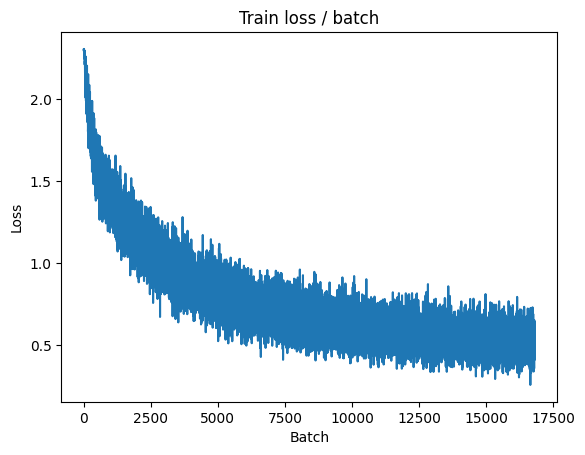

[TRAIN Batch 200/391]	Time 0.014s (0.055s)	Loss 0.5370 (0.5115)	Prec@1  79.7 ( 82.3)	Prec@5  99.2 ( 99.2)


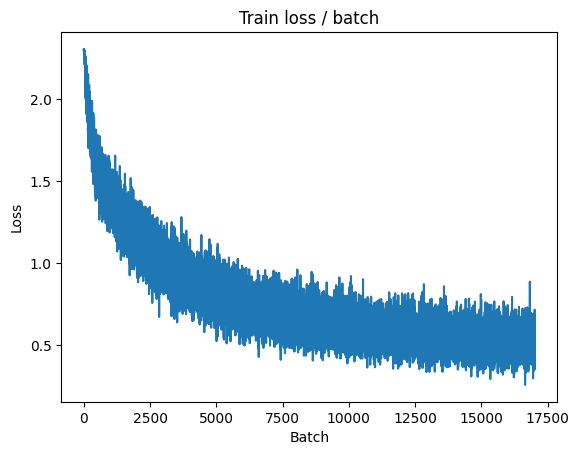


===============> Total time 21s	Avg loss 0.5093	Avg Prec@1 82.13 %	Avg Prec@5 99.25 %

[EVAL Batch 000/079]	Time 0.187s (0.187s)	Loss 0.4965 (0.4965)	Prec@1  85.9 ( 85.9)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.5672	Avg Prec@1 80.30 %	Avg Prec@5 98.91 %



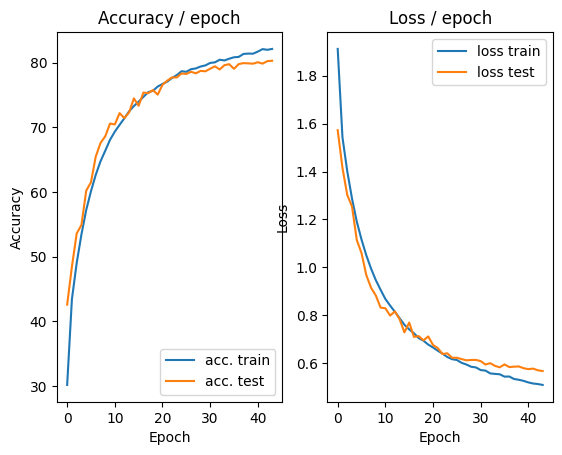

=== EPOCH 45 =====

[TRAIN Batch 000/391]	Time 0.240s (0.240s)	Loss 0.5629 (0.5629)	Prec@1  80.5 ( 80.5)	Prec@5  99.2 ( 99.2)


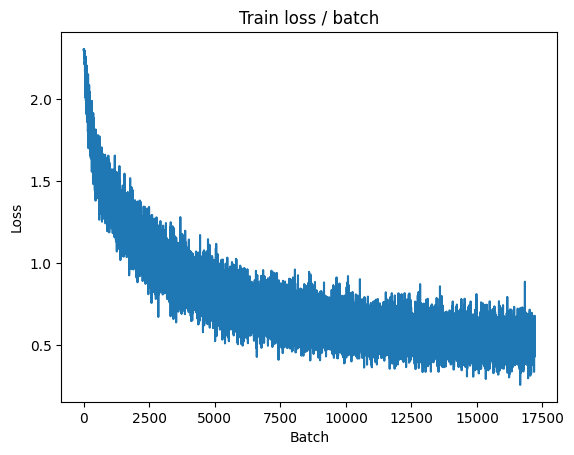

[TRAIN Batch 200/391]	Time 0.083s (0.055s)	Loss 0.4847 (0.5057)	Prec@1  83.6 ( 82.5)	Prec@5  99.2 ( 99.3)


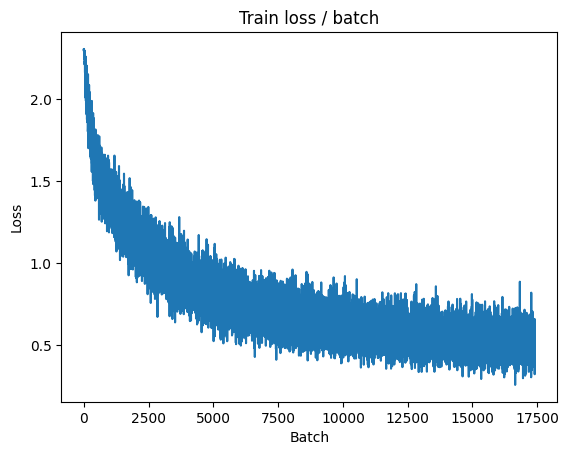


===============> Total time 21s	Avg loss 0.5095	Avg Prec@1 82.34 %	Avg Prec@5 99.25 %

[EVAL Batch 000/079]	Time 0.178s (0.178s)	Loss 0.5024 (0.5024)	Prec@1  85.9 ( 85.9)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.5661	Avg Prec@1 80.50 %	Avg Prec@5 98.92 %



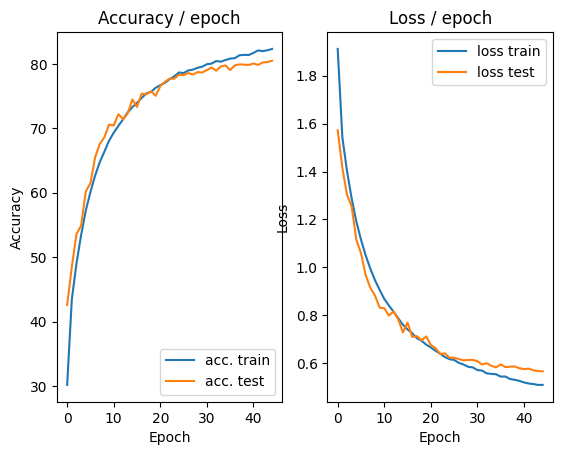

=== EPOCH 46 =====

[TRAIN Batch 000/391]	Time 0.264s (0.264s)	Loss 0.3553 (0.3553)	Prec@1  85.9 ( 85.9)	Prec@5 100.0 (100.0)


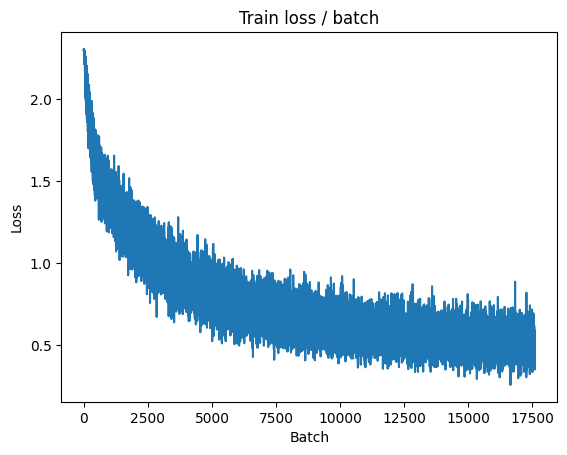

[TRAIN Batch 200/391]	Time 0.011s (0.054s)	Loss 0.5091 (0.5036)	Prec@1  81.2 ( 82.1)	Prec@5 100.0 ( 99.2)


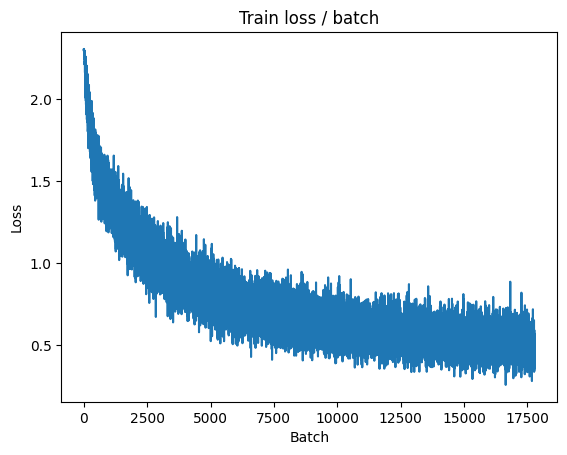


===============> Total time 20s	Avg loss 0.5020	Avg Prec@1 82.29 %	Avg Prec@5 99.23 %

[EVAL Batch 000/079]	Time 0.279s (0.279s)	Loss 0.5030 (0.5030)	Prec@1  86.7 ( 86.7)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.5653	Avg Prec@1 80.45 %	Avg Prec@5 98.92 %



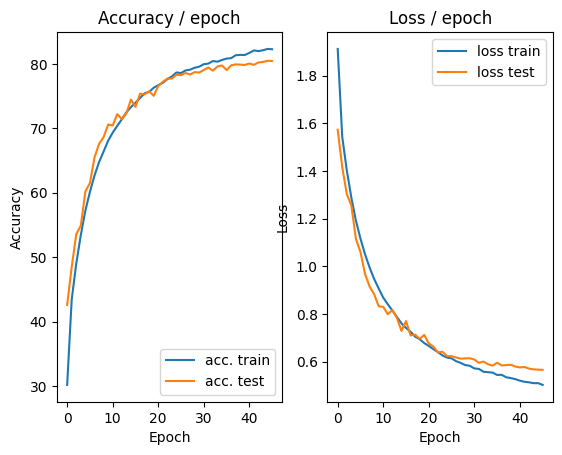

=== EPOCH 47 =====

[TRAIN Batch 000/391]	Time 0.288s (0.288s)	Loss 0.5792 (0.5792)	Prec@1  80.5 ( 80.5)	Prec@5  98.4 ( 98.4)


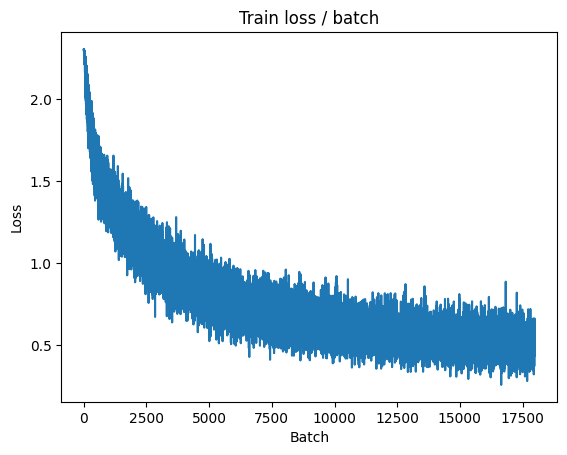

[TRAIN Batch 200/391]	Time 0.076s (0.054s)	Loss 0.5080 (0.5042)	Prec@1  79.7 ( 82.2)	Prec@5  99.2 ( 99.3)


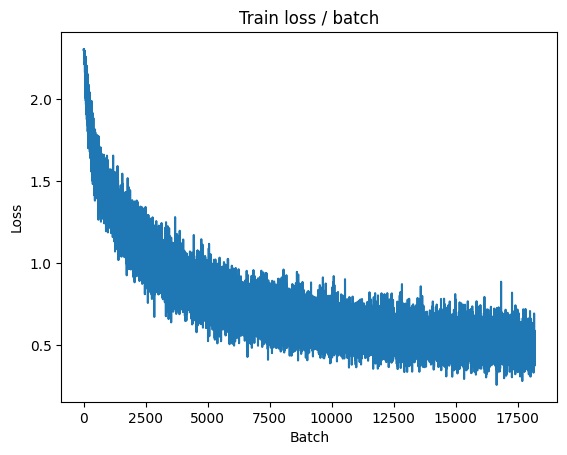


===============> Total time 19s	Avg loss 0.5016	Avg Prec@1 82.27 %	Avg Prec@5 99.24 %

[EVAL Batch 000/079]	Time 0.181s (0.181s)	Loss 0.4894 (0.4894)	Prec@1  85.9 ( 85.9)	Prec@5  98.4 ( 98.4)

===============> Total time 4s	Avg loss 0.5643	Avg Prec@1 80.46 %	Avg Prec@5 98.97 %



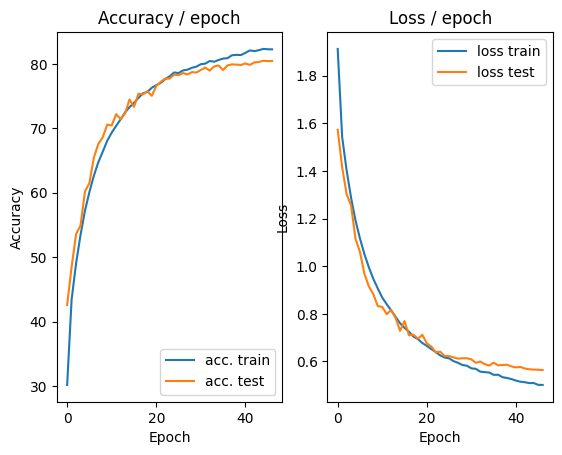

=== EPOCH 48 =====

[TRAIN Batch 000/391]	Time 0.310s (0.310s)	Loss 0.5214 (0.5214)	Prec@1  81.2 ( 81.2)	Prec@5 100.0 (100.0)


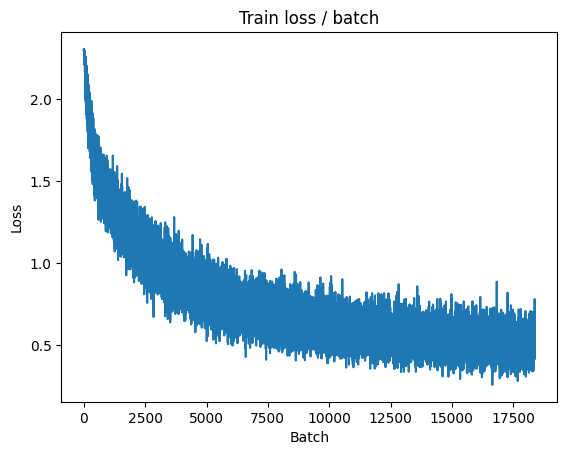

[TRAIN Batch 200/391]	Time 0.125s (0.050s)	Loss 0.5585 (0.4976)	Prec@1  80.5 ( 82.7)	Prec@5  98.4 ( 99.3)


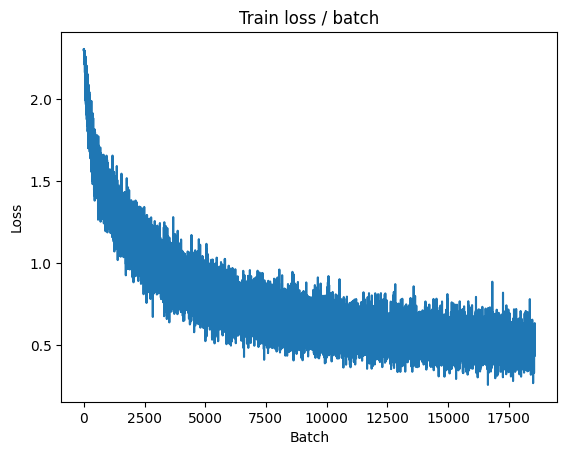


===============> Total time 19s	Avg loss 0.4990	Avg Prec@1 82.55 %	Avg Prec@5 99.24 %

[EVAL Batch 000/079]	Time 0.205s (0.205s)	Loss 0.5087 (0.5087)	Prec@1  85.9 ( 85.9)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.5627	Avg Prec@1 80.72 %	Avg Prec@5 98.96 %



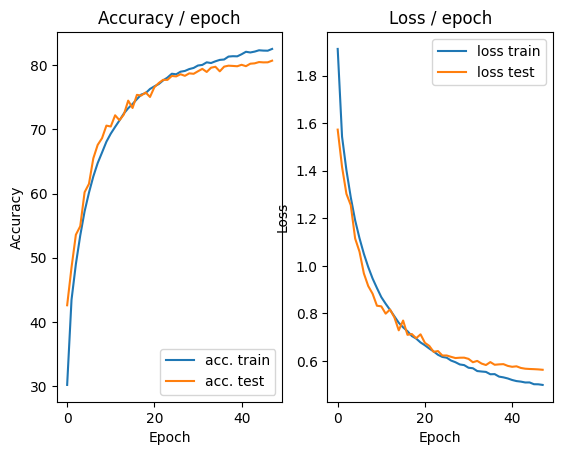

=== EPOCH 49 =====

[TRAIN Batch 000/391]	Time 0.297s (0.297s)	Loss 0.4797 (0.4797)	Prec@1  80.5 ( 80.5)	Prec@5 100.0 (100.0)


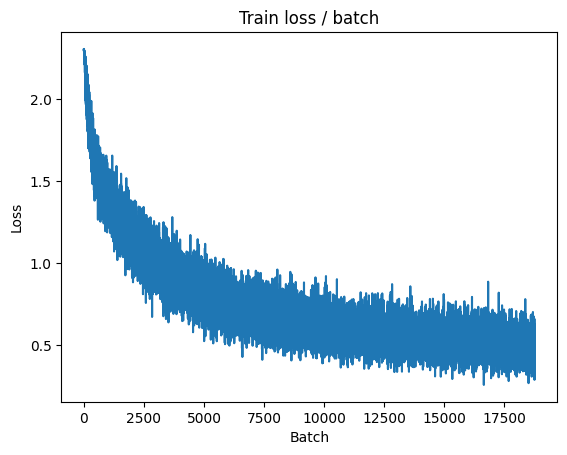

[TRAIN Batch 200/391]	Time 0.015s (0.052s)	Loss 0.4645 (0.5005)	Prec@1  82.8 ( 82.4)	Prec@5  98.4 ( 99.3)


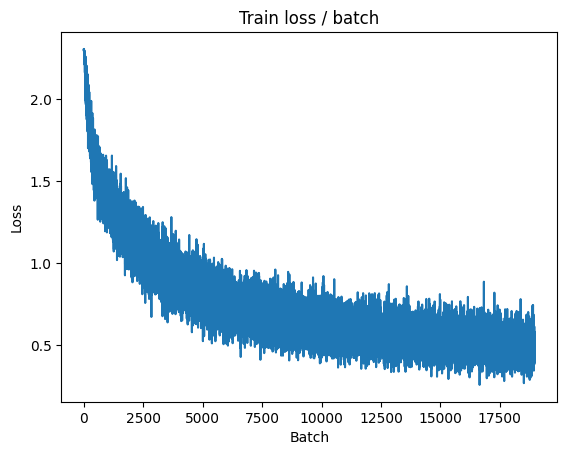


===============> Total time 20s	Avg loss 0.4998	Avg Prec@1 82.51 %	Avg Prec@5 99.24 %

[EVAL Batch 000/079]	Time 0.186s (0.186s)	Loss 0.5037 (0.5037)	Prec@1  85.2 ( 85.2)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.5594	Avg Prec@1 80.62 %	Avg Prec@5 99.08 %



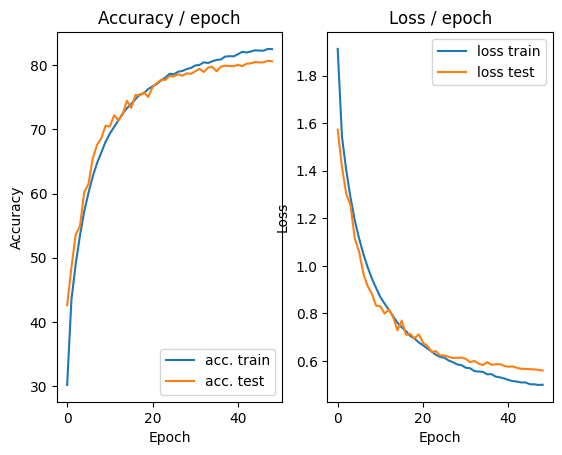

=== EPOCH 50 =====

[TRAIN Batch 000/391]	Time 0.286s (0.286s)	Loss 0.5106 (0.5106)	Prec@1  79.7 ( 79.7)	Prec@5  99.2 ( 99.2)


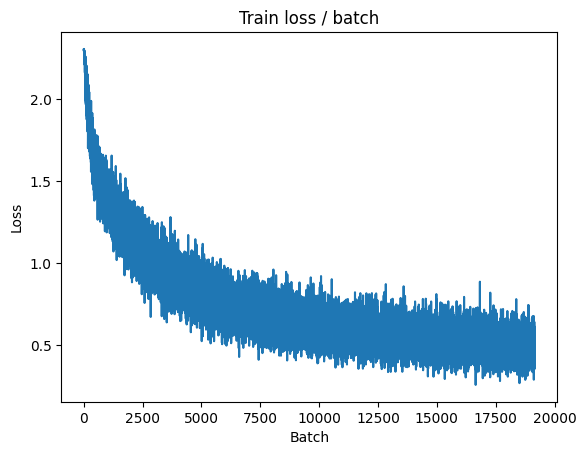

[TRAIN Batch 200/391]	Time 0.083s (0.054s)	Loss 0.4736 (0.5013)	Prec@1  82.8 ( 82.4)	Prec@5  99.2 ( 99.2)


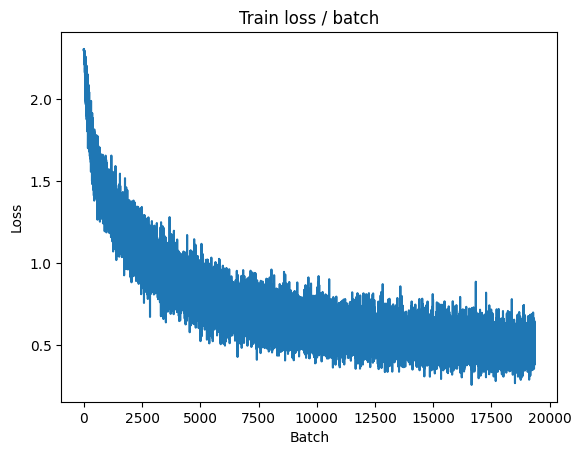


===============> Total time 21s	Avg loss 0.4948	Avg Prec@1 82.73 %	Avg Prec@5 99.26 %

[EVAL Batch 000/079]	Time 0.201s (0.201s)	Loss 0.4965 (0.4965)	Prec@1  86.7 ( 86.7)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.5632	Avg Prec@1 80.60 %	Avg Prec@5 99.00 %



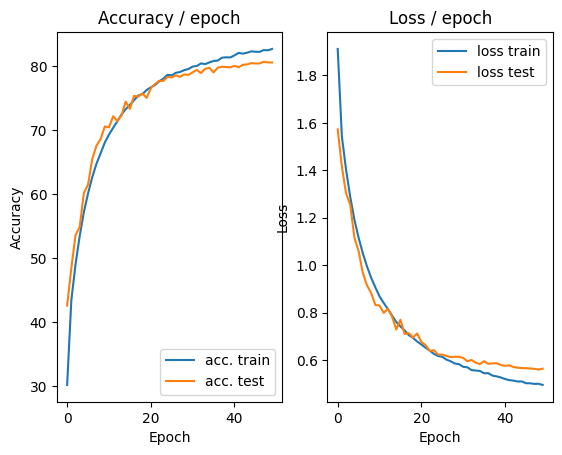

=== EPOCH 51 =====

[TRAIN Batch 000/391]	Time 0.271s (0.271s)	Loss 0.5751 (0.5751)	Prec@1  80.5 ( 80.5)	Prec@5  99.2 ( 99.2)


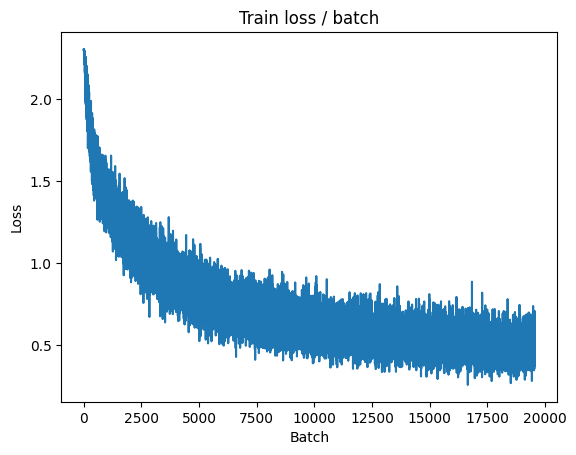

[TRAIN Batch 200/391]	Time 0.018s (0.054s)	Loss 0.4859 (0.4815)	Prec@1  82.8 ( 83.1)	Prec@5 100.0 ( 99.4)


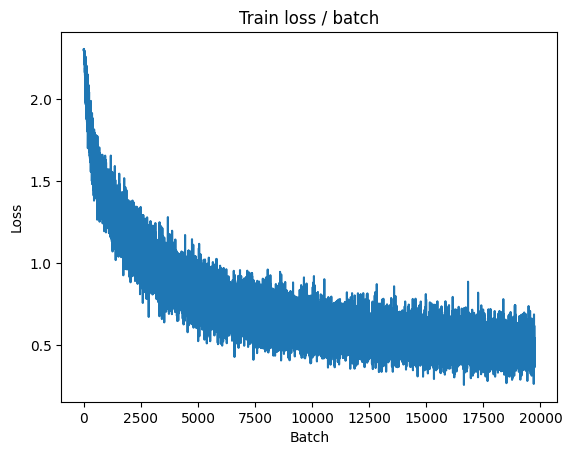


===============> Total time 21s	Avg loss 0.4898	Avg Prec@1 82.88 %	Avg Prec@5 99.26 %

[EVAL Batch 000/079]	Time 0.191s (0.191s)	Loss 0.5056 (0.5056)	Prec@1  84.4 ( 84.4)	Prec@5  97.7 ( 97.7)

===============> Total time 3s	Avg loss 0.5561	Avg Prec@1 80.70 %	Avg Prec@5 99.01 %



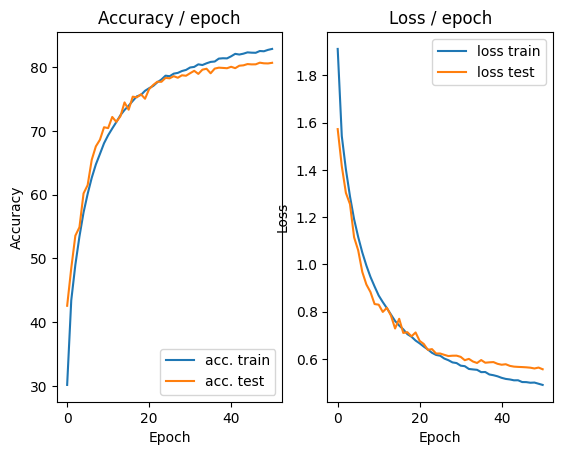

=== EPOCH 52 =====

[TRAIN Batch 000/391]	Time 0.298s (0.298s)	Loss 0.4732 (0.4732)	Prec@1  85.2 ( 85.2)	Prec@5  99.2 ( 99.2)


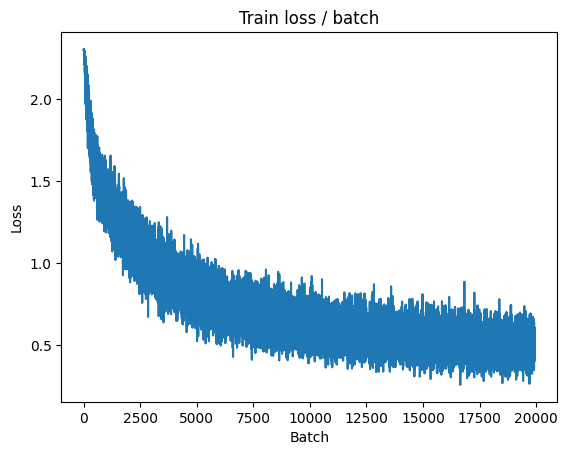

[TRAIN Batch 200/391]	Time 0.074s (0.054s)	Loss 0.5893 (0.4881)	Prec@1  82.8 ( 82.8)	Prec@5  97.7 ( 99.4)


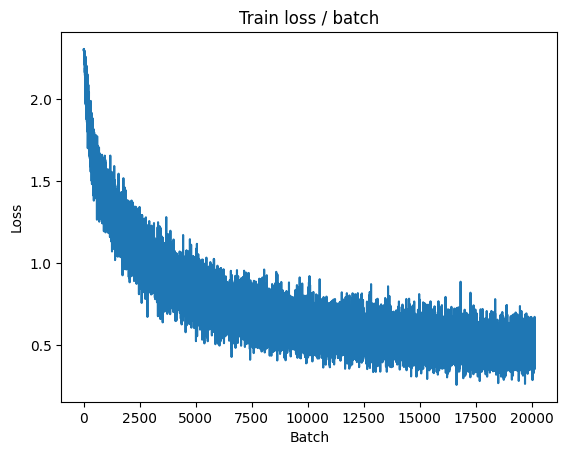


===============> Total time 21s	Avg loss 0.4904	Avg Prec@1 82.83 %	Avg Prec@5 99.26 %

[EVAL Batch 000/079]	Time 0.192s (0.192s)	Loss 0.4990 (0.4990)	Prec@1  87.5 ( 87.5)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.5599	Avg Prec@1 80.90 %	Avg Prec@5 99.04 %



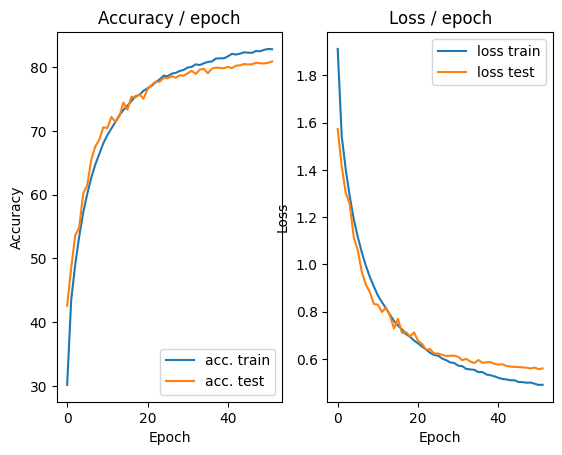

=== EPOCH 53 =====

[TRAIN Batch 000/391]	Time 0.204s (0.204s)	Loss 0.5343 (0.5343)	Prec@1  80.5 ( 80.5)	Prec@5 100.0 (100.0)


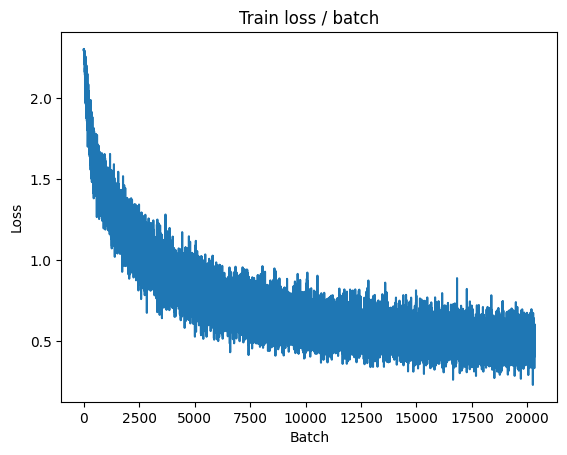

[TRAIN Batch 200/391]	Time 0.082s (0.055s)	Loss 0.4827 (0.4890)	Prec@1  89.8 ( 83.1)	Prec@5  99.2 ( 99.4)


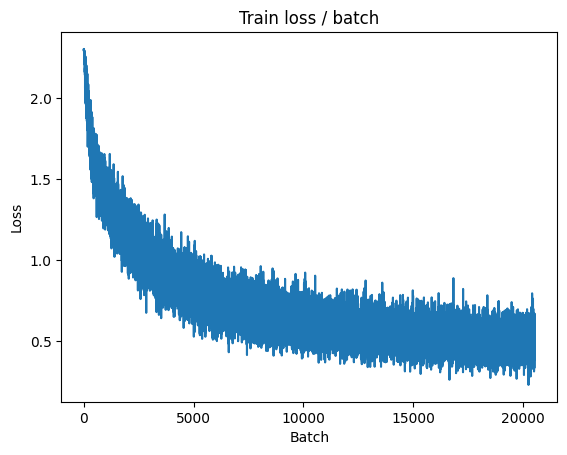


===============> Total time 21s	Avg loss 0.4915	Avg Prec@1 82.88 %	Avg Prec@5 99.32 %

[EVAL Batch 000/079]	Time 0.203s (0.203s)	Loss 0.4997 (0.4997)	Prec@1  85.2 ( 85.2)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.5559	Avg Prec@1 80.85 %	Avg Prec@5 98.96 %



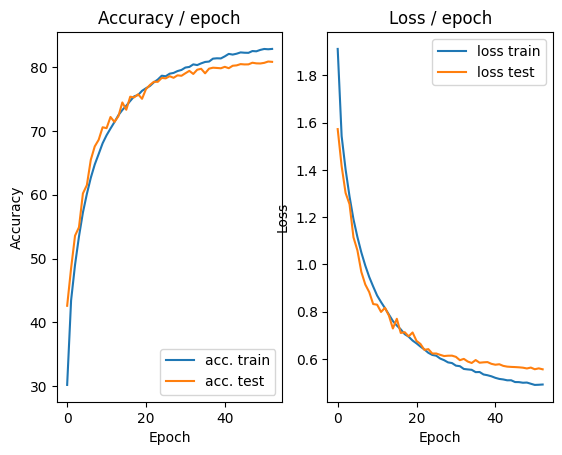

=== EPOCH 54 =====

[TRAIN Batch 000/391]	Time 0.279s (0.279s)	Loss 0.3793 (0.3793)	Prec@1  88.3 ( 88.3)	Prec@5  99.2 ( 99.2)


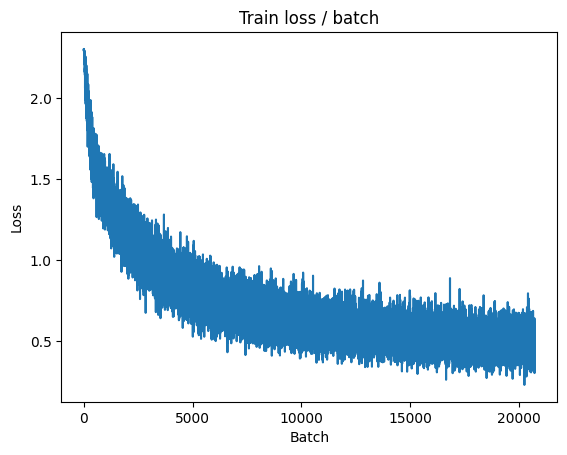

[TRAIN Batch 200/391]	Time 0.063s (0.055s)	Loss 0.4315 (0.4795)	Prec@1  86.7 ( 83.1)	Prec@5  99.2 ( 99.3)


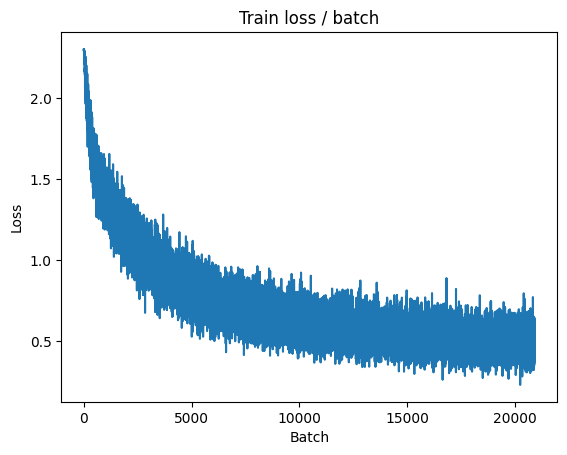


===============> Total time 20s	Avg loss 0.4838	Avg Prec@1 82.96 %	Avg Prec@5 99.29 %

[EVAL Batch 000/079]	Time 0.237s (0.237s)	Loss 0.4983 (0.4983)	Prec@1  86.7 ( 86.7)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.5559	Avg Prec@1 80.77 %	Avg Prec@5 98.99 %



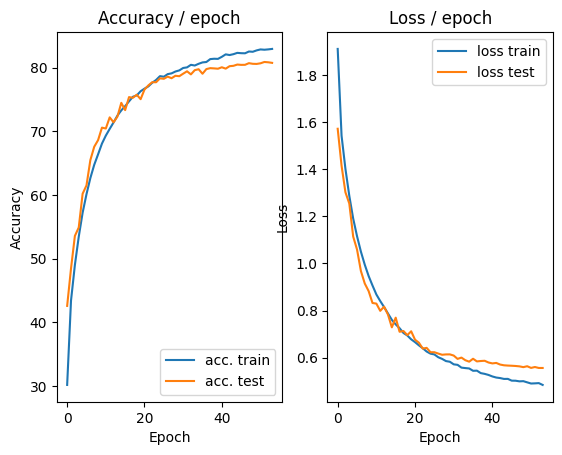

=== EPOCH 55 =====

[TRAIN Batch 000/391]	Time 0.281s (0.281s)	Loss 0.6102 (0.6102)	Prec@1  77.3 ( 77.3)	Prec@5  98.4 ( 98.4)


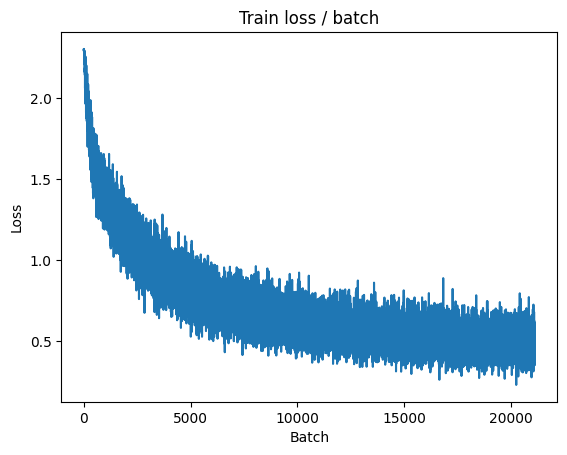

[TRAIN Batch 200/391]	Time 0.009s (0.054s)	Loss 0.5291 (0.4845)	Prec@1  81.2 ( 82.9)	Prec@5 100.0 ( 99.2)


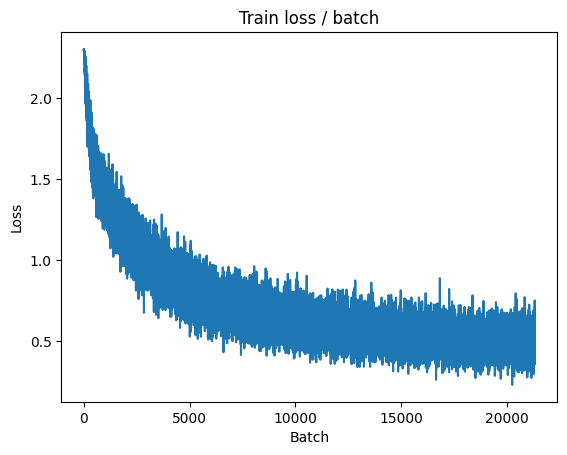


===============> Total time 20s	Avg loss 0.4839	Avg Prec@1 82.94 %	Avg Prec@5 99.29 %

[EVAL Batch 000/079]	Time 0.282s (0.282s)	Loss 0.5036 (0.5036)	Prec@1  85.9 ( 85.9)	Prec@5  98.4 ( 98.4)

===============> Total time 4s	Avg loss 0.5559	Avg Prec@1 80.87 %	Avg Prec@5 98.94 %



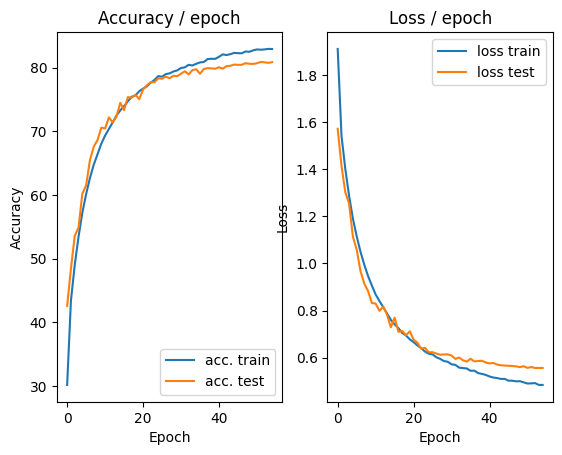

=== EPOCH 56 =====

[TRAIN Batch 000/391]	Time 0.298s (0.298s)	Loss 0.4537 (0.4537)	Prec@1  83.6 ( 83.6)	Prec@5  99.2 ( 99.2)


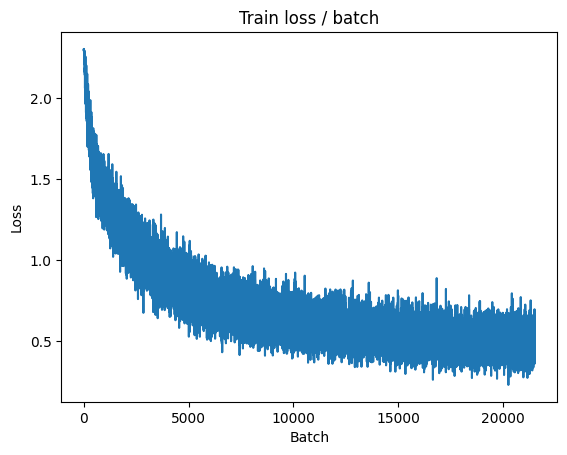

[TRAIN Batch 200/391]	Time 0.122s (0.053s)	Loss 0.3894 (0.4825)	Prec@1  83.6 ( 83.0)	Prec@5  99.2 ( 99.2)


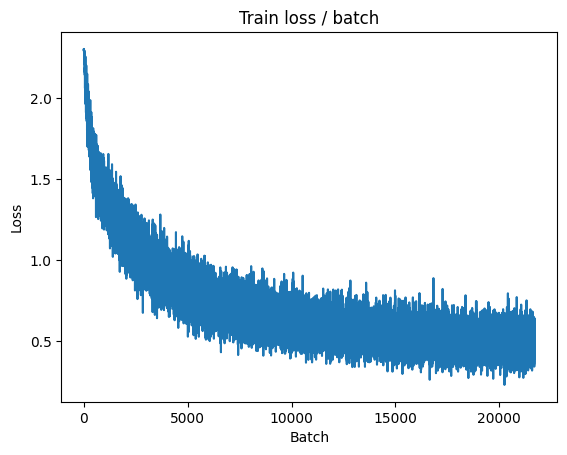


===============> Total time 20s	Avg loss 0.4786	Avg Prec@1 83.16 %	Avg Prec@5 99.30 %

[EVAL Batch 000/079]	Time 0.203s (0.203s)	Loss 0.5008 (0.5008)	Prec@1  86.7 ( 86.7)	Prec@5  97.7 ( 97.7)

===============> Total time 3s	Avg loss 0.5568	Avg Prec@1 80.92 %	Avg Prec@5 99.04 %



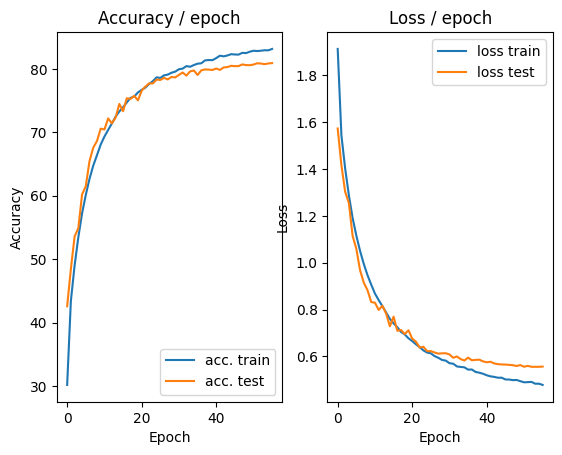

=== EPOCH 57 =====

[TRAIN Batch 000/391]	Time 0.301s (0.301s)	Loss 0.4188 (0.4188)	Prec@1  88.3 ( 88.3)	Prec@5 100.0 (100.0)


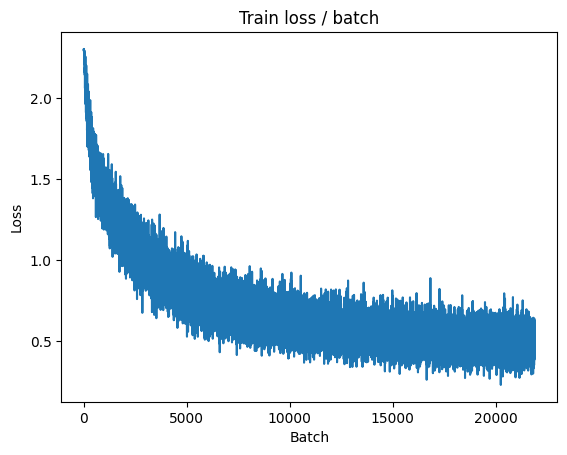

[TRAIN Batch 200/391]	Time 0.086s (0.049s)	Loss 0.4394 (0.4845)	Prec@1  84.4 ( 83.0)	Prec@5 100.0 ( 99.4)


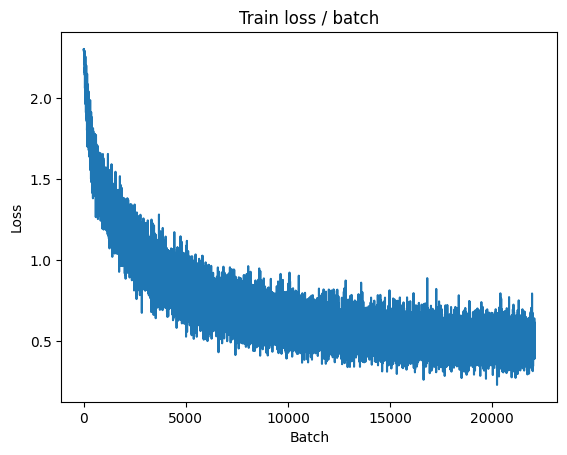


===============> Total time 19s	Avg loss 0.4824	Avg Prec@1 83.13 %	Avg Prec@5 99.34 %

[EVAL Batch 000/079]	Time 0.221s (0.221s)	Loss 0.4963 (0.4963)	Prec@1  87.5 ( 87.5)	Prec@5  97.7 ( 97.7)

===============> Total time 3s	Avg loss 0.5540	Avg Prec@1 80.91 %	Avg Prec@5 98.97 %



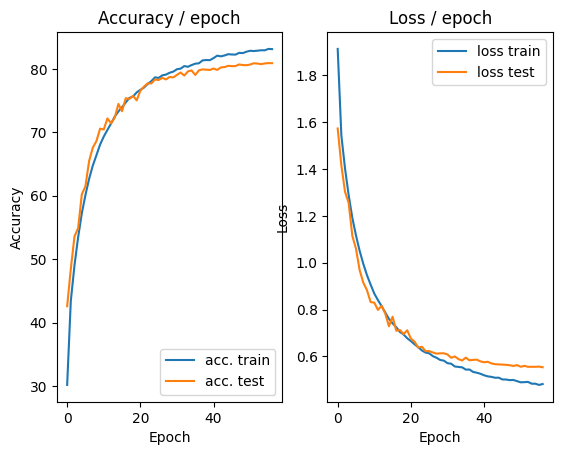

=== EPOCH 58 =====

[TRAIN Batch 000/391]	Time 0.311s (0.311s)	Loss 0.4868 (0.4868)	Prec@1  84.4 ( 84.4)	Prec@5 100.0 (100.0)


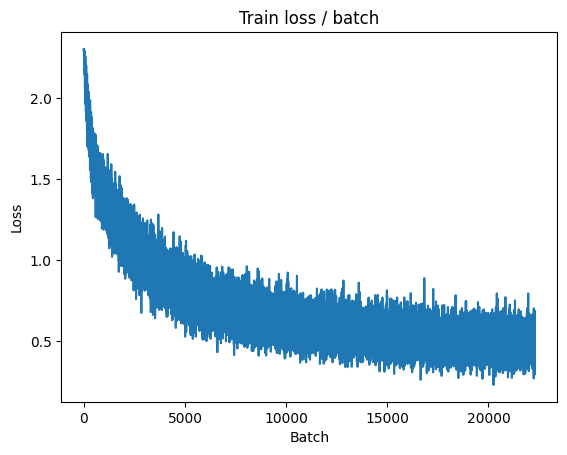

[TRAIN Batch 200/391]	Time 0.074s (0.052s)	Loss 0.4953 (0.4779)	Prec@1  87.5 ( 83.3)	Prec@5  99.2 ( 99.3)


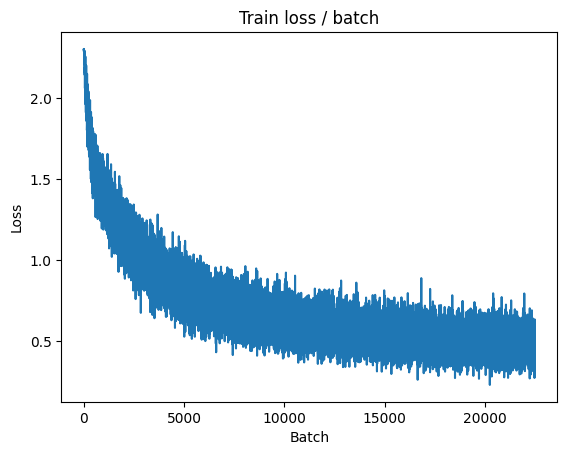


===============> Total time 20s	Avg loss 0.4787	Avg Prec@1 83.20 %	Avg Prec@5 99.33 %

[EVAL Batch 000/079]	Time 0.171s (0.171s)	Loss 0.4958 (0.4958)	Prec@1  86.7 ( 86.7)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.5531	Avg Prec@1 81.02 %	Avg Prec@5 99.03 %



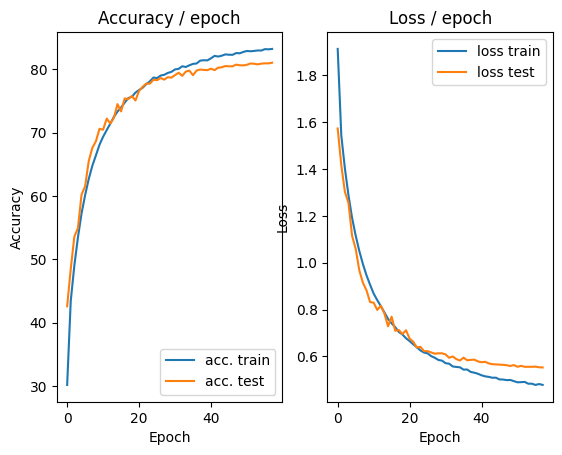

=== EPOCH 59 =====

[TRAIN Batch 000/391]	Time 0.291s (0.291s)	Loss 0.4968 (0.4968)	Prec@1  83.6 ( 83.6)	Prec@5 100.0 (100.0)


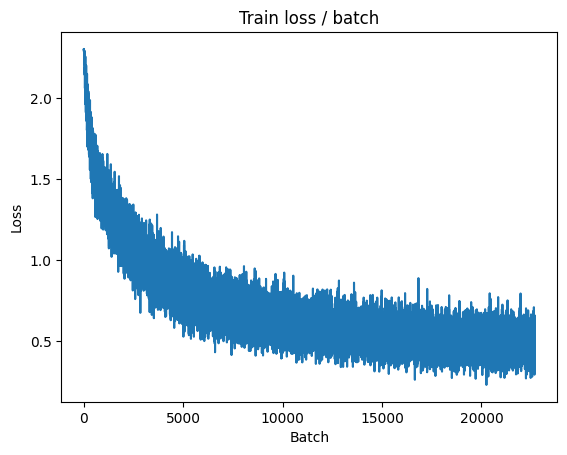

[TRAIN Batch 200/391]	Time 0.061s (0.055s)	Loss 0.5457 (0.4767)	Prec@1  81.2 ( 83.4)	Prec@5  99.2 ( 99.3)


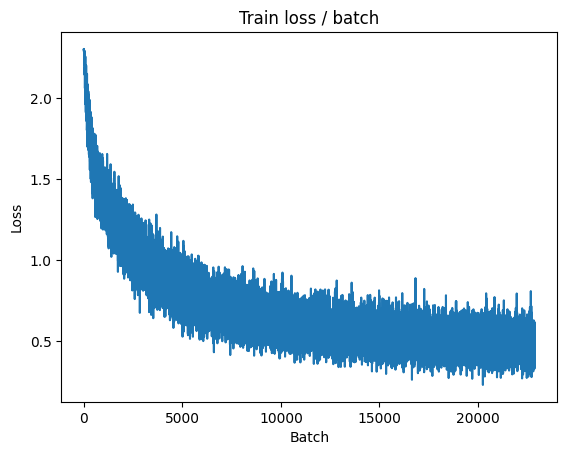


===============> Total time 21s	Avg loss 0.4762	Avg Prec@1 83.37 %	Avg Prec@5 99.30 %

[EVAL Batch 000/079]	Time 0.209s (0.209s)	Loss 0.4856 (0.4856)	Prec@1  86.7 ( 86.7)	Prec@5  96.9 ( 96.9)

===============> Total time 3s	Avg loss 0.5537	Avg Prec@1 81.01 %	Avg Prec@5 98.92 %



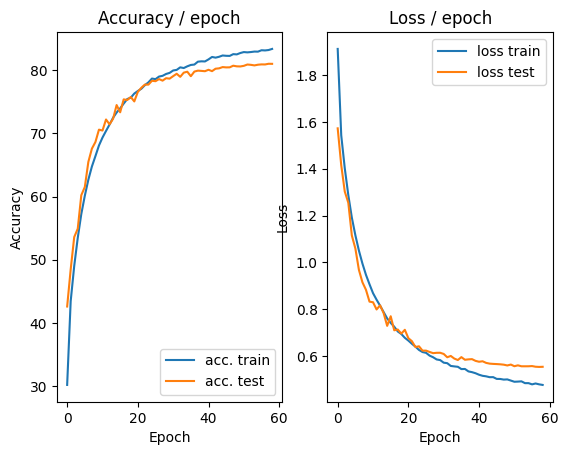

=== EPOCH 60 =====

[TRAIN Batch 000/391]	Time 0.320s (0.320s)	Loss 0.4272 (0.4272)	Prec@1  82.8 ( 82.8)	Prec@5 100.0 (100.0)


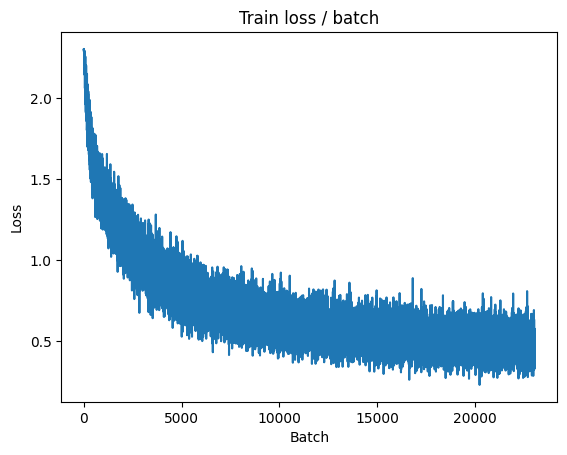

[TRAIN Batch 200/391]	Time 0.078s (0.055s)	Loss 0.6294 (0.4716)	Prec@1  78.1 ( 83.5)	Prec@5  99.2 ( 99.4)


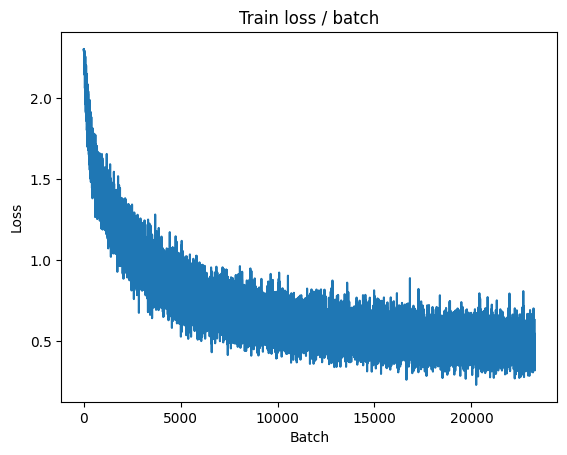


===============> Total time 21s	Avg loss 0.4727	Avg Prec@1 83.44 %	Avg Prec@5 99.34 %

[EVAL Batch 000/079]	Time 0.209s (0.209s)	Loss 0.4822 (0.4822)	Prec@1  87.5 ( 87.5)	Prec@5  97.7 ( 97.7)

===============> Total time 3s	Avg loss 0.5514	Avg Prec@1 81.04 %	Avg Prec@5 98.99 %



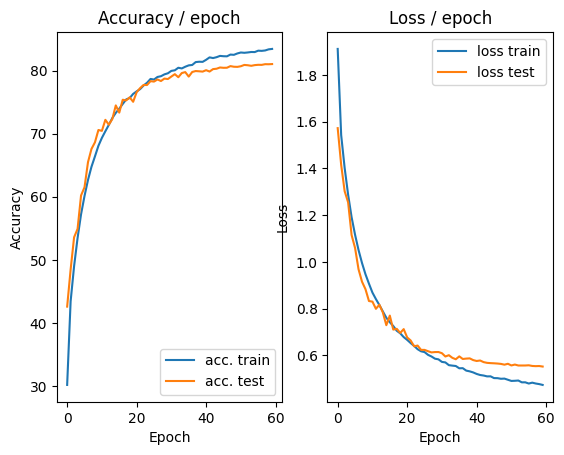

=== EPOCH 61 =====

[TRAIN Batch 000/391]	Time 0.199s (0.199s)	Loss 0.5231 (0.5231)	Prec@1  80.5 ( 80.5)	Prec@5  99.2 ( 99.2)


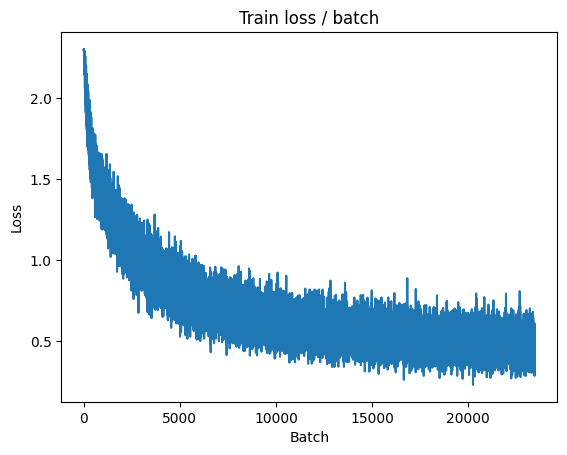

[TRAIN Batch 200/391]	Time 0.069s (0.055s)	Loss 0.5532 (0.4729)	Prec@1  78.1 ( 83.3)	Prec@5 100.0 ( 99.4)


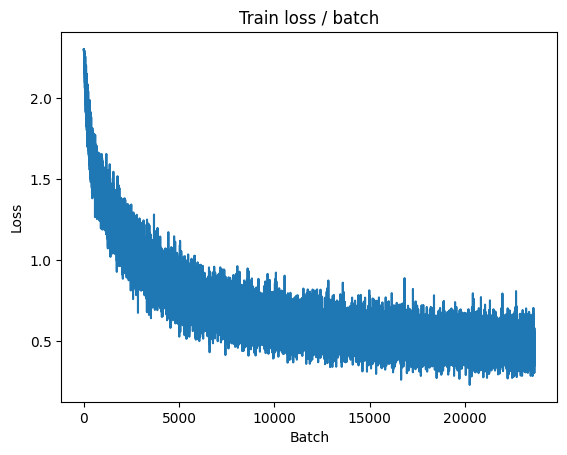


===============> Total time 21s	Avg loss 0.4729	Avg Prec@1 83.45 %	Avg Prec@5 99.37 %

[EVAL Batch 000/079]	Time 0.185s (0.185s)	Loss 0.4922 (0.4922)	Prec@1  86.7 ( 86.7)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.5528	Avg Prec@1 80.82 %	Avg Prec@5 98.92 %



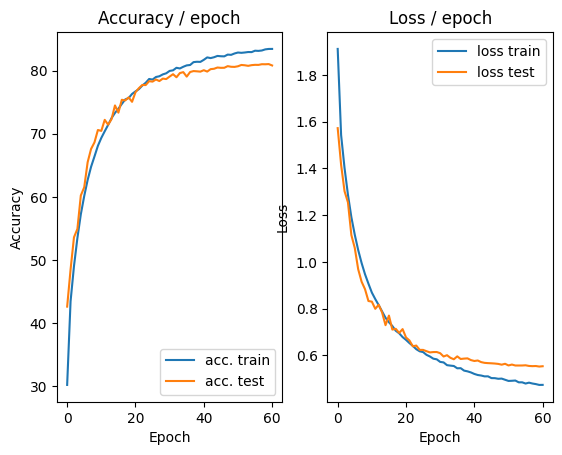

=== EPOCH 62 =====

[TRAIN Batch 000/391]	Time 0.281s (0.281s)	Loss 0.5670 (0.5670)	Prec@1  78.9 ( 78.9)	Prec@5  99.2 ( 99.2)


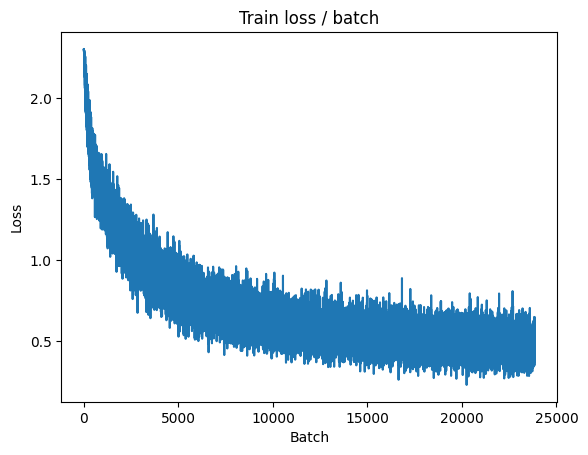

[TRAIN Batch 200/391]	Time 0.015s (0.054s)	Loss 0.3977 (0.4700)	Prec@1  89.1 ( 83.3)	Prec@5 100.0 ( 99.3)


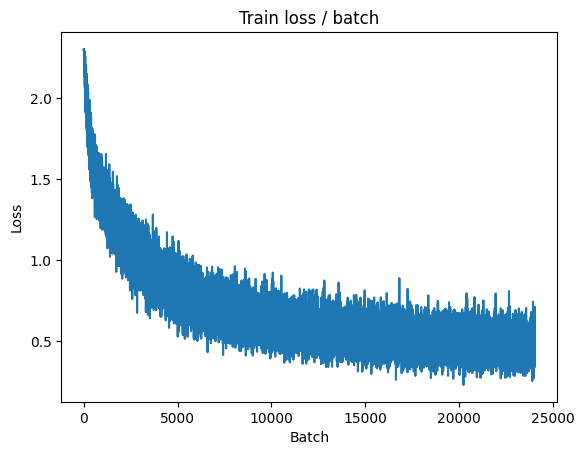


===============> Total time 20s	Avg loss 0.4723	Avg Prec@1 83.38 %	Avg Prec@5 99.32 %

[EVAL Batch 000/079]	Time 0.294s (0.294s)	Loss 0.4832 (0.4832)	Prec@1  86.7 ( 86.7)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.5490	Avg Prec@1 81.01 %	Avg Prec@5 99.05 %



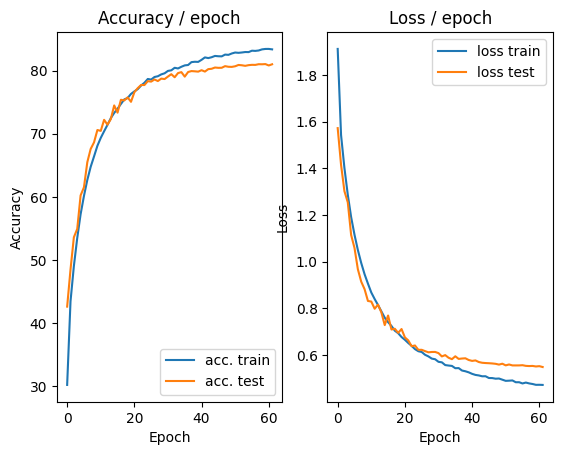

=== EPOCH 63 =====

[TRAIN Batch 000/391]	Time 0.254s (0.254s)	Loss 0.5621 (0.5621)	Prec@1  86.7 ( 86.7)	Prec@5  98.4 ( 98.4)


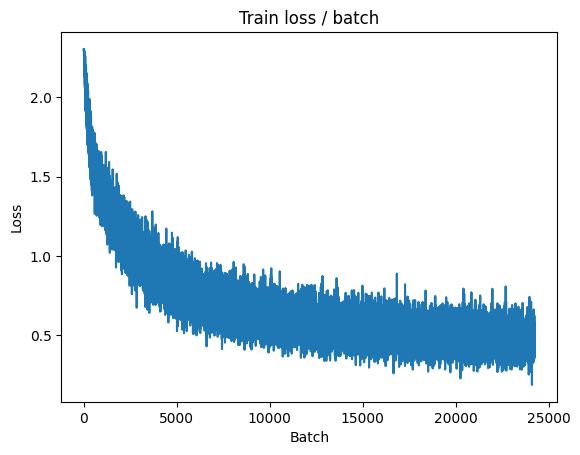

[TRAIN Batch 200/391]	Time 0.076s (0.054s)	Loss 0.4084 (0.4650)	Prec@1  85.9 ( 83.8)	Prec@5  99.2 ( 99.3)


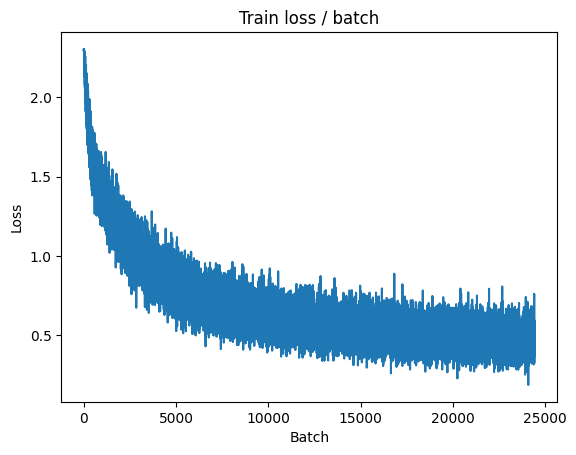


===============> Total time 19s	Avg loss 0.4723	Avg Prec@1 83.52 %	Avg Prec@5 99.34 %

[EVAL Batch 000/079]	Time 0.169s (0.169s)	Loss 0.4921 (0.4921)	Prec@1  85.2 ( 85.2)	Prec@5  98.4 ( 98.4)

===============> Total time 4s	Avg loss 0.5484	Avg Prec@1 81.16 %	Avg Prec@5 99.04 %



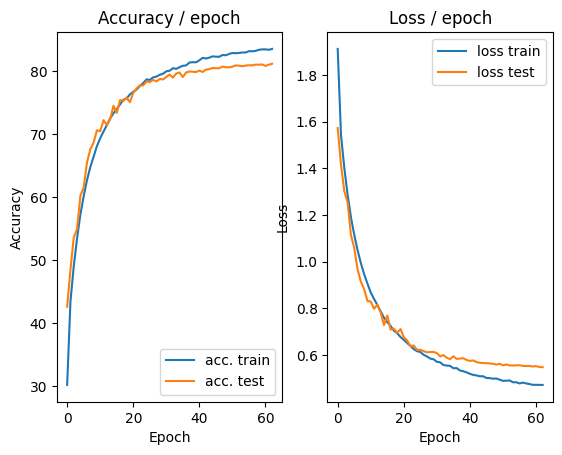

=== EPOCH 64 =====

[TRAIN Batch 000/391]	Time 0.272s (0.272s)	Loss 0.4079 (0.4079)	Prec@1  85.2 ( 85.2)	Prec@5 100.0 (100.0)


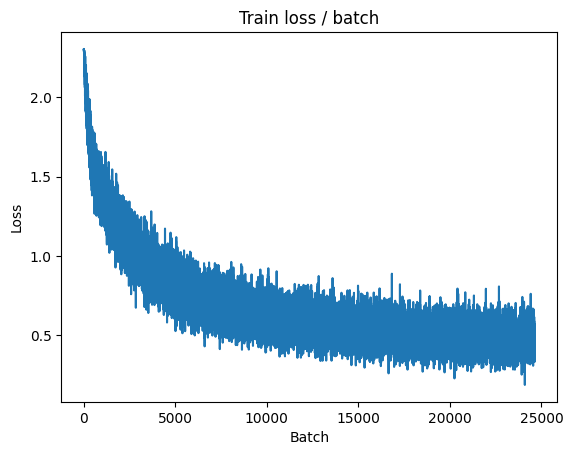

[TRAIN Batch 200/391]	Time 0.088s (0.053s)	Loss 0.5339 (0.4698)	Prec@1  76.6 ( 83.6)	Prec@5  98.4 ( 99.3)


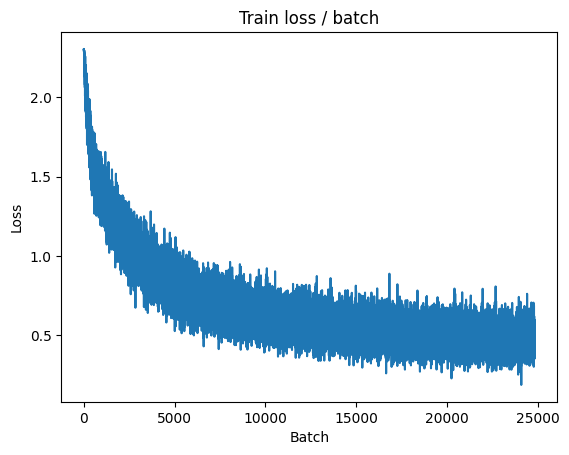


===============> Total time 20s	Avg loss 0.4723	Avg Prec@1 83.44 %	Avg Prec@5 99.31 %

[EVAL Batch 000/079]	Time 0.199s (0.199s)	Loss 0.4929 (0.4929)	Prec@1  86.7 ( 86.7)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.5525	Avg Prec@1 80.94 %	Avg Prec@5 99.04 %



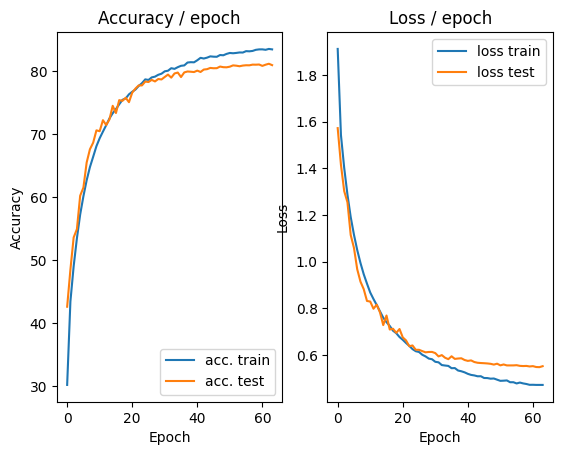

=== EPOCH 65 =====

[TRAIN Batch 000/391]	Time 0.339s (0.339s)	Loss 0.4623 (0.4623)	Prec@1  85.2 ( 85.2)	Prec@5 100.0 (100.0)


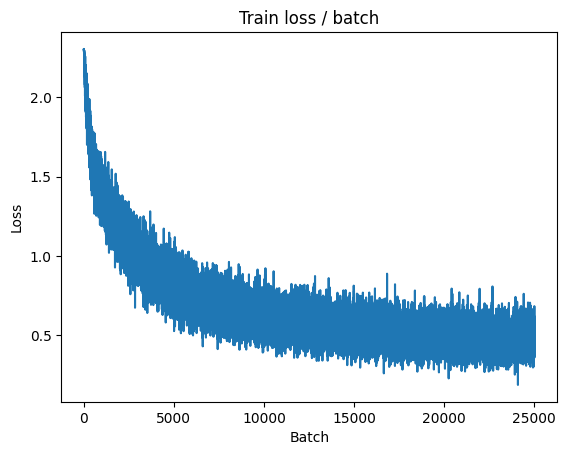

[TRAIN Batch 200/391]	Time 0.055s (0.051s)	Loss 0.4276 (0.4653)	Prec@1  85.2 ( 83.7)	Prec@5 100.0 ( 99.4)


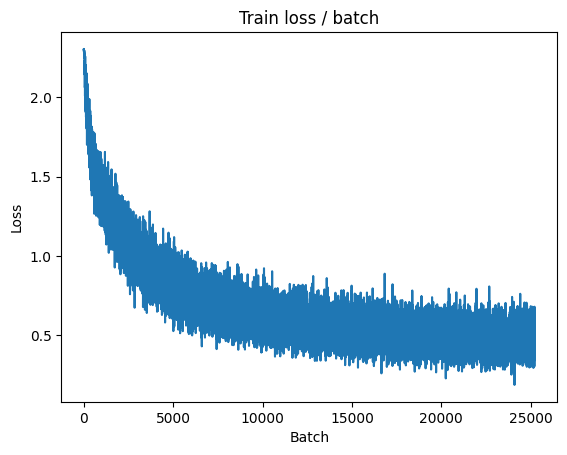


===============> Total time 20s	Avg loss 0.4671	Avg Prec@1 83.63 %	Avg Prec@5 99.36 %

[EVAL Batch 000/079]	Time 0.172s (0.172s)	Loss 0.4854 (0.4854)	Prec@1  85.9 ( 85.9)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.5489	Avg Prec@1 81.13 %	Avg Prec@5 99.01 %



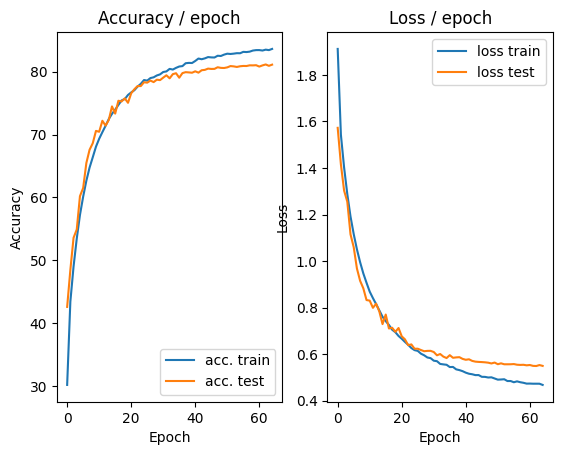

=== EPOCH 66 =====

[TRAIN Batch 000/391]	Time 0.362s (0.362s)	Loss 0.6289 (0.6289)	Prec@1  77.3 ( 77.3)	Prec@5  99.2 ( 99.2)


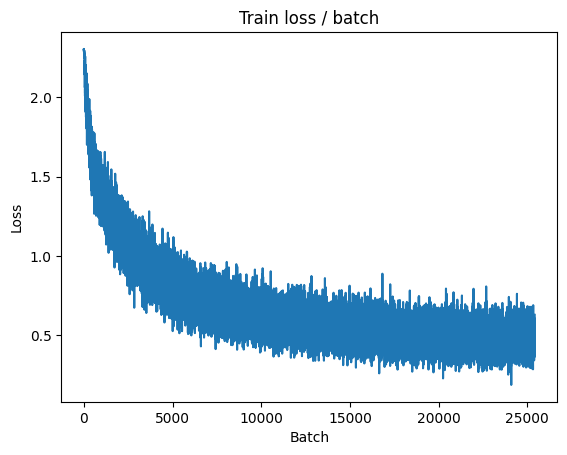

[TRAIN Batch 200/391]	Time 0.073s (0.055s)	Loss 0.3369 (0.4728)	Prec@1  89.1 ( 83.3)	Prec@5 100.0 ( 99.4)


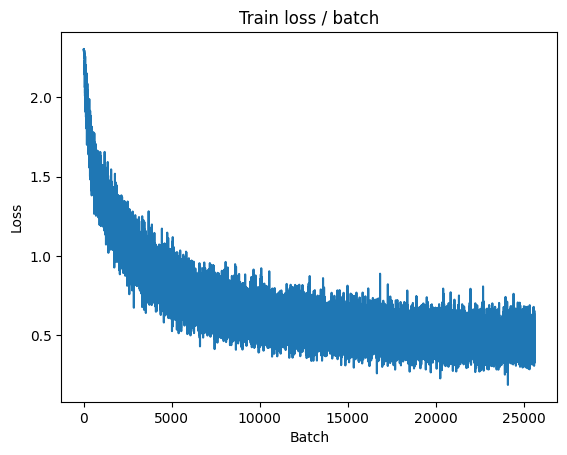


===============> Total time 21s	Avg loss 0.4701	Avg Prec@1 83.60 %	Avg Prec@5 99.37 %

[EVAL Batch 000/079]	Time 0.185s (0.185s)	Loss 0.4877 (0.4877)	Prec@1  86.7 ( 86.7)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.5477	Avg Prec@1 81.03 %	Avg Prec@5 99.07 %



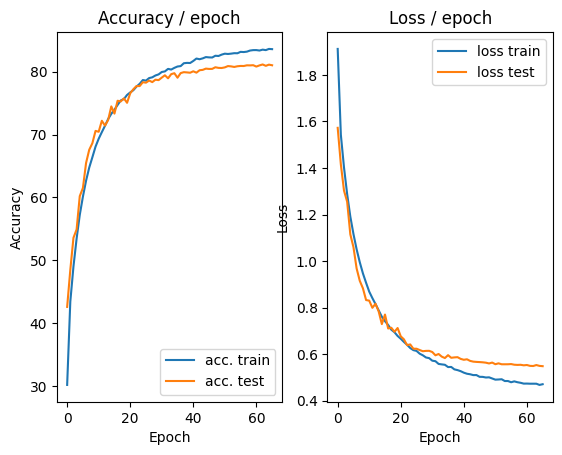

=== EPOCH 67 =====

[TRAIN Batch 000/391]	Time 0.296s (0.296s)	Loss 0.3948 (0.3948)	Prec@1  86.7 ( 86.7)	Prec@5 100.0 (100.0)


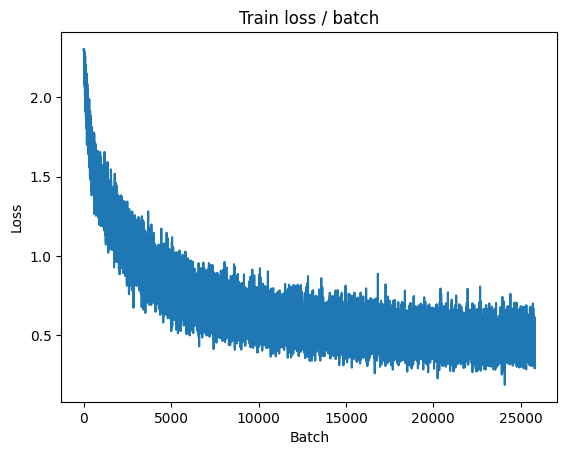

[TRAIN Batch 200/391]	Time 0.014s (0.054s)	Loss 0.4152 (0.4630)	Prec@1  85.2 ( 83.6)	Prec@5  99.2 ( 99.4)


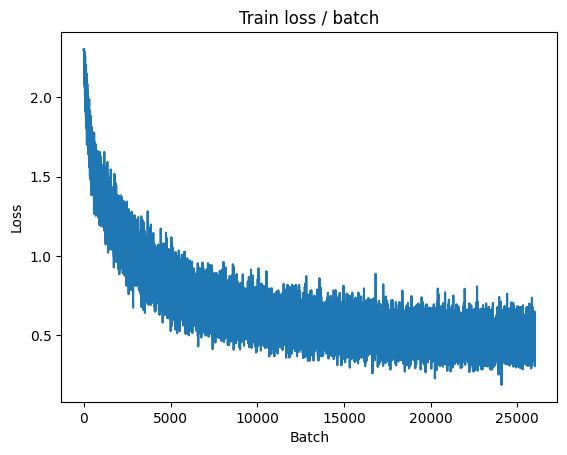


===============> Total time 21s	Avg loss 0.4680	Avg Prec@1 83.41 %	Avg Prec@5 99.39 %

[EVAL Batch 000/079]	Time 0.240s (0.240s)	Loss 0.4890 (0.4890)	Prec@1  86.7 ( 86.7)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.5484	Avg Prec@1 81.16 %	Avg Prec@5 99.08 %



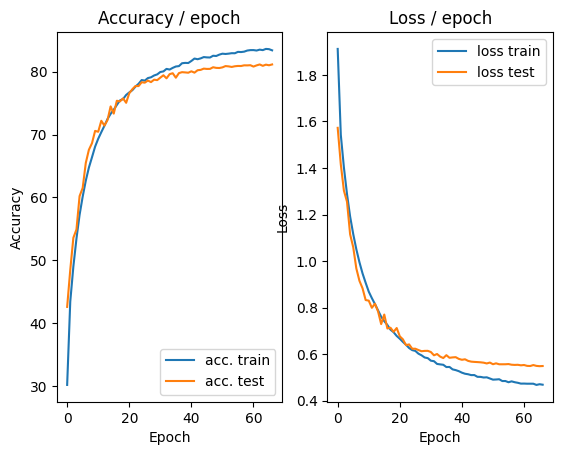

=== EPOCH 68 =====

[TRAIN Batch 000/391]	Time 0.306s (0.306s)	Loss 0.5452 (0.5452)	Prec@1  77.3 ( 77.3)	Prec@5  99.2 ( 99.2)


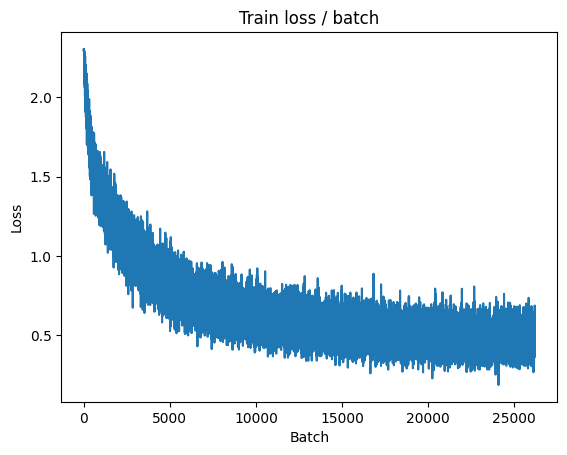

[TRAIN Batch 200/391]	Time 0.077s (0.054s)	Loss 0.4463 (0.4669)	Prec@1  84.4 ( 83.6)	Prec@5 100.0 ( 99.3)


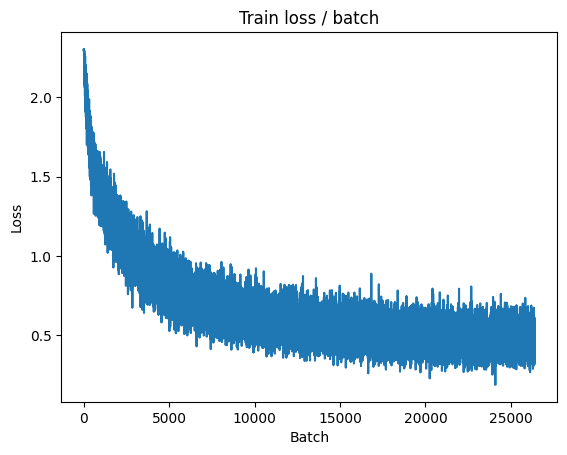


===============> Total time 20s	Avg loss 0.4652	Avg Prec@1 83.70 %	Avg Prec@5 99.30 %

[EVAL Batch 000/079]	Time 0.206s (0.206s)	Loss 0.4911 (0.4911)	Prec@1  86.7 ( 86.7)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.5493	Avg Prec@1 81.19 %	Avg Prec@5 99.11 %



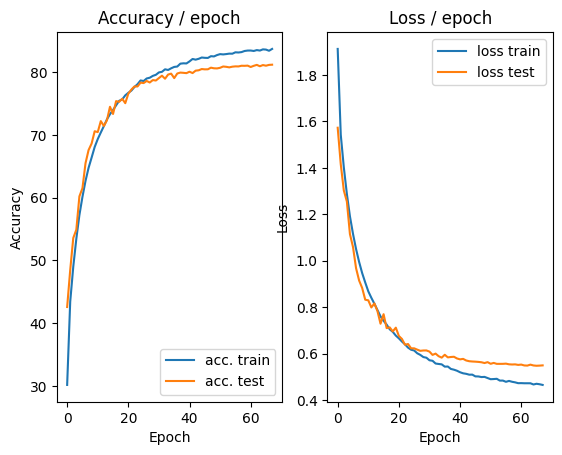

=== EPOCH 69 =====

[TRAIN Batch 000/391]	Time 0.314s (0.314s)	Loss 0.4547 (0.4547)	Prec@1  85.2 ( 85.2)	Prec@5  99.2 ( 99.2)


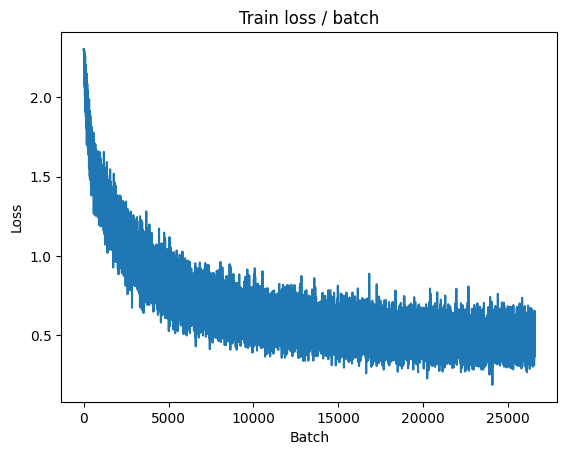

[TRAIN Batch 200/391]	Time 0.053s (0.055s)	Loss 0.4239 (0.4674)	Prec@1  85.2 ( 83.5)	Prec@5  99.2 ( 99.3)


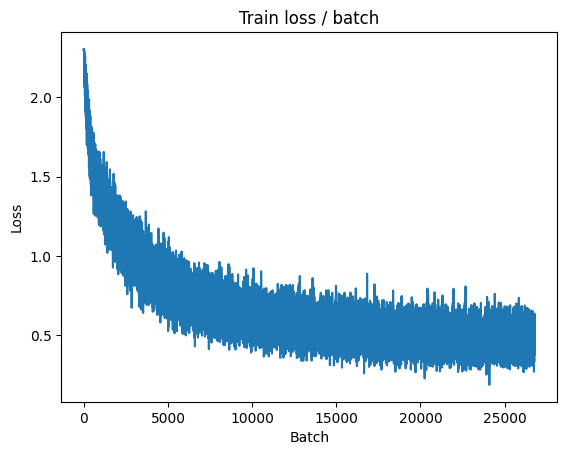


===============> Total time 21s	Avg loss 0.4666	Avg Prec@1 83.49 %	Avg Prec@5 99.32 %

[EVAL Batch 000/079]	Time 0.176s (0.176s)	Loss 0.4857 (0.4857)	Prec@1  86.7 ( 86.7)	Prec@5  97.7 ( 97.7)

===============> Total time 3s	Avg loss 0.5481	Avg Prec@1 81.11 %	Avg Prec@5 99.08 %



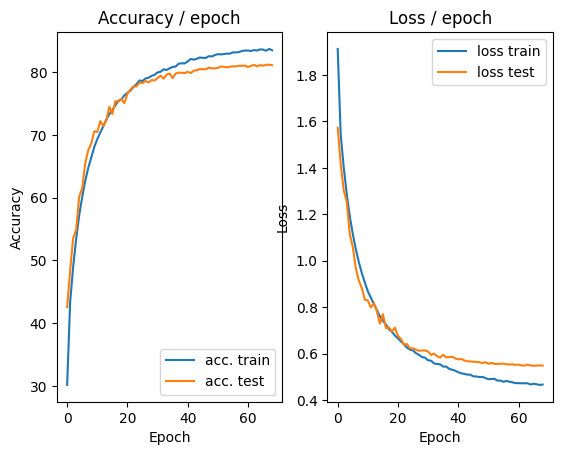

=== EPOCH 70 =====

[TRAIN Batch 000/391]	Time 0.313s (0.313s)	Loss 0.5918 (0.5918)	Prec@1  81.2 ( 81.2)	Prec@5  98.4 ( 98.4)


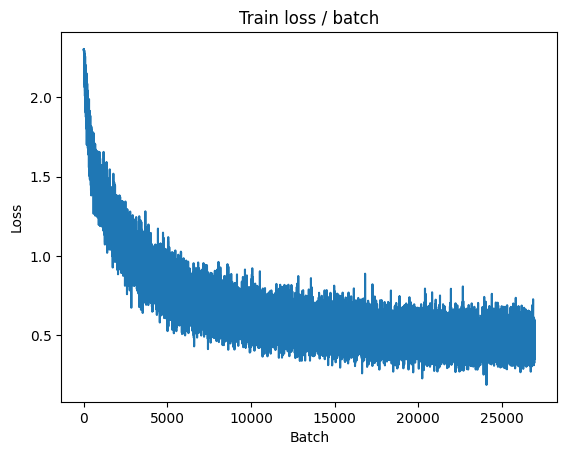

[TRAIN Batch 200/391]	Time 0.014s (0.058s)	Loss 0.4502 (0.4607)	Prec@1  84.4 ( 83.8)	Prec@5 100.0 ( 99.4)


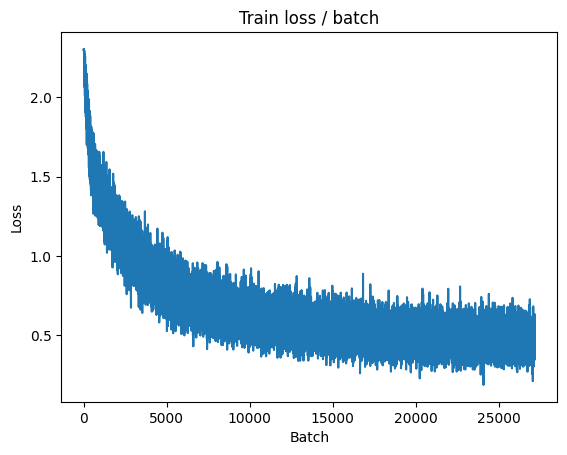


===============> Total time 21s	Avg loss 0.4623	Avg Prec@1 83.80 %	Avg Prec@5 99.34 %

[EVAL Batch 000/079]	Time 0.183s (0.183s)	Loss 0.4815 (0.4815)	Prec@1  86.7 ( 86.7)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.5474	Avg Prec@1 81.03 %	Avg Prec@5 99.11 %



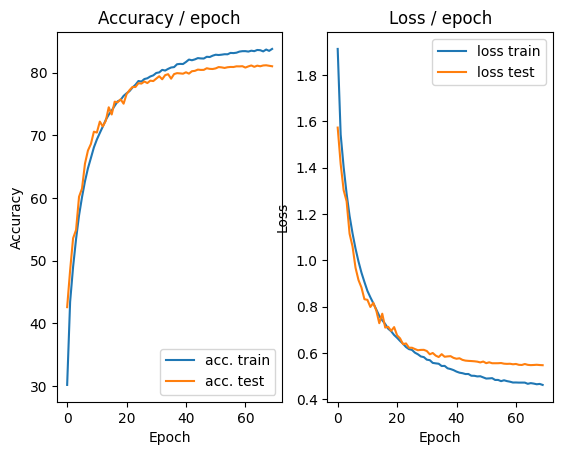

=== EPOCH 71 =====

[TRAIN Batch 000/391]	Time 0.344s (0.344s)	Loss 0.5621 (0.5621)	Prec@1  84.4 ( 84.4)	Prec@5  98.4 ( 98.4)


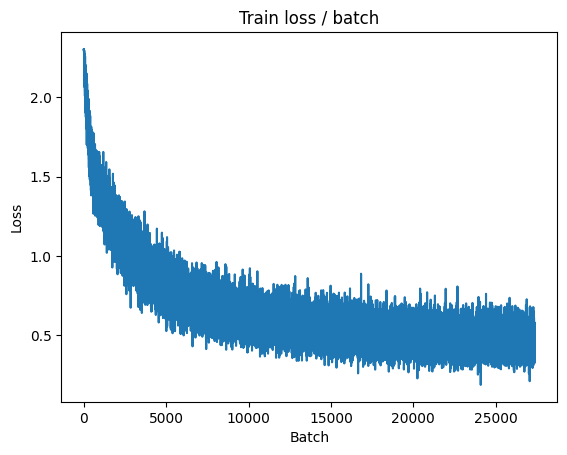

[TRAIN Batch 200/391]	Time 0.037s (0.055s)	Loss 0.3090 (0.4640)	Prec@1  90.6 ( 83.9)	Prec@5 100.0 ( 99.4)


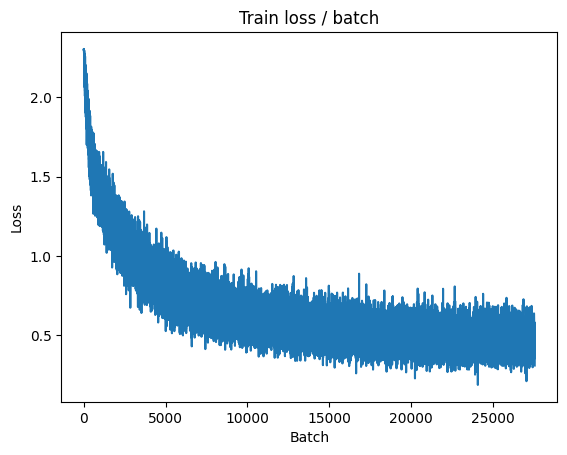


===============> Total time 20s	Avg loss 0.4613	Avg Prec@1 83.97 %	Avg Prec@5 99.40 %

[EVAL Batch 000/079]	Time 0.303s (0.303s)	Loss 0.4909 (0.4909)	Prec@1  86.7 ( 86.7)	Prec@5  97.7 ( 97.7)

===============> Total time 3s	Avg loss 0.5471	Avg Prec@1 81.23 %	Avg Prec@5 99.06 %



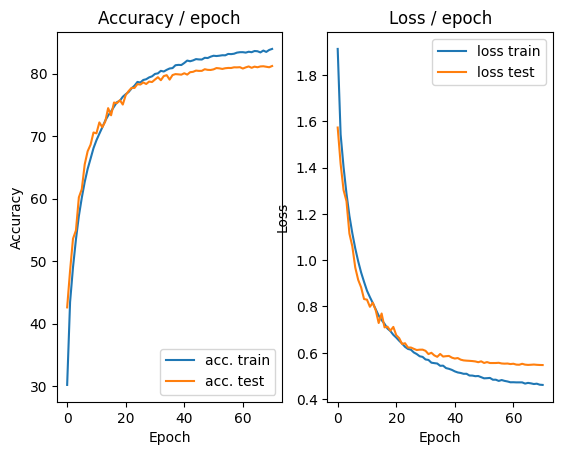

=== EPOCH 72 =====

[TRAIN Batch 000/391]	Time 0.224s (0.224s)	Loss 0.4617 (0.4617)	Prec@1  86.7 ( 86.7)	Prec@5  97.7 ( 97.7)


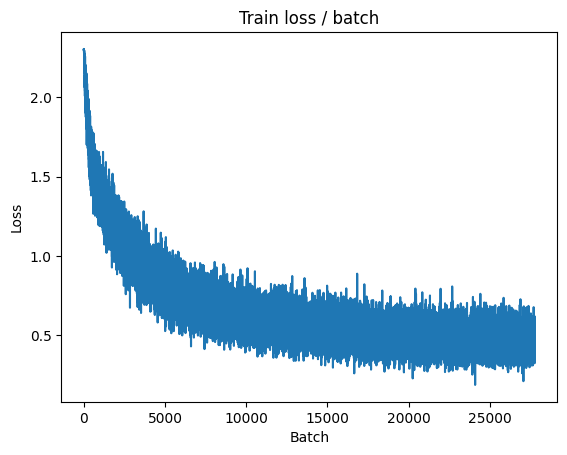

[TRAIN Batch 200/391]	Time 0.079s (0.057s)	Loss 0.5069 (0.4625)	Prec@1  83.6 ( 84.0)	Prec@5  99.2 ( 99.4)


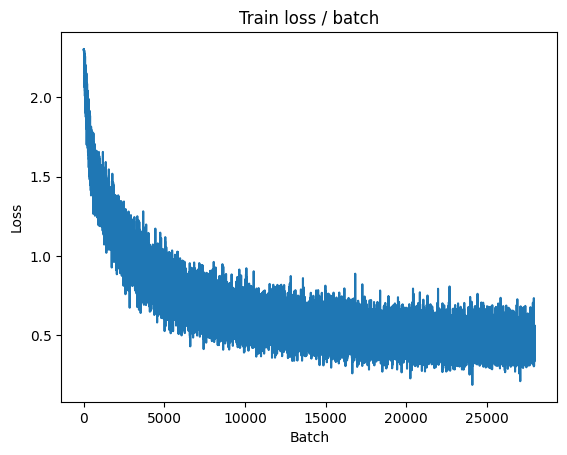


===============> Total time 20s	Avg loss 0.4622	Avg Prec@1 83.93 %	Avg Prec@5 99.38 %

[EVAL Batch 000/079]	Time 0.200s (0.200s)	Loss 0.4814 (0.4814)	Prec@1  85.9 ( 85.9)	Prec@5  97.7 ( 97.7)

===============> Total time 4s	Avg loss 0.5470	Avg Prec@1 81.10 %	Avg Prec@5 99.07 %



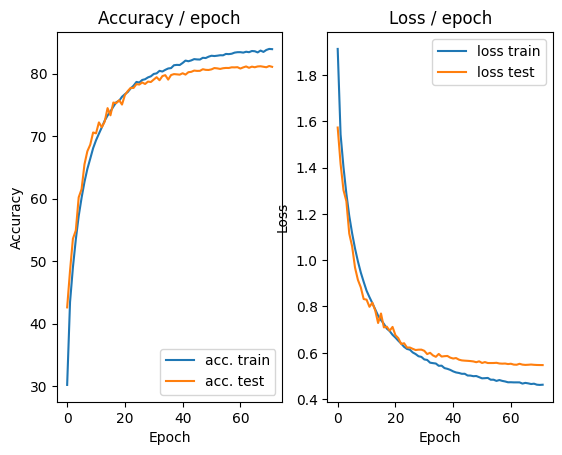

=== EPOCH 73 =====

[TRAIN Batch 000/391]	Time 0.298s (0.298s)	Loss 0.4003 (0.4003)	Prec@1  85.9 ( 85.9)	Prec@5  99.2 ( 99.2)


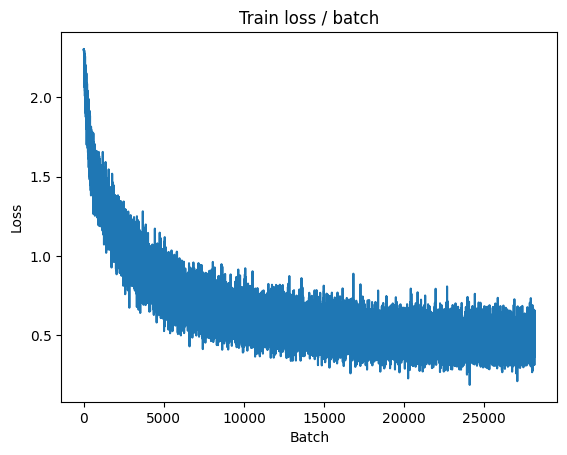

[TRAIN Batch 200/391]	Time 0.120s (0.052s)	Loss 0.4654 (0.4737)	Prec@1  82.0 ( 83.5)	Prec@5  99.2 ( 99.3)


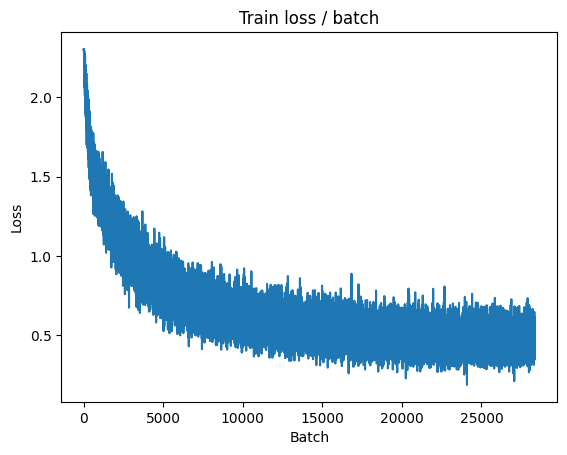


===============> Total time 19s	Avg loss 0.4632	Avg Prec@1 83.84 %	Avg Prec@5 99.34 %

[EVAL Batch 000/079]	Time 0.196s (0.196s)	Loss 0.4823 (0.4823)	Prec@1  86.7 ( 86.7)	Prec@5  97.7 ( 97.7)

===============> Total time 3s	Avg loss 0.5455	Avg Prec@1 81.17 %	Avg Prec@5 99.02 %



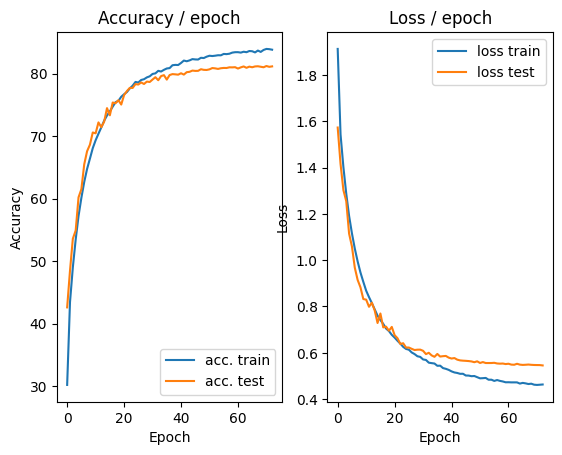

=== EPOCH 74 =====

[TRAIN Batch 000/391]	Time 0.314s (0.314s)	Loss 0.4341 (0.4341)	Prec@1  85.2 ( 85.2)	Prec@5 100.0 (100.0)


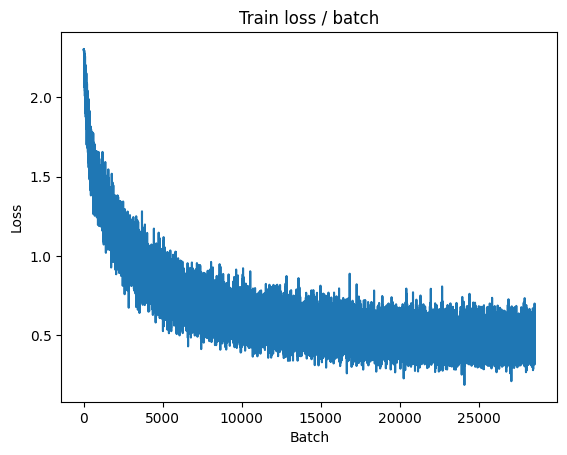

[TRAIN Batch 200/391]	Time 0.051s (0.048s)	Loss 0.5126 (0.4681)	Prec@1  80.5 ( 83.4)	Prec@5  99.2 ( 99.4)


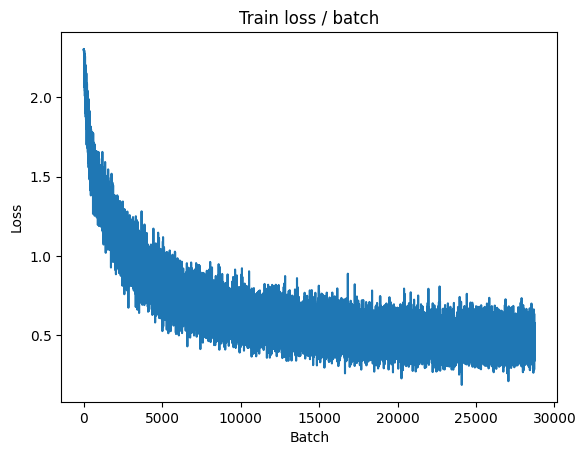


===============> Total time 19s	Avg loss 0.4604	Avg Prec@1 83.84 %	Avg Prec@5 99.41 %

[EVAL Batch 000/079]	Time 0.205s (0.205s)	Loss 0.4840 (0.4840)	Prec@1  86.7 ( 86.7)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.5454	Avg Prec@1 81.24 %	Avg Prec@5 99.13 %



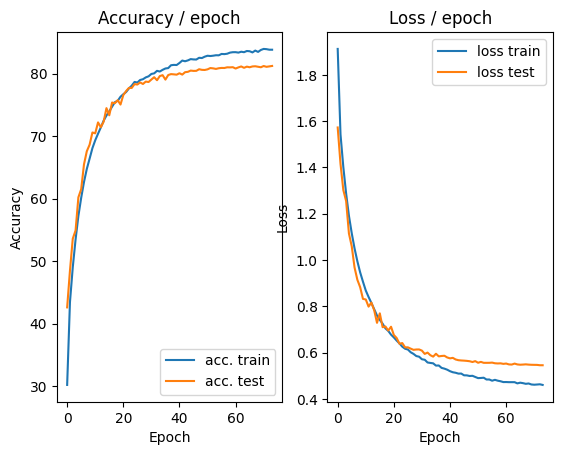

=== EPOCH 75 =====

[TRAIN Batch 000/391]	Time 0.372s (0.372s)	Loss 0.6074 (0.6074)	Prec@1  82.0 ( 82.0)	Prec@5  99.2 ( 99.2)


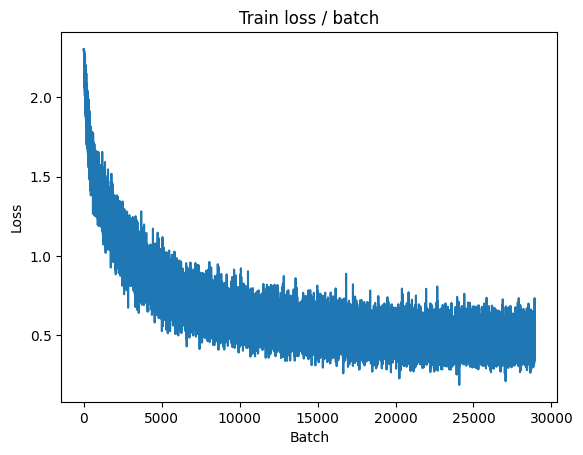

[TRAIN Batch 200/391]	Time 0.016s (0.054s)	Loss 0.4048 (0.4640)	Prec@1  85.2 ( 83.8)	Prec@5 100.0 ( 99.4)


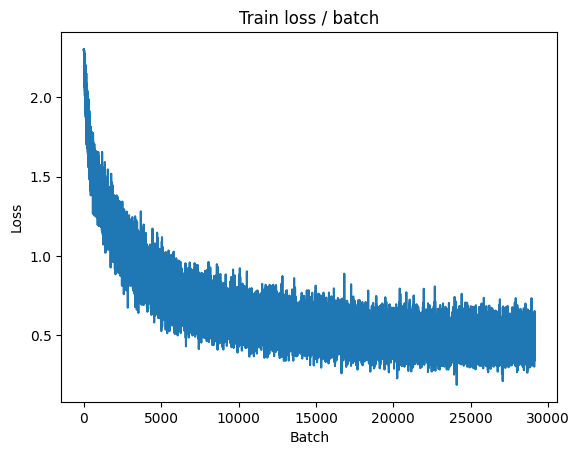


===============> Total time 20s	Avg loss 0.4602	Avg Prec@1 83.85 %	Avg Prec@5 99.39 %

[EVAL Batch 000/079]	Time 0.218s (0.218s)	Loss 0.4828 (0.4828)	Prec@1  85.9 ( 85.9)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.5445	Avg Prec@1 81.16 %	Avg Prec@5 99.11 %



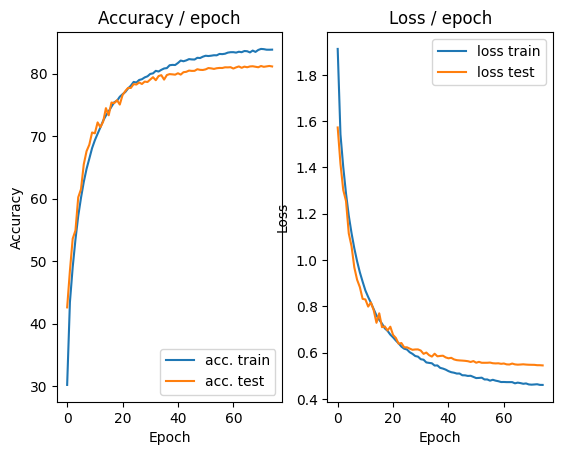

=== EPOCH 76 =====

[TRAIN Batch 000/391]	Time 0.272s (0.272s)	Loss 0.4689 (0.4689)	Prec@1  84.4 ( 84.4)	Prec@5  99.2 ( 99.2)


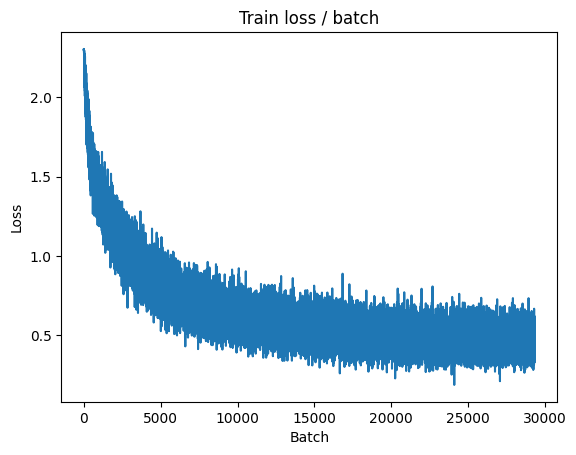

[TRAIN Batch 200/391]	Time 0.018s (0.062s)	Loss 0.3420 (0.4569)	Prec@1  90.6 ( 84.0)	Prec@5  99.2 ( 99.3)


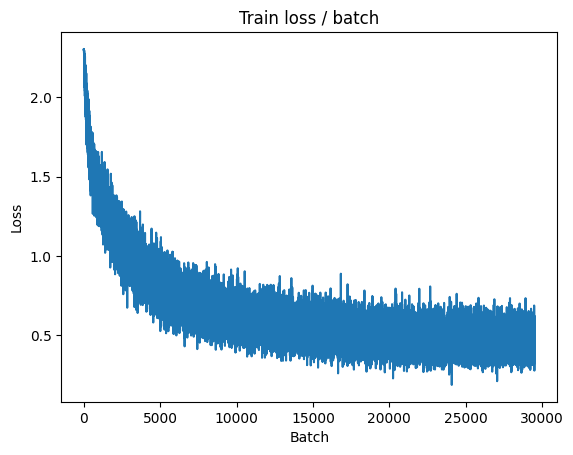


===============> Total time 22s	Avg loss 0.4574	Avg Prec@1 83.96 %	Avg Prec@5 99.40 %

[EVAL Batch 000/079]	Time 0.207s (0.207s)	Loss 0.4890 (0.4890)	Prec@1  85.9 ( 85.9)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.5476	Avg Prec@1 81.26 %	Avg Prec@5 99.08 %



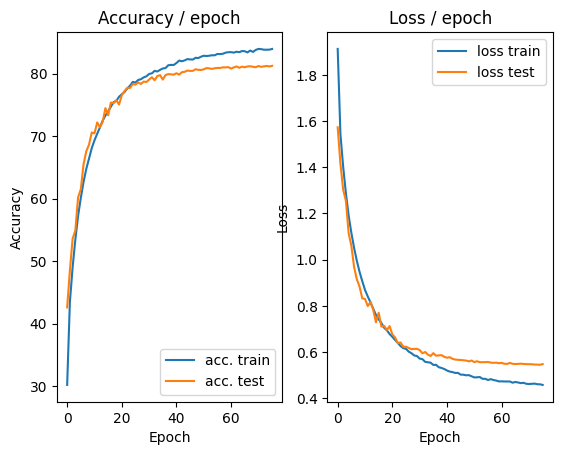

=== EPOCH 77 =====

[TRAIN Batch 000/391]	Time 0.325s (0.325s)	Loss 0.5423 (0.5423)	Prec@1  84.4 ( 84.4)	Prec@5  99.2 ( 99.2)


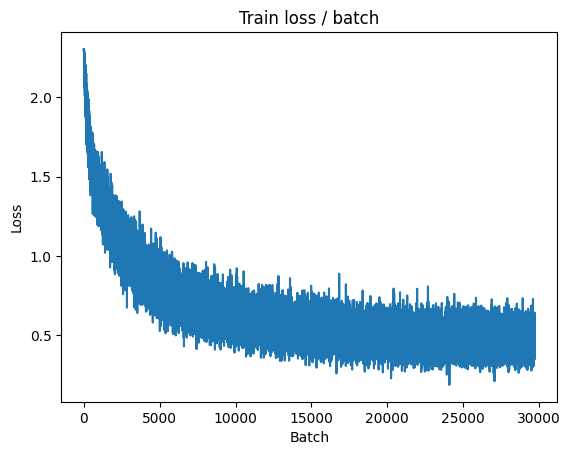

[TRAIN Batch 200/391]	Time 0.014s (0.055s)	Loss 0.5100 (0.4613)	Prec@1  82.0 ( 83.8)	Prec@5  98.4 ( 99.4)


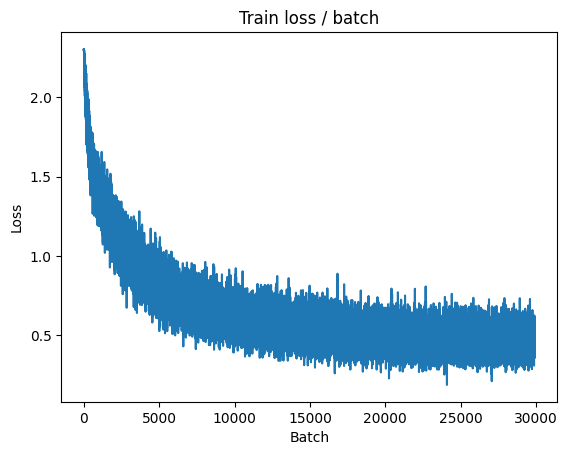


===============> Total time 21s	Avg loss 0.4609	Avg Prec@1 83.77 %	Avg Prec@5 99.37 %

[EVAL Batch 000/079]	Time 0.178s (0.178s)	Loss 0.4926 (0.4926)	Prec@1  85.9 ( 85.9)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.5455	Avg Prec@1 81.32 %	Avg Prec@5 99.02 %



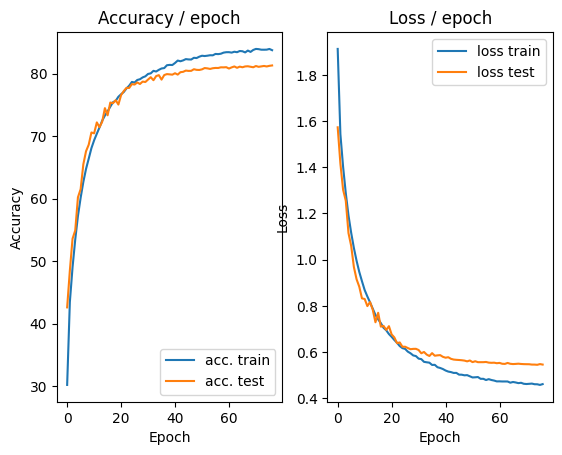

=== EPOCH 78 =====

[TRAIN Batch 000/391]	Time 0.326s (0.326s)	Loss 0.5016 (0.5016)	Prec@1  83.6 ( 83.6)	Prec@5 100.0 (100.0)


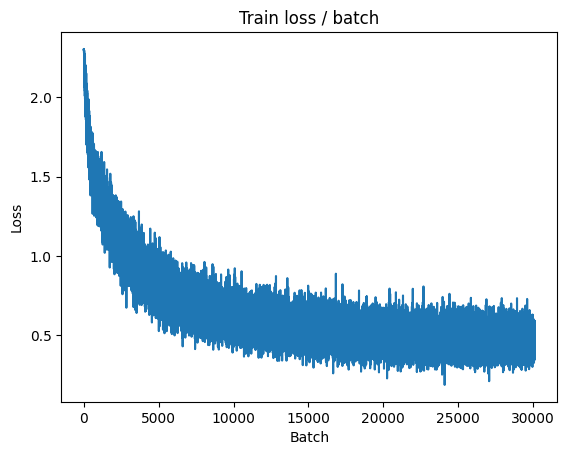

[TRAIN Batch 200/391]	Time 0.035s (0.055s)	Loss 0.4003 (0.4604)	Prec@1  87.5 ( 83.9)	Prec@5  99.2 ( 99.4)


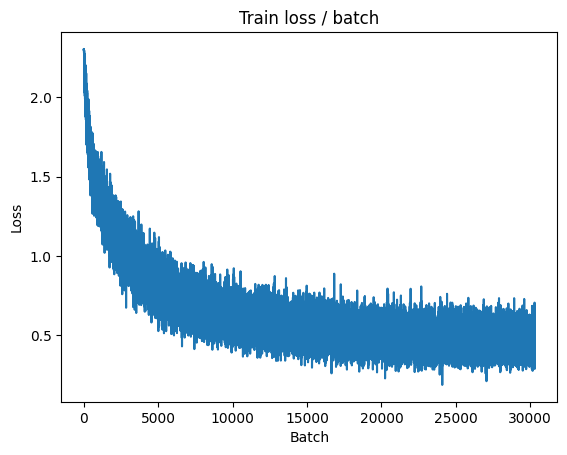


===============> Total time 21s	Avg loss 0.4576	Avg Prec@1 83.88 %	Avg Prec@5 99.39 %

[EVAL Batch 000/079]	Time 0.227s (0.227s)	Loss 0.4846 (0.4846)	Prec@1  86.7 ( 86.7)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.5449	Avg Prec@1 81.21 %	Avg Prec@5 99.09 %



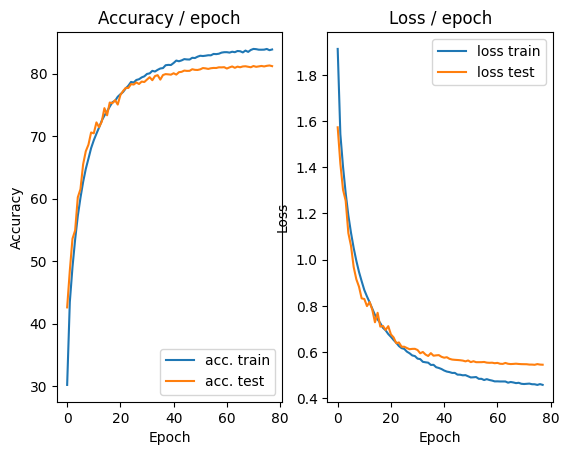

=== EPOCH 79 =====

[TRAIN Batch 000/391]	Time 0.324s (0.324s)	Loss 0.4638 (0.4638)	Prec@1  82.0 ( 82.0)	Prec@5 100.0 (100.0)


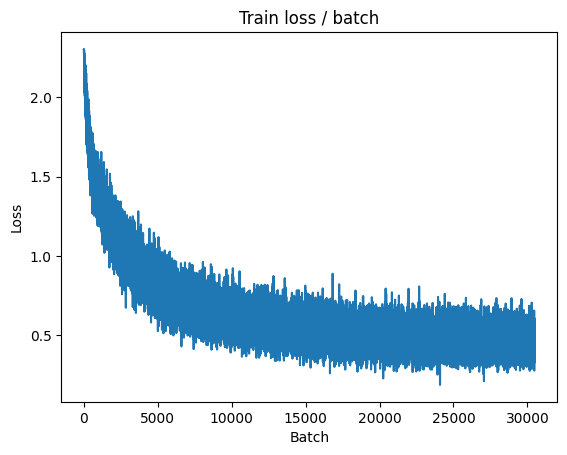

[TRAIN Batch 200/391]	Time 0.009s (0.055s)	Loss 0.5354 (0.4578)	Prec@1  77.3 ( 84.0)	Prec@5 100.0 ( 99.3)


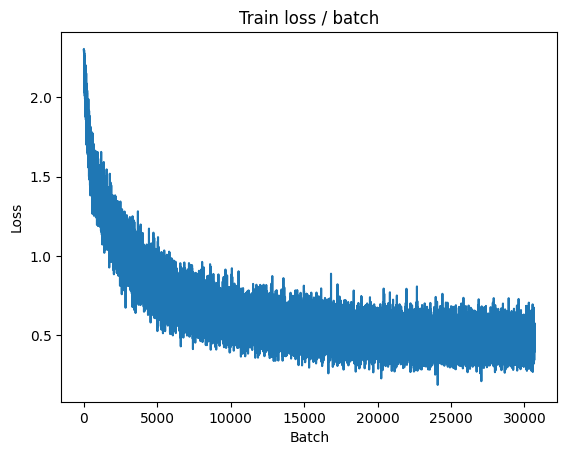


===============> Total time 20s	Avg loss 0.4570	Avg Prec@1 83.95 %	Avg Prec@5 99.37 %

[EVAL Batch 000/079]	Time 0.270s (0.270s)	Loss 0.4859 (0.4859)	Prec@1  85.9 ( 85.9)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.5438	Avg Prec@1 81.17 %	Avg Prec@5 99.13 %



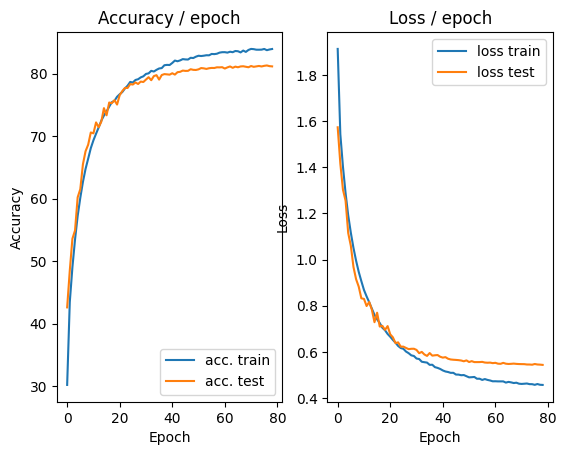

=== EPOCH 80 =====

[TRAIN Batch 000/391]	Time 0.333s (0.333s)	Loss 0.3824 (0.3824)	Prec@1  87.5 ( 87.5)	Prec@5  99.2 ( 99.2)


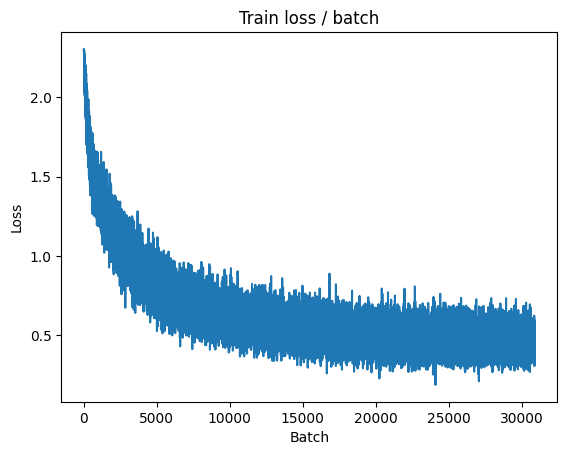

[TRAIN Batch 200/391]	Time 0.008s (0.054s)	Loss 0.5037 (0.4615)	Prec@1  81.2 ( 83.6)	Prec@5  98.4 ( 99.4)


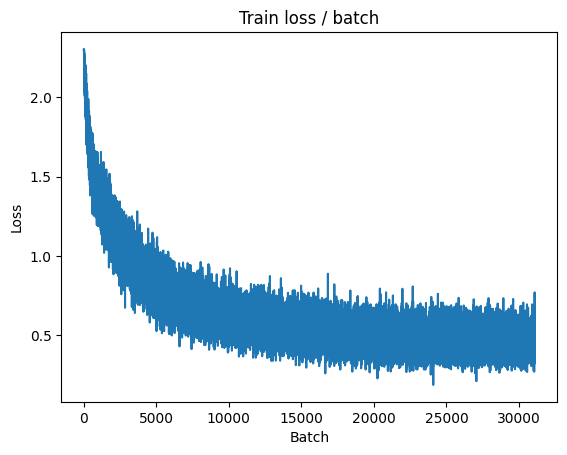


===============> Total time 19s	Avg loss 0.4606	Avg Prec@1 83.80 %	Avg Prec@5 99.39 %

[EVAL Batch 000/079]	Time 0.193s (0.193s)	Loss 0.4747 (0.4747)	Prec@1  86.7 ( 86.7)	Prec@5  99.2 ( 99.2)

===============> Total time 4s	Avg loss 0.5439	Avg Prec@1 81.22 %	Avg Prec@5 99.08 %



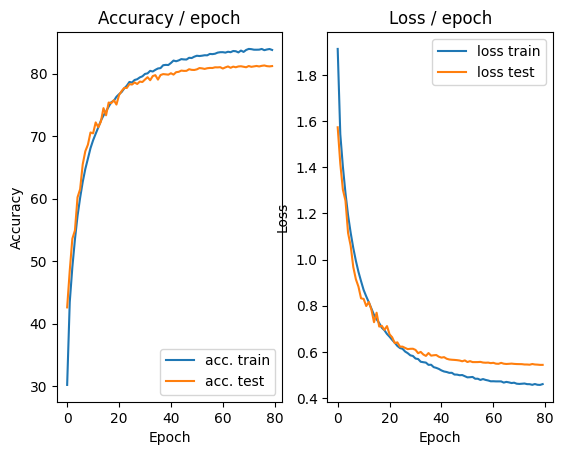

In [ ]:
main_6(128, 0.1, epochs=60, cuda=True)

# 3.5 Use of batch normalization

In [ ]:
# 更改 AlexNet_like_3_5 类
class AlexNet_like_3_5(nn.Module):

    def __init__(self):
        super(AlexNet_like_3_5, self).__init__()

        # 定义卷积层和池化层
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, (5, 5), stride=1, padding=2),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(32, 64, (5, 5), stride=1, padding=2),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0),
            nn.Conv2d(64, 64, (5, 5), stride=1, padding=2),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d((2, 2), stride=2, padding=0, ceil_mode=True),
        )

        # 定义全连接层：作为分类器
        self.classifier = nn.Sequential(
            nn.Linear(64*4*4, 1000),     # 输入取决于图片大小，经过池化层压缩
            nn.ReLU(),
            nn.Dropout(p=0.5),
            nn.Linear(1000, 10),
        )

    # 定义前向传播
    def forward(self, input):
        bsize = input.size(0)
        output = self.features(input)
        output = output.view(bsize, -1)
        output = self.classifier(output)

        return output

In [ ]:
# 定义 main_7()
def main_7(batch_size=128, lr=0.01, epochs=5, cuda=False):

    # 定义模型、损失函数和优化器初始参数
    model = AlexNet_like_3_5()
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr)
    lr_sched = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.95)

    if cuda:
        cudnn.benchmark = True
        model = model.cuda()
        criterion = criterion.cuda()

    # 获取数据集
    train, test = get_dataset_4(batch_size, cuda)

    # 初始化绘图
    plot = AccLossPlot()
    global loss_plot
    loss_plot = TrainLossPlot()

    # 迭代
    for i in range(epochs):
        print("=================\n=== EPOCH "+str(i+1)+" =====\n=================\n")

        # 训练
        top1_acc, avg_top5_acc, loss = epoch(train, model, criterion, optimizer, cuda)
        lr_sched.step()

        # 测试
        top1_acc_test, top5_acc_test, loss_test = epoch(test, model, criterion, cuda=cuda)

        # 绘图
        plot.update(loss.avg, loss_test.avg, top1_acc.avg, top1_acc_test.avg)

Files already downloaded and verified
Files already downloaded and verified
=== EPOCH 1 =====

[TRAIN Batch 000/391]	Time 1.507s (1.507s)	Loss 2.4153 (2.4153)	Prec@1  15.6 ( 15.6)	Prec@5  46.1 ( 46.1)


<Figure size 640x480 with 0 Axes>

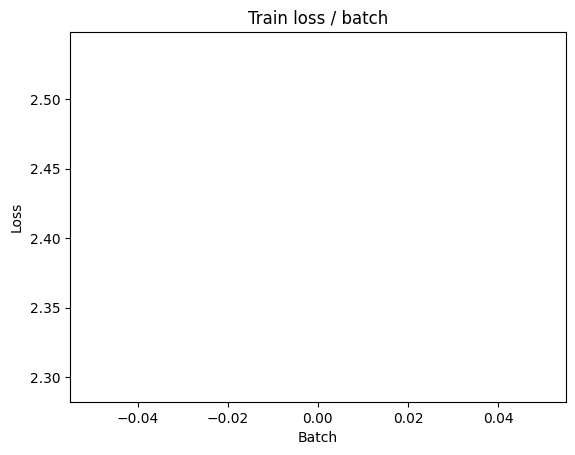

[TRAIN Batch 200/391]	Time 0.014s (0.058s)	Loss 1.3400 (1.6957)	Prec@1  47.7 ( 37.5)	Prec@5  96.9 ( 87.2)


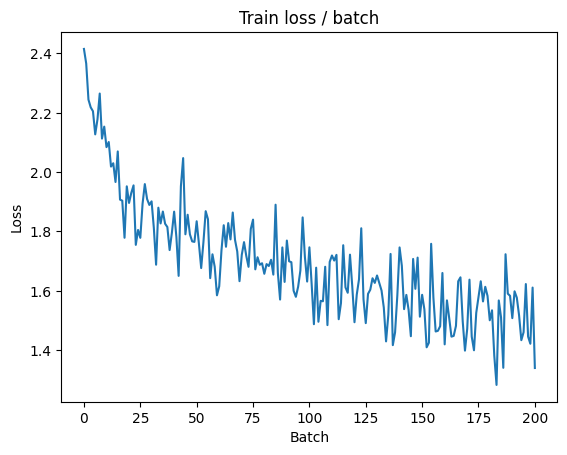


===============> Total time 22s	Avg loss 1.5706	Avg Prec@1 42.33 %	Avg Prec@5 89.72 %

[EVAL Batch 000/079]	Time 0.270s (0.270s)	Loss 1.5470 (1.5470)	Prec@1  44.5 ( 44.5)	Prec@5  88.3 ( 88.3)

===============> Total time 3s	Avg loss 1.4964	Avg Prec@1 45.50 %	Avg Prec@5 92.19 %



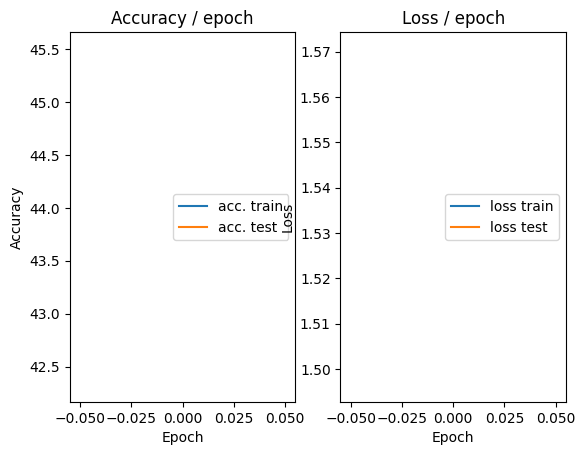

=== EPOCH 2 =====

[TRAIN Batch 000/391]	Time 0.314s (0.314s)	Loss 1.4447 (1.4447)	Prec@1  48.4 ( 48.4)	Prec@5  92.2 ( 92.2)


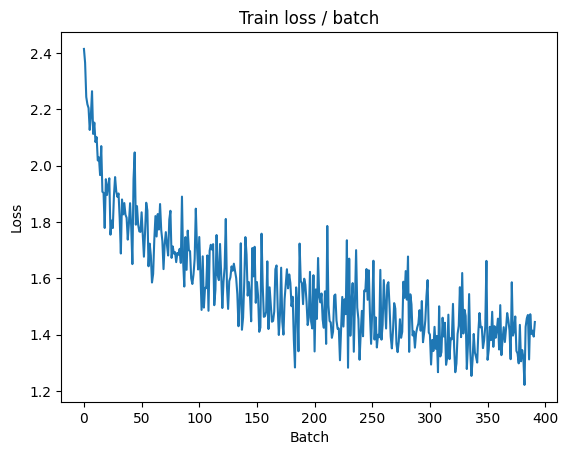

[TRAIN Batch 200/391]	Time 0.012s (0.053s)	Loss 1.2871 (1.2903)	Prec@1  54.7 ( 53.0)	Prec@5  93.0 ( 94.2)


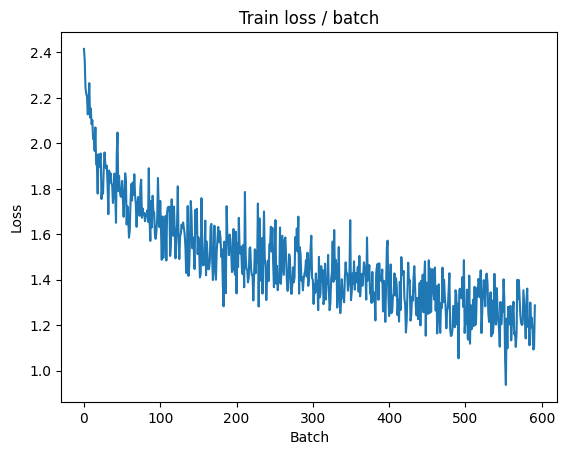


===============> Total time 20s	Avg loss 1.2482	Avg Prec@1 54.78 %	Avg Prec@5 94.60 %

[EVAL Batch 000/079]	Time 0.166s (0.166s)	Loss 1.1214 (1.1214)	Prec@1  60.2 ( 60.2)	Prec@5  96.1 ( 96.1)

===============> Total time 3s	Avg loss 1.2286	Avg Prec@1 55.53 %	Avg Prec@5 94.93 %



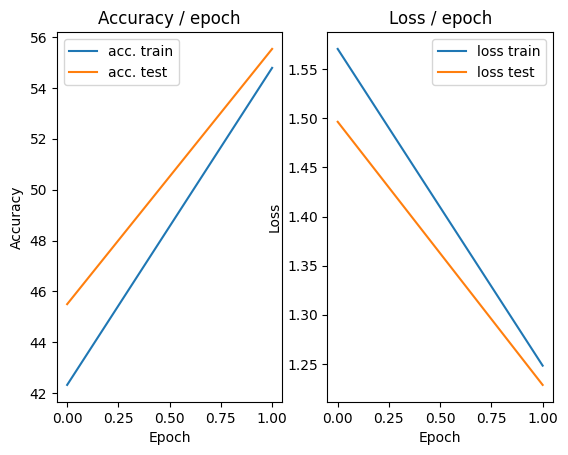

=== EPOCH 3 =====

[TRAIN Batch 000/391]	Time 0.186s (0.186s)	Loss 1.0252 (1.0252)	Prec@1  64.1 ( 64.1)	Prec@5  96.9 ( 96.9)


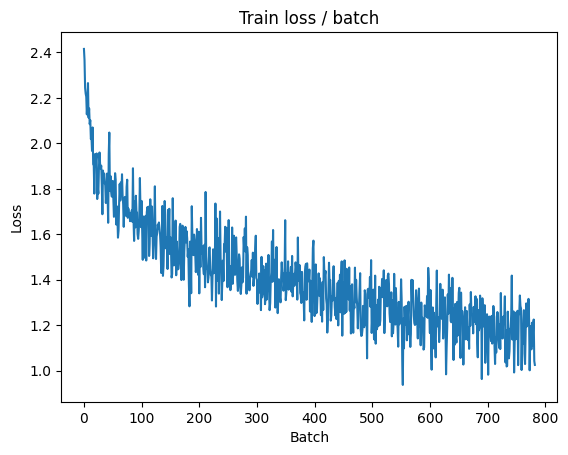

[TRAIN Batch 200/391]	Time 0.010s (0.055s)	Loss 1.1800 (1.1172)	Prec@1  56.2 ( 60.1)	Prec@5  94.5 ( 96.0)


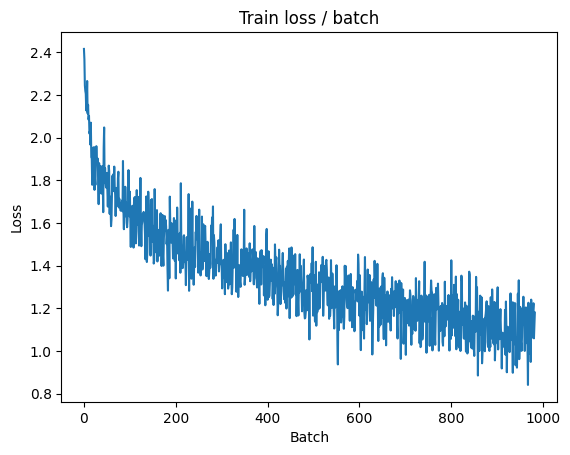


===============> Total time 21s	Avg loss 1.0880	Avg Prec@1 61.14 %	Avg Prec@5 96.16 %

[EVAL Batch 000/079]	Time 0.157s (0.157s)	Loss 1.0634 (1.0634)	Prec@1  65.6 ( 65.6)	Prec@5  95.3 ( 95.3)

===============> Total time 3s	Avg loss 1.1014	Avg Prec@1 60.32 %	Avg Prec@5 96.23 %



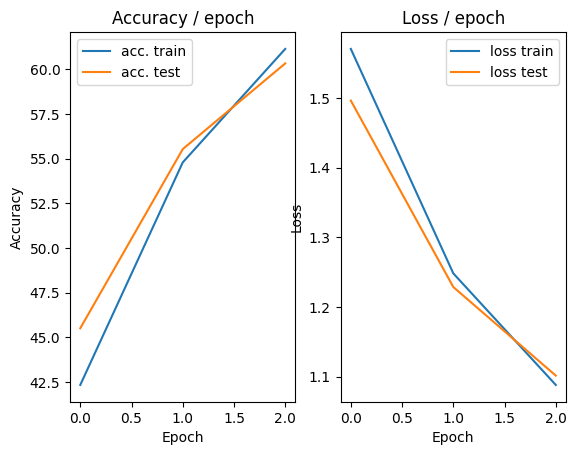

=== EPOCH 4 =====

[TRAIN Batch 000/391]	Time 0.186s (0.186s)	Loss 1.1269 (1.1269)	Prec@1  55.5 ( 55.5)	Prec@5  96.9 ( 96.9)


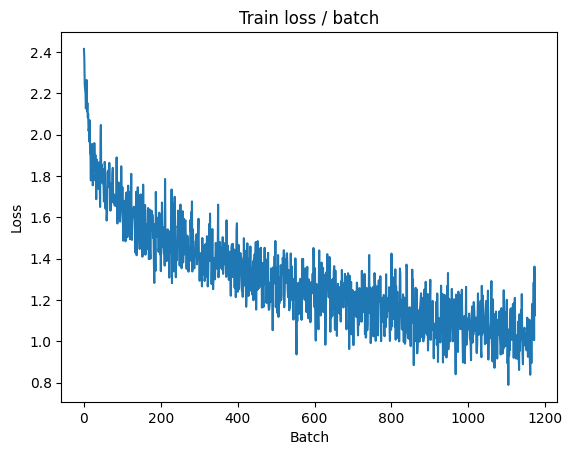

[TRAIN Batch 200/391]	Time 0.024s (0.054s)	Loss 1.0887 (1.0068)	Prec@1  63.3 ( 64.3)	Prec@5  95.3 ( 96.7)


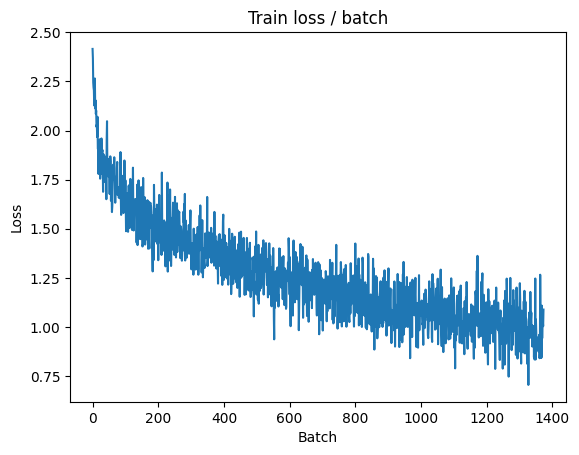


===============> Total time 21s	Avg loss 0.9823	Avg Prec@1 65.29 %	Avg Prec@5 96.90 %

[EVAL Batch 000/079]	Time 0.151s (0.151s)	Loss 0.7995 (0.7995)	Prec@1  76.6 ( 76.6)	Prec@5  97.7 ( 97.7)

===============> Total time 3s	Avg loss 0.8930	Avg Prec@1 68.58 %	Avg Prec@5 97.27 %



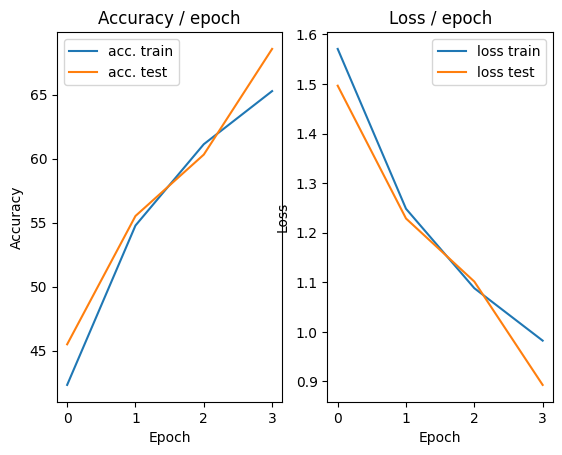

=== EPOCH 5 =====

[TRAIN Batch 000/391]	Time 0.209s (0.209s)	Loss 0.9827 (0.9827)	Prec@1  66.4 ( 66.4)	Prec@5  96.1 ( 96.1)


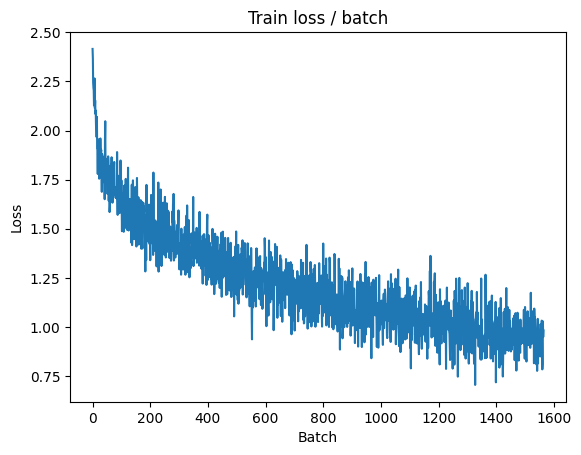

[TRAIN Batch 200/391]	Time 0.028s (0.055s)	Loss 0.8904 (0.9122)	Prec@1  67.2 ( 67.8)	Prec@5  97.7 ( 97.3)


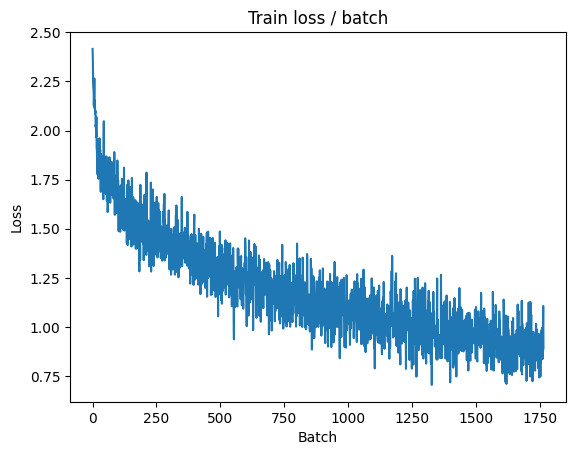


===============> Total time 21s	Avg loss 0.9055	Avg Prec@1 68.01 %	Avg Prec@5 97.40 %

[EVAL Batch 000/079]	Time 0.161s (0.161s)	Loss 1.0288 (1.0288)	Prec@1  67.2 ( 67.2)	Prec@5  95.3 ( 95.3)

===============> Total time 3s	Avg loss 1.0234	Avg Prec@1 65.03 %	Avg Prec@5 96.45 %



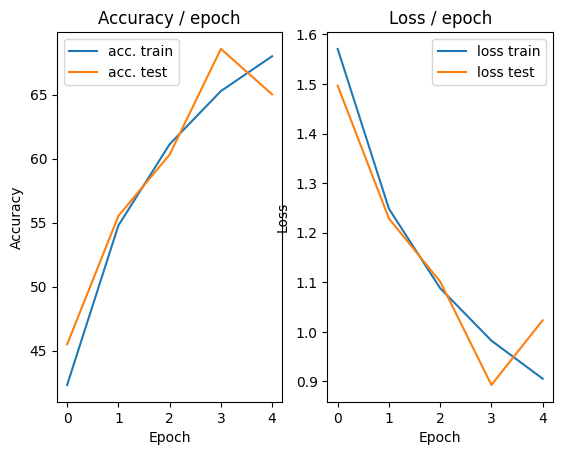

=== EPOCH 6 =====

[TRAIN Batch 000/391]	Time 0.199s (0.199s)	Loss 0.9876 (0.9876)	Prec@1  66.4 ( 66.4)	Prec@5  96.9 ( 96.9)


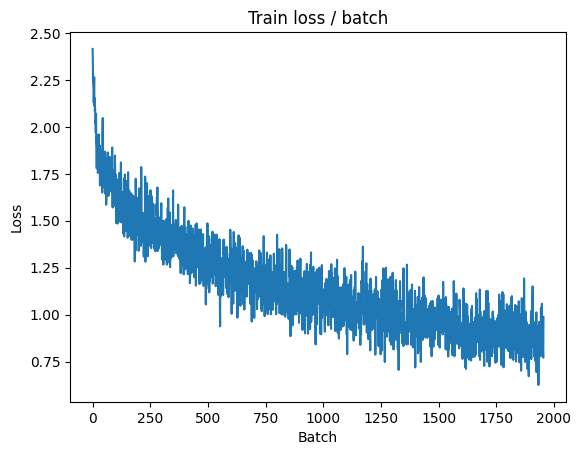

[TRAIN Batch 200/391]	Time 0.010s (0.055s)	Loss 0.7112 (0.8571)	Prec@1  76.6 ( 69.5)	Prec@5  97.7 ( 97.7)


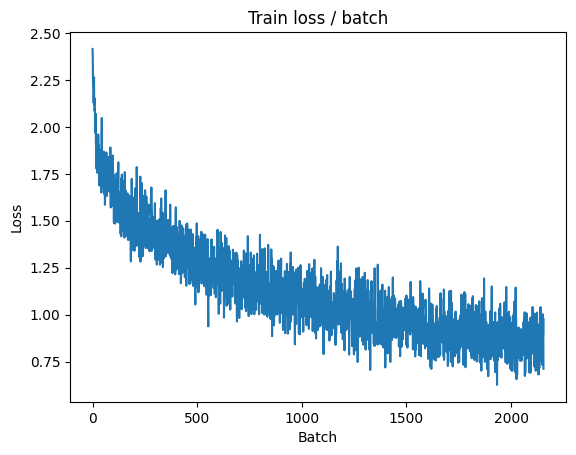


===============> Total time 21s	Avg loss 0.8493	Avg Prec@1 69.99 %	Avg Prec@5 97.70 %

[EVAL Batch 000/079]	Time 0.180s (0.180s)	Loss 0.7521 (0.7521)	Prec@1  78.9 ( 78.9)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.7739	Avg Prec@1 73.16 %	Avg Prec@5 97.81 %



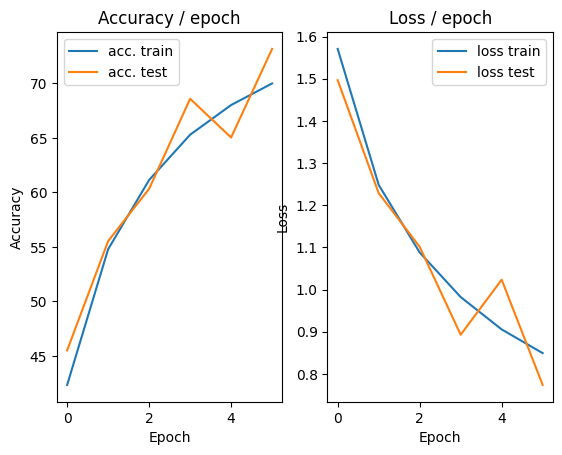

=== EPOCH 7 =====

[TRAIN Batch 000/391]	Time 0.216s (0.216s)	Loss 0.9322 (0.9322)	Prec@1  64.8 ( 64.8)	Prec@5  97.7 ( 97.7)


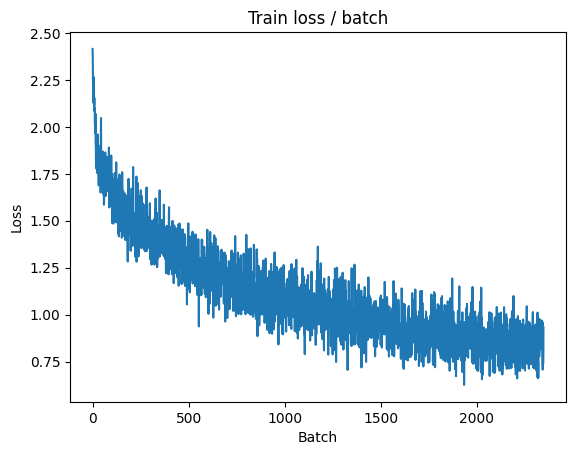

[TRAIN Batch 200/391]	Time 0.069s (0.055s)	Loss 0.9165 (0.8092)	Prec@1  71.1 ( 71.5)	Prec@5  96.9 ( 97.9)


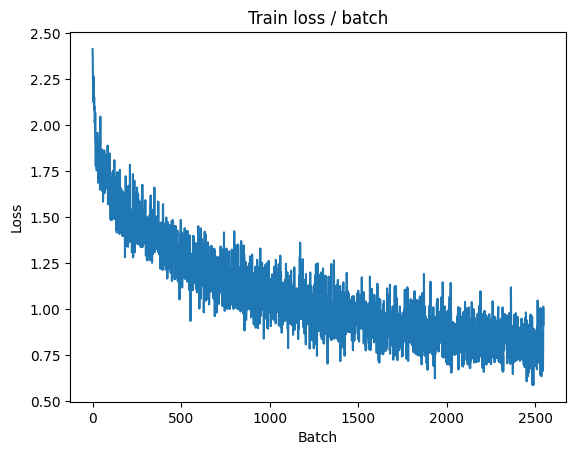


===============> Total time 20s	Avg loss 0.8051	Avg Prec@1 71.78 %	Avg Prec@5 97.92 %

[EVAL Batch 000/079]	Time 0.189s (0.189s)	Loss 0.6592 (0.6592)	Prec@1  80.5 ( 80.5)	Prec@5  96.9 ( 96.9)

===============> Total time 3s	Avg loss 0.7786	Avg Prec@1 72.50 %	Avg Prec@5 98.13 %



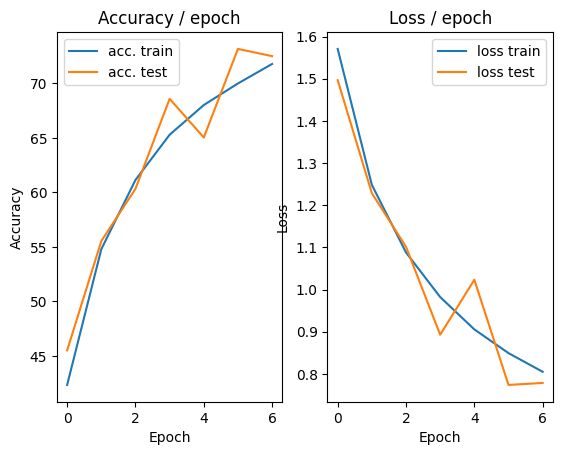

=== EPOCH 8 =====

[TRAIN Batch 000/391]	Time 0.209s (0.209s)	Loss 0.8909 (0.8909)	Prec@1  66.4 ( 66.4)	Prec@5  97.7 ( 97.7)


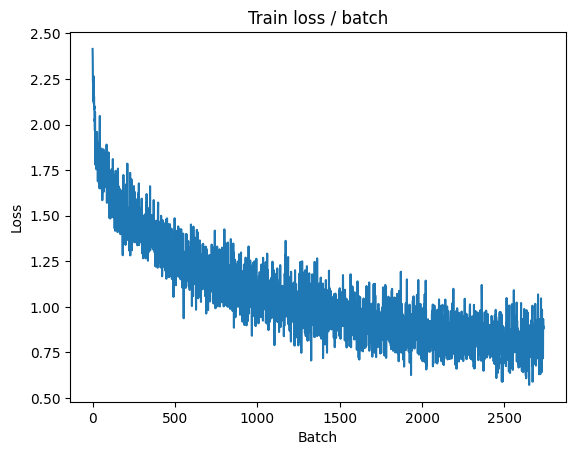

[TRAIN Batch 200/391]	Time 0.101s (0.055s)	Loss 0.7425 (0.7766)	Prec@1  70.3 ( 72.5)	Prec@5  96.1 ( 98.1)


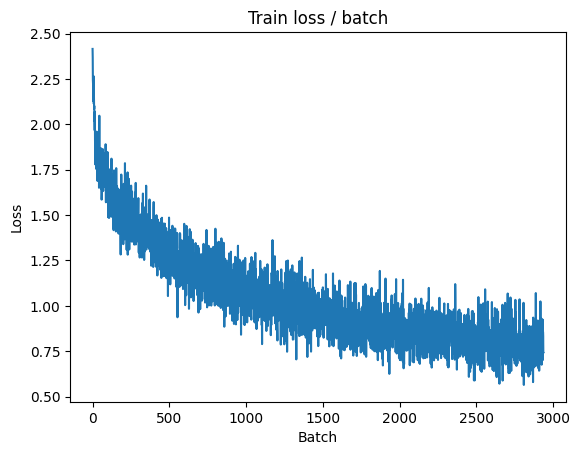


===============> Total time 20s	Avg loss 0.7690	Avg Prec@1 72.95 %	Avg Prec@5 98.12 %

[EVAL Batch 000/079]	Time 0.158s (0.158s)	Loss 0.6799 (0.6799)	Prec@1  75.8 ( 75.8)	Prec@5  98.4 ( 98.4)

===============> Total time 4s	Avg loss 0.7711	Avg Prec@1 73.01 %	Avg Prec@5 98.07 %



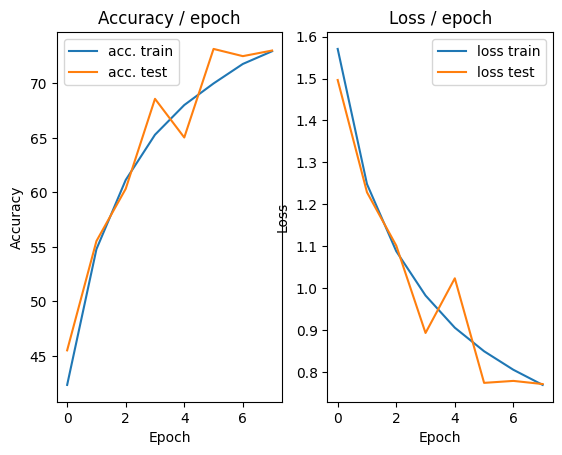

=== EPOCH 9 =====

[TRAIN Batch 000/391]	Time 0.193s (0.193s)	Loss 0.9871 (0.9871)	Prec@1  70.3 ( 70.3)	Prec@5  96.9 ( 96.9)


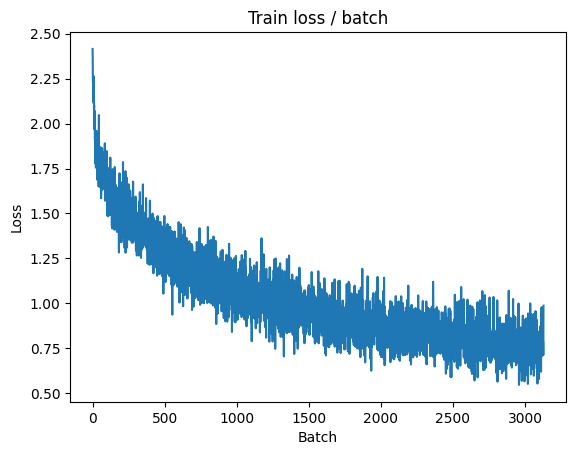

[TRAIN Batch 200/391]	Time 0.173s (0.052s)	Loss 0.6795 (0.7409)	Prec@1  80.5 ( 74.1)	Prec@5  98.4 ( 98.2)


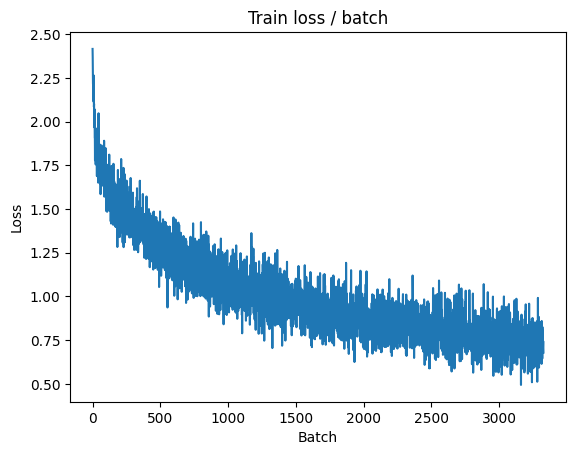


===============> Total time 20s	Avg loss 0.7369	Avg Prec@1 74.25 %	Avg Prec@5 98.26 %

[EVAL Batch 000/079]	Time 0.178s (0.178s)	Loss 0.6790 (0.6790)	Prec@1  82.0 ( 82.0)	Prec@5  97.7 ( 97.7)

===============> Total time 3s	Avg loss 0.7780	Avg Prec@1 73.24 %	Avg Prec@5 97.86 %



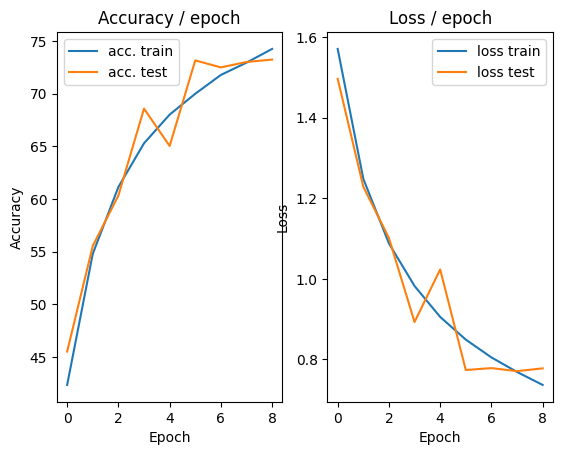

=== EPOCH 10 =====

[TRAIN Batch 000/391]	Time 0.304s (0.304s)	Loss 0.9860 (0.9860)	Prec@1  68.0 ( 68.0)	Prec@5  96.1 ( 96.1)


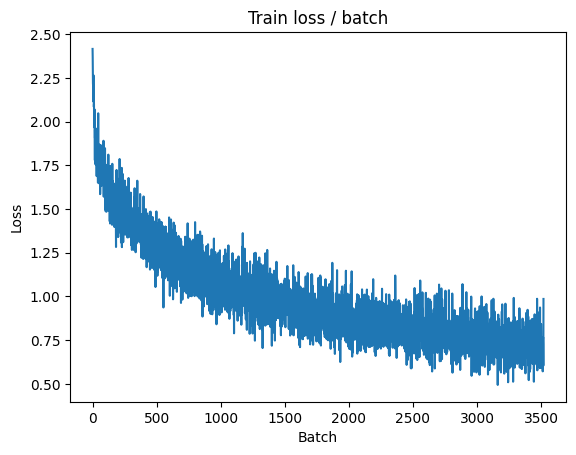

[TRAIN Batch 200/391]	Time 0.044s (0.051s)	Loss 0.8870 (0.7139)	Prec@1  69.5 ( 74.9)	Prec@5  98.4 ( 98.4)


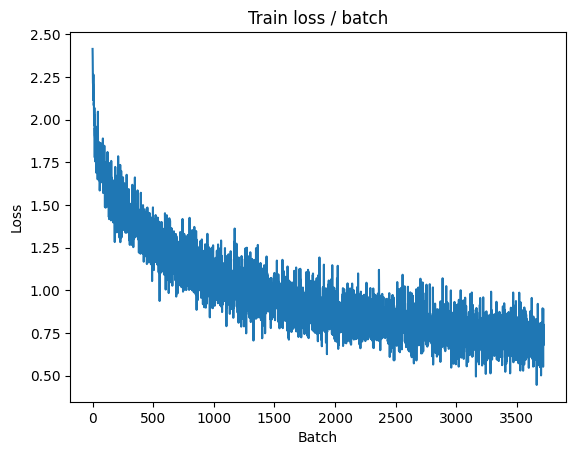


===============> Total time 20s	Avg loss 0.7121	Avg Prec@1 75.01 %	Avg Prec@5 98.40 %

[EVAL Batch 000/079]	Time 0.161s (0.161s)	Loss 0.6641 (0.6641)	Prec@1  80.5 ( 80.5)	Prec@5  96.9 ( 96.9)

===============> Total time 2s	Avg loss 0.7195	Avg Prec@1 75.04 %	Avg Prec@5 98.03 %



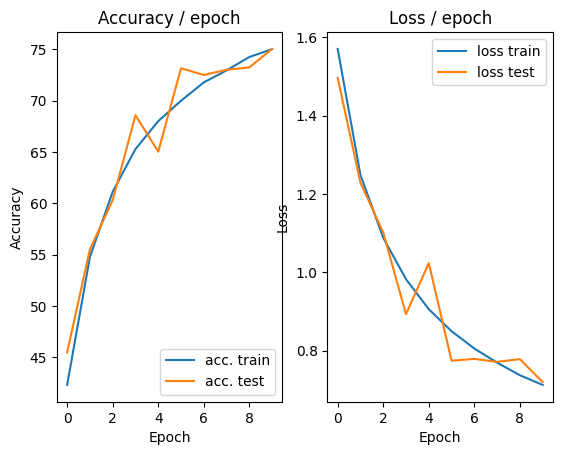

=== EPOCH 11 =====

[TRAIN Batch 000/391]	Time 0.224s (0.224s)	Loss 0.5799 (0.5799)	Prec@1  81.2 ( 81.2)	Prec@5 100.0 (100.0)


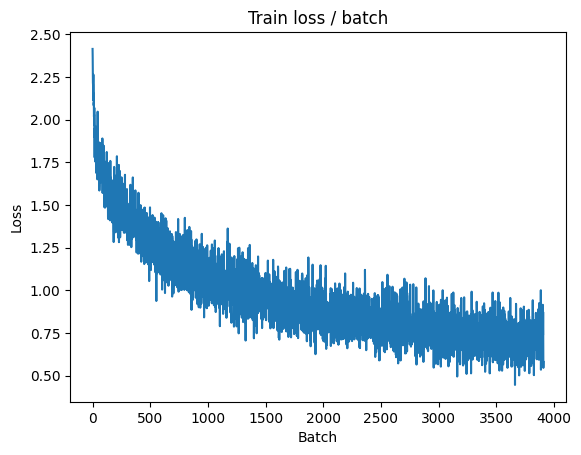

[TRAIN Batch 200/391]	Time 0.073s (0.055s)	Loss 0.6700 (0.6893)	Prec@1  76.6 ( 76.2)	Prec@5  99.2 ( 98.4)


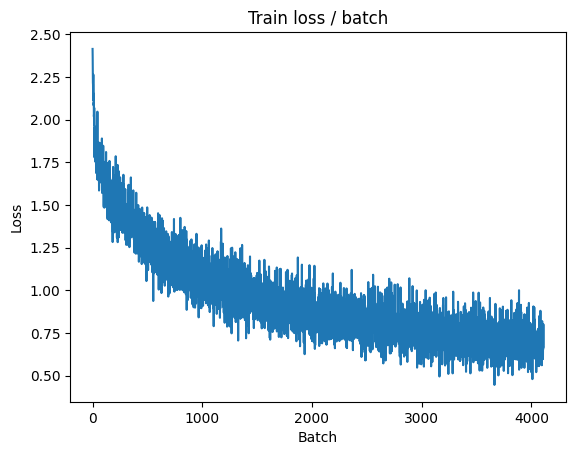


===============> Total time 21s	Avg loss 0.6890	Avg Prec@1 75.96 %	Avg Prec@5 98.46 %

[EVAL Batch 000/079]	Time 0.171s (0.171s)	Loss 0.6332 (0.6332)	Prec@1  80.5 ( 80.5)	Prec@5  97.7 ( 97.7)

===============> Total time 3s	Avg loss 0.6778	Avg Prec@1 76.10 %	Avg Prec@5 98.42 %



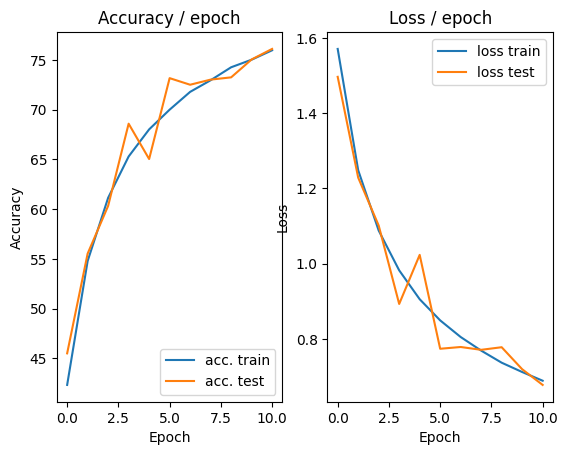

=== EPOCH 12 =====

[TRAIN Batch 000/391]	Time 0.201s (0.201s)	Loss 0.5358 (0.5358)	Prec@1  81.2 ( 81.2)	Prec@5 100.0 (100.0)


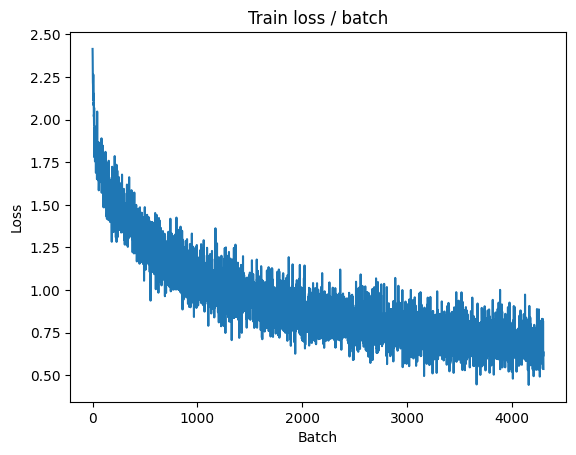

[TRAIN Batch 200/391]	Time 0.095s (0.056s)	Loss 0.7152 (0.6660)	Prec@1  74.2 ( 76.6)	Prec@5  98.4 ( 98.6)


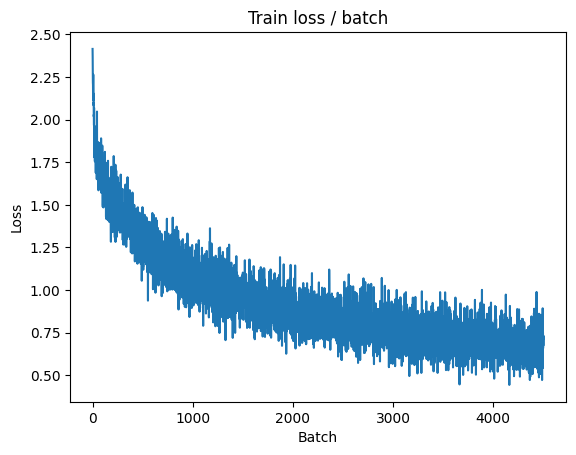


===============> Total time 21s	Avg loss 0.6662	Avg Prec@1 76.68 %	Avg Prec@5 98.56 %

[EVAL Batch 000/079]	Time 0.171s (0.171s)	Loss 0.5500 (0.5500)	Prec@1  81.2 ( 81.2)	Prec@5  97.7 ( 97.7)

===============> Total time 3s	Avg loss 0.6764	Avg Prec@1 75.94 %	Avg Prec@5 98.59 %



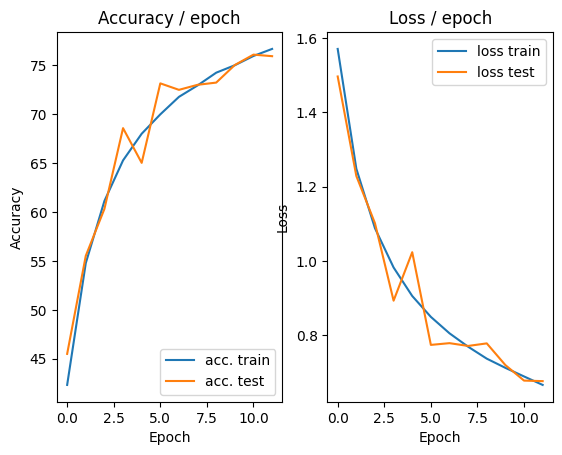

=== EPOCH 13 =====

[TRAIN Batch 000/391]	Time 0.212s (0.212s)	Loss 0.6192 (0.6192)	Prec@1  76.6 ( 76.6)	Prec@5  98.4 ( 98.4)


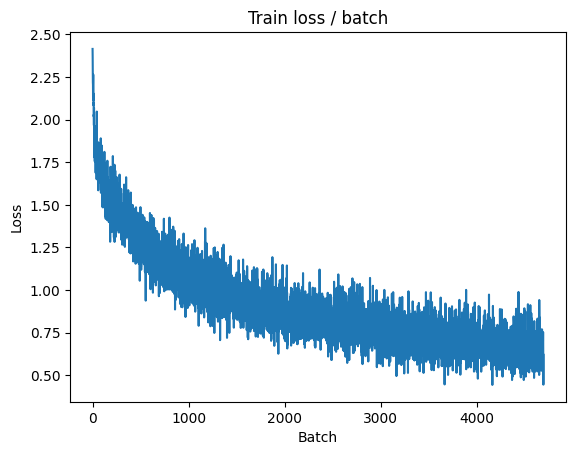

[TRAIN Batch 200/391]	Time 0.010s (0.054s)	Loss 0.6513 (0.6442)	Prec@1  76.6 ( 77.6)	Prec@5  99.2 ( 98.5)


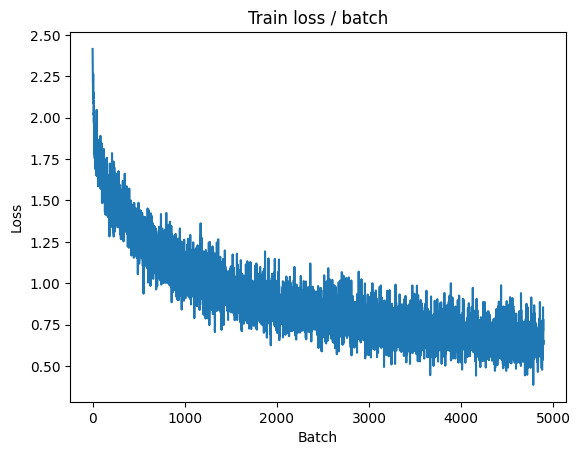


===============> Total time 21s	Avg loss 0.6447	Avg Prec@1 77.63 %	Avg Prec@5 98.58 %

[EVAL Batch 000/079]	Time 0.151s (0.151s)	Loss 0.6254 (0.6254)	Prec@1  77.3 ( 77.3)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.6790	Avg Prec@1 76.25 %	Avg Prec@5 98.51 %



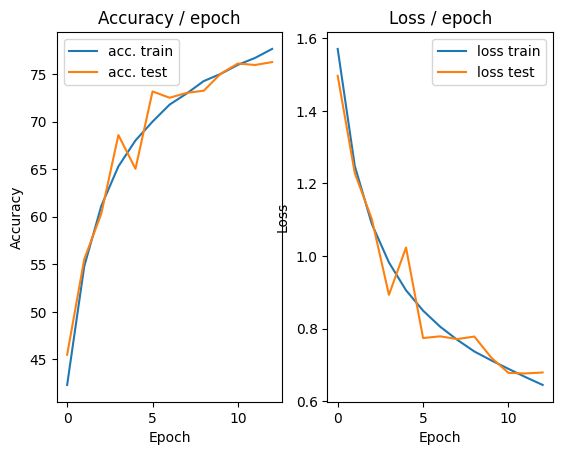

=== EPOCH 14 =====

[TRAIN Batch 000/391]	Time 0.227s (0.227s)	Loss 0.7159 (0.7159)	Prec@1  72.7 ( 72.7)	Prec@5  98.4 ( 98.4)


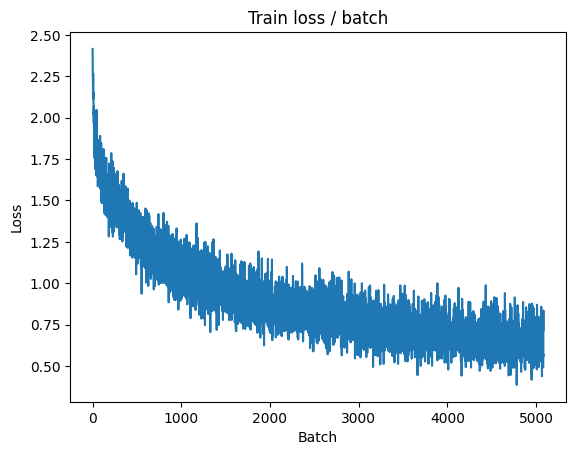

[TRAIN Batch 200/391]	Time 0.048s (0.055s)	Loss 0.5715 (0.6334)	Prec@1  80.5 ( 77.7)	Prec@5  99.2 ( 98.7)


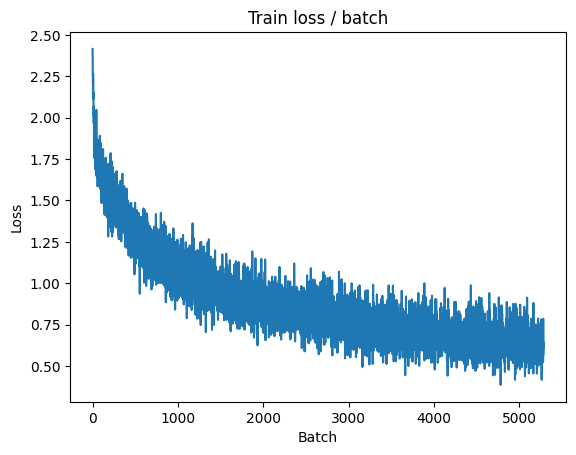


===============> Total time 21s	Avg loss 0.6285	Avg Prec@1 77.94 %	Avg Prec@5 98.76 %

[EVAL Batch 000/079]	Time 0.225s (0.225s)	Loss 0.5365 (0.5365)	Prec@1  82.8 ( 82.8)	Prec@5  96.9 ( 96.9)

===============> Total time 3s	Avg loss 0.6219	Avg Prec@1 78.35 %	Avg Prec@5 98.72 %



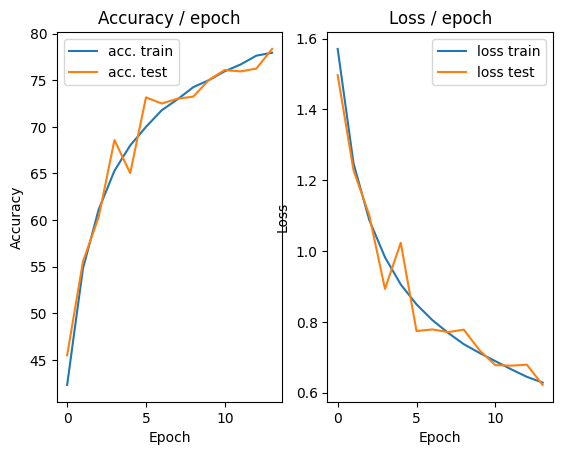

=== EPOCH 15 =====

[TRAIN Batch 000/391]	Time 0.227s (0.227s)	Loss 0.6460 (0.6460)	Prec@1  75.0 ( 75.0)	Prec@5  98.4 ( 98.4)


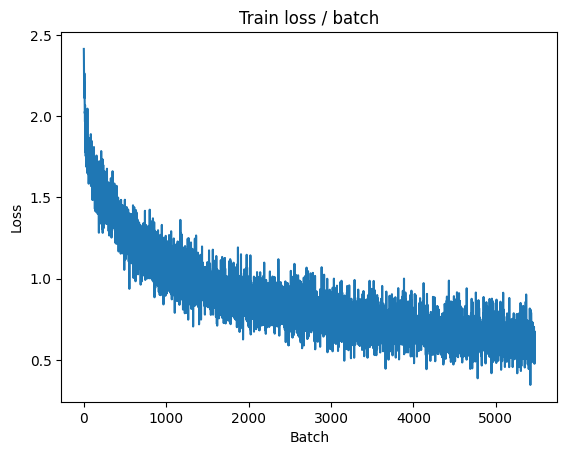

[TRAIN Batch 200/391]	Time 0.076s (0.056s)	Loss 0.5102 (0.6103)	Prec@1  83.6 ( 78.7)	Prec@5  99.2 ( 98.8)


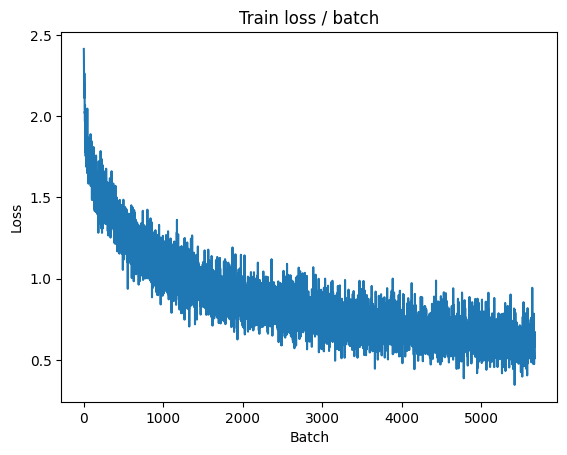


===============> Total time 20s	Avg loss 0.6128	Avg Prec@1 78.58 %	Avg Prec@5 98.81 %

[EVAL Batch 000/079]	Time 0.259s (0.259s)	Loss 0.5284 (0.5284)	Prec@1  80.5 ( 80.5)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.6203	Avg Prec@1 77.94 %	Avg Prec@5 98.73 %



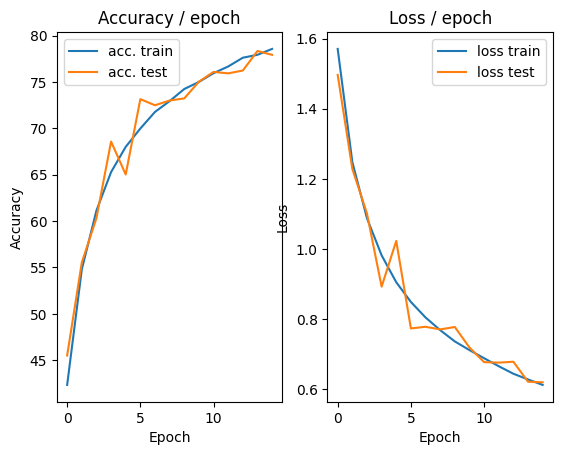

=== EPOCH 16 =====

[TRAIN Batch 000/391]	Time 0.222s (0.222s)	Loss 0.4867 (0.4867)	Prec@1  82.0 ( 82.0)	Prec@5 100.0 (100.0)


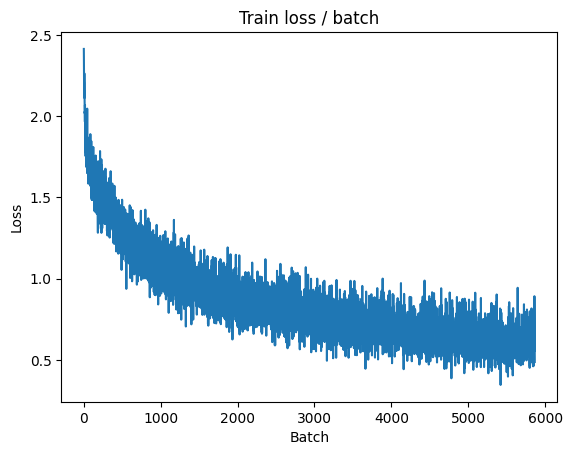

[TRAIN Batch 200/391]	Time 0.012s (0.055s)	Loss 0.6332 (0.5954)	Prec@1  78.9 ( 79.4)	Prec@5  99.2 ( 98.8)


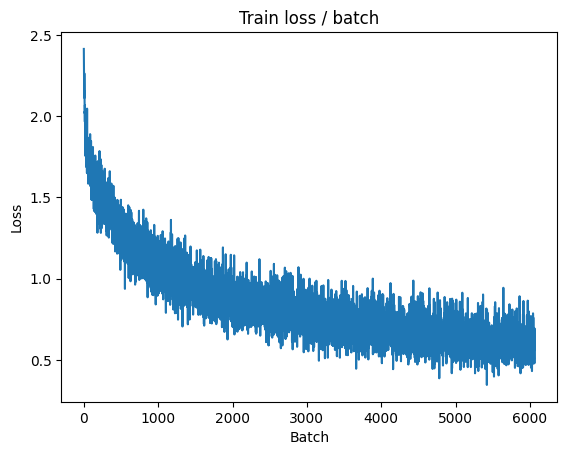


===============> Total time 20s	Avg loss 0.5980	Avg Prec@1 79.27 %	Avg Prec@5 98.82 %

[EVAL Batch 000/079]	Time 0.183s (0.183s)	Loss 0.5617 (0.5617)	Prec@1  83.6 ( 83.6)	Prec@5  98.4 ( 98.4)

===============> Total time 4s	Avg loss 0.6284	Avg Prec@1 78.48 %	Avg Prec@5 98.67 %



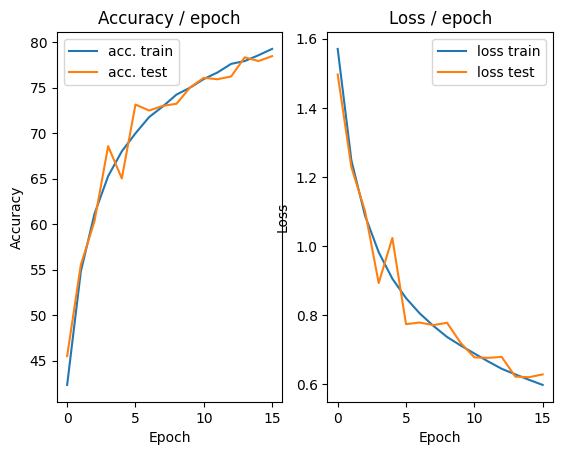

=== EPOCH 17 =====

[TRAIN Batch 000/391]	Time 0.220s (0.220s)	Loss 0.5544 (0.5544)	Prec@1  85.2 ( 85.2)	Prec@5  99.2 ( 99.2)


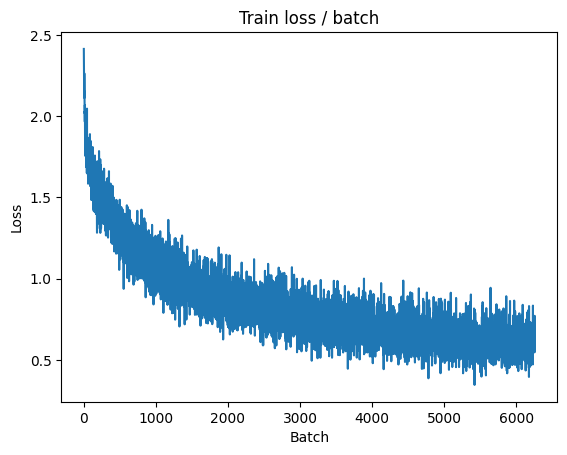

[TRAIN Batch 200/391]	Time 0.141s (0.052s)	Loss 0.7260 (0.5857)	Prec@1  73.4 ( 79.3)	Prec@5  97.7 ( 99.0)


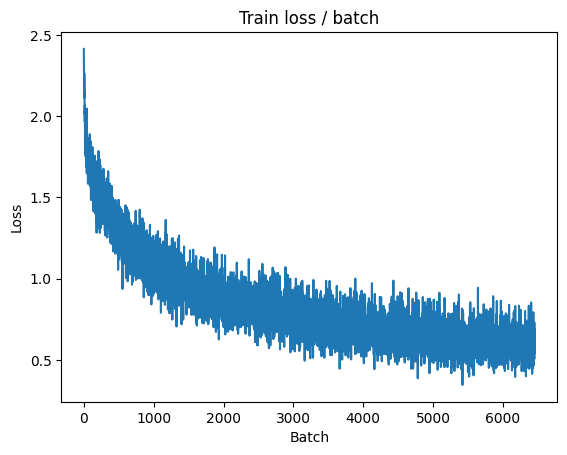


===============> Total time 20s	Avg loss 0.5845	Avg Prec@1 79.51 %	Avg Prec@5 99.03 %

[EVAL Batch 000/079]	Time 0.178s (0.178s)	Loss 0.5370 (0.5370)	Prec@1  82.8 ( 82.8)	Prec@5  96.9 ( 96.9)

===============> Total time 3s	Avg loss 0.6157	Avg Prec@1 78.49 %	Avg Prec@5 98.65 %



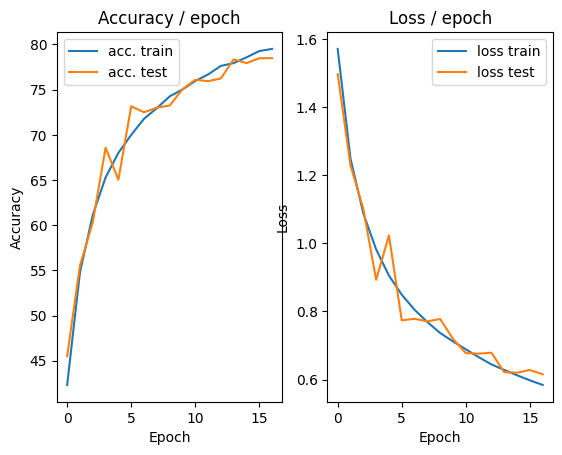

=== EPOCH 18 =====

[TRAIN Batch 000/391]	Time 0.319s (0.319s)	Loss 0.5797 (0.5797)	Prec@1  81.2 ( 81.2)	Prec@5  99.2 ( 99.2)


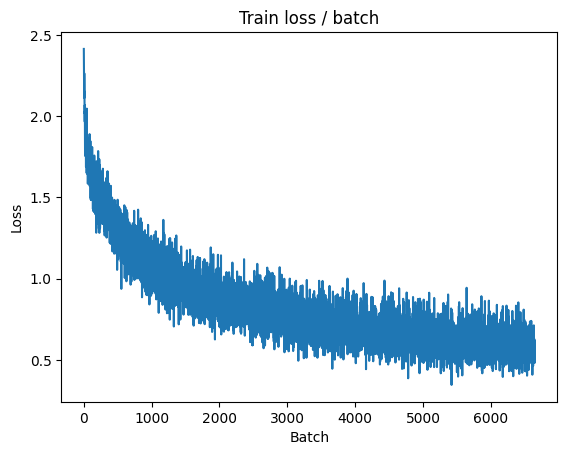

[TRAIN Batch 200/391]	Time 0.025s (0.052s)	Loss 0.5669 (0.5727)	Prec@1  78.9 ( 80.1)	Prec@5  98.4 ( 98.9)


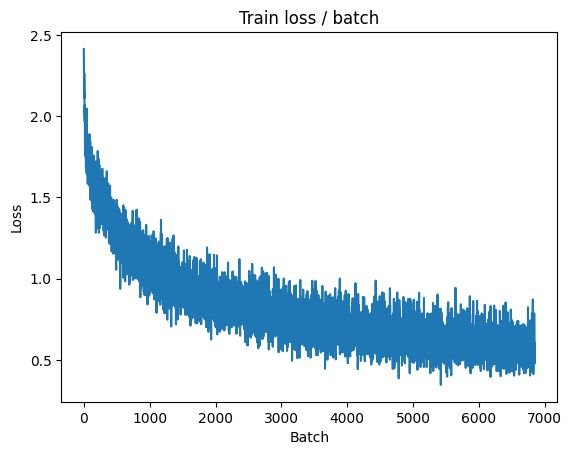


===============> Total time 20s	Avg loss 0.5691	Avg Prec@1 80.14 %	Avg Prec@5 99.01 %

[EVAL Batch 000/079]	Time 0.165s (0.165s)	Loss 0.4709 (0.4709)	Prec@1  85.9 ( 85.9)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.5888	Avg Prec@1 79.48 %	Avg Prec@5 98.86 %



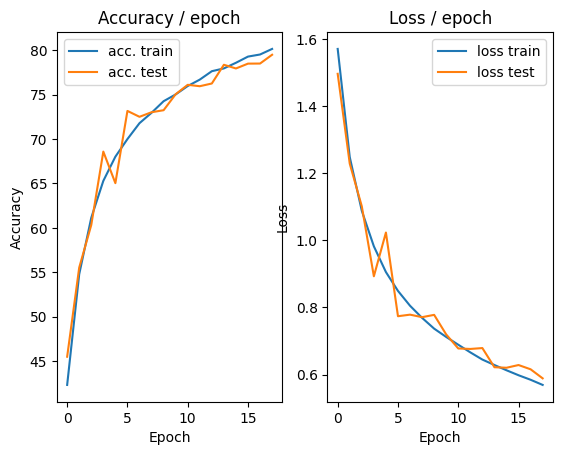

=== EPOCH 19 =====

[TRAIN Batch 000/391]	Time 0.241s (0.241s)	Loss 0.4825 (0.4825)	Prec@1  78.1 ( 78.1)	Prec@5 100.0 (100.0)


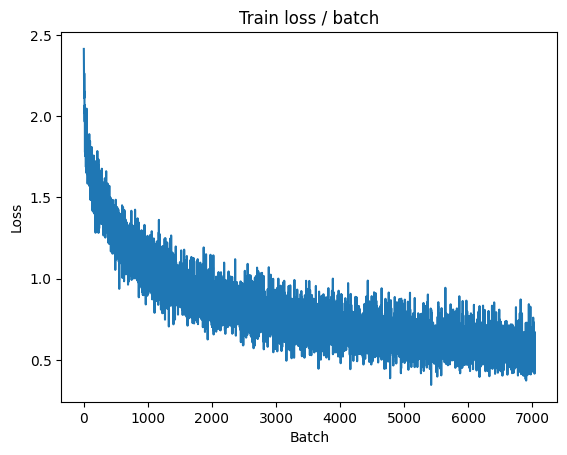

[TRAIN Batch 200/391]	Time 0.069s (0.055s)	Loss 0.6856 (0.5573)	Prec@1  78.1 ( 80.5)	Prec@5  98.4 ( 99.0)


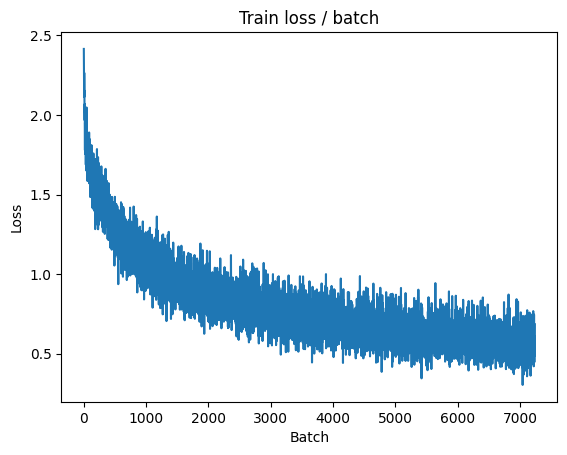


===============> Total time 21s	Avg loss 0.5623	Avg Prec@1 80.33 %	Avg Prec@5 98.99 %

[EVAL Batch 000/079]	Time 0.186s (0.186s)	Loss 0.4780 (0.4780)	Prec@1  86.7 ( 86.7)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.5859	Avg Prec@1 79.94 %	Avg Prec@5 98.82 %



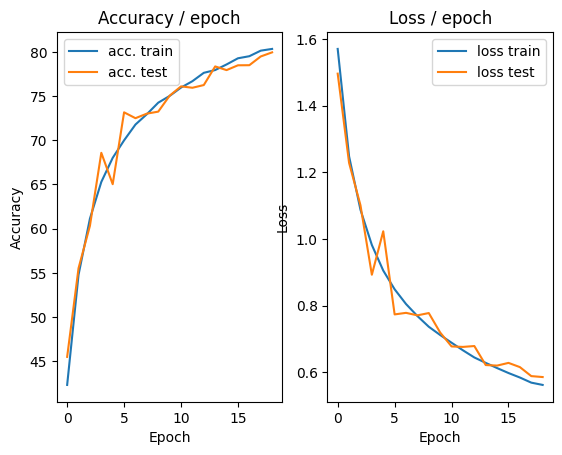

=== EPOCH 20 =====

[TRAIN Batch 000/391]	Time 0.231s (0.231s)	Loss 0.4712 (0.4712)	Prec@1  82.0 ( 82.0)	Prec@5 100.0 (100.0)


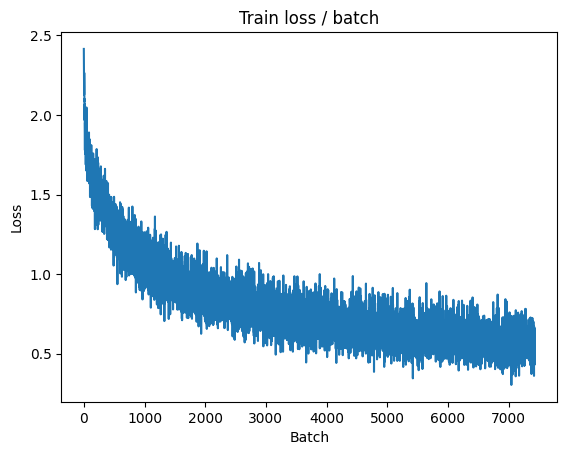

[TRAIN Batch 200/391]	Time 0.016s (0.054s)	Loss 0.6845 (0.5480)	Prec@1  74.2 ( 80.9)	Prec@5  97.7 ( 99.0)


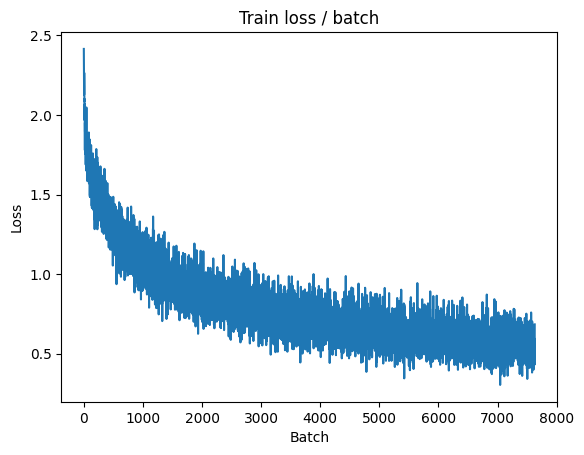


===============> Total time 21s	Avg loss 0.5491	Avg Prec@1 80.86 %	Avg Prec@5 99.08 %

[EVAL Batch 000/079]	Time 0.168s (0.168s)	Loss 0.5294 (0.5294)	Prec@1  82.8 ( 82.8)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.6203	Avg Prec@1 78.42 %	Avg Prec@5 98.83 %



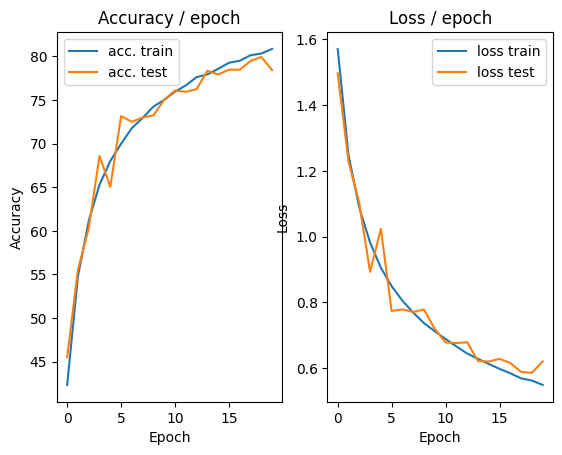

=== EPOCH 21 =====

[TRAIN Batch 000/391]	Time 0.206s (0.206s)	Loss 0.4831 (0.4831)	Prec@1  85.9 ( 85.9)	Prec@5 100.0 (100.0)


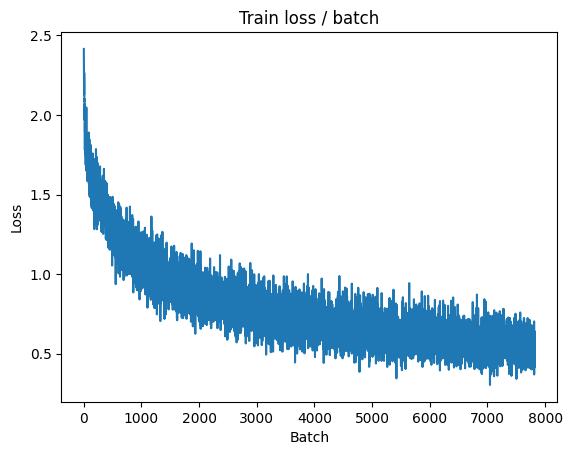

[TRAIN Batch 200/391]	Time 0.111s (0.055s)	Loss 0.5207 (0.5357)	Prec@1  82.0 ( 81.5)	Prec@5 100.0 ( 99.1)


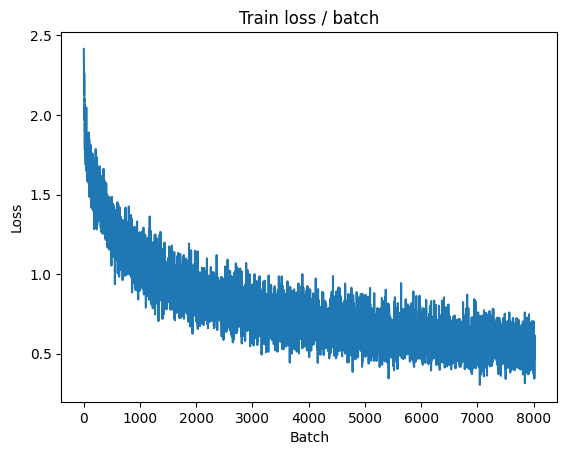


===============> Total time 21s	Avg loss 0.5376	Avg Prec@1 81.50 %	Avg Prec@5 99.15 %

[EVAL Batch 000/079]	Time 0.177s (0.177s)	Loss 0.6111 (0.6111)	Prec@1  78.9 ( 78.9)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.6518	Avg Prec@1 77.46 %	Avg Prec@5 98.49 %



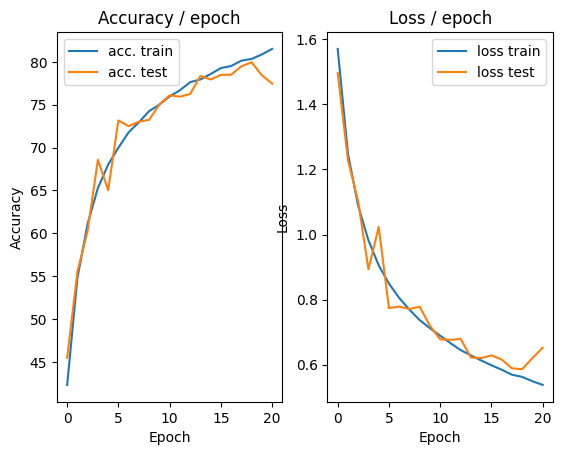

=== EPOCH 22 =====

[TRAIN Batch 000/391]	Time 0.240s (0.240s)	Loss 0.5912 (0.5912)	Prec@1  75.0 ( 75.0)	Prec@5 100.0 (100.0)


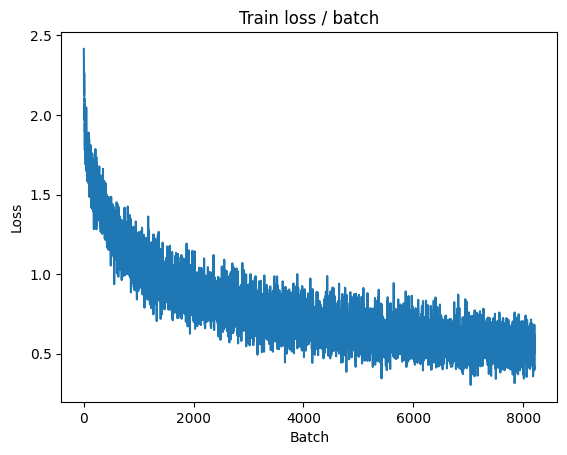

[TRAIN Batch 200/391]	Time 0.099s (0.055s)	Loss 0.4347 (0.5359)	Prec@1  85.2 ( 81.0)	Prec@5  99.2 ( 99.1)


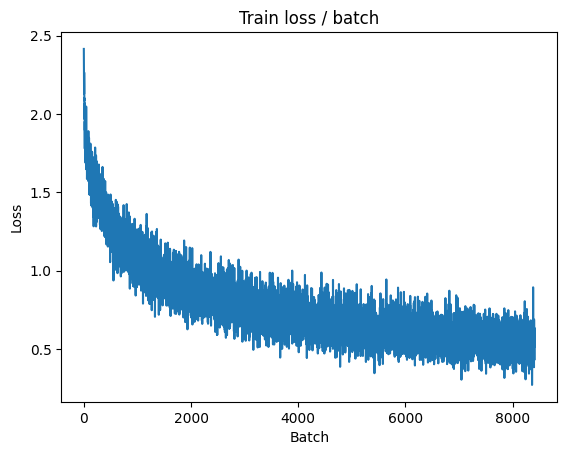


===============> Total time 21s	Avg loss 0.5295	Avg Prec@1 81.28 %	Avg Prec@5 99.08 %

[EVAL Batch 000/079]	Time 0.161s (0.161s)	Loss 0.4603 (0.4603)	Prec@1  86.7 ( 86.7)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.5615	Avg Prec@1 80.48 %	Avg Prec@5 98.94 %



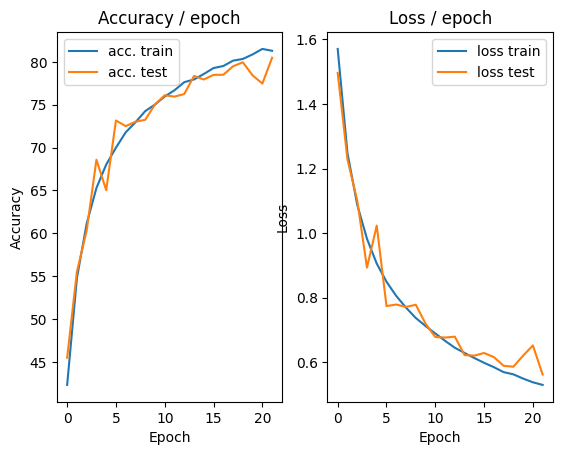

=== EPOCH 23 =====

[TRAIN Batch 000/391]	Time 0.225s (0.225s)	Loss 0.4911 (0.4911)	Prec@1  82.0 ( 82.0)	Prec@5 100.0 (100.0)


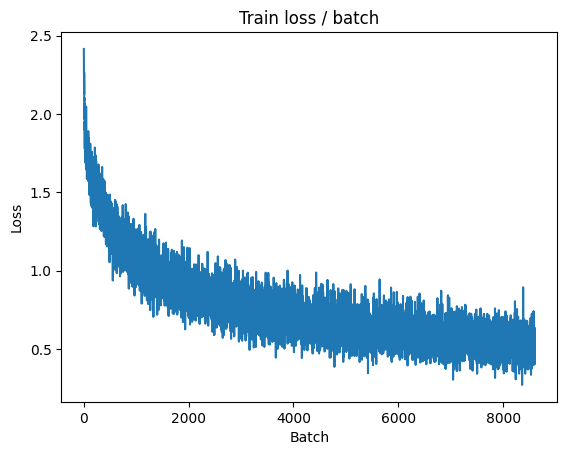

[TRAIN Batch 200/391]	Time 0.017s (0.055s)	Loss 0.4191 (0.5186)	Prec@1  83.6 ( 82.0)	Prec@5 100.0 ( 99.2)


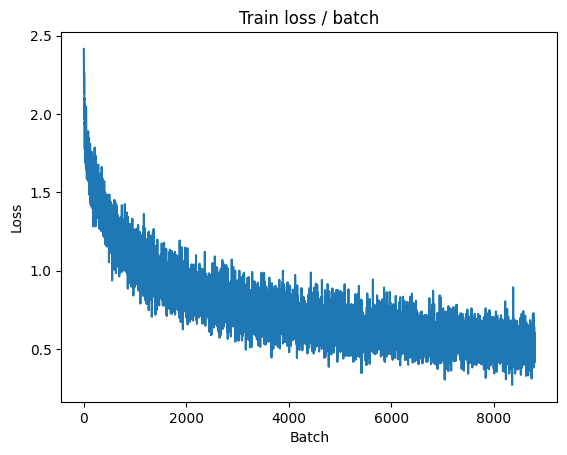


===============> Total time 20s	Avg loss 0.5204	Avg Prec@1 81.86 %	Avg Prec@5 99.16 %

[EVAL Batch 000/079]	Time 0.211s (0.211s)	Loss 0.4768 (0.4768)	Prec@1  85.9 ( 85.9)	Prec@5  96.9 ( 96.9)

===============> Total time 3s	Avg loss 0.5775	Avg Prec@1 80.23 %	Avg Prec@5 98.70 %



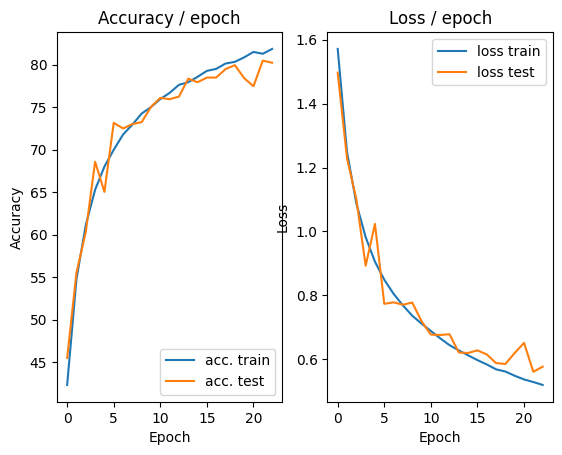

=== EPOCH 24 =====

[TRAIN Batch 000/391]	Time 0.241s (0.241s)	Loss 0.5227 (0.5227)	Prec@1  84.4 ( 84.4)	Prec@5  97.7 ( 97.7)


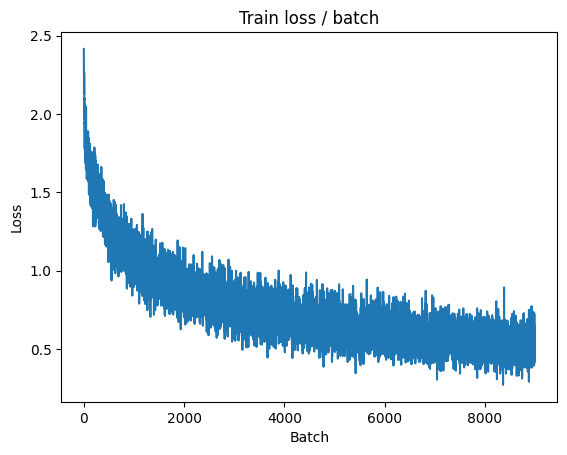

[TRAIN Batch 200/391]	Time 0.023s (0.056s)	Loss 0.3335 (0.5123)	Prec@1  89.1 ( 82.0)	Prec@5  99.2 ( 99.1)


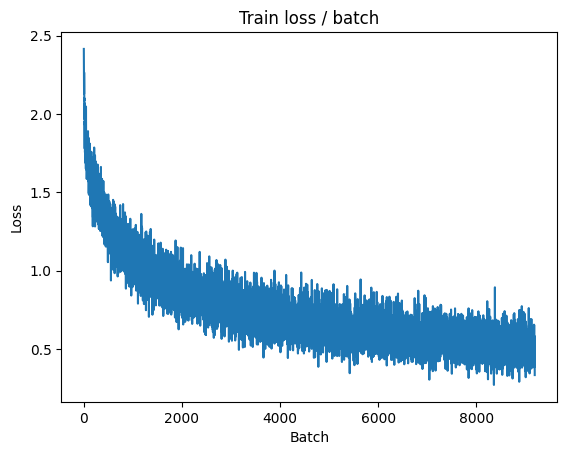


===============> Total time 20s	Avg loss 0.5138	Avg Prec@1 81.97 %	Avg Prec@5 99.14 %

[EVAL Batch 000/079]	Time 0.171s (0.171s)	Loss 0.4906 (0.4906)	Prec@1  83.6 ( 83.6)	Prec@5  98.4 ( 98.4)

===============> Total time 4s	Avg loss 0.5976	Avg Prec@1 79.07 %	Avg Prec@5 98.70 %



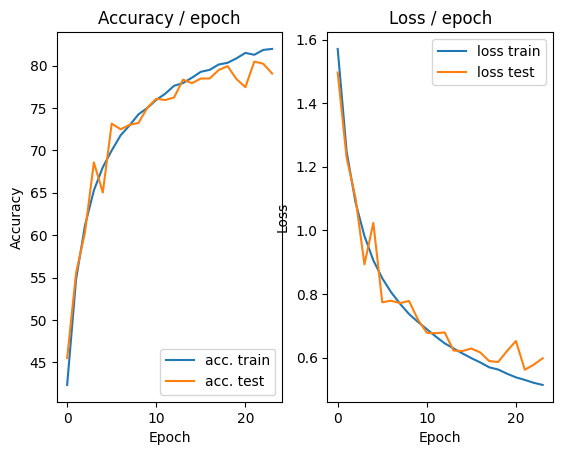

=== EPOCH 25 =====

[TRAIN Batch 000/391]	Time 0.240s (0.240s)	Loss 0.5649 (0.5649)	Prec@1  82.0 ( 82.0)	Prec@5  99.2 ( 99.2)


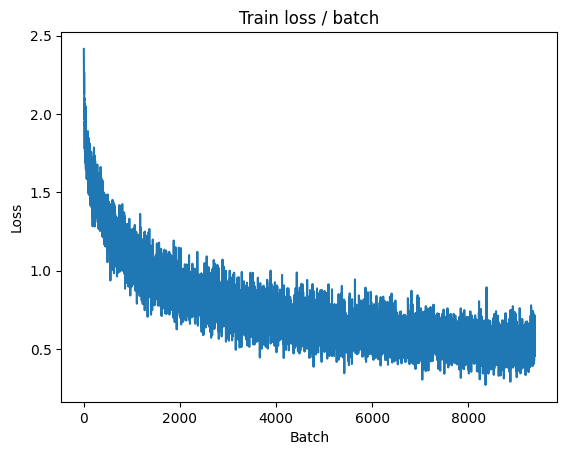

[TRAIN Batch 200/391]	Time 0.024s (0.050s)	Loss 0.4220 (0.5094)	Prec@1  82.8 ( 82.2)	Prec@5  99.2 ( 99.2)


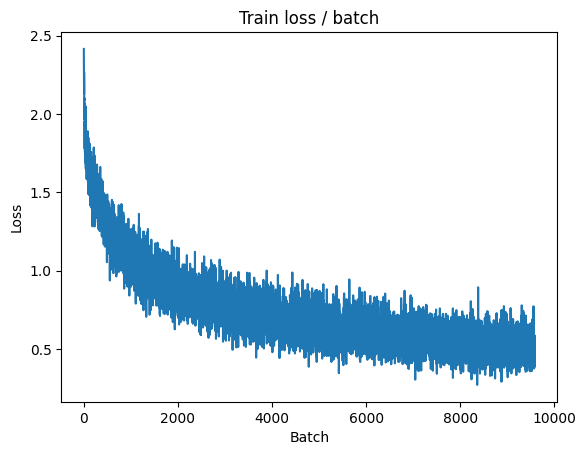


===============> Total time 20s	Avg loss 0.5057	Avg Prec@1 82.33 %	Avg Prec@5 99.24 %

[EVAL Batch 000/079]	Time 0.168s (0.168s)	Loss 0.5002 (0.5002)	Prec@1  83.6 ( 83.6)	Prec@5  96.9 ( 96.9)

===============> Total time 3s	Avg loss 0.5475	Avg Prec@1 80.84 %	Avg Prec@5 98.97 %



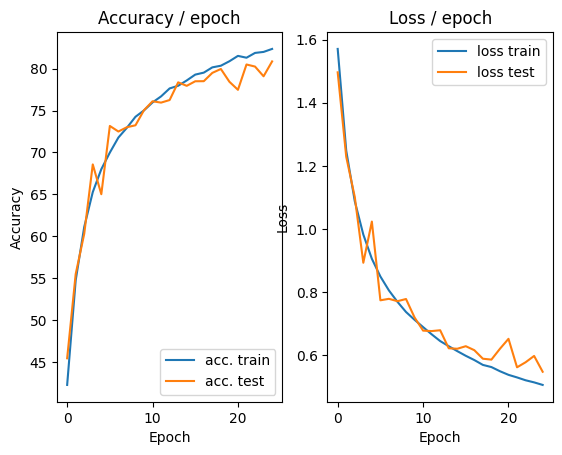

=== EPOCH 26 =====

[TRAIN Batch 000/391]	Time 0.410s (0.410s)	Loss 0.5093 (0.5093)	Prec@1  82.8 ( 82.8)	Prec@5  98.4 ( 98.4)


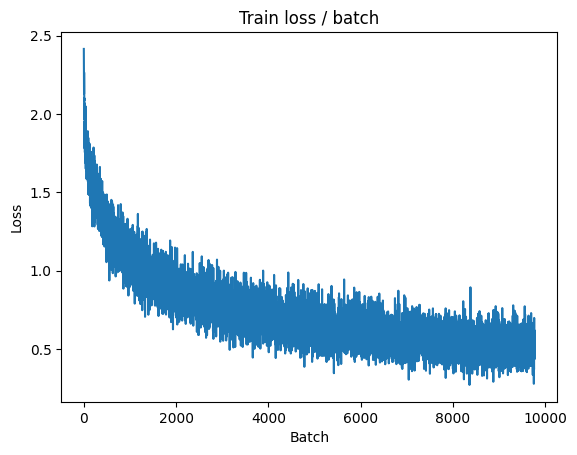

[TRAIN Batch 200/391]	Time 0.084s (0.051s)	Loss 0.4565 (0.4929)	Prec@1  85.2 ( 82.8)	Prec@5  98.4 ( 99.2)


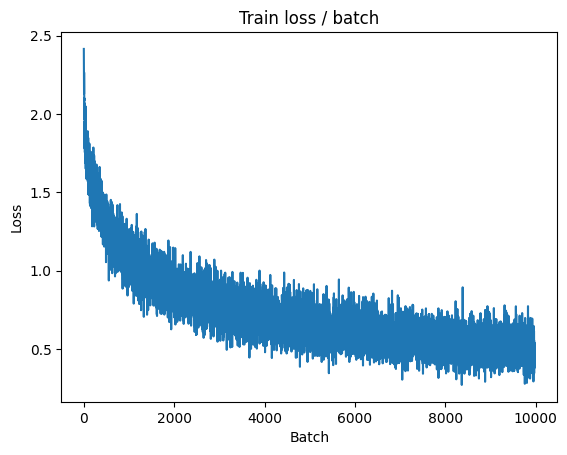


===============> Total time 20s	Avg loss 0.4971	Avg Prec@1 82.61 %	Avg Prec@5 99.18 %

[EVAL Batch 000/079]	Time 0.177s (0.177s)	Loss 0.4378 (0.4378)	Prec@1  85.2 ( 85.2)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.5442	Avg Prec@1 81.30 %	Avg Prec@5 99.08 %



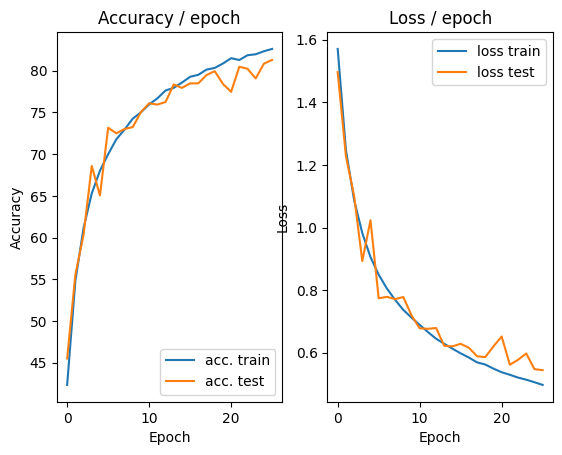

=== EPOCH 27 =====

[TRAIN Batch 000/391]	Time 0.234s (0.234s)	Loss 0.6077 (0.6077)	Prec@1  78.9 ( 78.9)	Prec@5 100.0 (100.0)


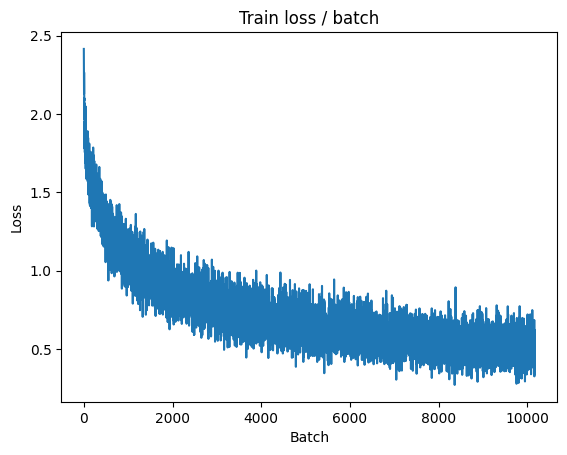

[TRAIN Batch 200/391]	Time 0.056s (0.055s)	Loss 0.4541 (0.4869)	Prec@1  84.4 ( 83.1)	Prec@5  99.2 ( 99.3)


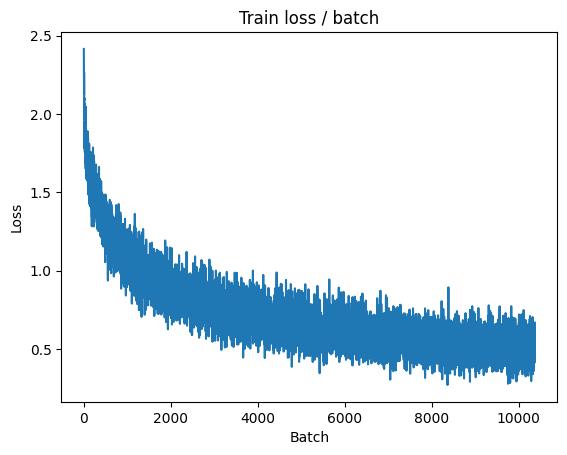


===============> Total time 21s	Avg loss 0.4876	Avg Prec@1 83.06 %	Avg Prec@5 99.32 %

[EVAL Batch 000/079]	Time 0.189s (0.189s)	Loss 0.4211 (0.4211)	Prec@1  86.7 ( 86.7)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.5433	Avg Prec@1 81.35 %	Avg Prec@5 99.06 %



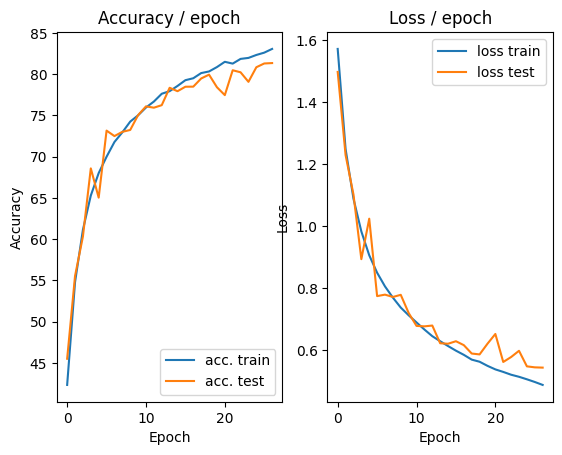

=== EPOCH 28 =====

[TRAIN Batch 000/391]	Time 0.236s (0.236s)	Loss 0.7160 (0.7160)	Prec@1  77.3 ( 77.3)	Prec@5  96.1 ( 96.1)


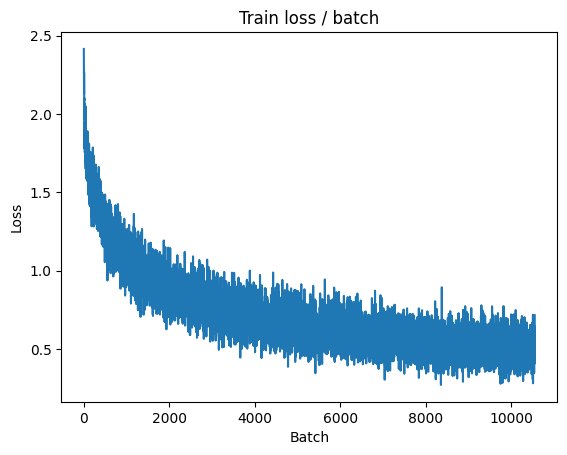

[TRAIN Batch 200/391]	Time 0.077s (0.055s)	Loss 0.3388 (0.4834)	Prec@1  88.3 ( 83.5)	Prec@5  99.2 ( 99.2)


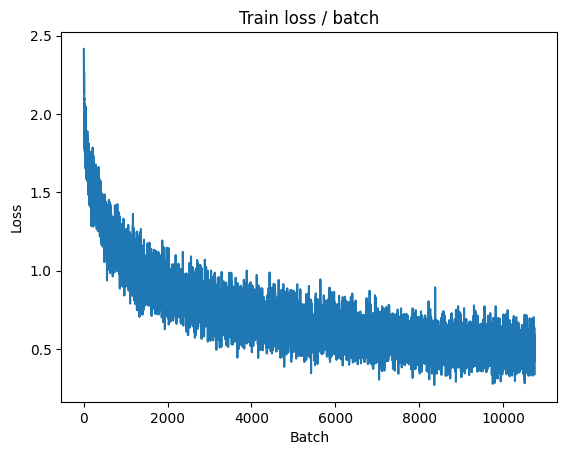


===============> Total time 21s	Avg loss 0.4823	Avg Prec@1 83.39 %	Avg Prec@5 99.23 %

[EVAL Batch 000/079]	Time 0.166s (0.166s)	Loss 0.4314 (0.4314)	Prec@1  85.9 ( 85.9)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.5483	Avg Prec@1 80.82 %	Avg Prec@5 98.92 %



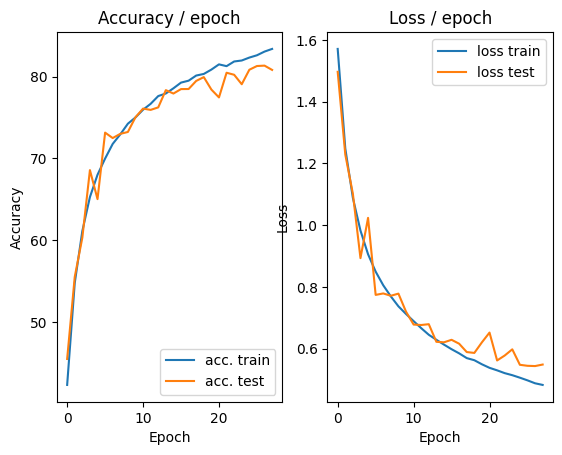

=== EPOCH 29 =====

[TRAIN Batch 000/391]	Time 0.251s (0.251s)	Loss 0.5689 (0.5689)	Prec@1  81.2 ( 81.2)	Prec@5  97.7 ( 97.7)


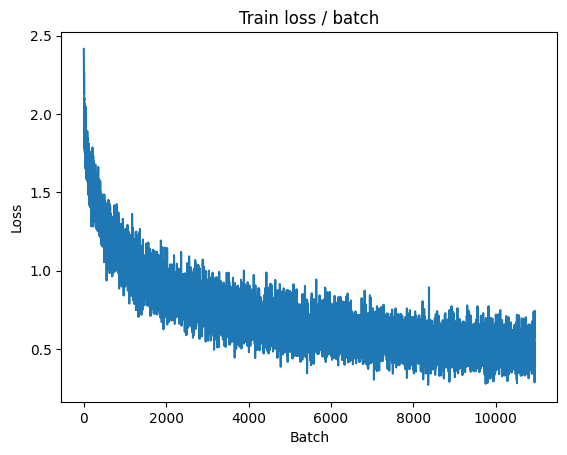

[TRAIN Batch 200/391]	Time 0.020s (0.055s)	Loss 0.6660 (0.4772)	Prec@1  75.8 ( 83.4)	Prec@5 100.0 ( 99.3)


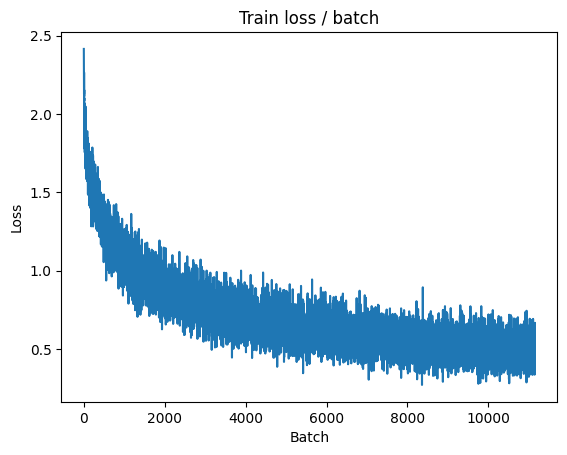


===============> Total time 21s	Avg loss 0.4770	Avg Prec@1 83.51 %	Avg Prec@5 99.27 %

[EVAL Batch 000/079]	Time 0.180s (0.180s)	Loss 0.4948 (0.4948)	Prec@1  83.6 ( 83.6)	Prec@5  98.4 ( 98.4)

===============> Total time 2s	Avg loss 0.5702	Avg Prec@1 80.03 %	Avg Prec@5 99.02 %



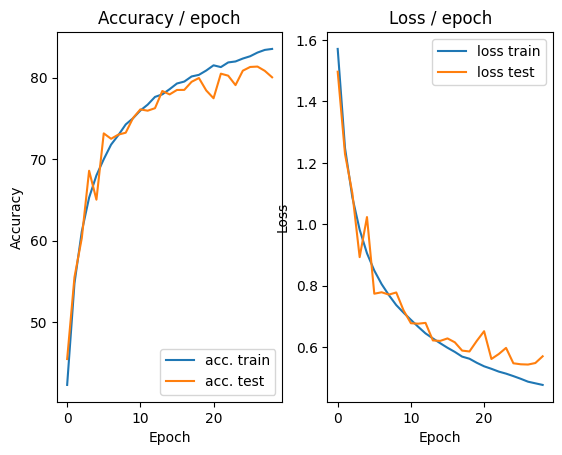

=== EPOCH 30 =====

[TRAIN Batch 000/391]	Time 0.253s (0.253s)	Loss 0.4902 (0.4902)	Prec@1  82.0 ( 82.0)	Prec@5 100.0 (100.0)


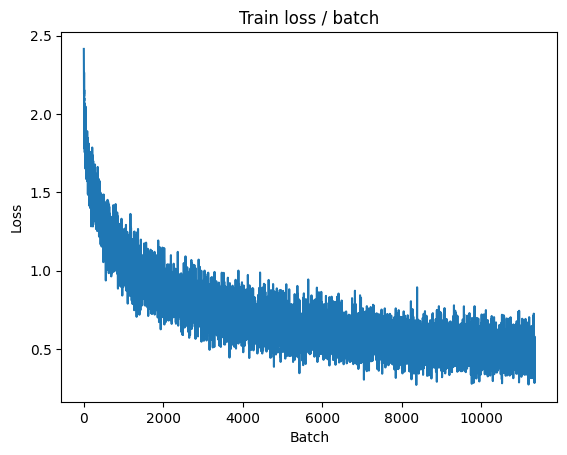

[TRAIN Batch 200/391]	Time 0.067s (0.055s)	Loss 0.5043 (0.4739)	Prec@1  81.2 ( 83.3)	Prec@5  99.2 ( 99.3)


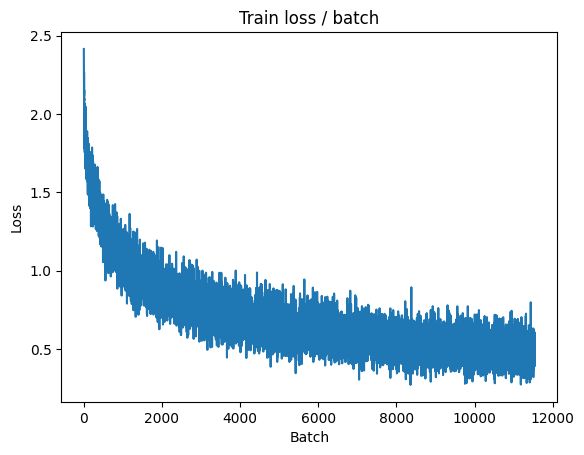


===============> Total time 21s	Avg loss 0.4712	Avg Prec@1 83.36 %	Avg Prec@5 99.31 %

[EVAL Batch 000/079]	Time 0.277s (0.277s)	Loss 0.4865 (0.4865)	Prec@1  82.0 ( 82.0)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.5599	Avg Prec@1 80.63 %	Avg Prec@5 98.86 %



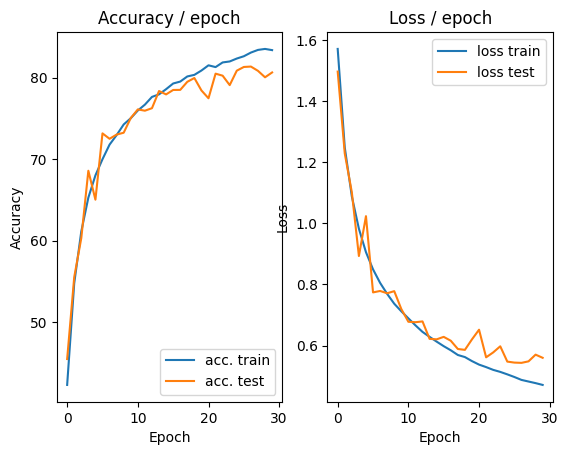

=== EPOCH 31 =====

[TRAIN Batch 000/391]	Time 0.205s (0.205s)	Loss 0.4672 (0.4672)	Prec@1  85.2 ( 85.2)	Prec@5 100.0 (100.0)


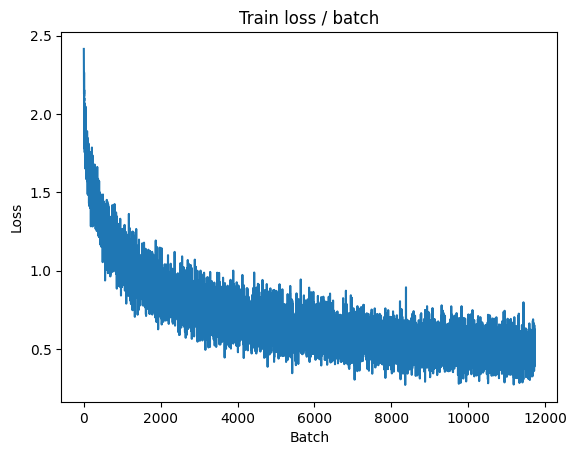

[TRAIN Batch 200/391]	Time 0.078s (0.055s)	Loss 0.4807 (0.4585)	Prec@1  82.8 ( 83.9)	Prec@5  98.4 ( 99.4)


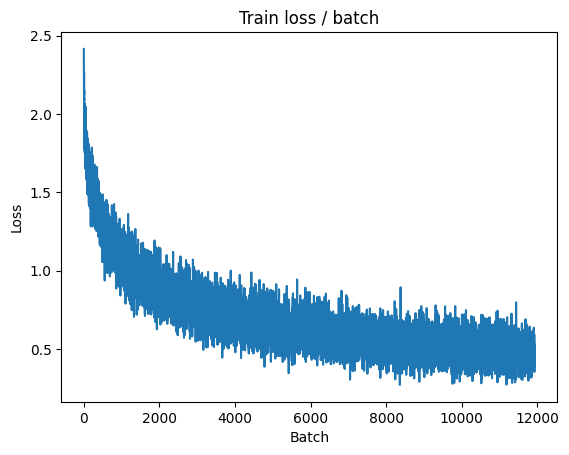


===============> Total time 20s	Avg loss 0.4675	Avg Prec@1 83.53 %	Avg Prec@5 99.37 %

[EVAL Batch 000/079]	Time 0.197s (0.197s)	Loss 0.4228 (0.4228)	Prec@1  85.9 ( 85.9)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.5441	Avg Prec@1 81.20 %	Avg Prec@5 99.02 %



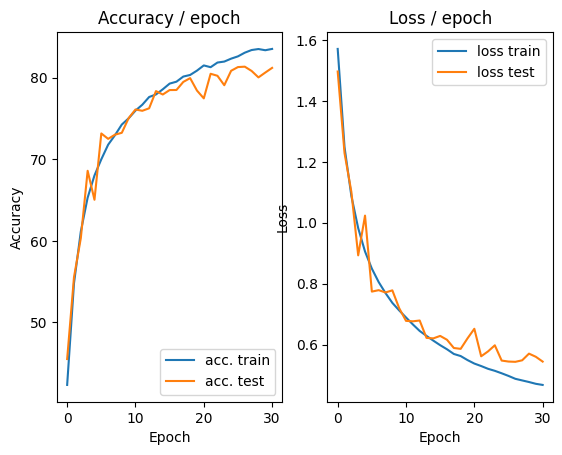

=== EPOCH 32 =====

[TRAIN Batch 000/391]	Time 0.224s (0.224s)	Loss 0.4923 (0.4923)	Prec@1  83.6 ( 83.6)	Prec@5 100.0 (100.0)


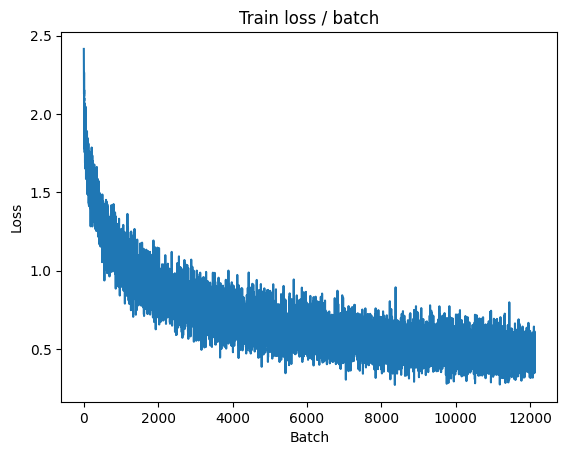

[TRAIN Batch 200/391]	Time 0.070s (0.054s)	Loss 0.4037 (0.4582)	Prec@1  84.4 ( 84.3)	Prec@5 100.0 ( 99.3)


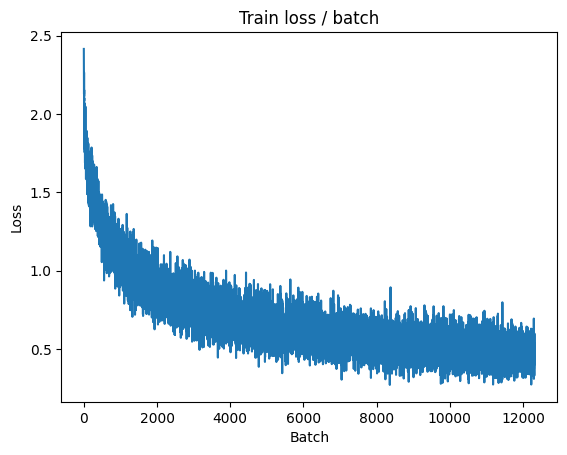


===============> Total time 20s	Avg loss 0.4614	Avg Prec@1 84.16 %	Avg Prec@5 99.30 %

[EVAL Batch 000/079]	Time 0.193s (0.193s)	Loss 0.4082 (0.4082)	Prec@1  88.3 ( 88.3)	Prec@5  99.2 ( 99.2)

===============> Total time 4s	Avg loss 0.5203	Avg Prec@1 82.16 %	Avg Prec@5 99.09 %



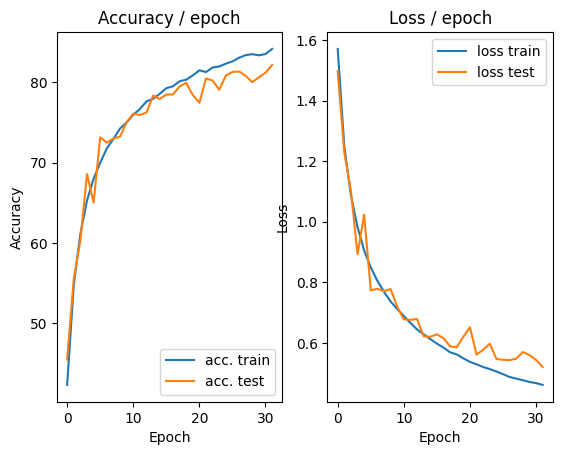

=== EPOCH 33 =====

[TRAIN Batch 000/391]	Time 0.274s (0.274s)	Loss 0.3904 (0.3904)	Prec@1  85.2 ( 85.2)	Prec@5  99.2 ( 99.2)


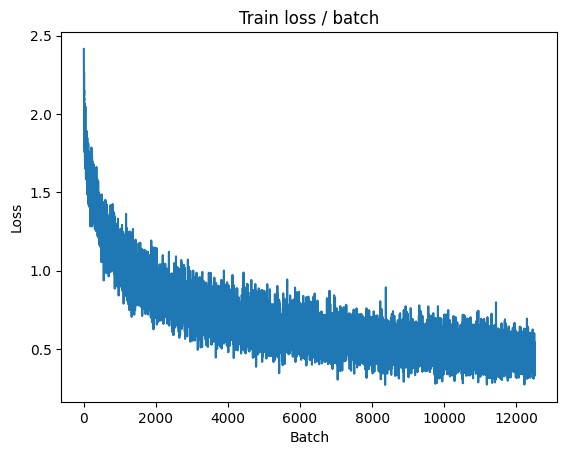

[TRAIN Batch 200/391]	Time 0.138s (0.052s)	Loss 0.5134 (0.4476)	Prec@1  80.5 ( 84.6)	Prec@5  99.2 ( 99.5)


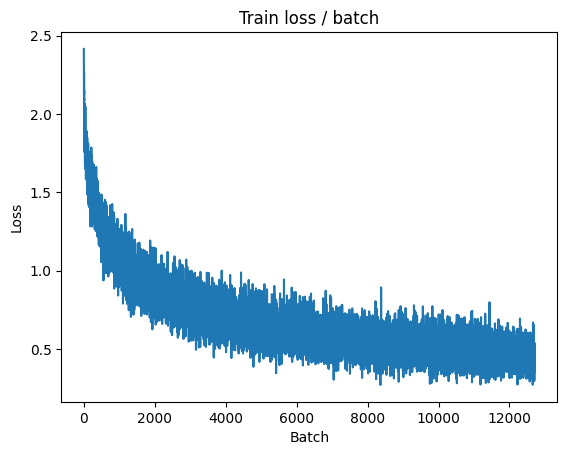


===============> Total time 20s	Avg loss 0.4539	Avg Prec@1 84.23 %	Avg Prec@5 99.37 %

[EVAL Batch 000/079]	Time 0.219s (0.219s)	Loss 0.3936 (0.3936)	Prec@1  86.7 ( 86.7)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.5167	Avg Prec@1 82.01 %	Avg Prec@5 99.04 %



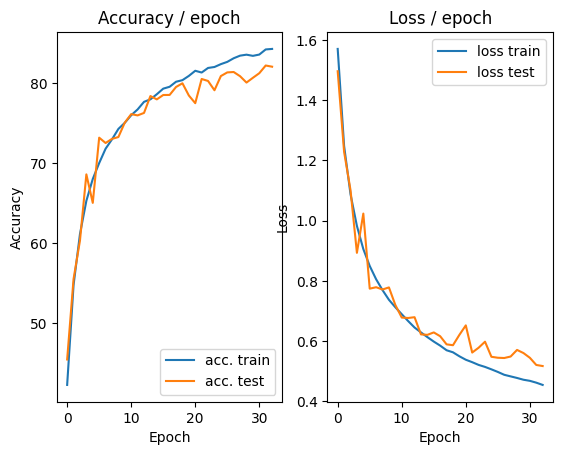

=== EPOCH 34 =====

[TRAIN Batch 000/391]	Time 0.354s (0.354s)	Loss 0.5301 (0.5301)	Prec@1  81.2 ( 81.2)	Prec@5 100.0 (100.0)


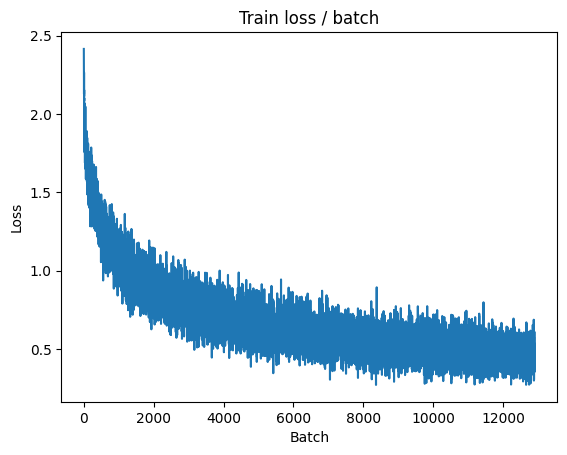

[TRAIN Batch 200/391]	Time 0.026s (0.052s)	Loss 0.3357 (0.4467)	Prec@1  90.6 ( 84.3)	Prec@5 100.0 ( 99.3)


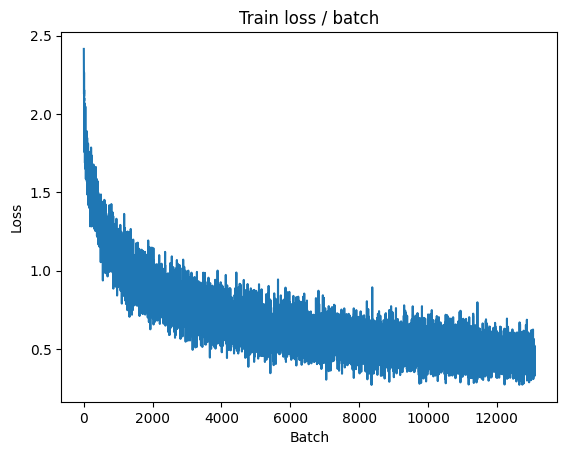


===============> Total time 20s	Avg loss 0.4492	Avg Prec@1 84.25 %	Avg Prec@5 99.37 %

[EVAL Batch 000/079]	Time 0.182s (0.182s)	Loss 0.4244 (0.4244)	Prec@1  87.5 ( 87.5)	Prec@5  97.7 ( 97.7)

===============> Total time 2s	Avg loss 0.5113	Avg Prec@1 82.46 %	Avg Prec@5 99.02 %



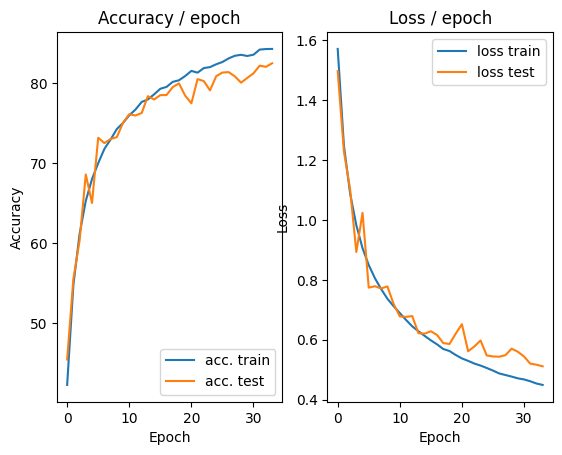

=== EPOCH 35 =====

[TRAIN Batch 000/391]	Time 0.207s (0.207s)	Loss 0.4302 (0.4302)	Prec@1  85.2 ( 85.2)	Prec@5 100.0 (100.0)


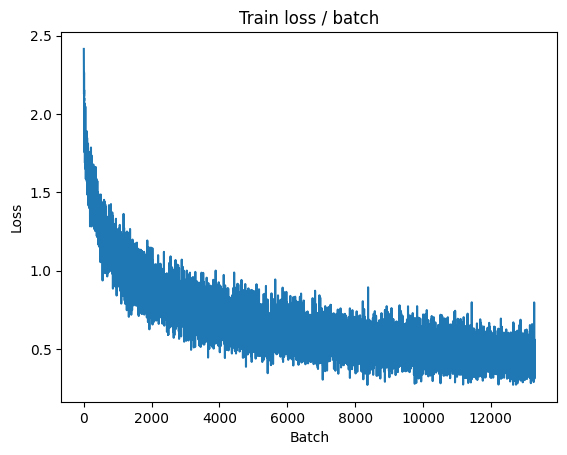

[TRAIN Batch 200/391]	Time 0.010s (0.055s)	Loss 0.5669 (0.4437)	Prec@1  78.9 ( 84.3)	Prec@5  99.2 ( 99.4)


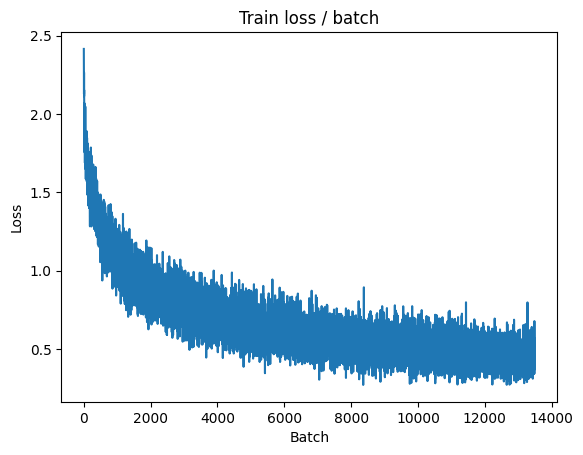


===============> Total time 21s	Avg loss 0.4450	Avg Prec@1 84.44 %	Avg Prec@5 99.41 %

[EVAL Batch 000/079]	Time 0.195s (0.195s)	Loss 0.4260 (0.4260)	Prec@1  89.1 ( 89.1)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.5083	Avg Prec@1 82.56 %	Avg Prec@5 99.15 %



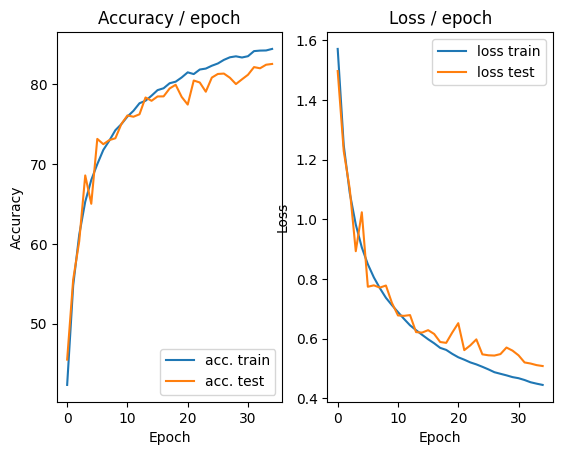

=== EPOCH 36 =====

[TRAIN Batch 000/391]	Time 0.291s (0.291s)	Loss 0.5288 (0.5288)	Prec@1  81.2 ( 81.2)	Prec@5  98.4 ( 98.4)


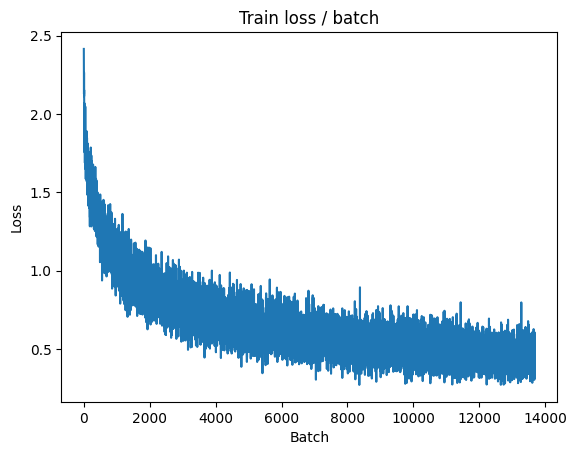

[TRAIN Batch 200/391]	Time 0.010s (0.055s)	Loss 0.4297 (0.4500)	Prec@1  82.8 ( 84.2)	Prec@5  98.4 ( 99.4)


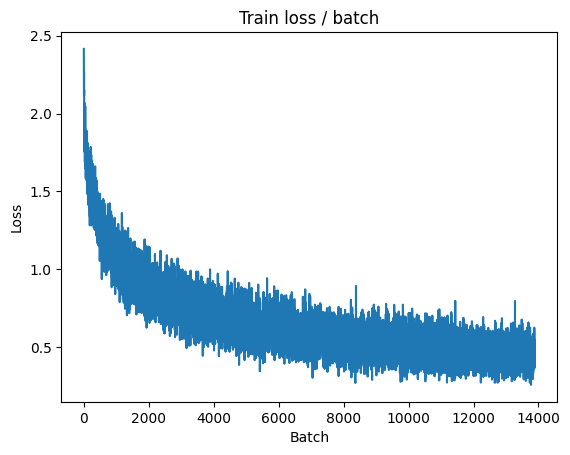


===============> Total time 21s	Avg loss 0.4455	Avg Prec@1 84.37 %	Avg Prec@5 99.43 %

[EVAL Batch 000/079]	Time 0.187s (0.187s)	Loss 0.4153 (0.4153)	Prec@1  88.3 ( 88.3)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.5118	Avg Prec@1 82.53 %	Avg Prec@5 99.10 %



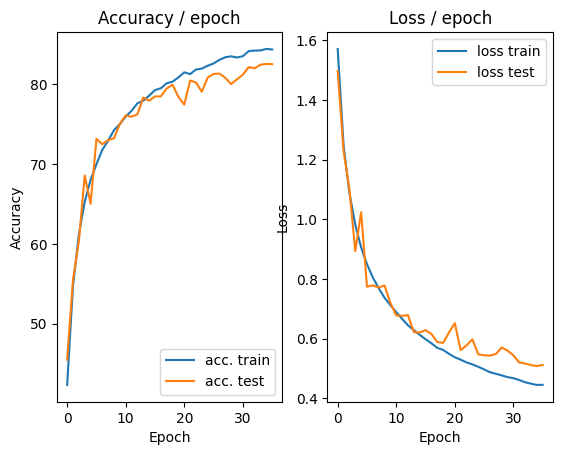

=== EPOCH 37 =====

[TRAIN Batch 000/391]	Time 0.225s (0.225s)	Loss 0.3645 (0.3645)	Prec@1  85.2 ( 85.2)	Prec@5 100.0 (100.0)


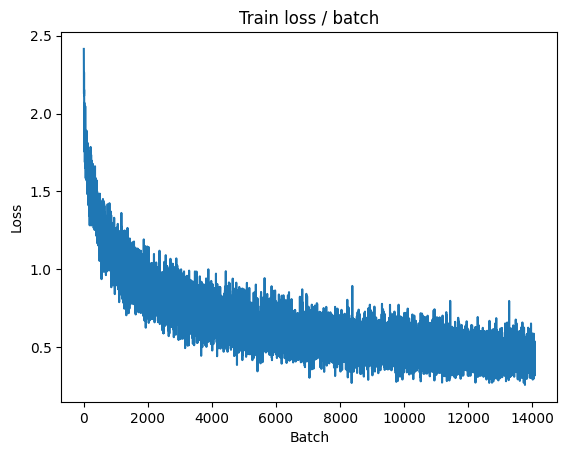

[TRAIN Batch 200/391]	Time 0.068s (0.055s)	Loss 0.4247 (0.4379)	Prec@1  89.1 ( 84.7)	Prec@5  99.2 ( 99.4)


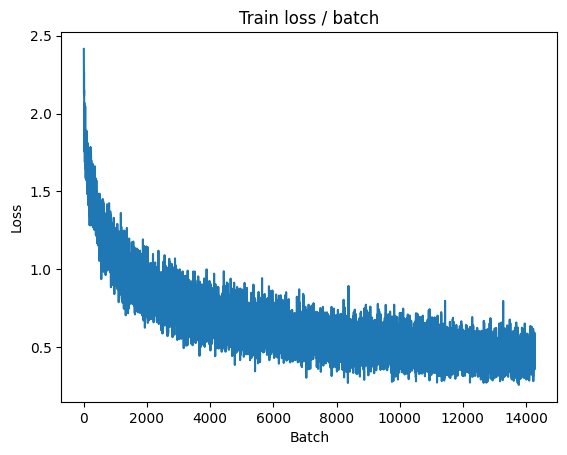


===============> Total time 21s	Avg loss 0.4365	Avg Prec@1 84.67 %	Avg Prec@5 99.42 %

[EVAL Batch 000/079]	Time 0.179s (0.179s)	Loss 0.4461 (0.4461)	Prec@1  87.5 ( 87.5)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.5227	Avg Prec@1 82.19 %	Avg Prec@5 99.07 %



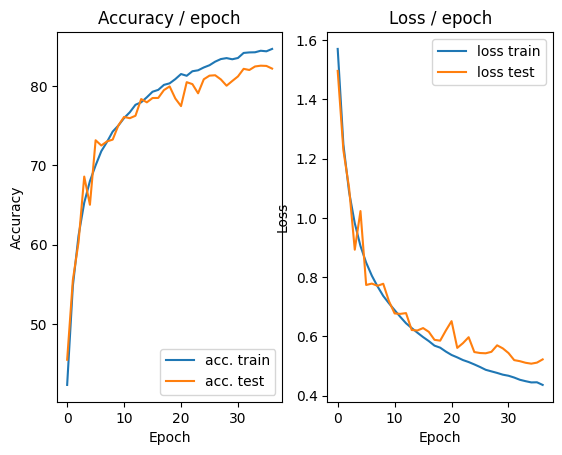

=== EPOCH 38 =====

[TRAIN Batch 000/391]	Time 0.249s (0.249s)	Loss 0.3496 (0.3496)	Prec@1  89.1 ( 89.1)	Prec@5 100.0 (100.0)


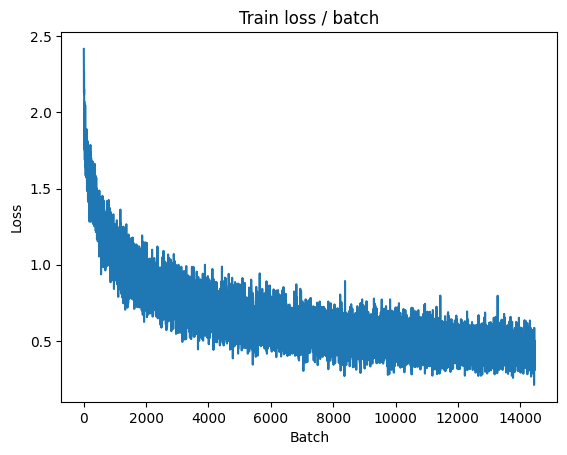

[TRAIN Batch 200/391]	Time 0.027s (0.056s)	Loss 0.3983 (0.4235)	Prec@1  88.3 ( 85.2)	Prec@5  99.2 ( 99.5)


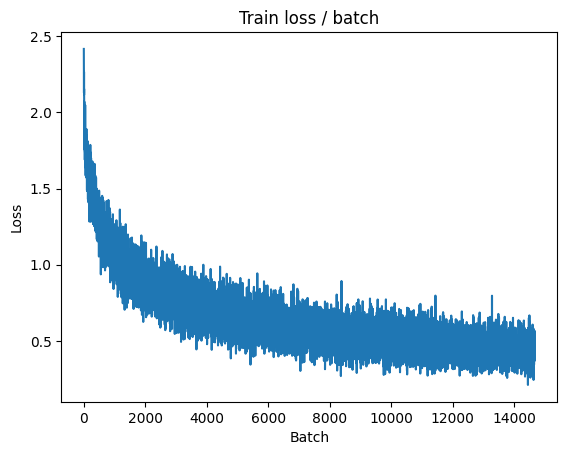


===============> Total time 21s	Avg loss 0.4293	Avg Prec@1 85.08 %	Avg Prec@5 99.42 %

[EVAL Batch 000/079]	Time 0.191s (0.191s)	Loss 0.3926 (0.3926)	Prec@1  89.8 ( 89.8)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.4996	Avg Prec@1 82.74 %	Avg Prec@5 99.18 %



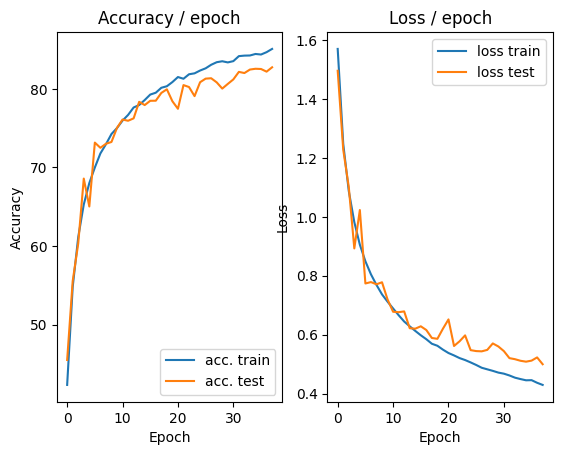

=== EPOCH 39 =====

[TRAIN Batch 000/391]	Time 0.239s (0.239s)	Loss 0.4492 (0.4492)	Prec@1  82.0 ( 82.0)	Prec@5 100.0 (100.0)


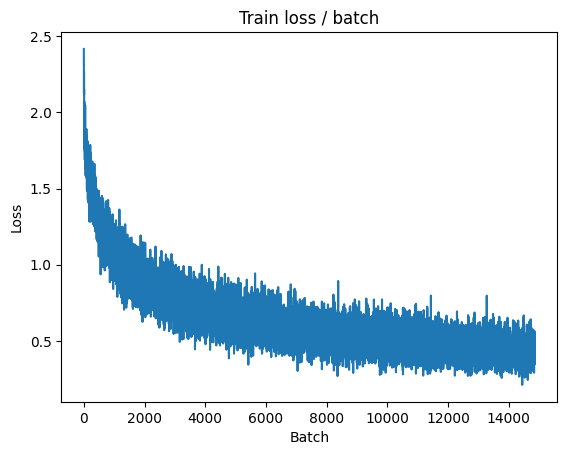

[TRAIN Batch 200/391]	Time 0.074s (0.057s)	Loss 0.4754 (0.4298)	Prec@1  83.6 ( 85.1)	Prec@5  99.2 ( 99.4)


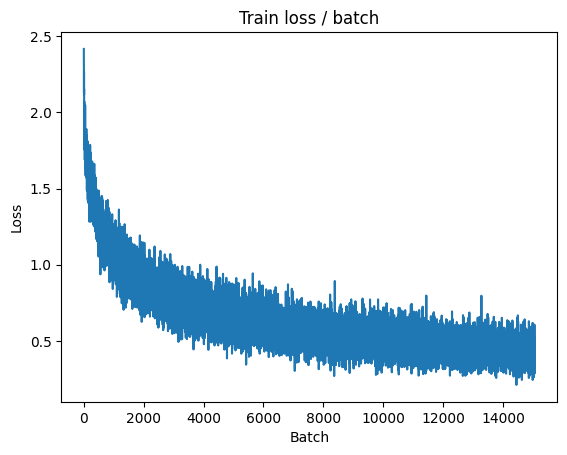


===============> Total time 21s	Avg loss 0.4299	Avg Prec@1 85.00 %	Avg Prec@5 99.41 %

[EVAL Batch 000/079]	Time 0.192s (0.192s)	Loss 0.4054 (0.4054)	Prec@1  89.8 ( 89.8)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.5250	Avg Prec@1 81.86 %	Avg Prec@5 98.98 %



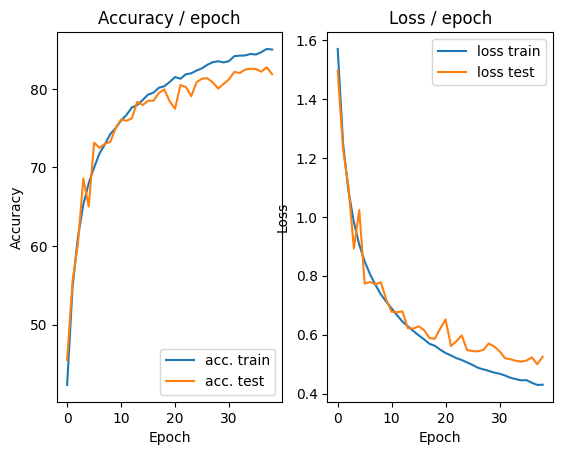

=== EPOCH 40 =====

[TRAIN Batch 000/391]	Time 0.239s (0.239s)	Loss 0.5436 (0.5436)	Prec@1  82.8 ( 82.8)	Prec@5 100.0 (100.0)


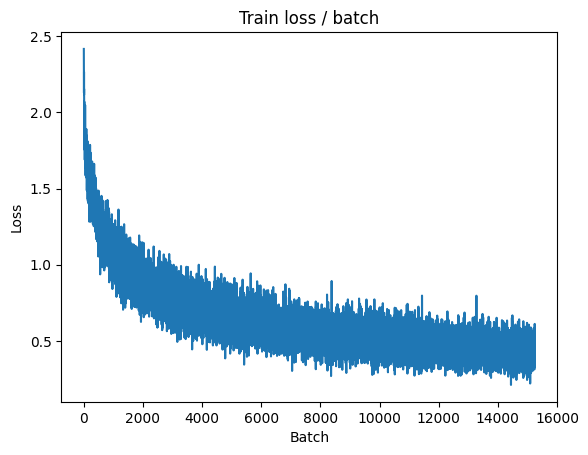

[TRAIN Batch 200/391]	Time 0.066s (0.057s)	Loss 0.4679 (0.4234)	Prec@1  82.0 ( 85.1)	Prec@5  97.7 ( 99.4)


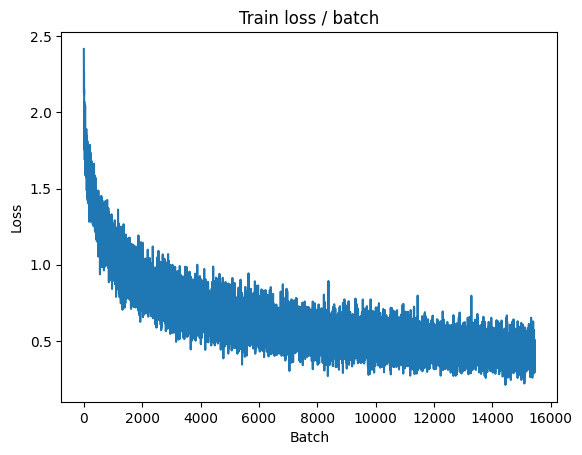


===============> Total time 21s	Avg loss 0.4273	Avg Prec@1 84.94 %	Avg Prec@5 99.45 %

[EVAL Batch 000/079]	Time 0.274s (0.274s)	Loss 0.4210 (0.4210)	Prec@1  88.3 ( 88.3)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.5073	Avg Prec@1 82.59 %	Avg Prec@5 99.09 %



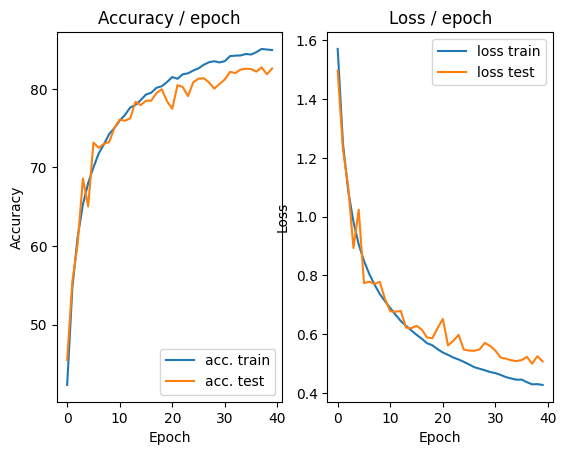

=== EPOCH 41 =====

[TRAIN Batch 000/391]	Time 0.270s (0.270s)	Loss 0.4571 (0.4571)	Prec@1  86.7 ( 86.7)	Prec@5  98.4 ( 98.4)


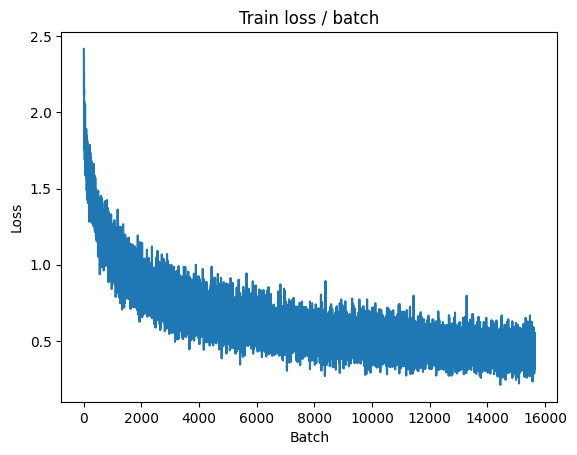

[TRAIN Batch 200/391]	Time 0.010s (0.056s)	Loss 0.4516 (0.4210)	Prec@1  84.4 ( 85.1)	Prec@5  99.2 ( 99.4)


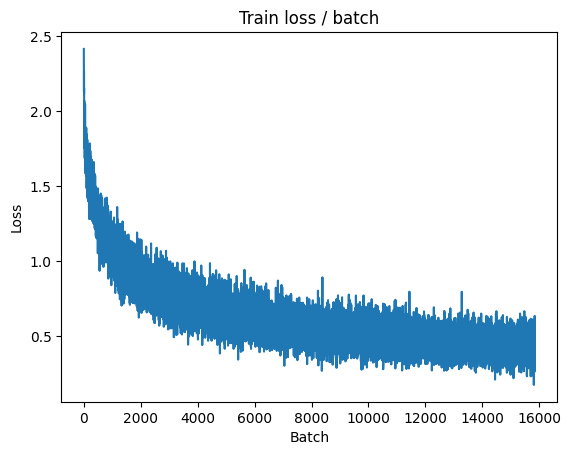


===============> Total time 20s	Avg loss 0.4237	Avg Prec@1 85.14 %	Avg Prec@5 99.45 %

[EVAL Batch 000/079]	Time 0.297s (0.297s)	Loss 0.4233 (0.4233)	Prec@1  85.9 ( 85.9)	Prec@5  98.4 ( 98.4)

===============> Total time 4s	Avg loss 0.5026	Avg Prec@1 82.78 %	Avg Prec@5 99.15 %



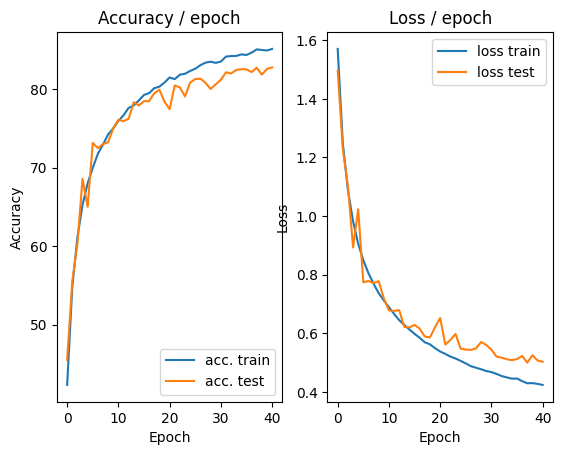

=== EPOCH 42 =====

[TRAIN Batch 000/391]	Time 0.299s (0.299s)	Loss 0.3527 (0.3527)	Prec@1  89.8 ( 89.8)	Prec@5  98.4 ( 98.4)


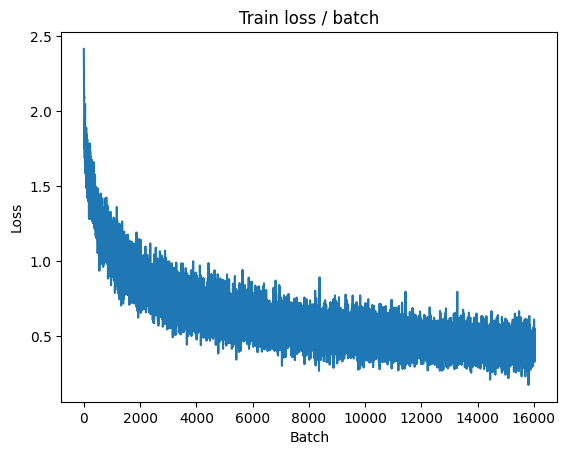

[TRAIN Batch 200/391]	Time 0.146s (0.054s)	Loss 0.3556 (0.4232)	Prec@1  88.3 ( 85.6)	Prec@5 100.0 ( 99.4)


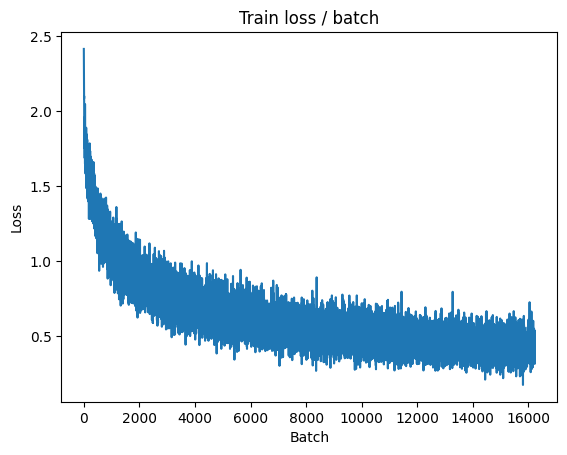


===============> Total time 20s	Avg loss 0.4235	Avg Prec@1 85.40 %	Avg Prec@5 99.42 %

[EVAL Batch 000/079]	Time 0.182s (0.182s)	Loss 0.4271 (0.4271)	Prec@1  85.9 ( 85.9)	Prec@5  98.4 ( 98.4)

===============> Total time 4s	Avg loss 0.5068	Avg Prec@1 82.39 %	Avg Prec@5 99.06 %



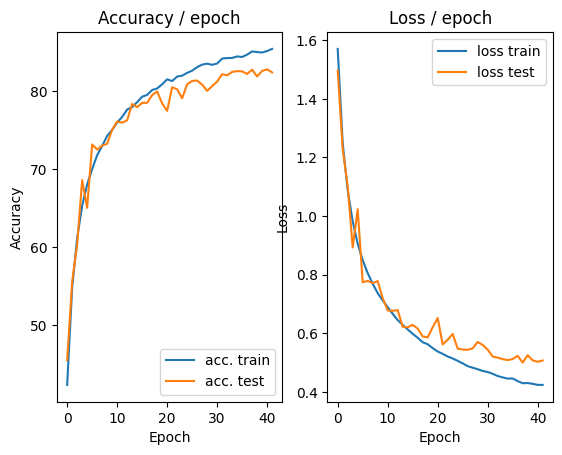

=== EPOCH 43 =====

[TRAIN Batch 000/391]	Time 0.223s (0.223s)	Loss 0.3383 (0.3383)	Prec@1  88.3 ( 88.3)	Prec@5 100.0 (100.0)


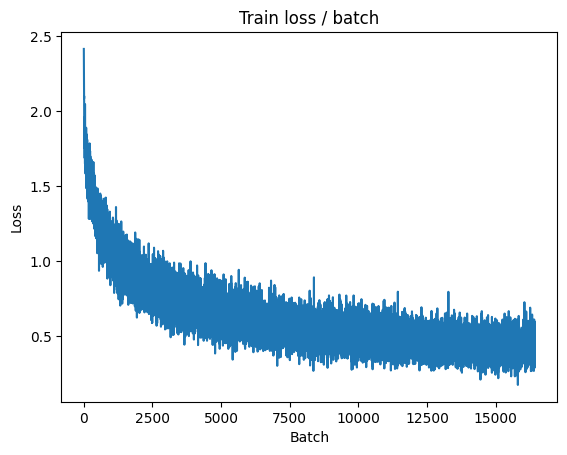

[TRAIN Batch 200/391]	Time 0.178s (0.051s)	Loss 0.4216 (0.4149)	Prec@1  83.6 ( 85.6)	Prec@5  99.2 ( 99.4)


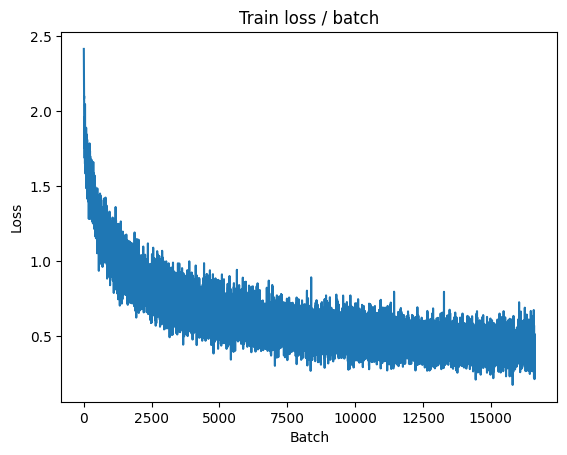


===============> Total time 20s	Avg loss 0.4199	Avg Prec@1 85.34 %	Avg Prec@5 99.41 %

[EVAL Batch 000/079]	Time 0.223s (0.223s)	Loss 0.4506 (0.4506)	Prec@1  84.4 ( 84.4)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.5201	Avg Prec@1 81.91 %	Avg Prec@5 99.17 %



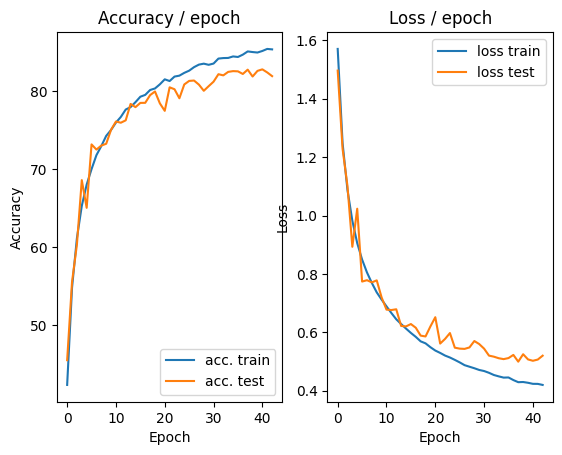

=== EPOCH 44 =====

[TRAIN Batch 000/391]	Time 0.359s (0.359s)	Loss 0.2480 (0.2480)	Prec@1  93.0 ( 93.0)	Prec@5  99.2 ( 99.2)


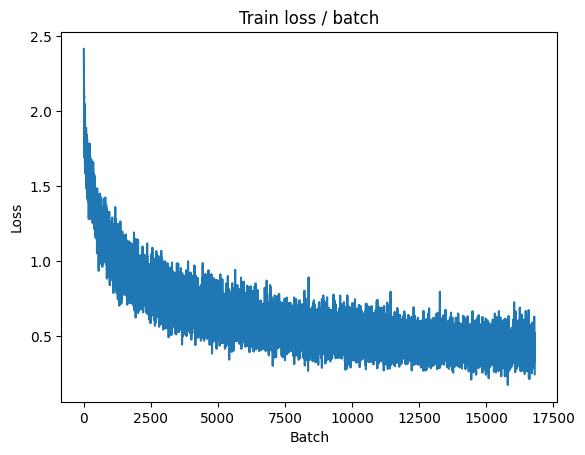

[TRAIN Batch 200/391]	Time 0.044s (0.053s)	Loss 0.4727 (0.4203)	Prec@1  85.2 ( 85.4)	Prec@5  98.4 ( 99.4)


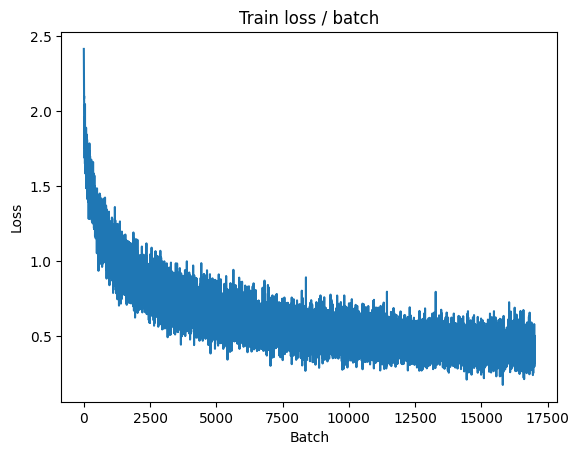


===============> Total time 21s	Avg loss 0.4159	Avg Prec@1 85.48 %	Avg Prec@5 99.49 %

[EVAL Batch 000/079]	Time 0.191s (0.191s)	Loss 0.4485 (0.4485)	Prec@1  85.9 ( 85.9)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.5007	Avg Prec@1 82.84 %	Avg Prec@5 99.24 %



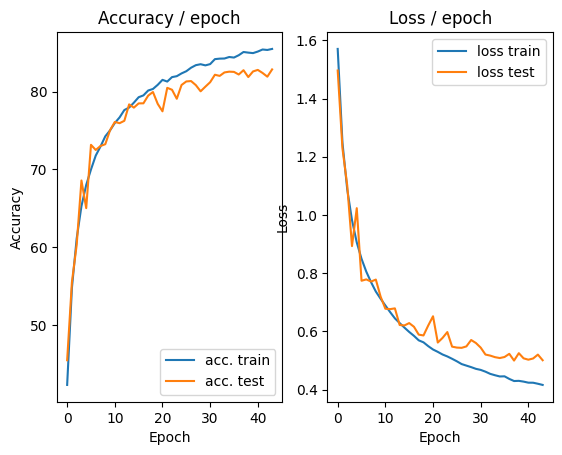

=== EPOCH 45 =====

[TRAIN Batch 000/391]	Time 0.333s (0.333s)	Loss 0.3279 (0.3279)	Prec@1  89.1 ( 89.1)	Prec@5 100.0 (100.0)


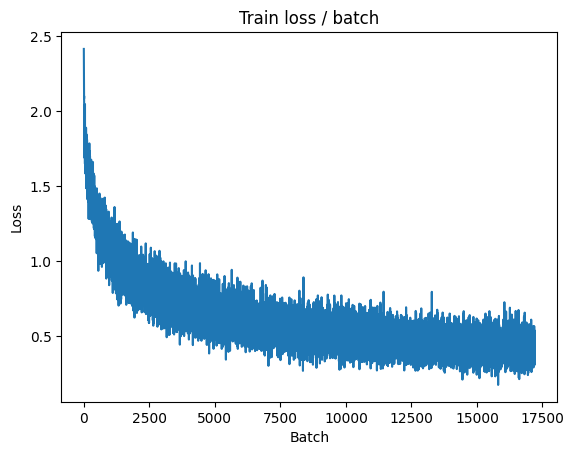

[TRAIN Batch 200/391]	Time 0.065s (0.056s)	Loss 0.4820 (0.4083)	Prec@1  84.4 ( 85.9)	Prec@5 100.0 ( 99.5)


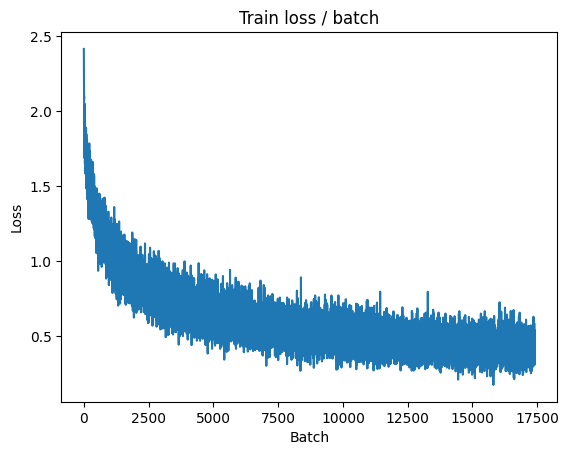


===============> Total time 21s	Avg loss 0.4083	Avg Prec@1 85.76 %	Avg Prec@5 99.46 %

[EVAL Batch 000/079]	Time 0.186s (0.186s)	Loss 0.3930 (0.3930)	Prec@1  89.1 ( 89.1)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.4977	Avg Prec@1 82.73 %	Avg Prec@5 99.05 %



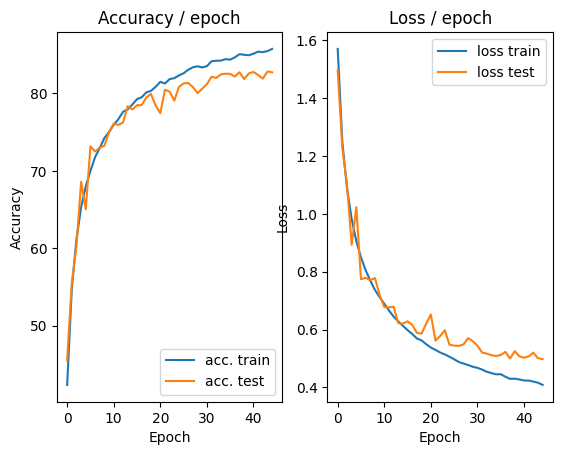

=== EPOCH 46 =====

[TRAIN Batch 000/391]	Time 0.229s (0.229s)	Loss 0.3689 (0.3689)	Prec@1  85.2 ( 85.2)	Prec@5 100.0 (100.0)


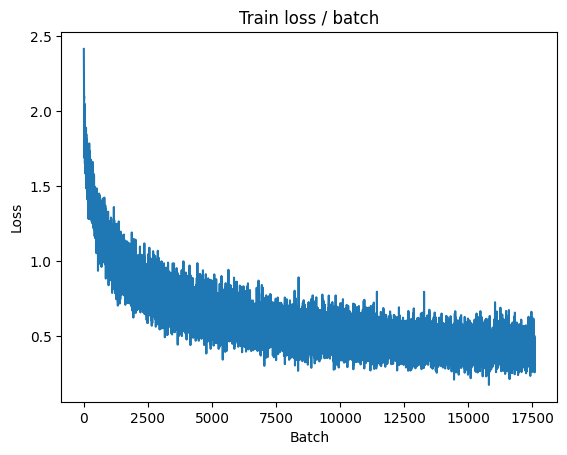

[TRAIN Batch 200/391]	Time 0.017s (0.058s)	Loss 0.3269 (0.4019)	Prec@1  88.3 ( 85.9)	Prec@5 100.0 ( 99.5)


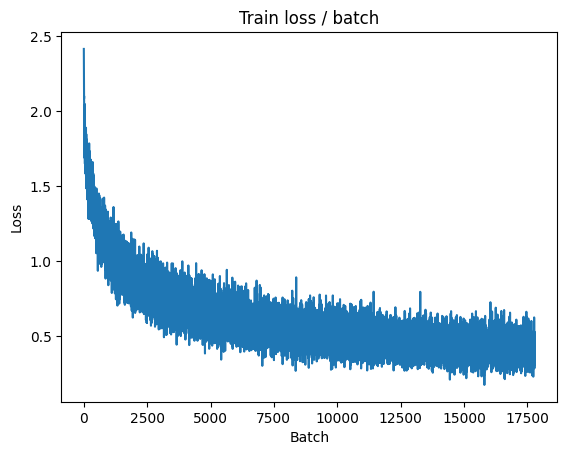


===============> Total time 22s	Avg loss 0.4041	Avg Prec@1 85.82 %	Avg Prec@5 99.53 %

[EVAL Batch 000/079]	Time 0.215s (0.215s)	Loss 0.4148 (0.4148)	Prec@1  86.7 ( 86.7)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.4953	Avg Prec@1 82.76 %	Avg Prec@5 99.11 %



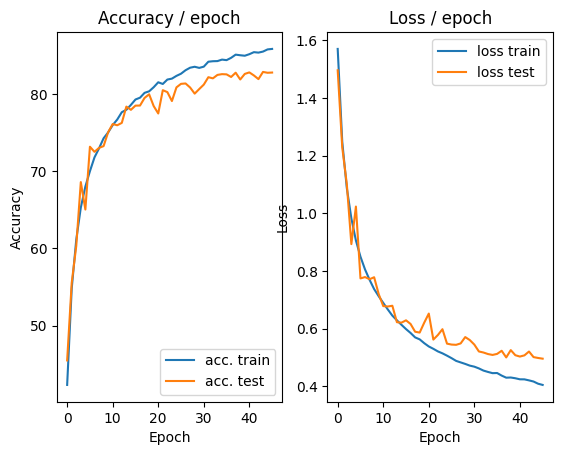

=== EPOCH 47 =====

[TRAIN Batch 000/391]	Time 0.310s (0.310s)	Loss 0.3481 (0.3481)	Prec@1  88.3 ( 88.3)	Prec@5 100.0 (100.0)


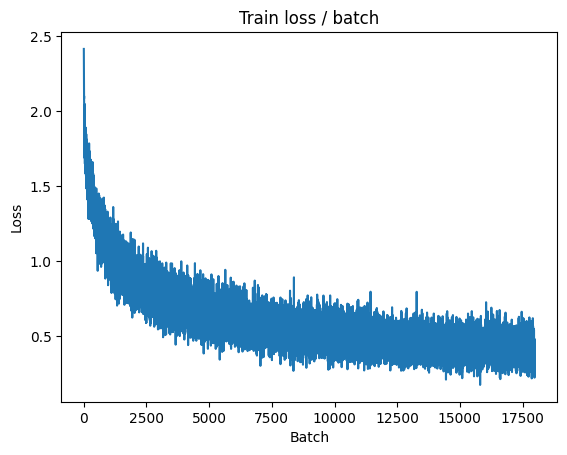

[TRAIN Batch 200/391]	Time 0.075s (0.056s)	Loss 0.4112 (0.4126)	Prec@1  85.9 ( 85.6)	Prec@5 100.0 ( 99.5)


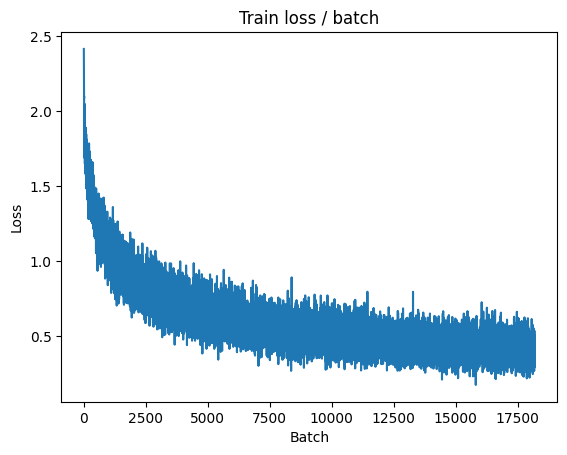


===============> Total time 21s	Avg loss 0.4063	Avg Prec@1 85.79 %	Avg Prec@5 99.51 %

[EVAL Batch 000/079]	Time 0.179s (0.179s)	Loss 0.4102 (0.4102)	Prec@1  87.5 ( 87.5)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.4927	Avg Prec@1 82.87 %	Avg Prec@5 99.22 %



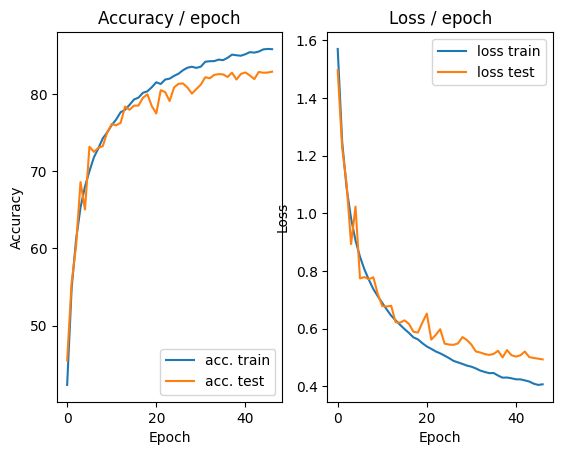

=== EPOCH 48 =====

[TRAIN Batch 000/391]	Time 0.268s (0.268s)	Loss 0.3455 (0.3455)	Prec@1  89.1 ( 89.1)	Prec@5  99.2 ( 99.2)


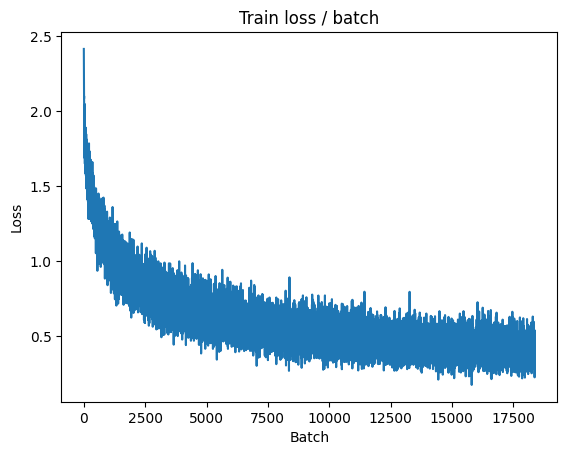

[TRAIN Batch 200/391]	Time 0.093s (0.056s)	Loss 0.3957 (0.4032)	Prec@1  87.5 ( 85.9)	Prec@5 100.0 ( 99.6)


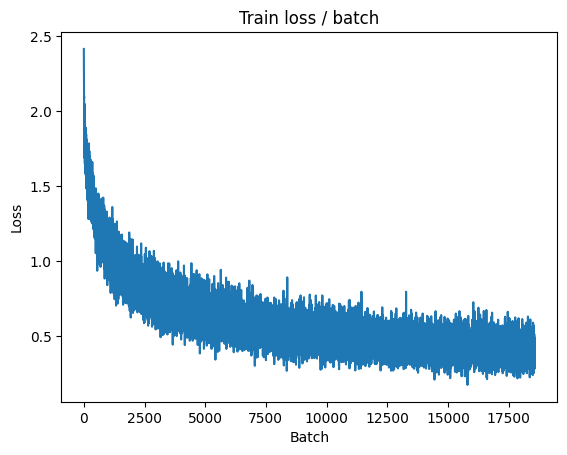


===============> Total time 21s	Avg loss 0.4013	Avg Prec@1 85.94 %	Avg Prec@5 99.53 %

[EVAL Batch 000/079]	Time 0.189s (0.189s)	Loss 0.4325 (0.4325)	Prec@1  85.2 ( 85.2)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.4928	Avg Prec@1 83.23 %	Avg Prec@5 99.11 %



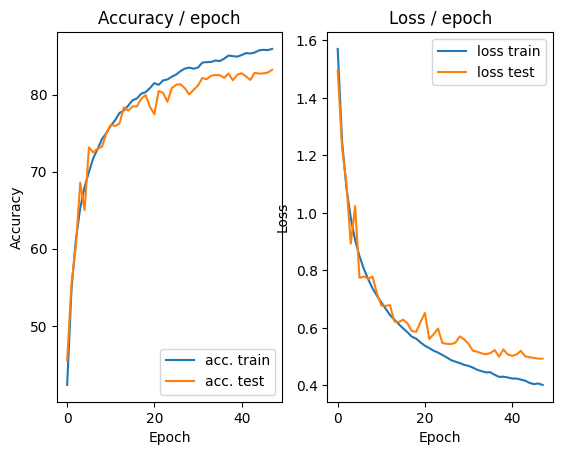

=== EPOCH 49 =====

[TRAIN Batch 000/391]	Time 0.272s (0.272s)	Loss 0.3774 (0.3774)	Prec@1  85.9 ( 85.9)	Prec@5 100.0 (100.0)


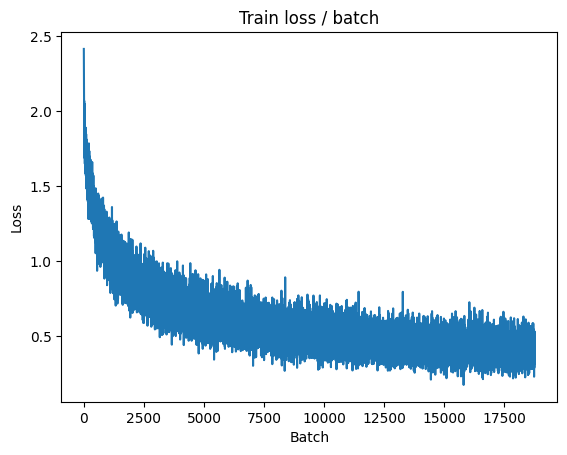

[TRAIN Batch 200/391]	Time 0.041s (0.055s)	Loss 0.4182 (0.3999)	Prec@1  86.7 ( 86.1)	Prec@5 100.0 ( 99.6)


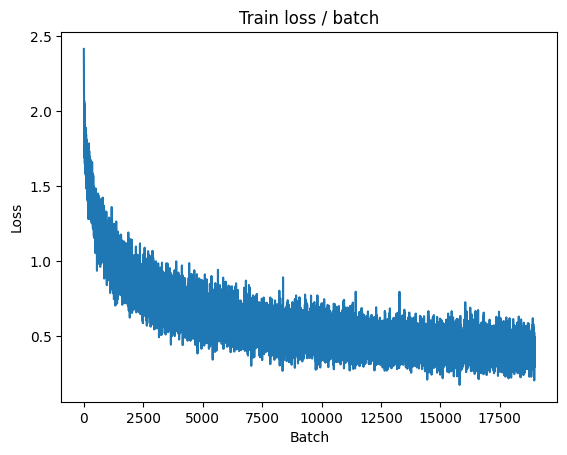


===============> Total time 21s	Avg loss 0.3981	Avg Prec@1 86.15 %	Avg Prec@5 99.58 %

[EVAL Batch 000/079]	Time 0.184s (0.184s)	Loss 0.4083 (0.4083)	Prec@1  86.7 ( 86.7)	Prec@5  98.4 ( 98.4)

===============> Total time 3s	Avg loss 0.4985	Avg Prec@1 83.02 %	Avg Prec@5 99.11 %



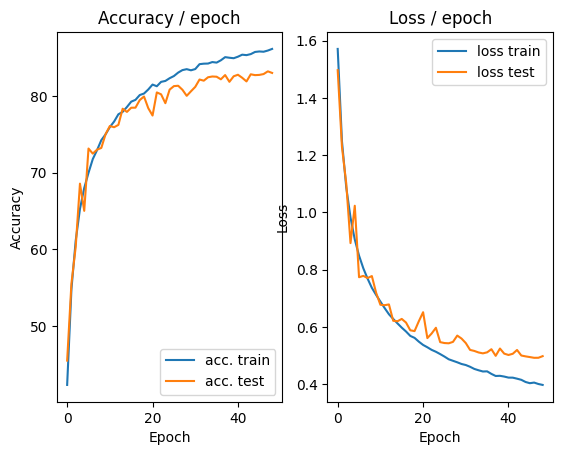

=== EPOCH 50 =====

[TRAIN Batch 000/391]	Time 0.268s (0.268s)	Loss 0.3261 (0.3261)	Prec@1  85.9 ( 85.9)	Prec@5 100.0 (100.0)


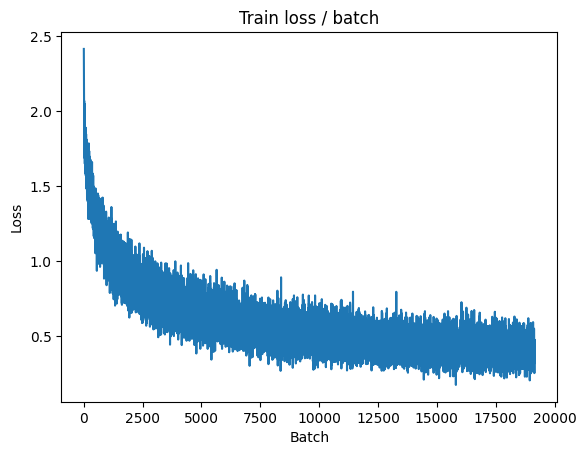

[TRAIN Batch 200/391]	Time 0.078s (0.057s)	Loss 0.4124 (0.3969)	Prec@1  82.8 ( 86.3)	Prec@5 100.0 ( 99.5)


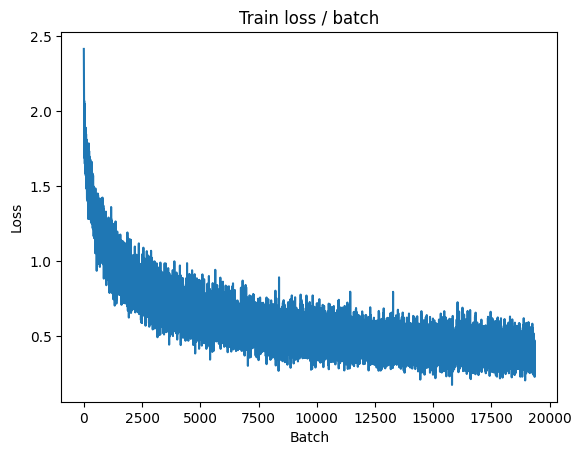


===============> Total time 21s	Avg loss 0.3990	Avg Prec@1 86.27 %	Avg Prec@5 99.47 %

[EVAL Batch 000/079]	Time 0.199s (0.199s)	Loss 0.3923 (0.3923)	Prec@1  88.3 ( 88.3)	Prec@5  99.2 ( 99.2)

===============> Total time 3s	Avg loss 0.4890	Avg Prec@1 83.08 %	Avg Prec@5 99.20 %



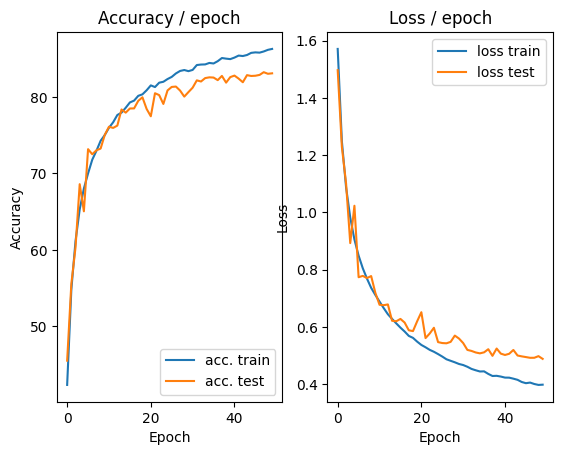

In [ ]:
main_7(128, 0.1, epochs=50, cuda=True)